[Chapter 2](#2-Time-series-graphics)<br>
[Chapter 3](#3-Time-series-decomposition)<br>
[Chapter 4](#4-Time-series-features)<br>
[Chapter 5](#5-The-forecaster's-toolbox)<br>
[Chapter 7](#7-Time-series-regression-models)<br>
[Chapter 8](#8-Exponential-smoothing)<br>
[Chapter 9](#9-ARIMA-models)<br>
[Chapter 10](#10-Dynamic-regression-models)<br>
[Chapter 11](#11-Forecasting-hierarchical-and-grouped-time-series)<br>
[Chapter 12](#12-Advanced-forecasting-methods)<br>

In [1]:
from functools import partial
from rpy2.ipython import html
html.html_rdataframe=partial(html.html_rdataframe, table_class="docutils")
import rpy2.ipython.html
rpy2.ipython.html.init_printing()

In [2]:
import rpy2.robjects as ro
from rpy2.robjects.packages import importr, data
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter
from rpy2.robjects.lib.dplyr import DataFrame
from rpy2.robjects import rl
#import rpy2.rinterface as ri
import rpy2.robjects.lib.ggplot2 as ggplot2
from rpy2.ipython.ggplot import image_png
#ri.initr() 
utils = importr('utils')
base = importr("base")
tsibble = importr("tsibble")
fabletools = importr("fabletools")
fpp3 = importr("fpp3")
tsibbledata = importr("tsibbledata")
distributional = importr("distributional")
fable = importr("fable")
feasts = importr("feasts")
rggplot2 = importr("ggplot2")
dplyr = importr("dplyr")
tidyr = importr("tidyr")

/home2/wong/PycharmProjects/my_notebook_venv/.venv/lib/python3.9/site-packages/rpy2/robjects/lib/dplyr.py:27: UserWarning: This was designed against dplyr versions starting with 1.0 but you have 1.1.4
  warnings.warn(
/home2/wong/PycharmProjects/my_notebook_venv/.venv/lib/python3.9/site-packages/rpy2/robjects/lib/ggplot2.py:70: UserWarning: This was designed against ggplot2 versions starting with 3.3. but you have 3.5.1
  warnings.warn(


In [3]:
from contextlib import contextmanager
from rpy2.robjects.lib import grdevices
from IPython.display import Image, display

@contextmanager
def r_inline_plot(width=600, height=600, dpi=100):

    with grdevices.render_to_bytesio(grdevices.png, 
                                     width=width,
                                     height=height, 
                                     res=dpi) as b:

        yield

    data = b.getvalue()
    display(Image(data=data, format='png', embed=True))

# 2 Time series graphics
## 2.1 tsibble objects

In [4]:
y = tsibble.tsibble(Year = ro.r.seq(2015, 2019), Obseration = ro.IntVector([123, 39, 78, 52, 110]), index = "Year")
with localconverter(ro.default_converter + pandas2ri.converter):
  y_pdf = ro.conversion.rpy2py(y)
y_pdf

,Year,Obseration
1,2015,123
2,2016,39
3,2017,78
4,2018,52
5,2019,110


In [5]:
#olympic_r_df = base.as_data_frame(ro.r("tsibbledata::olympic_running"))
olympic_running = tsibble.as_tsibble(ro.r("tsibbledata::olympic_running"), index = "Year")
#with localconverter(ro.default_converter + pandas2ri.converter):
#  olympic_r_pdf = ro.conversion.rpy2py(olympic_r_df)
#olympic_r_pdf
print(olympic_running)

R[write to console]: In addition: 
R[write to console]: There were 20 warnings (use warnings() to see them)
R[write to console]: 



# A tsibble: 312 x 4 [4Y]
# Key:       Length, Sex [14]
    Year Length Sex    Time
   <int>  <int> <chr> <dbl>
 1  1896    100 men    12  
 2  1900    100 men    11  
 3  1904    100 men    11  
 4  1908    100 men    10.8
 5  1912    100 men    10.8
 6  1916    100 men    NA  
 7  1920    100 men    10.8
 8  1924    100 men    10.6
 9  1928    100 men    10.8
10  1932    100 men    10.3
# ℹ 302 more rows
# ℹ Use `print(n = ...)` to see more rows



In [6]:
dplyr = importr("dplyr")
print(dplyr.distinct_at(olympic_running, 'Sex'))

# A tibble: 2 × 1
  Sex  
  <chr>
1 men  
2 women



In [7]:
PBS = tsibble.as_tsibble(ro.r("tsibbledata::PBS"), index = "Month")
a10 = (
    DataFrame(PBS)
    .filter(rl('ATC2=="A10"'))
    .select("Month", "Concession", "Type", "Cost")
    .summarize(TotalC=rl('sum(Cost)'))
    .mutate(Cost=rl('TotalC/1e6'))
)
#pbs_a10_df = tsibble.as_tsibble(pbs_a10_df, index = "Month")
#with localconverter(ro.default_converter + pandas2ri.converter):
#  pbs_pdf = ro.conversion.rpy2py(pbs_a10_df)
#pbs_pdf
#print(a10)

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



In [8]:
print(base.colnames(a10))  # Find the column names of dataframe

[1] "Month"  "TotalC" "Cost"  



In [9]:
tsibble = importr("tsibble")
prison = ro.r['read.csv']("https://OTexts.com/fpp3/extrafiles/prison_population.csv")
prison_df = (
    DataFrame(prison)
    .mutate(Quarter=rl('yearquarter(Date)'))
    .select(rl('-Date'))
)
prison_df = tsibble.as_tsibble(prison_df, key = ro.StrVector(["State", "Gender", "Legal", "Indigenous"]), index = "Quarter")
with localconverter(ro.default_converter + pandas2ri.converter):
  prison_pdf = ro.conversion.rpy2py(prison_df)
prison_pdf

,State,Gender,Legal,Indigenous,Count,Quarter
1,ACT,Female,Remanded,ATSI,0,12784.0
2,ACT,Female,Remanded,ATSI,1,12874.0
3,ACT,Female,Remanded,ATSI,0,12965.0
4,ACT,Female,Remanded,ATSI,0,13057.0
5,ACT,Female,Remanded,ATSI,1,13149.0
...,...,...,...,...,...,...
3068,WA,Male,Sentenced,Non-ATSI,2503,16709.0
3069,WA,Male,Sentenced,Non-ATSI,2488,16801.0
3070,WA,Male,Sentenced,Non-ATSI,2539,16892.0
3071,WA,Male,Sentenced,Non-ATSI,2608,16983.0


## 2.2 Time plots

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



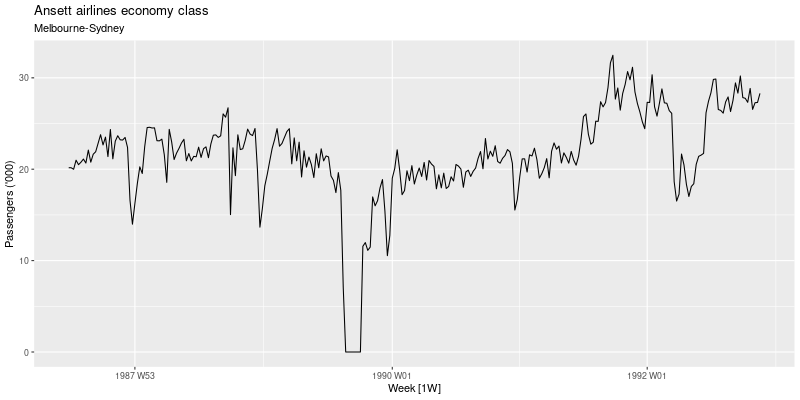

In [10]:
ansett = tsibble.as_tsibble(ro.r("tsibbledata::ansett"), index = "Week")
melsyd_economy = (
    DataFrame(ansett)
    .filter(rl('Airports == "MEL-SYD"'), rl('Class == "Economy"')) 
    .mutate(Passengers = rl('Passengers/1000'))
)
with ro.local_context() as lc:
    lc['melsyd_economy'] = melsyd_economy
    rcode = ('''
        ggplot2::autoplot(melsyd_economy, Passengers) +
             labs(title = "Ansett airlines economy class",
                  subtitle = "Melbourne-Sydney",
                  y = "Passengers ('000)")
        ''')
    display(image_png(ro.r(rcode)))

In [11]:
glue = importr('glue')
#utils.install_packages('glue')
#utils.install_packages('fpp3', dependencies=True, repos='https://cran.case.edu') 
#utils.install_packages('GGally')
#utils.install_packages('latex2exp')
#utils.install_packages('seasonal', dependencies=True, repos='https://cran.case.edu')
#utils.install_packages('report', dependencies=True, repos='https://cran.case.edu') 

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: `aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 



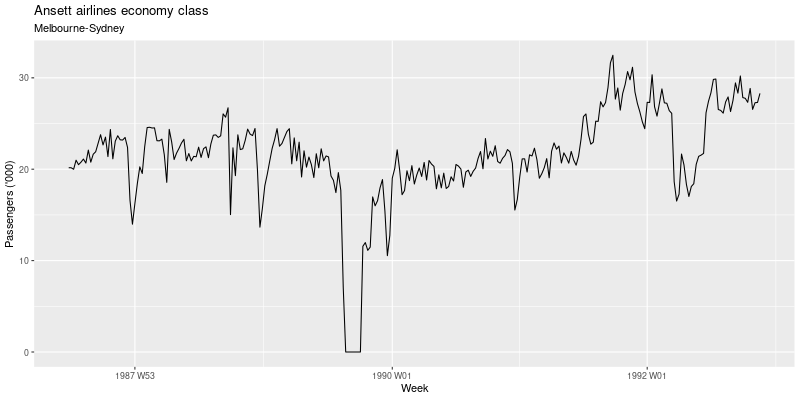

In [12]:
import rpy2.robjects.lib.ggplot2 as ggplot2
#from rpy2.robjects.packages import data
from rpy2.ipython.ggplot import image_png
#pp = ggplot2.ggplot.autolayer(melsyd_economy)
pp = (ggplot2.ggplot(melsyd_economy) +
      ggplot2.aes_string(x='Week', y='Passengers') +
      ggplot2.geom_line() +
      ggplot2.labs(y = "Passengers ('000)",
                   subtitle = "Melbourne-Sydney",
                   title = "Ansett airlines economy class"))
#pp.plot()
display(image_png(pp))


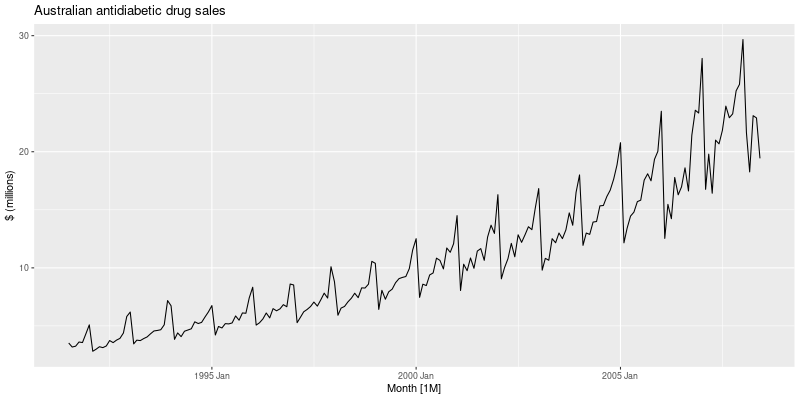

In [13]:
with ro.local_context() as lc:
    lc['a10'] = a10
    rcode = ('''
        ggplot2::autoplot(a10, Cost) +
             labs(y = "$ (millions)",
                  title = "Australian antidiabetic drug sales")
        ''')
    display(image_png(ro.r(rcode)))

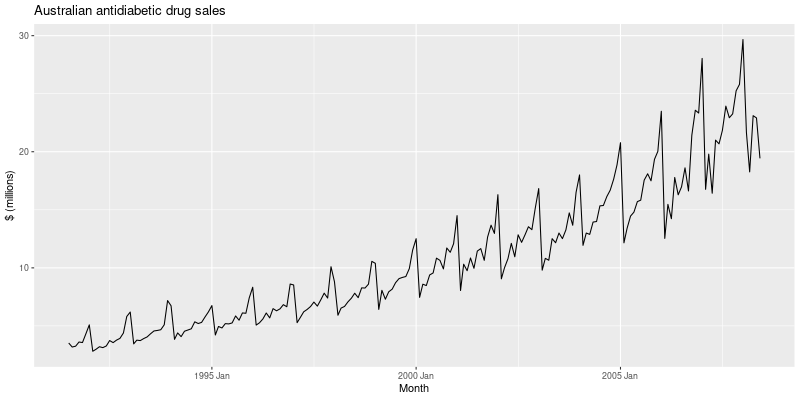

In [14]:
pp_a10 = (ggplot2.ggplot(a10) +
          ggplot2.aes_string(x='Month', y='Cost') +
          ggplot2.geom_line() +
          ggplot2.labs(y = "$ (millions)",
                       title = "Australian antidiabetic drug sales"))

display(image_png(pp_a10))

## 2.4 Seasonal plots

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



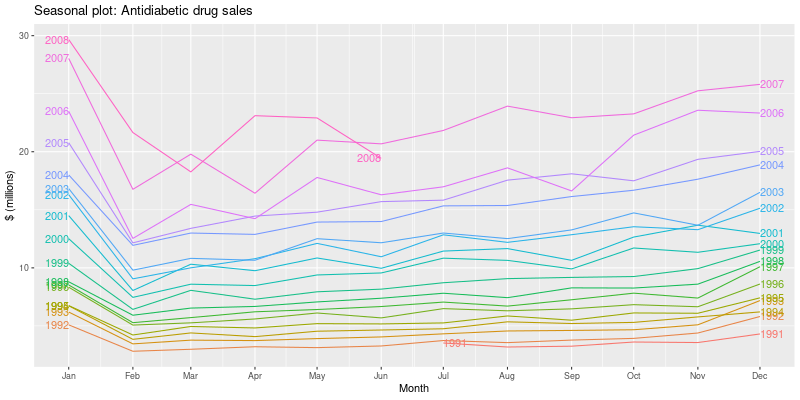

In [15]:
feasts = importr('feasts')
#kwargs = {'labs': 'y = "$ (millions)", title = "Seasonal plot: Antidiabetic drug sales"'}
#pp_a10 = (
#    feasts.gg_season(a10, y=rl('Cost') ,labels="both", **kwargs) 
#)
with ro.local_context() as lc:
    lc['a10'] = a10
    rcode = ('''
        feasts::gg_season(a10, Cost, labels = "both") +
             labs(y = "$ (millions)",
                  title = "Seasonal plot: Antidiabetic drug sales")
        ''')
    display(image_png(ro.r(rcode)))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



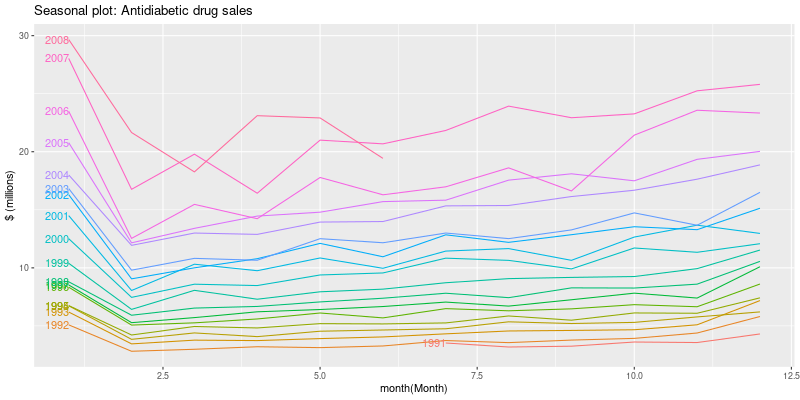

In [16]:
import rpy2.robjects.lib.ggplot2 as ggplot2
lubridate = importr('lubridate')
a10_month = (
    DataFrame(a10)
    .group_by(rl('year(Month)'))
    .filter(rl('month(Month)==min(month(Month))'))
)
gg_a10 = (ggplot2.ggplot(a10) +
          ggplot2.aes_string(x = 'month(Month)', y = 'Cost', colour = 'factor(year(Month))') + 
          ggplot2.geom_line() +
          ggplot2.geom_text(
              ggplot2.aes_string(label = 'year(Month)'), 
              data=a10_month,
              hjust = 1 
            ) +
          ggplot2.guides(colour = "none") +
          ggplot2.labs(y = "$ (millions)",
                  title = "Seasonal plot: Antidiabetic drug sales")
)
display(image_png(gg_a10))
#print(a10_month)

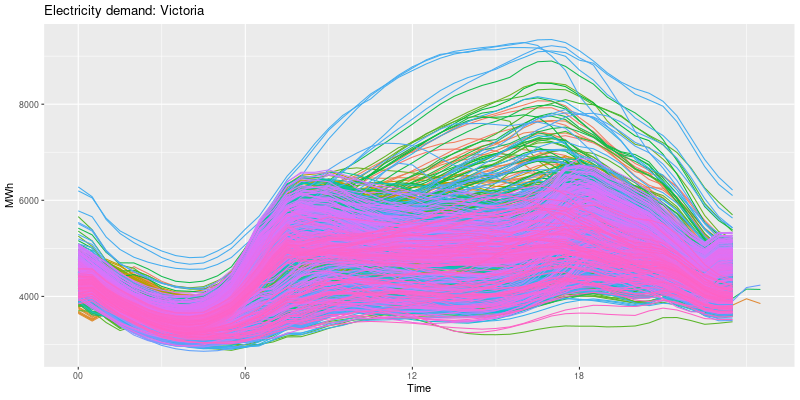

In [17]:
vic_elec = data(tsibbledata).fetch('vic_elec')['vic_elec'] #tsibble.as_tsibble(ro.r("tsibbledata::vic_elec"), index = "Time")
#gg_vic_elec = (
#    feasts.gg_season(vic_elec, rl('Demand'), period = "day")
#)
#display(image_png(gg_vic_elec))
with ro.local_context() as lc:
    lc['vic_elec'] = vic_elec
    rcode = ('''
        feasts::gg_season(vic_elec, Demand, period = "day") +
            theme(legend.position = "none") +
            labs(y="MWh", title="Electricity demand: Victoria")
        ''')
    display(image_png(ro.r(rcode)))

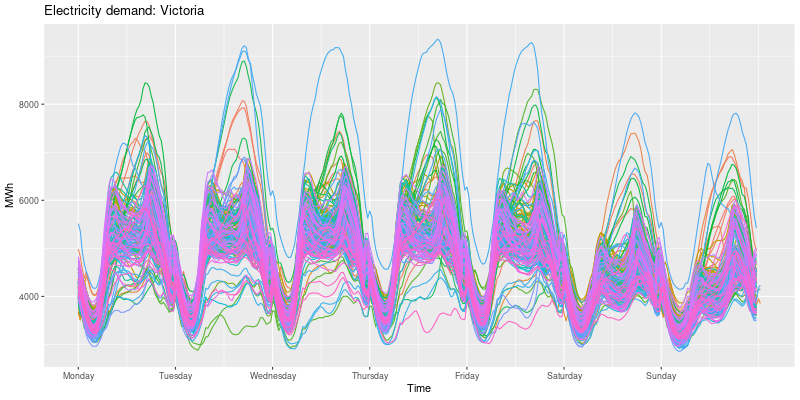

In [18]:
#gg_vic_elec2 = (
#    feasts.gg_season(vic_elec, rl('Demand'), period = "week")
#)
#display(image_png(gg_vic_elec2))
with ro.local_context() as lc:
    lc['vic_elec'] = vic_elec
    rcode = ('''
        feasts::gg_season(vic_elec, Demand, period = "week") +
            theme(legend.position = "none") +
            labs(y="MWh", title="Electricity demand: Victoria")
        ''')
    display(image_png(ro.r(rcode)))

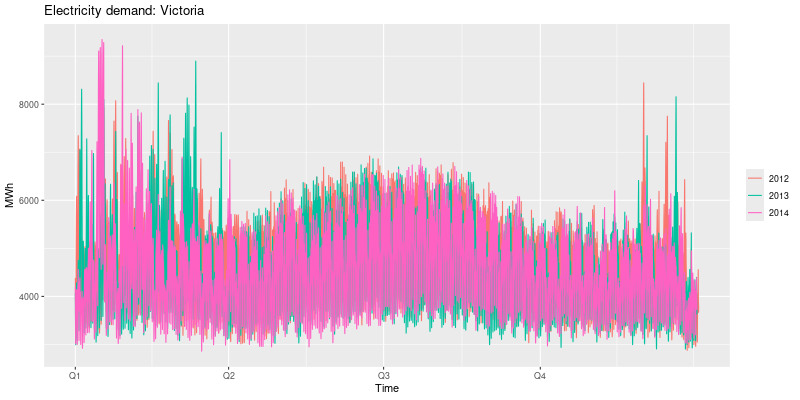

In [19]:
#gg_vic_elec3 = (
#    feasts.gg_season(vic_elec, rl('Demand'), period = "year")
#)
#display(image_png(gg_vic_elec3))
with ro.local_context() as lc:
    lc['vic_elec'] = vic_elec
    rcode = ('''
        feasts::gg_season(vic_elec, Demand, period = "year") +
            labs(y="MWh", title="Electricity demand: Victoria")
        ''')
    display(image_png(ro.r(rcode)))

## 2.5 Seasonal subseries plots

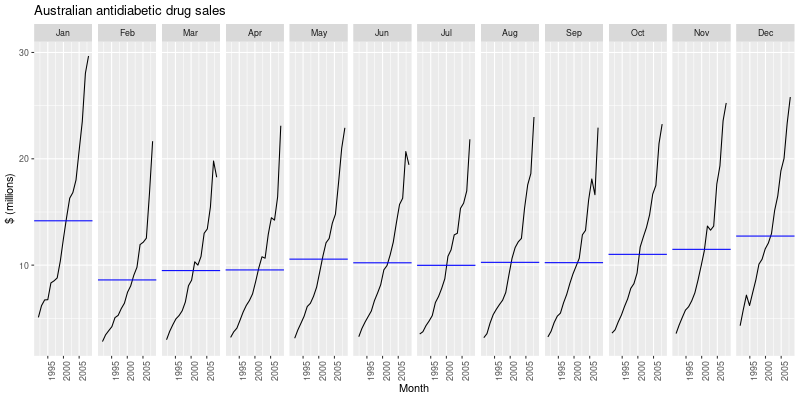

In [20]:
#gg_a10 = (
#  feasts.gg_subseries(a10, rl('Cost')) 
#  )
#display(image_png(gg_a10))
with ro.local_context() as lc:
    lc['a10'] = a10
    rcode = ('''
        feasts::gg_subseries(a10, Cost) +
            labs(
                y = "$ (millions)",
                title = "Australian antidiabetic drug sales"
                )
        ''')
    display(image_png(ro.r(rcode)))

In [21]:
tourism = data(tsibble).fetch('tourism')['tourism'] #tsibble.as_tsibble(ro.r("tsibble::tourism"), index = "Quarter")
holidays = (
    DataFrame(tourism)
      .filter(rl('Purpose == "Holiday"')) 
      .group_by(rl('State'))
      .summarise(Trips = rl('sum(Trips)'))
)
print(holidays)

# A tsibble: 640 x 3 [1Q]
# Key:       State [8]
   State Quarter Trips
   <chr>   <qtr> <dbl>
 1 ACT   1998 Q1  196.
 2 ACT   1998 Q2  127.
 3 ACT   1998 Q3  111.
 4 ACT   1998 Q4  170.
 5 ACT   1999 Q1  108.
 6 ACT   1999 Q2  125.
 7 ACT   1999 Q3  178.
 8 ACT   1999 Q4  218.
 9 ACT   2000 Q1  158.
10 ACT   2000 Q2  155.
# ℹ 630 more rows
# ℹ Use `print(n = ...)` to see more rows



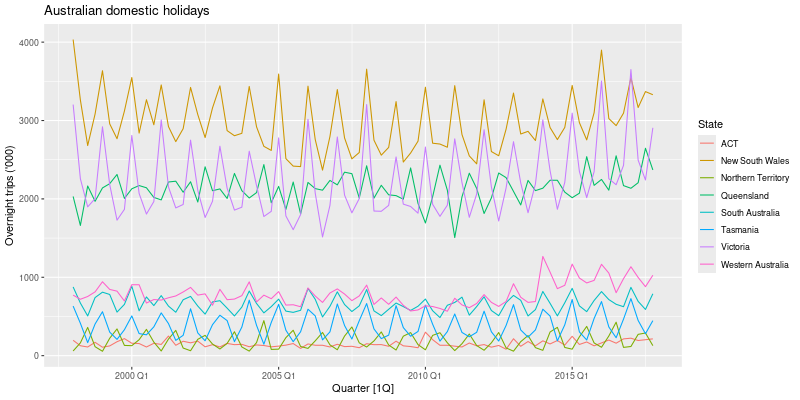

In [22]:
#pp = (ggplot2.ggplot(holidays) +
#      ggplot2.aes_string(x = 'Quarter', y='Trips', color='State') +
#      ggplot2.geom_line() +
#      ggplot2.labs(y = "Overnight trips ('000)",
#       title = "Australian domestic holidays"))
#display(image_png(pp))
with ro.local_context() as lc:
    lc['holidays'] = holidays
    rcode = ('''
        ggplot2::autoplot(holidays, Trips) +
            labs(y = "Overnight trips ('000)",
                 title = "Australian domestic holidays")
        ''')
    display(image_png(ro.r(rcode)))

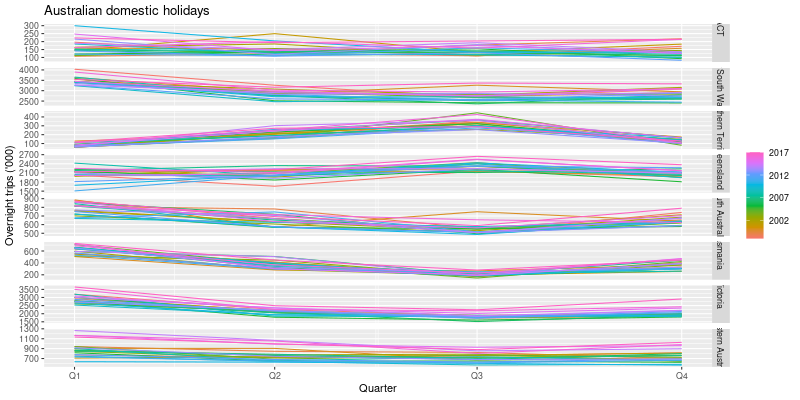

In [23]:
#gg_season_holidays = (
#    feasts.gg_season(holidays, rl('Trips'))
#)
#display(image_png(gg_season_holidays))
with ro.local_context() as lc:
    lc['holidays'] = holidays
    rcode = ('''
        feasts::gg_season(holidays, Trips) +
            labs(y = "Overnight trips ('000)",
                 title = "Australian domestic holidays")
        ''')
    display(image_png(ro.r(rcode)))

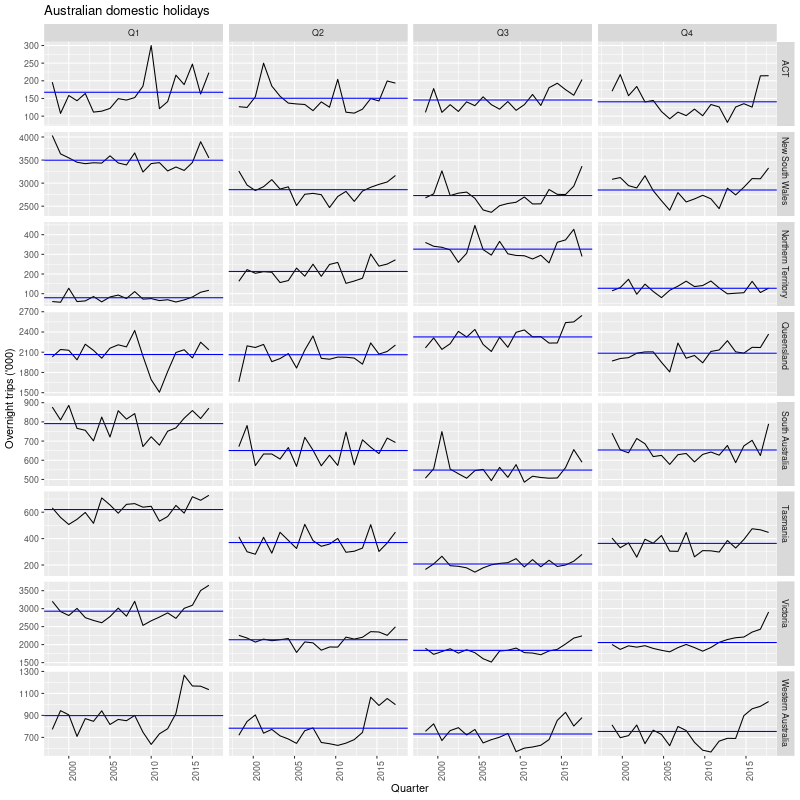

In [24]:
#gg_holiday2 = (
#  feasts.gg_subseries(holidays, rl('Trips')) 
#  )
#display(image_png(gg_holiday2))
with ro.local_context() as lc:
    lc['holidays'] = holidays
    rcode = ('''
        feasts::gg_subseries(holidays, Trips) +
            labs(y = "Overnight trips ('000)",
                 title = "Australian domestic holidays")
        ''')
    display(image_png(ro.r(rcode), height=800))

## 2.6 Scatterplots

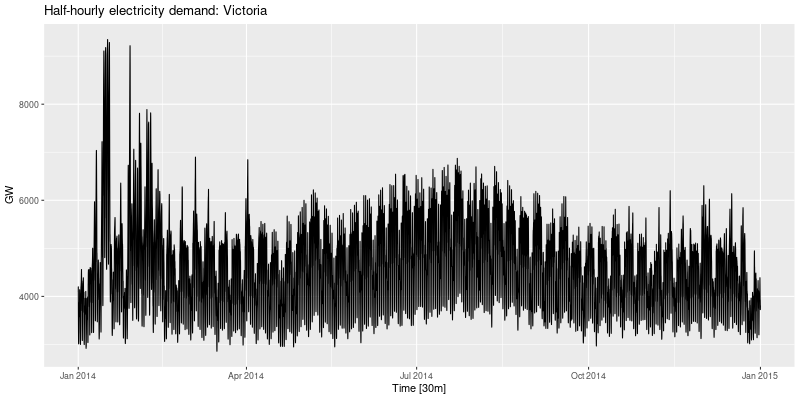

In [25]:
vic_elec_2014 = (
    DataFrame(data(tsibbledata).fetch("vic_elec")["vic_elec"])
    .filter(rl('year(Time) == 2014')))
#vv = (ggplot2.ggplot(vic_elec_2014) +
#      ggplot2.aes_string(x = 'Time', y='Demand') + #, color='State') +
#      ggplot2.geom_line() +
#      ggplot2.labs(y = "GW",
#       title = "Half-hourly electricity demand: Victoria"))    
#display(image_png(vv))
with ro.local_context() as lc:
    lc['vic_elec'] = vic_elec_2014
    rcode = ('''
        ggplot2::autoplot(vic_elec, Demand) +
            labs(y = "GW",
                 title = "Half-hourly electricity demand: Victoria")
        ''')
    display(image_png(ro.r(rcode)))

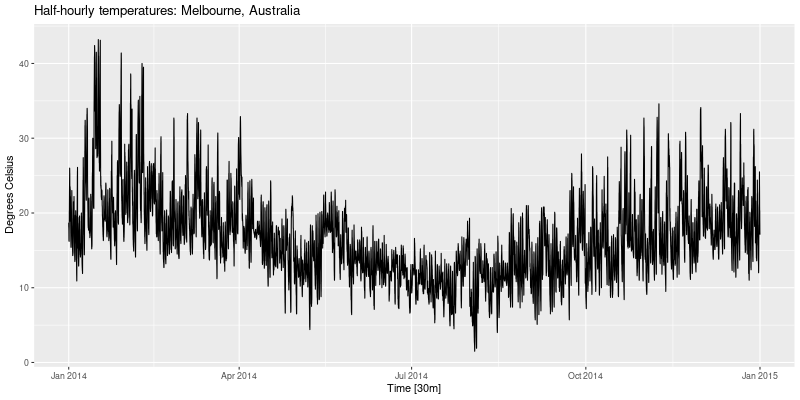

In [26]:
#vv2 = (ggplot2.ggplot(vic_elec_2014) +
#       ggplot2.aes_string(x = 'Time', y='Temperature') + #, color='State') +
#       ggplot2.geom_line() +
#       ggplot2.labs(
#          y = "Degrees Celsius",
#          title = "Half-hourly temperatures: Melbourne, Australia")
#      )    
#display(image_png(vv2))
with ro.local_context() as lc:
    lc['vic_elec'] = vic_elec_2014
    rcode = ('''
        ggplot2::autoplot(vic_elec, Temperature) +
            labs(y = "Degrees Celsius",
                 title = "Half-hourly temperatures: Melbourne, Australia")
        ''')
    display(image_png(ro.r(rcode)))

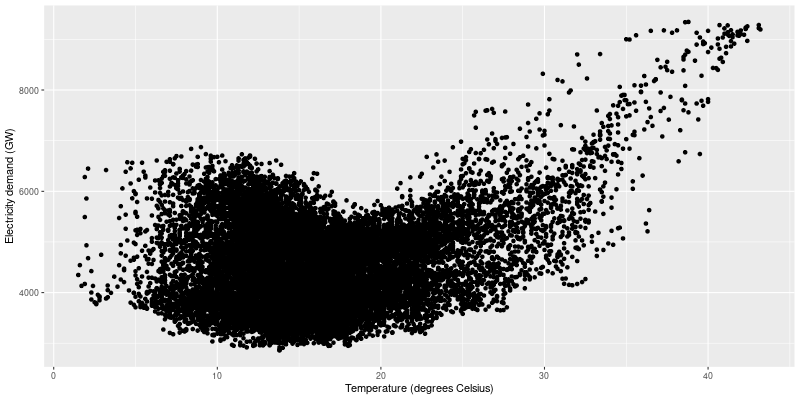

In [27]:
vv3 = (ggplot2.ggplot(vic_elec_2014) +
       ggplot2.aes_string(y = 'Demand', x='Temperature') + 
       ggplot2.geom_point() +
       ggplot2.labs(
          x = "Temperature (degrees Celsius)",
          y = "Electricity demand (GW)")
      )    
display(image_png(vv3))

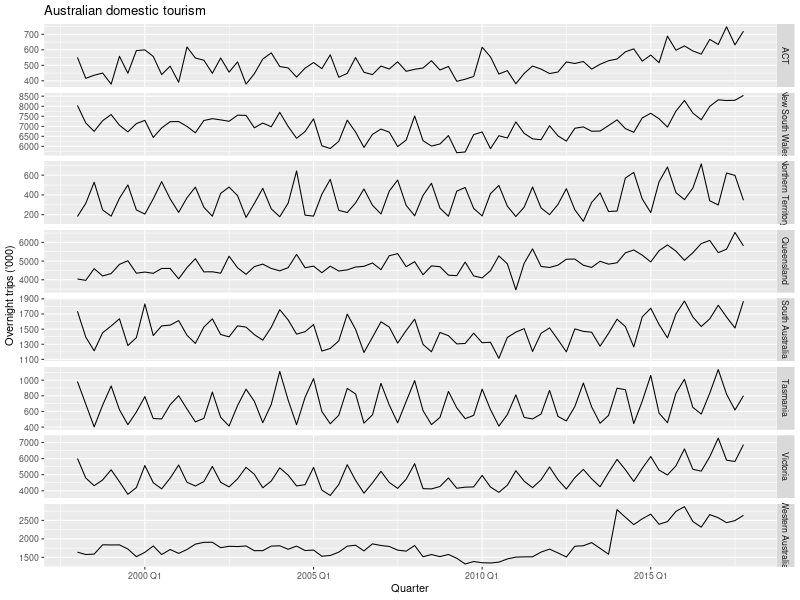

In [28]:
visitors = (
    DataFrame(tourism)
      .group_by(rl('State')) 
      .summarise(Trips = rl('sum(Trips)'))
)
vvs = (ggplot2.ggplot(visitors) +
       ggplot2.aes_string(x = 'Quarter', y = 'Trips') + 
       ggplot2.geom_line() +
       ggplot2.facet_grid(rl('vars(State)'), scales = "free_y") +
       ggplot2.labs(
          title = "Australian domestic tourism",
          y= "Overnight trips ('000)")
      )    
display(image_png(vvs, height=600))

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



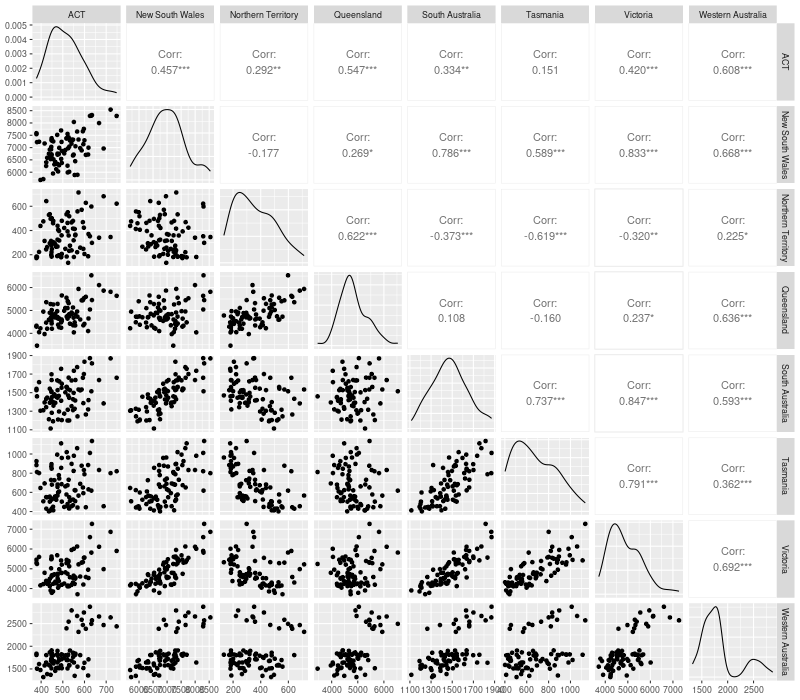

In [29]:
tidyr = importr('tidyr')
ggally = importr('GGally')
visitors_wider = tidyr.pivot_wider(visitors, values_from='Trips', names_from='State')
#print(visitors_wider)
gg_pair = ggally.ggpairs(visitors_wider, columns = ro.r.seq(2, 9))

display(image_png(gg_pair, height=700))
#visitors |>
#  pivot_wider(values_from=Trips, names_from=State) |>
#  GGally::ggpairs(columns = 2:9)

## 2.7 Lag plots

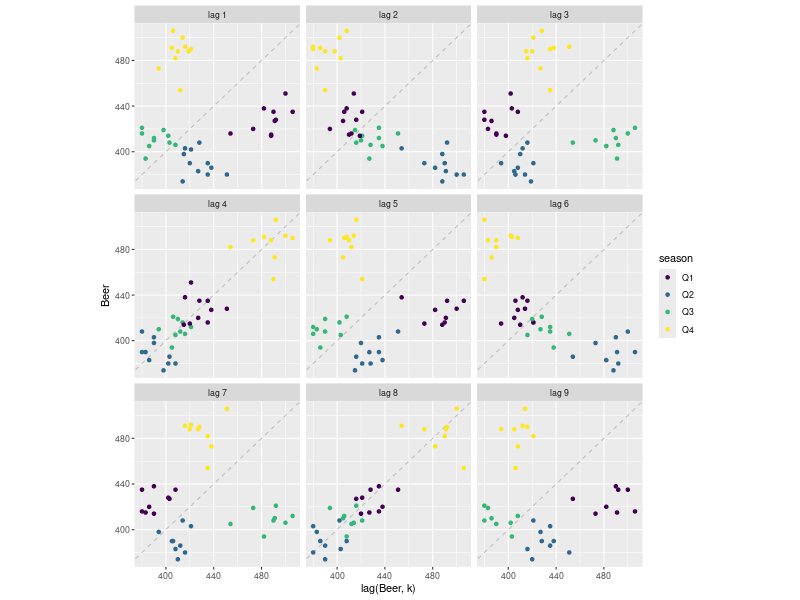

In [30]:
recent_production = (
    DataFrame(data(tsibbledata).fetch("aus_production")["aus_production"])
    .filter(rl('year(Quarter) >= 2000')))
#print(recent_production)
#gg_lag = (
#    feasts.gg_lag(recent_production, rl('Beer'), geom = "point")
#)
#display(image_png(gg_lag))
with ro.local_context() as lc:
    lc['recent_production'] = recent_production
    rcode = ('''
        feasts::gg_lag(recent_production, Beer, geom = "point") +
            labs(x = "lag(Beer, k)")
        ''')
    display(image_png(ro.r(rcode), height=600))

## 2.8 Autocorrelation

In [31]:
beer_acf = feasts.ACF(recent_production,
                      rl('Beer'),
                      lag_max = 9)
print(beer_acf)

# A tsibble: 9 x 2 [1Q]
       lag      acf
  <cf_lag>    <dbl>
1       1Q -0.0530 
2       2Q -0.758  
3       3Q -0.0262 
4       4Q  0.802  
5       5Q -0.0775 
6       6Q -0.657  
7       7Q  0.00119
8       8Q  0.707  
9       9Q -0.0888 



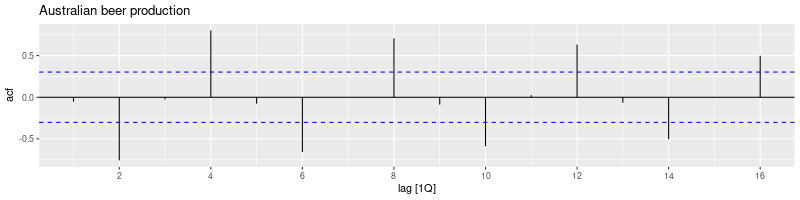

In [32]:
beer_acf = feasts.ACF(recent_production,
                      rl('Beer'))
#bf = feasts.autoplot_tbl_cf(beer_acf)
#display(image_png(bf))
with ro.local_context() as lc:
    lc['beer_acf'] = beer_acf
    rcode = ('''
        feasts::autoplot(beer_acf) +
            labs(title = "Australian beer production")
        ''')
    display(image_png(ro.r(rcode), height=200))

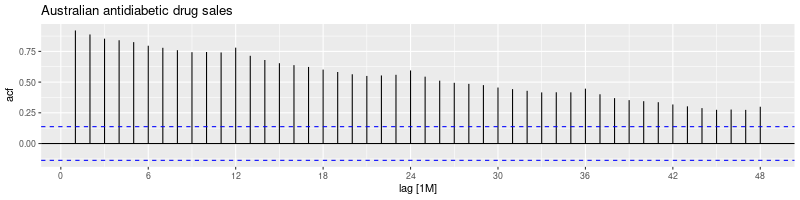

In [33]:
a10_acf = feasts.ACF(a10, rl('Cost'), lag_max=48)
with ro.local_context() as lc:
    lc['a10_acf'] = a10_acf
    rcode = ('''
        feasts::autoplot(a10_acf) +
            labs(title = "Australian antidiabetic drug sales")
        ''')
    display(image_png(ro.r(rcode), height=200))

# 3 Time series decomposition
## 3.1 Transformations and adjustments

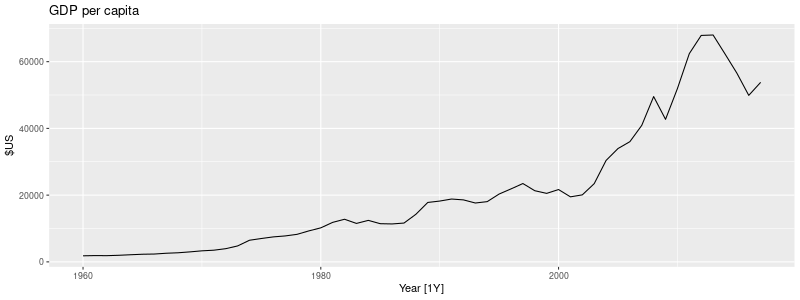

In [34]:
global_economy = (
    DataFrame(data(tsibbledata).fetch("global_economy")["global_economy"])
    .filter(rl('Country == "Australia"'))
    .mutate(GDP_per_capita = rl('GDP/Population'))
)
#ge = ( ggplot2.ggplot(global_economy) +
#       ggplot2.aes_string(x = 'Year', y = 'GDP_per_capita') +  
#       ggplot2.geom_line() +
#       ggplot2.labs(
#          title = "GDP per capita", y = "$US")
#      )    
#display(image_png(ge))
with ro.local_context() as lc:
    lc['global_economy'] = global_economy
    rcode = ('''
        ggplot2::autoplot(global_economy, GDP/Population) +
            labs(title = "GDP per capita", y = "$US")
        ''')
    display(image_png(ro.r(rcode), height=300))


In [35]:
print_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
print_retail = (
    DataFrame(print_retail)
    .group_by(rl('Industry')) 
    .summarise(Turnover = rl('sum(Turnover)'))
)
print_retail = (
    DataFrame(print_retail)
    .mutate(Year = rl('year(Month)'))
)
print_retail = tsibble.index_by(print_retail, rl('Year'))
print_retail = (
    DataFrame(print_retail)
    .group_by(rl('Industry')) 
    .summarise(Turnover = rl('sum(Turnover)'))
    .filter(rl('Industry == "Newspaper and book retailing"'))
)
#with localconverter(ro.default_converter + pandas2ri.converter):
#  aus_retail = ro.conversion.rpy2py(print_retail)

aus_economy = (
    DataFrame(data(tsibbledata).fetch("global_economy")["global_economy"])
    .filter(rl('Code == "AUS"'))
)

aus_retail = (
    DataFrame(print_retail)
    .left_join(aus_economy)
    .mutate(Adjusted_turnover = rl('Turnover / CPI * 100'))
)
tidyr = importr('tidyr')
aus_retail = tidyr.pivot_longer(aus_retail, cols = ro.StrVector(["Turnover", "Adjusted_turnover"]), values_to = "Turnover")
aus_retail = (
    DataFrame(aus_retail)
    .mutate(name = rl('factor(name, levels=c("Turnover","Adjusted_turnover"))'))
)
#print(aus_retail)

Joining with `by = join_by(Year)`


R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



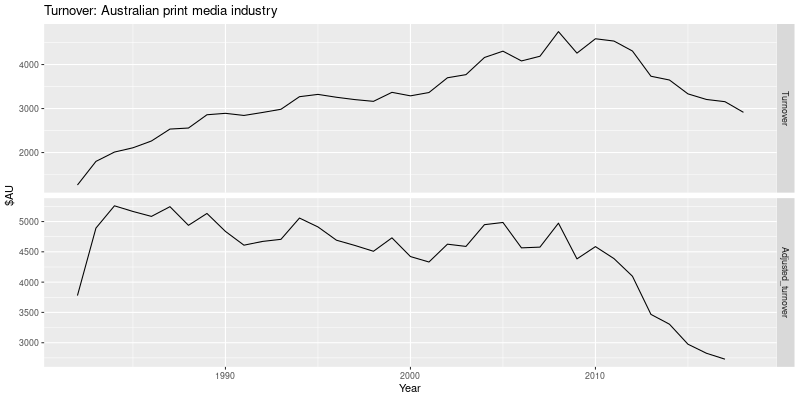

In [36]:
gn = ( ggplot2.ggplot(aus_retail) +
       ggplot2.aes_string(x = 'Year', y = 'Turnover') +  
       ggplot2.geom_line() +
       ggplot2.facet_grid(rl('name ~ .'), scales = "free_y") +
       ggplot2.labs(
          title = "Turnover: Australian print media industry",
          y = "$AU")
      )    
display(image_png(gn))

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 3: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



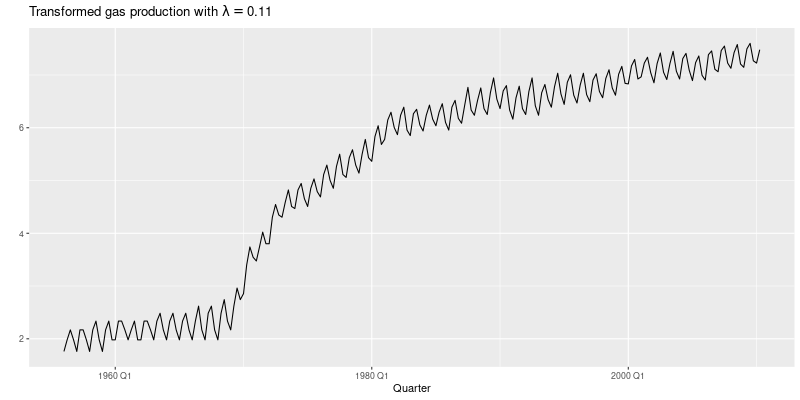

In [38]:
latex2exp = importr('latex2exp')
aus_production = data(tsibbledata).fetch('aus_production')['aus_production']

lambda_guerrero = fabletools.features(aus_production, rl('Gas'), features = ro.ListVector({'guerrero' : rl('guerrero')})) 
gaus = ( ggplot2.ggplot(aus_production) +
         ggplot2.aes_string(x='Quarter', y=fabletools.box_cox(aus_production.rx2('Gas'), lambda_guerrero)) +  
         ggplot2.geom_line() +
         ggplot2.labs(y = "",
                      title = latex2exp.TeX(base.paste("Transformed gas production with $\\lambda = ", base.round(lambda_guerrero,2))))
       )    
display(image_png(gaus))

#with ro.local_context() as lc:    ## Not worked!
#    lc['lambdaG'] = lambda_guerrero
#    rcode = ('''
#        ggplot2::autoplot(box_cox(Gas, lambdaG)) +
#          labs(y = "",
#               title = latex2exp::TeX(base::paste(
#                 "Transformed gas production with $\\lambda$ = ",
#                 base::round(lambdaG,2))))
#        ''')
#    display(image_png(ro.r(rcode)))

## 3.2 Time series components

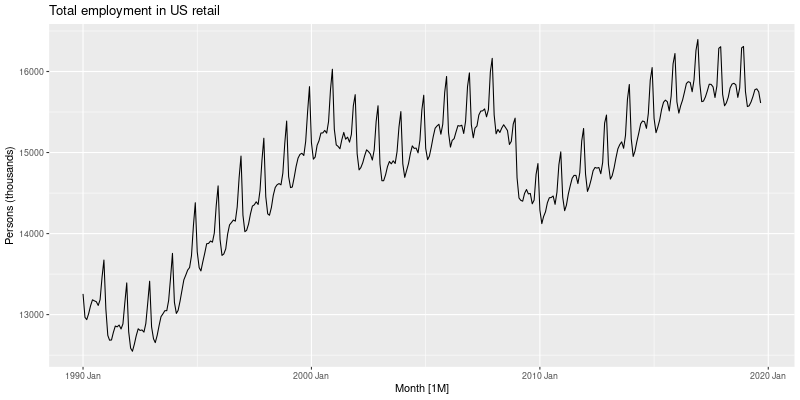

In [39]:
us_employment = data(fpp3).fetch('us_employment')['us_employment']
us_retail_employment = (
    DataFrame(us_employment)
    .filter(rl('year(Month) >= 1990'), rl('Title == "Retail Trade"'))
    .select(rl('-Series_ID'))
)
#gu = ( ggplot2.ggplot(us_retail_employment) +
#       ggplot2.aes_string(x = 'Month', y = 'Employed') +  
#       ggplot2.geom_line() +
#       ggplot2.labs(
#          y = "Persons (thousands)",
#          title = "Total employment in US retail")
#      )    
#display(image_png(gu))
with ro.local_context() as lc:
    lc['us_retail_employment'] = us_retail_employment
    rcode = ('''
        ggplot2::autoplot(us_retail_employment, Employed) +
            labs(y = "Persons (thousands)",
                 title = "Total employment in US retail")
        ''')
    display(image_png(ro.r(rcode)))

In [40]:
components = fabletools.components_mdl_df
dcmp = fabletools.model(us_retail_employment, feasts.STL(rl('Employed')))

#dcmp <- us_retail_employment |>
#  model(stl = STL(Employed))
print(components(dcmp))

# A dable: 357 x 7 [1M]
# Key:     .model [1]
# :        Employed = trend + season_year + remainder
   .model           Month Employed  trend season_year remainder season_adjust
   <chr>            <mth>    <dbl>  <dbl>       <dbl>     <dbl>         <dbl>
 1 <environment> 1990 Jan   13256. 13288.      -33.0      0.836        13289.
 2 <environment> 1990 Feb   12966. 13269.     -258.     -44.6          13224.
 3 <environment> 1990 Mar   12938. 13250.     -290.     -22.1          13228.
 4 <environment> 1990 Apr   13012. 13231.     -220.       1.05         13232.
 5 <environment> 1990 May   13108. 13211.     -114.      11.3          13223.
 6 <environment> 1990 Jun   13183. 13192.      -24.3     15.5          13207.
 7 <environment> 1990 Jul   13170. 13172.      -23.2     21.6          13193.
 8 <environment> 1990 Aug   13160. 13151.       -9.52    17.8          13169.
 9 <environment> 1990 Sep   13113. 13131.      -39.5     22.0          13153.
10 <environment> 1990 Oct   13185. 13110. 

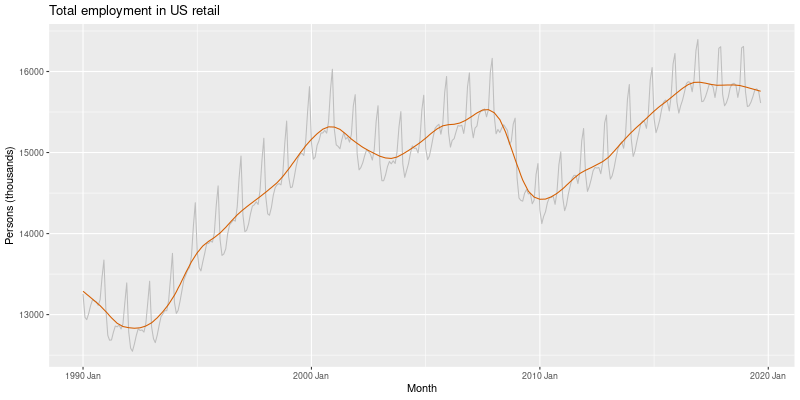

In [41]:
gc = ( ggplot2.ggplot(components(dcmp)) +
       ggplot2.aes_string(x = 'Month', y = 'Employed', color = 'gray') + 
       ggplot2.geom_line(ggplot2.aes(y=rl('Employed')), data=us_retail_employment, colour = 'gray') +
       ggplot2.geom_line(ggplot2.aes(y=rl('trend')), colour = "#D55E00") +
       ggplot2.labs(
          y = "Persons (thousands)",
          title = "Total employment in US retail")
      )    
display(image_png(gc))
#components(dcmp) |>
#  as_tsibble() |>
#  autoplot(Employed, colour="gray") +
#  geom_line(aes(y=trend), colour = "#D55E00") +
#  labs(
#    y = "Persons (thousands)",
#    title = "Total employment in US retail"
#  )

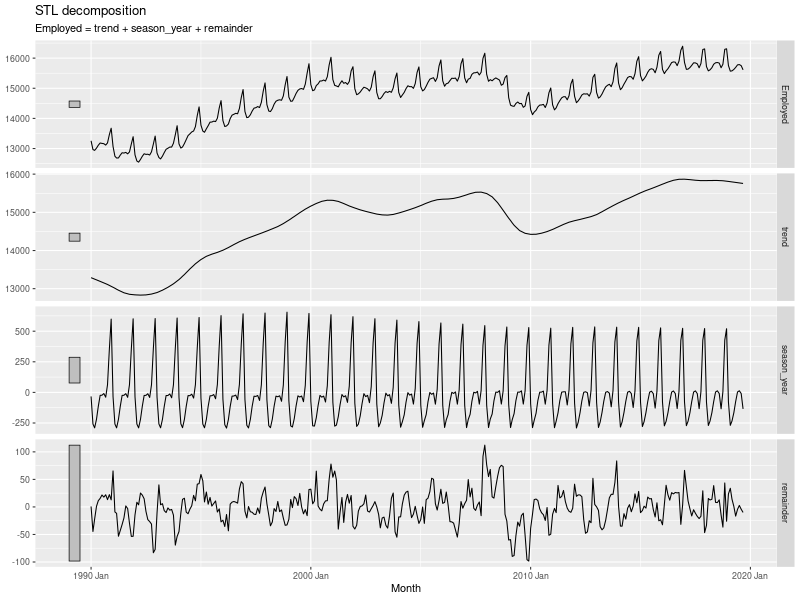

In [42]:
autoplot = fabletools.autoplot_dcmp_ts
g_auto = autoplot(components(dcmp))
display(image_png(g_auto, height=600))
#components(dcmp) |> autoplot()

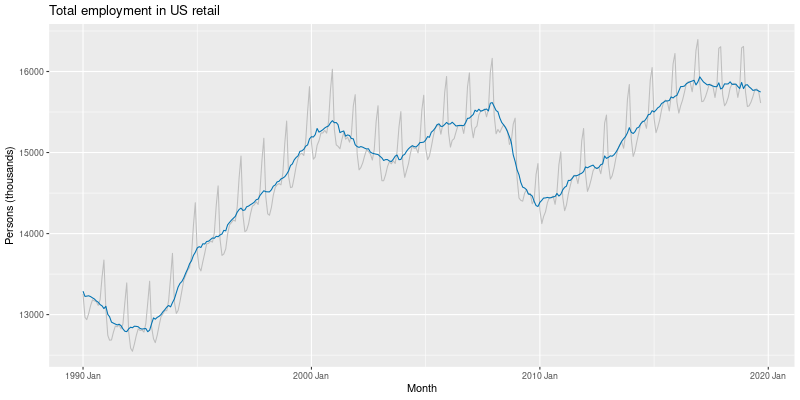

In [43]:
#autoplot_ts = fabletools.autoplot_tbl_ts
g_auto2 = ( ggplot2.ggplot(components(dcmp)) +
            ggplot2.aes_string(x = 'Month', y = 'Employed', color = 'gray') + 
            ggplot2.geom_line(ggplot2.aes(y=rl('Employed')), data=us_retail_employment, colour = 'gray') +
            ggplot2.geom_line(ggplot2.aes(y=rl('season_adjust')), colour = "#0072B2") +
            ggplot2.labs(
              y = "Persons (thousands)",
              title = "Total employment in US retail")
      )    
display(image_png(g_auto2))
#components(dcmp) |>
#  as_tsibble() |>
#  autoplot(Employed, colour = "gray") +
#  geom_line(aes(y=season_adjust), colour = "#0072B2") +
#  labs(y = "Persons (thousands)",
#       title = "Total employment in US retail")

## 3.3 Moving averages

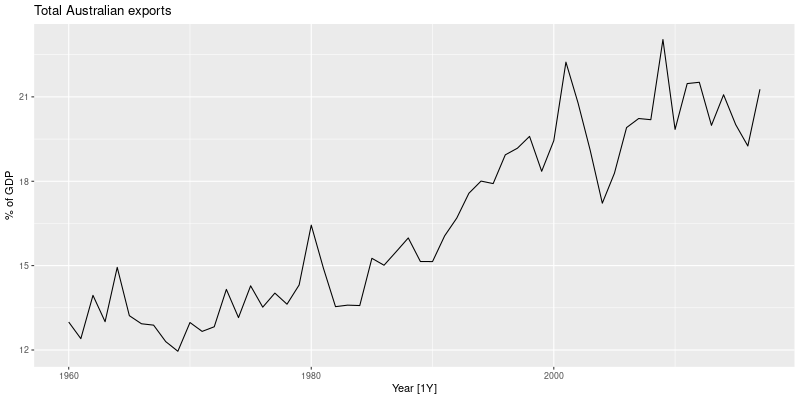

In [44]:
autoplot_ts = fabletools.autoplot_tbl_ts
kwargs = {'.vars':rl('Exports'), 'title': "Total Australian exports", 'ylab': "% of GDP"}
global_economy = data(tsibbledata).fetch('global_economy')['global_economy']
global_economy = (
    DataFrame(global_economy)
    .filter(rl('Country == "Australia"'))
)
#g2 = autoplot_ts(global_economy, **kwargs)  
#g2 = ( ggplot2.ggplot(global_economy) +
#       ggplot2.aes_string(x = 'Year', y = 'Exports') +  
#       ggplot2.geom_line() +
#       ggplot2.labs(y = "% of GDP", title = "Total Australian exports")
#      )
#display(image_png(g2))
with ro.local_context() as lc:
    lc['global_economy'] = global_economy
    rcode = ('''
        ggplot2::autoplot(global_economy, Exports) +
            labs(y = "% of GDP", title = "Total Australian exports")
        ''')
    display(image_png(ro.r(rcode)))
#global_economy |>
#  filter(Country == "Australia") |>
#  autoplot(Exports) +
#  labs(y = "% of GDP", title = "Total Australian exports")

In [45]:
slider = importr('slider')
kwargs = {'.before':2, '.after': 2, '.complete': True}
#aus_exports = (
#    DataFrame(global_economy)
#    .mutate(ma_5 = slider.slide_dbl(global_economy.rx2('Exports'), base.mean, **kwargs))
#)
with ro.local_context() as lc:
    lc['global_economy'] = global_economy
    rcode = ('''
        aus_exports <- global_economy |>
            filter(Country == "Australia") |> 
            mutate(    
                `5-MA` = slider::slide_dbl(Exports, mean,
                            .before = 2, .after = 2, .complete = TRUE)
                  )
        ''')
    ro.r(rcode)
    aus_exports = lc['aus_exports']
print(aus_exports)
#aus_exports <- global_economy |>
#  filter(Country == "Australia") |>
#  mutate(
#    `5-MA` = slider::slide_dbl(Exports, mean,
#                .before = 2, .after = 2, .complete = TRUE)
#  )

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tsibble: 58 x 10 [1Y]
# Key:       Country [1]
   Country   Code   Year      GDP Growth   CPI Imports Exports Population `5-MA`
   <fct>     <fct> <dbl>    <dbl>  <dbl> <dbl>   <dbl>   <dbl>      <dbl>  <dbl>
 1 Australia AUS    1960  1.86e10  NA     7.96    14.1    13.0   10276477   NA  
 2 Australia AUS    1961  1.96e10   2.49  8.14    15.0    12.4   10483000   NA  
 3 Australia AUS    1962  1.99e10   1.30  8.12    12.6    13.9   10742000   13.5
 4 Australia AUS    1963  2.15e10   6.21  8.17    13.8    13.0   10950000   13.5
 5 Australia AUS    1964  2.38e10   6.98  8.40    13.8    14.9   11167000   13.6
 6 Australia AUS    1965  2.59e10   5.98  8.69    15.3    13.2   11388000   13.4
 7 Australia AUS    1966  2.73e10   2.38  8.98    15.1    12.9   11651000   13.3
 8 Australia AUS    1967  3.04e10   6.30  9.29    13.9    12.9   11799000   12.7
 9 Australia AUS    1968  3.27e10   5.10  9.52    14.5    12.3   12009000   12.6
10 Australia AUS    1969  3.66e10   7.04  9.83    13.3    

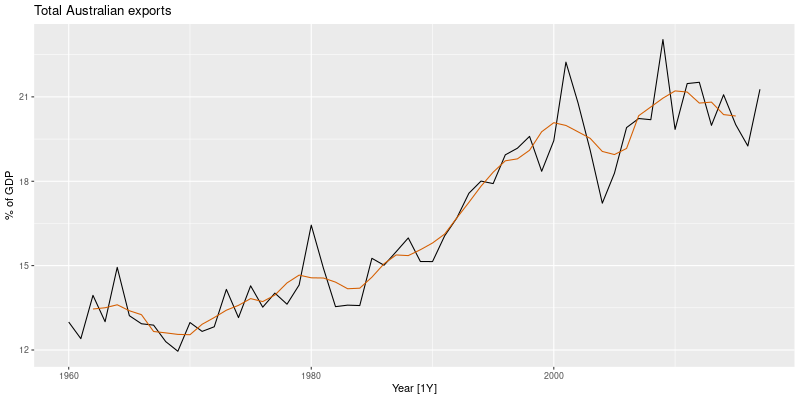

In [46]:
#g3 = ( ggplot2.ggplot(aus_exports) +
#       ggplot2.aes_string(x = 'Year', y = 'Exports') + 
#       ggplot2.geom_line(ggplot2.aes(y=rl('Exports')), colour = 'gray') +
#       ggplot2.geom_line(ggplot2.aes(y=rl('ma_5')), colour = "#D55E00") +
#       ggplot2.labs(y = "% of GDP", title = "Total Australian exports")
#      )
#display(image_png(g3))
with ro.local_context() as lc:
    lc['aus_exports'] = aus_exports
    rcode = ('''
        ggplot2::autoplot(aus_exports, Exports) +
            ggplot2::geom_line(aes(y = `5-MA`), colour = "#D55E00") +
            labs(y = "% of GDP", title = "Total Australian exports")
        ''')
    display(image_png(ro.r(rcode)))
#aus_exports |>
#  autoplot(Exports) +
#  geom_line(aes(y = `5-MA`), colour = "#D55E00") +
#  labs(y = "% of GDP",
#       title = "Total Australian exports")

In [47]:
slider = importr('slider')
kwargs_4_ma = {'.before':1, '.after': 2, '.complete': True}
kwargs_2_4_ma = {'.before':1, '.after': 0, '.complete': True}
aus_production = data(tsibbledata).fetch('aus_production')['aus_production']
beer = (
    DataFrame(aus_production)
    .filter(rl('year(Quarter) >= 1992'))
    .select(rl('Quarter'), rl('Beer'))
)
#beer_ma = (
#    DataFrame(beer)
#    .mutate(ma_4 = slider.slide_dbl(beer.rx2('Beer'), base.mean, **kwargs_4_ma))
#)
#beer_ma = (
#    DataFrame(beer_ma)
#    .mutate(ma_2_4 = slider.slide_dbl(beer_ma.rx2('ma_4'), base.mean, **kwargs_2_4_ma))
#)
with ro.local_context() as lc:
    lc['beer'] = beer
    rcode = ('''
        beer_ma <- beer |>
            mutate(
                `4-MA` = slider::slide_dbl(Beer, mean,
                            .before = 1, .after = 2, .complete = TRUE),
                `2x4-MA` = slider::slide_dbl(`4-MA`, mean,
                            .before = 1, .after = 0, .complete = TRUE)
            )
        ''')
    ro.r(rcode)
    beer_ma = lc['beer_ma']
print(beer_ma)
#beer <- aus_production |>
#  filter(year(Quarter) >= 1992) |>
#  select(Quarter, Beer)
#beer_ma <- beer |>
#  mutate(
#    `4-MA` = slider::slide_dbl(Beer, mean,
#                .before = 1, .after = 2, .complete = TRUE),
#    `2x4-MA` = slider::slide_dbl(`4-MA`, mean,
#                .before = 1, .after = 0, .complete = TRUE)
#  )

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 4 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tsibble: 74 x 4 [1Q]
   Quarter  Beer `4-MA` `2x4-MA`
     <qtr> <dbl>  <dbl>    <dbl>
 1 1992 Q1   443    NA       NA 
 2 1992 Q2   410   451.      NA 
 3 1992 Q3   420   449.     450 
 4 1992 Q4   532   452.     450.
 5 1993 Q1   433   449      450.
 6 1993 Q2   421   444      446.
 7 1993 Q3   410   448      446 
 8 1993 Q4   512   438      443 
 9 1994 Q1   449   441.     440.
10 1994 Q2   381   446      444.
# ℹ 64 more rows
# ℹ Use `print(n = ...)` to see more rows



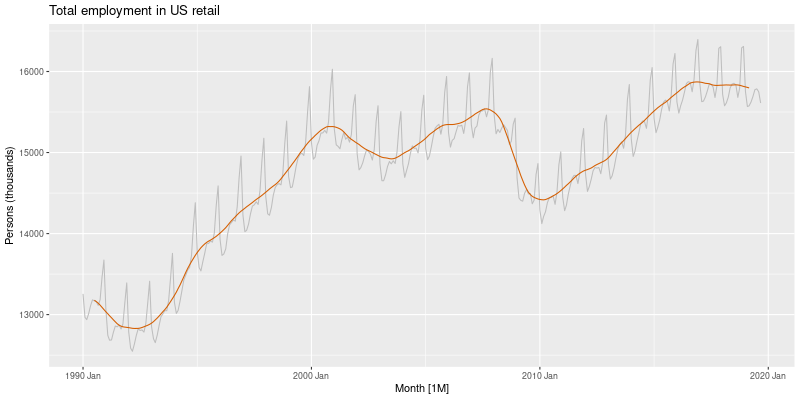

In [48]:
#kwargs_12_ma = {'.before':5, '.after': 6, '.complete': True}
#kwargs_2_12_ma = {'.before':1, '.after': 0, '.complete': True}
#us_retail_employment_ma = (
#    DataFrame(us_retail_employment)
#    .mutate(ma_12 = slider.slide_dbl(us_retail_employment.rx2('Employed'), base.mean, **kwargs_12_ma))
#)
#us_retail_employment_ma = (
#    DataFrame(us_retail_employment_ma)
#    .mutate(ma_2_12 = slider.slide_dbl(us_retail_employment_ma.rx2('ma_12'), base.mean, **kwargs_2_12_ma))
#)
#gu2 = (ggplot2.ggplot(us_retail_employment_ma) +
#       ggplot2.aes_string(x = 'Month', y = 'Employed') + 
#       ggplot2.geom_line(ggplot2.aes(y = rl('Employed')), colour = "gray") +
#       ggplot2.geom_line(ggplot2.aes(y = rl('ma_2_12')), colour = "#D55E00") +
#       ggplot2.labs(
#          y = "Persons (thousands)",
#          title = "Total employment in US retail")
#      )    
#display(image_png(gu2))
with ro.local_context() as lc:
    lc['us_retail_employment'] = us_retail_employment
    rcode = ('''
        us_retail_employment_ma <- us_retail_employment |>
          mutate(
            `12-MA` = slider::slide_dbl(Employed, mean,
                        .before = 5, .after = 6, .complete = TRUE),
            `2x12-MA` = slider::slide_dbl(`12-MA`, mean,
                        .before = 1, .after = 0, .complete = TRUE)
          )
        ''')
    ro.r(rcode)
    us_retail_employment_ma = lc['us_retail_employment_ma']

    rcode = ('''
        ggplot2::autoplot(us_retail_employment_ma, Employed, colour = "gray") +
            ggplot2::geom_line(aes(y = `2x12-MA`), colour = "#D55E00") +
            labs(y = "Persons (thousands)",
                 title = "Total employment in US retail")
        ''')
    display(image_png(ro.r(rcode)))

## 3.4 Classical decomposition

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 



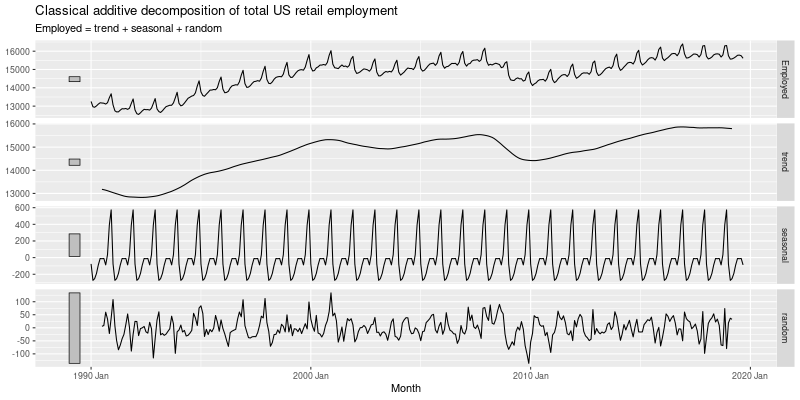

In [49]:
components = fabletools.components_mdl_df
autoplot = fabletools.autoplot_dcmp_ts
classical_dcmp_components = components(
    fabletools.model(us_retail_employment, feasts.classical_decomposition(rl('Employed'), type = "additive")))
#g_auto2 = autoplot(components(classical_dcmp))
#display(image_png(g_auto2))
with ro.local_context() as lc:
    lc['dcmp_components'] = classical_dcmp_components
    rcode = ('''
        fabletools::autoplot(dcmp_components) +
            labs(title = "Classical additive decomposition of total US retail employment")
        ''')
    display(image_png(ro.r(rcode)))
#us_retail_employment |>
#  model(
#    classical_decomposition(Employed, type = "additive")
#  ) |>
#  components() |>
#  autoplot() +
#  labs(title = "Classical additive decomposition of total
#                  US retail employment")

## 3.5 Methods used by official statistics agencies

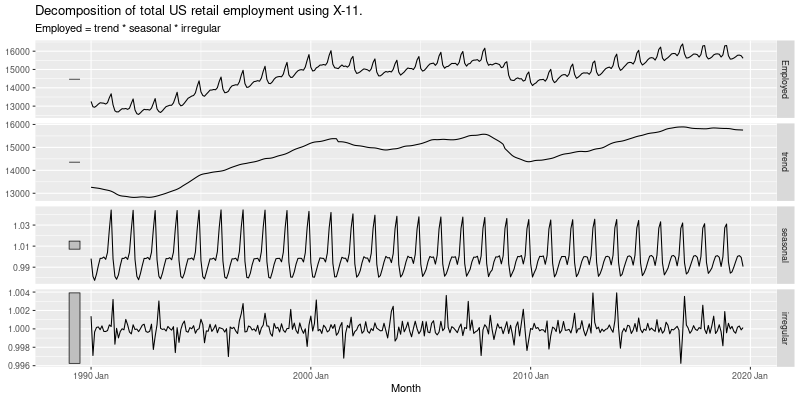

In [52]:
components = fabletools.components_mdl_df
autoplot = fabletools.autoplot_dcmp_ts
x11_dcmp_components = components(fabletools.model(us_retail_employment, feasts.X_13ARIMA_SEATS(rl('Employed ~ x11()'))))
#g_auto3 = autoplot(components(x11_dcmp))
#display(image_png(g_auto3))
with ro.local_context() as lc:
    lc['dcmp_components'] = x11_dcmp_components
    rcode = ('''
        fabletools::autoplot(dcmp_components) +
            labs(title = "Decomposition of total US retail employment using X-11.")
        ''')
    display(image_png(ro.r(rcode)))
#x11_dcmp <- us_retail_employment |>
#  model(x11 = X_13ARIMA_SEATS(Employed ~ x11())) |>
#  components()
#autoplot(x11_dcmp) +
#  labs(title =
#    "Decomposition of total US retail employment using X-11.")

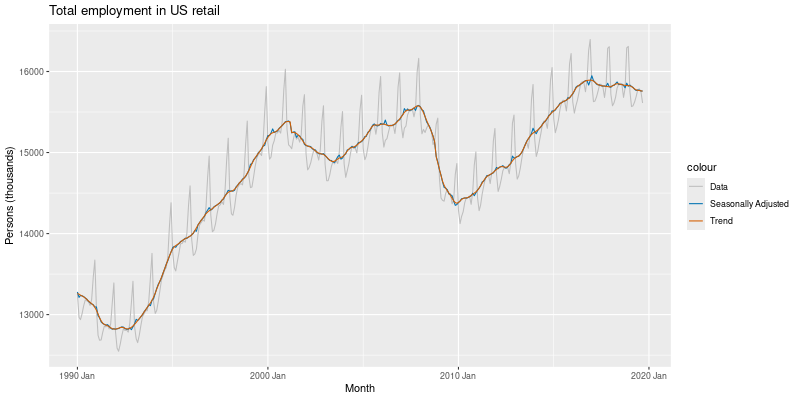

In [53]:
colormap_raw = [['Data', 'gray'], ['Seasonally Adjusted', '#0072B2'], ['Trend', '#D55E00']]
colormap = ro.StrVector([elt[1] for elt in colormap_raw])
colormap.names = ro.StrVector([elt[0] for elt in colormap_raw])
gp = ggplot2.ggplot(x11_dcmp_components)
pp = (gp + 
      ggplot2.aes_string(x = 'Month') +
      ggplot2.geom_line(ggplot2.aes(y = rl('Employed'), colour = "Data")) + 
      ggplot2.geom_line(ggplot2.aes(y = rl('season_adjust'), colour = "Seasonally Adjusted")) +
      ggplot2.geom_line(ggplot2.aes(y = rl('trend'), colour = "Trend")) +
      ggplot2.labs(
          y = "Persons (thousands)",
          title = "Total employment in US retail") +
      ggplot2.scale_colour_manual("colour",
                                  values=colormap,
                                  breaks=colormap.names,
                                  labels=colormap.names)
)
display(image_png(pp))
#x11_dcmp |>
#  ggplot(aes(x = Month)) +
#  geom_line(aes(y = Employed, colour = "Data")) +
#  geom_line(aes(y = season_adjust,
#                colour = "Seasonally Adjusted")) +
#  geom_line(aes(y = trend, colour = "Trend")) +
#  labs(y = "Persons (thousands)",
#       title = "Total employment in US retail") +
#  scale_colour_manual(
#    values = c("gray", "#0072B2", "#D55E00"),
#    breaks = c("Data", "Seasonally Adjusted", "Trend")
#  )

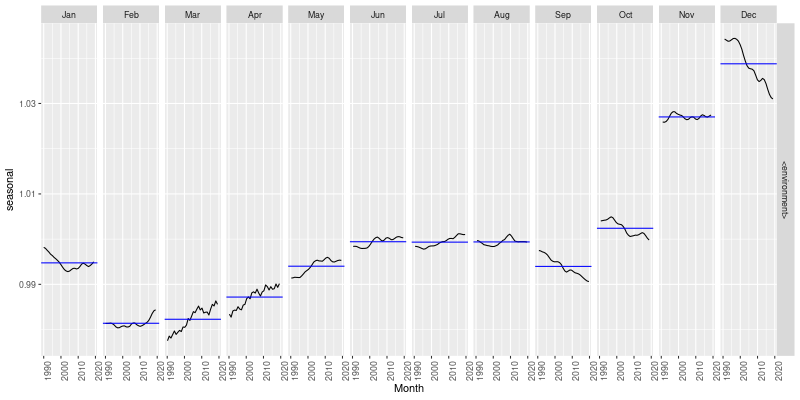

In [54]:
gg_11 = feasts.gg_subseries(x11_dcmp_components, rl('seasonal'))
display(image_png(gg_11))

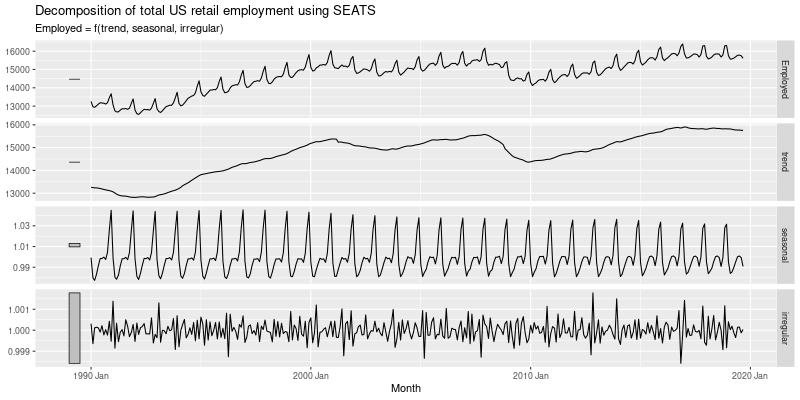

In [55]:
seats_dcmp = components(fabletools.model(us_retail_employment, feasts.X_13ARIMA_SEATS(rl('Employed ~ seats()'))))
#g_auto4 = autoplot(seats_dcmp)
#display(image_png(g_auto4))
with ro.local_context() as lc:
    lc['seats_dcmp'] = seats_dcmp
    rcode = ('''
        fabletools::autoplot(seats_dcmp) +
            labs(title = "Decomposition of total US retail employment using SEATS")
        ''')
    display(image_png(ro.r(rcode)))
#seats_dcmp <- us_retail_employment |>
#  model(seats = X_13ARIMA_SEATS(Employed ~ seats())) |>
#  components()
#autoplot(seats_dcmp) +
#  labs(title =
#    "Decomposition of total US retail employment using SEATS")

## 3.6 STL decomposition

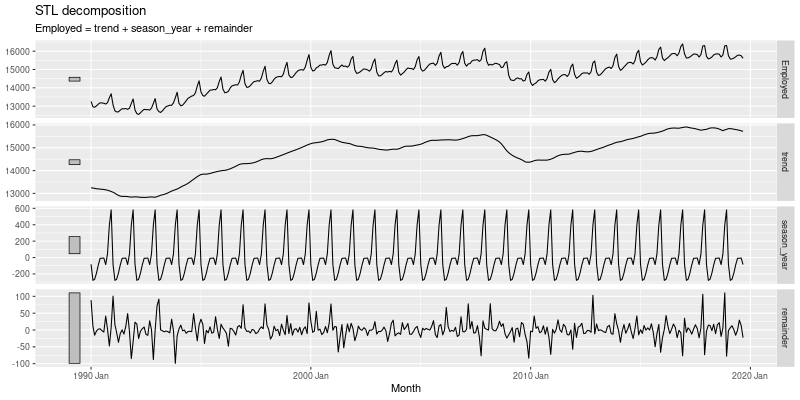

In [56]:
stl_dcmp = components(fabletools.model(us_retail_employment, 
                                       feasts.STL(rl('Employed ~ trend(window = 7) + season(window = "periodic")'), robust = True)))
#g_auto5 = autoplot(stl_dcmp)
#display(image_png(g_auto5))
with ro.local_context() as lc:
    lc['stl_dcmp'] = stl_dcmp
    rcode = ('''
        fabletools::autoplot(stl_dcmp)
        ''')
    display(image_png(ro.r(rcode)))
#us_retail_employment |>
#  model(
#    STL(Employed ~ trend(window = 7) +
#                   season(window = "periodic"),
#    robust = TRUE)) |>
#  components() |>
#  autoplot()

# 4 Time Series Features
## 4.1 Some Simple Statistics

In [57]:
dplyr = importr('dplyr')
tourism_f = dplyr.arrange(fabletools.features(tourism, rl('Trips'), features = ro.ListVector({'mean' : rl('mean')})), rl('mean')) 
print(tourism_f)
#tourism |>
#  features(Trips, list(mean = mean)) |>
#  arrange(mean)

# A tibble: 304 × 4
   Region          State              Purpose   mean
   <chr>           <chr>              <chr>    <dbl>
 1 Kangaroo Island South Australia    Other    0.340
 2 MacDonnell      Northern Territory Other    0.449
 3 Wilderness West Tasmania           Other    0.478
 4 Barkly          Northern Territory Other    0.632
 5 Clare Valley    South Australia    Other    0.898
 6 Barossa         South Australia    Other    1.02 
 7 Kakadu Arnhem   Northern Territory Other    1.04 
 8 Lasseter        Northern Territory Other    1.14 
 9 Wimmera         Victoria           Other    1.15 
10 MacDonnell      Northern Territory Visiting 1.18 
# ℹ 294 more rows
# ℹ Use `print(n = ...)` to see more rows



In [58]:
tourism_f2 = fabletools.features(tourism, rl('Trips'), features = rl('quantile'))
print(tourism_f2)
#tourism |> features(Trips, quantile)

# A tibble: 304 × 8
   Region         State             Purpose    `0%`  `25%`   `50%`  `75%` `100%`
   <chr>          <chr>             <chr>     <dbl>  <dbl>   <dbl>  <dbl>  <dbl>
 1 Adelaide       South Australia   Busine…  68.7   134.   153.    177.   242.  
 2 Adelaide       South Australia   Holiday 108.    135.   154.    172.   224.  
 3 Adelaide       South Australia   Other    25.9    43.9   53.8    62.5  107.  
 4 Adelaide       South Australia   Visiti… 137.    179.   206.    229.   270.  
 5 Adelaide Hills South Australia   Busine…   0       0      1.26    3.92  28.6 
 6 Adelaide Hills South Australia   Holiday   0       5.77   8.52   14.1   35.8 
 7 Adelaide Hills South Australia   Other     0       0      0.908   2.09   8.95
 8 Adelaide Hills South Australia   Visiti…   0.778   8.91  12.2    16.8   81.1 
 9 Alice Springs  Northern Territo… Busine…   1.01    9.13  13.3    18.5   34.1 
10 Alice Springs  Northern Territo… Holiday   2.81   16.9   31.5    44.8   76.5 
# ℹ 294 

## 4.2 ACF Features

In [59]:
tourism_f3 = fabletools.features(tourism, rl('Trips'), features = rl('feat_acf'))
print(tourism_f3)
#tourism |> features(Trips, feat_acf)

# A tibble: 304 × 10
   Region         State Purpose     acf1 acf10 diff1_acf1 diff1_acf10 diff2_acf1
   <chr>          <chr> <chr>      <dbl> <dbl>      <dbl>       <dbl>      <dbl>
 1 Adelaide       Sout… Busine…  0.0333  0.131     -0.520       0.463     -0.676
 2 Adelaide       Sout… Holiday  0.0456  0.372     -0.343       0.614     -0.487
 3 Adelaide       Sout… Other    0.517   1.15      -0.409       0.383     -0.675
 4 Adelaide       Sout… Visiti…  0.0684  0.294     -0.394       0.452     -0.518
 5 Adelaide Hills Sout… Busine…  0.0709  0.134     -0.580       0.415     -0.750
 6 Adelaide Hills Sout… Holiday  0.131   0.313     -0.536       0.500     -0.716
 7 Adelaide Hills Sout… Other    0.261   0.330     -0.253       0.317     -0.457
 8 Adelaide Hills Sout… Visiti…  0.139   0.117     -0.472       0.239     -0.626
 9 Alice Springs  Nort… Busine…  0.217   0.367     -0.500       0.381     -0.658
10 Alice Springs  Nort… Holiday -0.00660 2.11      -0.153       2.11      -0.274
# ℹ 294

## 4.3 STL Features

In [60]:
tourism_f4 = fabletools.features(tourism, rl('Trips'), features = rl('feat_stl'))
print(tourism_f4)
#tourism |>
#  features(Trips, feat_stl)

# A tibble: 304 × 12
   Region State Purpose trend_strength seasonal_strength_year seasonal_peak_year
   <chr>  <chr> <chr>            <dbl>                  <dbl>              <dbl>
 1 Adela… Sout… Busine…          0.464                  0.407                  3
 2 Adela… Sout… Holiday          0.554                  0.619                  1
 3 Adela… Sout… Other            0.746                  0.202                  2
 4 Adela… Sout… Visiti…          0.435                  0.452                  1
 5 Adela… Sout… Busine…          0.464                  0.179                  3
 6 Adela… Sout… Holiday          0.528                  0.296                  2
 7 Adela… Sout… Other            0.593                  0.404                  2
 8 Adela… Sout… Visiti…          0.488                  0.254                  0
 9 Alice… Nort… Busine…          0.534                  0.251                  0
10 Alice… Nort… Holiday          0.381                  0.832                  3
# ℹ 294

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



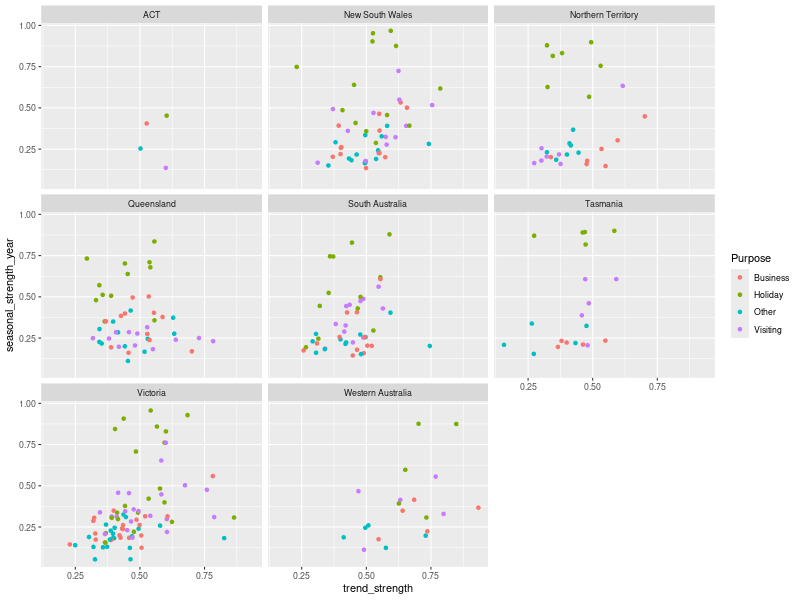

In [61]:
gp3 = ggplot2.ggplot(tourism_f4)
pp3 = (gp3 + 
      ggplot2.aes_string(x = 'trend_strength', y = 'seasonal_strength_year', col = 'Purpose') +
      ggplot2.geom_point() +
      ggplot2.facet_wrap(rl('vars(State)'))
)
display(image_png(pp3, height=600))
#tourism |>
#  features(Trips, feat_stl) |>
#  ggplot(aes(x = trend_strength, y = seasonal_strength_year,
#             col = Purpose)) +
#  geom_point() +
#  facet_wrap(vars(State))

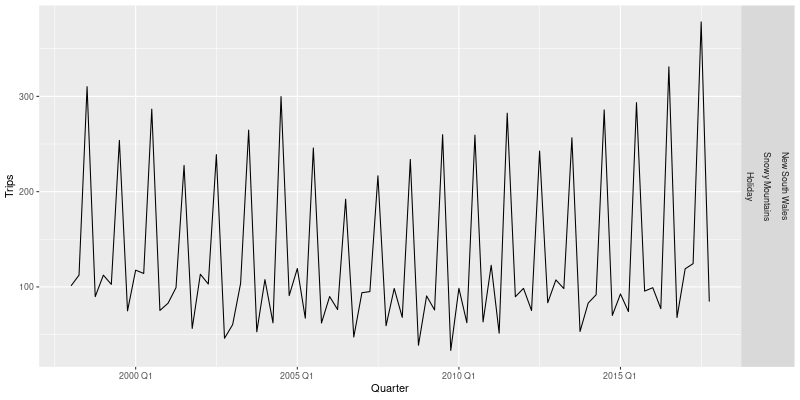

In [62]:
tourism_join = (
    DataFrame(tourism_f4)
    .filter(rl('seasonal_strength_year == max(seasonal_strength_year)'))
    .left_join(tourism, by = ro.StrVector(["State", "Region", "Purpose"]), multiple = "all")
)
gp4 = ggplot2.ggplot(tourism_join)
pp4 = (gp4 + 
      ggplot2.aes_string(x = 'Quarter', y = 'Trips') +
      ggplot2.geom_line() +
      ggplot2.facet_grid(rl('vars(State, Region, Purpose)'))
)
display(image_png(pp4))
#tourism |>
#  features(Trips, feat_stl) |>
#  filter(
#    seasonal_strength_year == max(seasonal_strength_year)
#  ) |>
#  left_join(tourism, by = c("State", "Region", "Purpose"), multiple = "all") |>
#  ggplot(aes(x = Quarter, y = Trips)) +
#  geom_line() +
#  facet_grid(vars(State, Region, Purpose))

## 4.5 Exploring Australian Tourism Data

In [63]:
tourism_features = fabletools.features(tourism, rl('Trips'), features = rl('feature_set(pkgs = "feasts")'))
#tourism_features <- tourism |>
#  features(Trips, feature_set(pkgs = "feasts"))
print(tourism_features)

# A tibble: 304 × 51
   Region State Purpose trend_strength seasonal_strength_year seasonal_peak_year
   <chr>  <chr> <chr>            <dbl>                  <dbl>              <dbl>
 1 Adela… Sout… Busine…          0.464                  0.407                  3
 2 Adela… Sout… Holiday          0.554                  0.619                  1
 3 Adela… Sout… Other            0.746                  0.202                  2
 4 Adela… Sout… Visiti…          0.435                  0.452                  1
 5 Adela… Sout… Busine…          0.464                  0.179                  3
 6 Adela… Sout… Holiday          0.528                  0.296                  2
 7 Adela… Sout… Other            0.593                  0.404                  2
 8 Adela… Sout… Visiti…          0.488                  0.254                  0
 9 Alice… Nort… Busine…          0.534                  0.251                  0
10 Alice… Nort… Holiday          0.381                  0.832                  3
# ℹ 294

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 3: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


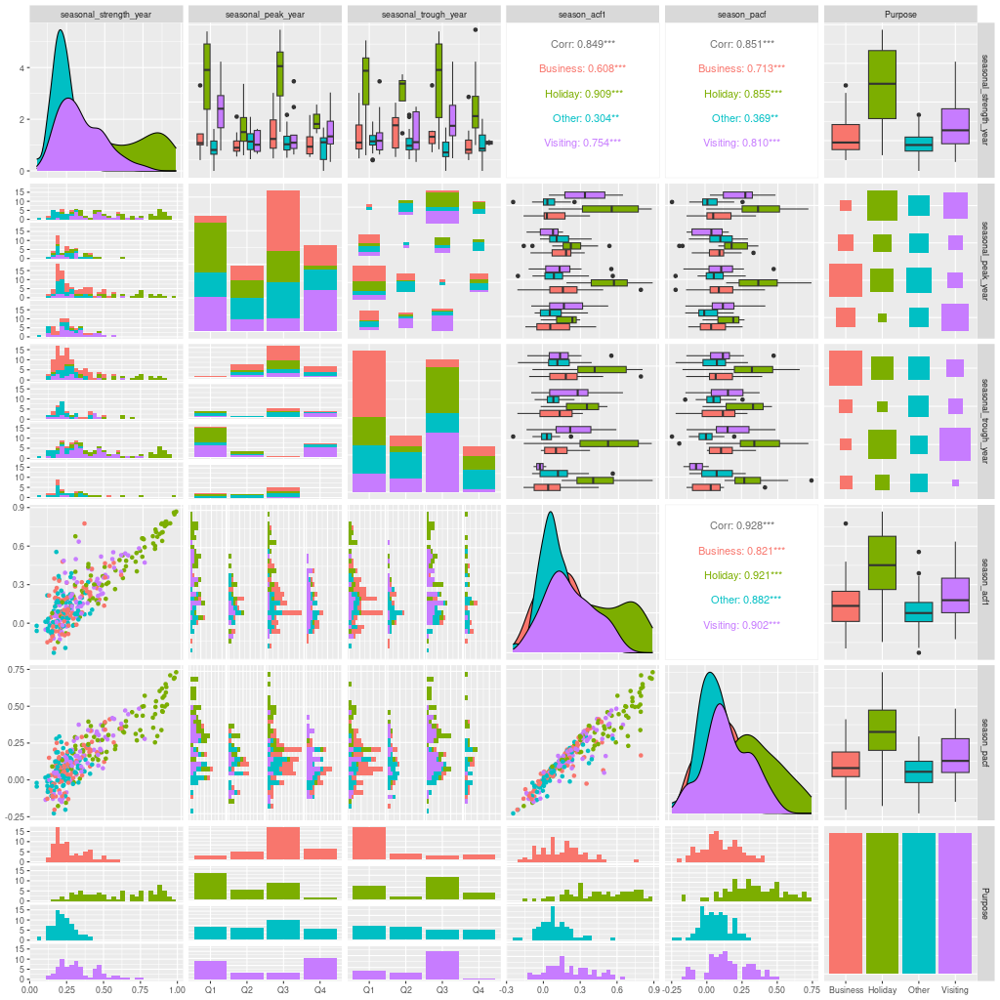

In [64]:
glue = importr('glue')
dplyr = importr('dplyr')
GGally = importr('GGally')
tourism_seasonal = (
    DataFrame(dplyr.select_at(tourism_features, rl('vars(contains("season"), Purpose)')))
    .mutate(
        seasonal_peak_year = rl('seasonal_peak_year + 4*(seasonal_peak_year==0)'),
        seasonal_trough_year = rl('seasonal_trough_year + 4*(seasonal_trough_year==0)'),
    )
)
tourism_seasonal = (
    DataFrame(tourism_seasonal)
    .mutate(
        seasonal_peak_year = rl('glue("Q{seasonal_peak_year}")'),
        seasonal_trough_year = rl('glue("Q{seasonal_trough_year}")'),
    )
)
gg_pair2 = GGally.ggpairs(tourism_seasonal, mapping = rl('aes(colour = Purpose)'))
display(image_png(gg_pair2, width=1024, height=1024))
#tourism_seasonal
#library(glue)
#tourism_features |>
#  select_at(vars(contains("season"), Purpose)) |>
#  mutate(
#    seasonal_peak_year = seasonal_peak_year +
#      4*(seasonal_peak_year==0),
#    seasonal_trough_year = seasonal_trough_year +
#      4*(seasonal_trough_year==0),
#    seasonal_peak_year = glue("Q{seasonal_peak_year}"),
#    seasonal_trough_year = glue("Q{seasonal_trough_year}"),
#  ) |>
#  GGally::ggpairs(mapping = aes(colour = Purpose))

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



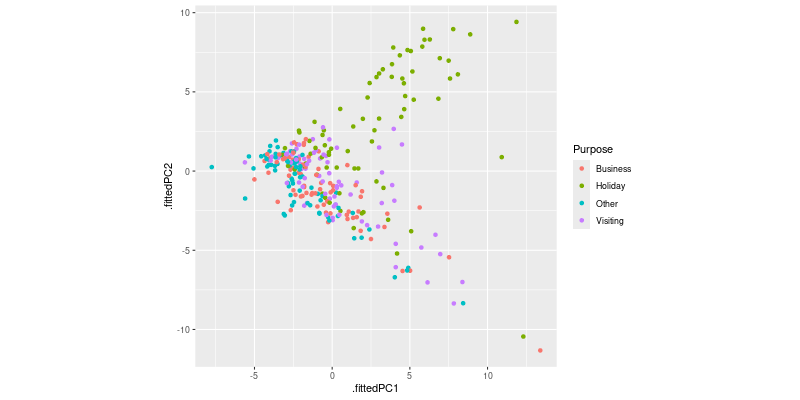

In [65]:
broom = importr('broom')
stats = importr('stats')
augment = broom.augment_prcomp
pcs = (
    DataFrame(tourism_features)
    .select(rl('-State'), rl('-Region'), rl('-Purpose'))
)
pcs = augment(stats.prcomp(pcs, scale=True), tourism_features)
kwargs_pcs = {'x':'.fittedPC1', 'y': '.fittedPC2', 'col': 'Purpose'}
ratio = ro.IntVector([1])[0]
ro.globalenv['ratio'] = ratio
gp5 = ggplot2.ggplot(pcs)
pp5 = (gp5 + 
      ggplot2.aes_string(**kwargs_pcs) +
      ggplot2.geom_point() +
      ggplot2.theme(**{'aspect.ratio': rl('as.numeric(ratio)')}) 
)
display(image_png(pp5))
#library(broom)
#pcs <- tourism_features |>
#  select(-State, -Region, -Purpose) |>
#  prcomp(scale = TRUE) |>
#  augment(tourism_features)
#pcs |>
#  ggplot(aes(x = .fittedPC1, y = .fittedPC2, col = Purpose)) +
#  geom_point() +
#  theme(aspect.ratio = 1)

In [66]:
outliers = (
    DataFrame(pcs)
    .filter(rl('.fittedPC1 > 10'))
    .select(rl('Region'), rl('State'), rl('Purpose'), rl('.fittedPC1'), rl('.fittedPC2'))
)
#outliers <- pcs |>
#  filter(.fittedPC1 > 10) |>
#  select(Region, State, Purpose, .fittedPC1, .fittedPC2)
print(outliers)

# A tibble: 4 × 5
  Region                 State             Purpose  .fittedPC1 .fittedPC2
  <chr>                  <chr>             <chr>         <dbl>      <dbl>
1 Australia's North West Western Australia Business       13.4    -11.3  
2 Australia's South West Western Australia Holiday        10.9      0.880
3 Melbourne              Victoria          Holiday        12.3    -10.4  
4 South Coast            New South Wales   Holiday        11.9      9.42 



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



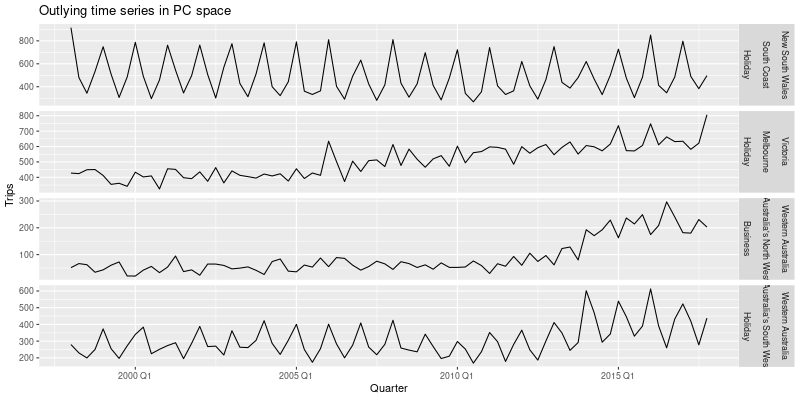

In [67]:
glue = importr('glue')
outliers_join = (
    DataFrame(outliers)
    .left_join(tourism, by = ro.StrVector(["State", "Region", "Purpose"]), multiple = "all")
    .mutate(Series = rl('glue("{State}", "{Region}", "{Purpose}", .sep = "\n\n")'))
)
#outliers_join
outliers_plot = ggplot2.ggplot(outliers_join)
pp_o = (outliers_plot + 
        ggplot2.aes_string(x = 'Quarter', y = 'Trips') +
        ggplot2.geom_line() +
        ggplot2.facet_grid(rl('Series ~ .'), scales = "free") +
        ggplot2.labs(title = "Outlying time series in PC space")  
)
display(image_png(pp_o))
#outliers |>
#  left_join(tourism, by = c("State", "Region", "Purpose"), multiple = "all") |>
#  mutate(Series = glue("{State}", "{Region}", "{Purpose}", .sep = "\n\n")) |>
#  ggplot(aes(x = Quarter, y = Trips)) +
#  geom_line() +
#  facet_grid(Series ~ ., scales = "free") +
#  labs(title = "Outlying time series in PC space")

# Chapter 5 The forecaster's toolbox
## 5.1 A tidy forecasting workflow

In [68]:
gdppc = (
    DataFrame(data(tsibbledata).fetch('global_economy')['global_economy'])
    .mutate(GDP_per_capita = rl('GDP/Population'))
)
#gdppc <- global_economy |>
#  mutate(GDP_per_capita = GDP / Population)

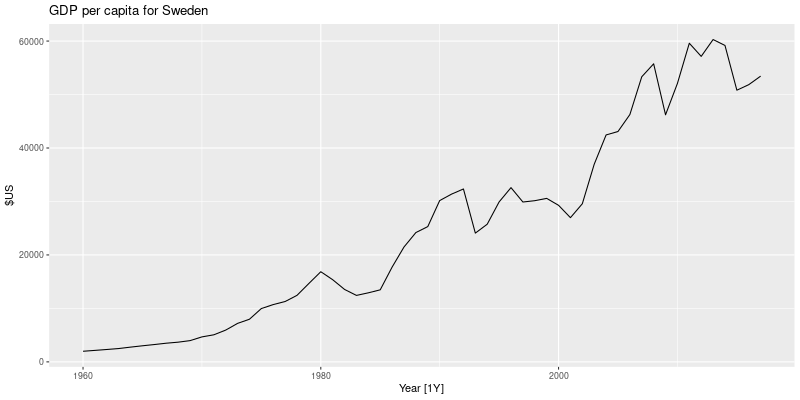

In [69]:
autoplot = fabletools.autoplot_tbl_ts
gdppc_sweden = (
    DataFrame(gdppc)
    .filter(rl('Country == "Sweden"'))
)
#pp_gdppc = autoplot(gdppc_sweden, rl('GDP_per_capita'))
#display(image_png(pp_gdppc))
with ro.local_context() as lc:
    lc['gdppc'] = gdppc_sweden
    rcode = ('''
        ggplot2::autoplot(gdppc, GDP_per_capita) +
          labs(y = "$US", title = "GDP per capita for Sweden")
        ''')
    display(image_png(ro.r(rcode)))
#gdppc |>
#  filter(Country == "Sweden") |>
#  autoplot(GDP_per_capita) +
#  labs(y = "$US", title = "GDP per capita for Sweden")

In [70]:
fable = importr('fable')
fit = fabletools.model(gdppc, fable.TSLM(rl('GDP_per_capita ~ trend()')))
print(fit)
#fit <- gdppc |>
#  model(trend_model = TSLM(GDP_per_capita ~ trend()))

# A mable: 263 x 2
# Key:     Country [263]
   Country             `<environment>`
   <fct>                       <model>
 1 Afghanistan                  <TSLM>
 2 Albania                      <TSLM>
 3 Algeria                      <TSLM>
 4 American Samoa               <TSLM>
 5 Andorra                      <TSLM>
 6 Angola                       <TSLM>
 7 Antigua and Barbuda          <TSLM>
 8 Arab World                   <TSLM>
 9 Argentina                    <TSLM>
10 Armenia                      <TSLM>
# ℹ 253 more rows
# ℹ Use `print(n = ...)` to see more rows



In [71]:
forecast = fabletools.forecast_mdl_df
fit_forecast = forecast(fit, h = "3 years")
print(fit_forecast)
#fit |> forecast(h = "3 years")

# A fable: 789 x 5 [1Y]
# Key:     Country, .model [263]
   Country        .model         Year
   <fct>          <chr>         <dbl>
 1 Afghanistan    <environment>  2018
 2 Afghanistan    <environment>  2019
 3 Afghanistan    <environment>  2020
 4 Albania        <environment>  2018
 5 Albania        <environment>  2019
 6 Albania        <environment>  2020
 7 Algeria        <environment>  2018
 8 Algeria        <environment>  2019
 9 Algeria        <environment>  2020
10 American Samoa <environment>  2018
# ℹ 779 more rows
# ℹ 2 more variables: GDP_per_capita <dist>, .mean <dbl>
# ℹ Use `print(n = ...)` to see more rows



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 7 errors (1 unique) encountered for <environment>
[7] 0 (non-NA) cases
 



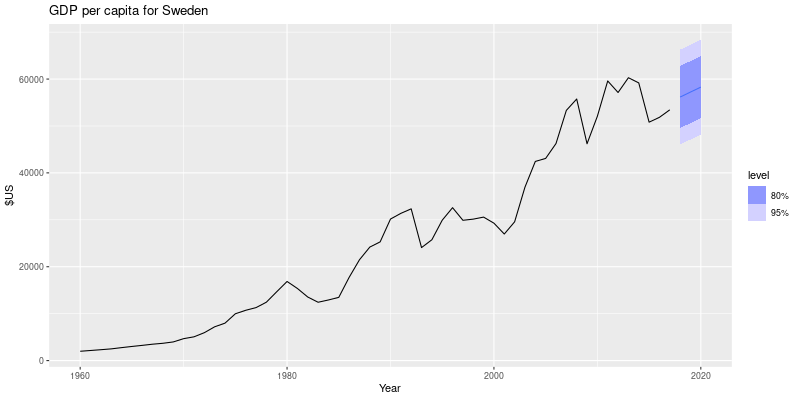

In [72]:
autoplot = fabletools.autoplot_tbl_ts
autoplot_fbl = fabletools.autoplot_fbl_ts
forecast_sweden = (
    DataFrame(fit_forecast)
    .filter(rl('Country == "Sweden"'))
)
#fp_sweden = (
#    autoplot_fbl(forecast_sweden, gdppc) 
#)
#display(image_png(fp_sweden))
with ro.local_context() as lc:
    lc['gdppc'] = gdppc_sweden
    lc['forecast_sweden'] = forecast_sweden
    rcode = ('''
        ggplot2::autoplot(forecast_sweden, gdppc) +
          labs(y = "$US", title = "GDP per capita for Sweden")
        ''')
    display(image_png(ro.r(rcode)))
#fit |>
#  forecast(h = "3 years") |>
#  filter(Country == "Sweden") |>
#  autoplot(gdppc) +
#  labs(y = "$US", title = "GDP per capita for Sweden")

## 5.2 Some simple forecasting methods

In [73]:
bricks = (
    DataFrame(
        tsibble.filter_index(
            tsibble.as_tsibble(
                data(tsibbledata).fetch('aus_production')['aus_production']
            ), 
            rl('"1970 Q1" ~ "2004 Q4"')
        )
    )
    .select(rl('Bricks'))
)
#print(bricks)
#bricks <- aus_production |>
#  filter_index("1970 Q1" ~ "2004 Q4") |>
#  select(Bricks)

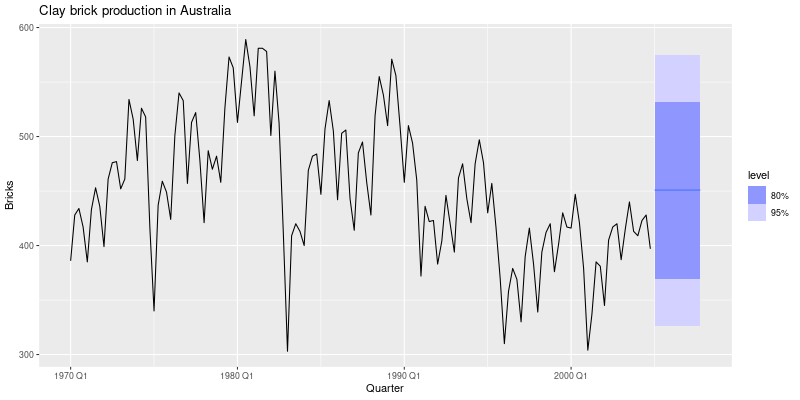

In [74]:
bricks_model = fabletools.model(bricks, fable.MEAN(rl('Bricks')))
bricks_forecast = forecast(bricks_model, h = "3 years")
#fp_bricks = autoplot_fbl(bricks_forecast, bricks)
#display(image_png(fp_bricks))
with ro.local_context() as lc:
    lc['bricks'] = bricks
    lc['bricks_forecast'] = bricks_forecast
    rcode = ('''
        ggplot2::autoplot(bricks_forecast, bricks) +
          labs(title = "Clay brick production in Australia")
        ''')
    display(image_png(ro.r(rcode)))
#bricks |> model(MEAN(Bricks))

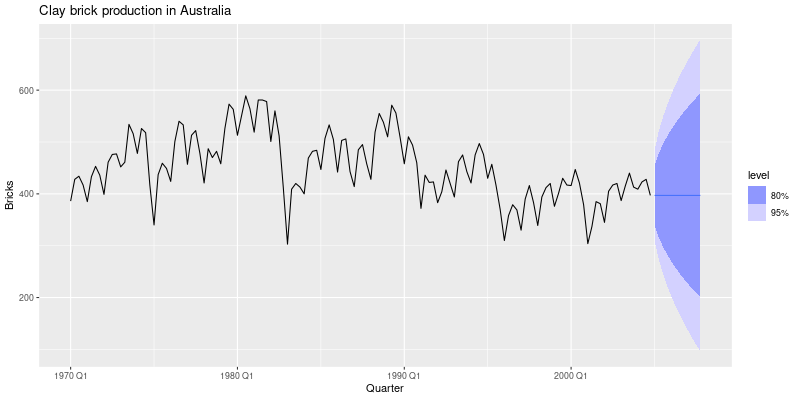

In [75]:
bricks_model2 = fabletools.model(bricks, fable.NAIVE(rl('Bricks')))
bricks_forecast2 = forecast(bricks_model2, h = "3 years")
#fp_bricks2 = autoplot_fbl(bricks_forecast2, bricks)
#display(image_png(fp_bricks2))
with ro.local_context() as lc:
    lc['bricks'] = bricks
    lc['bricks_forecast'] = bricks_forecast2
    rcode = ('''
        ggplot2::autoplot(bricks_forecast, bricks) +
          labs(title = "Clay brick production in Australia")
        ''')
    display(image_png(ro.r(rcode)))
#bricks |> model(NAIVE(Bricks))

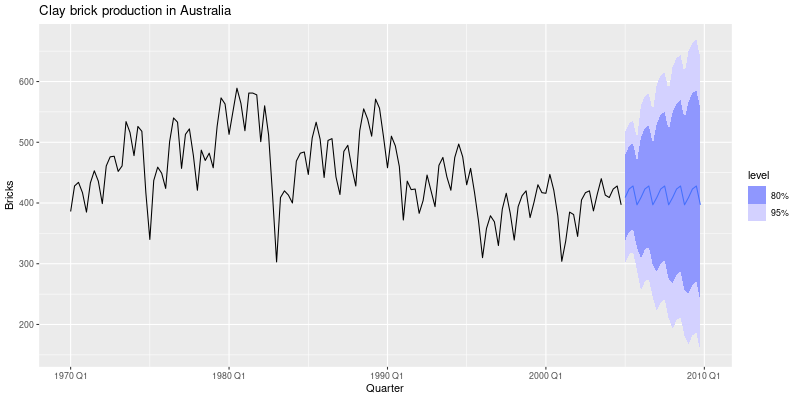

In [76]:
bricks_model3 = fabletools.model(bricks, fable.SNAIVE(rl('Bricks ~ lag("year")')))
bricks_forecast3 = forecast(bricks_model3, h = "5 years")
#fp_bricks3 = autoplot_fbl(bricks_forecast3, bricks)
#display(image_png(fp_bricks3))
with ro.local_context() as lc:
    lc['bricks'] = bricks
    lc['bricks_forecast'] = bricks_forecast3
    rcode = ('''
        fabletools::autoplot(bricks_forecast, bricks) +
          labs(title = "Clay brick production in Australia")
        ''')
    display(image_png(ro.r(rcode)))
#bricks |> model(SNAIVE(Bricks ~ lag("year")))

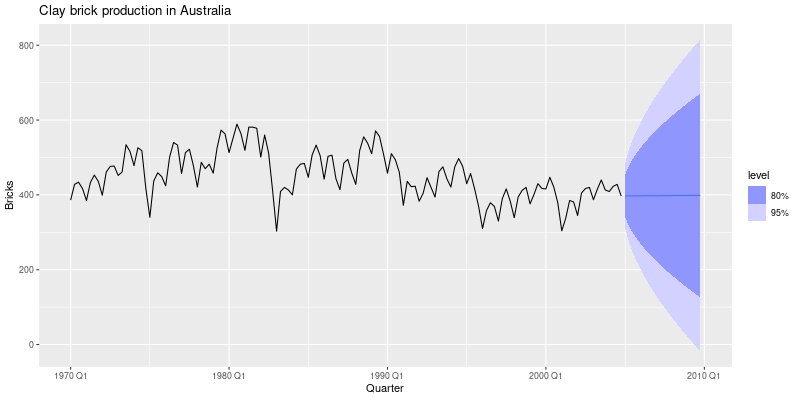

In [77]:
bricks_model4 = fabletools.model(bricks, rw = fable.RW(rl('Bricks ~ drift()')))
bricks_forecast4 = forecast(bricks_model4, h = "5 years")
#fp_bricks4 = autoplot_fbl(bricks_forecast4, bricks)
#display(image_png(fp_bricks4))
with ro.local_context() as lc:
    lc['bricks'] = bricks
    lc['bricks_forecast'] = bricks_forecast4
    rcode = ('''
        ggplot2::autoplot(bricks_forecast, bricks) +
          labs(title = "Clay brick production in Australia")
        ''')
    display(image_png(ro.r(rcode)))
#bricks |> model(RW(Bricks ~ drift()))

Plot variable not specified, automatically selected `.vars = Beer`


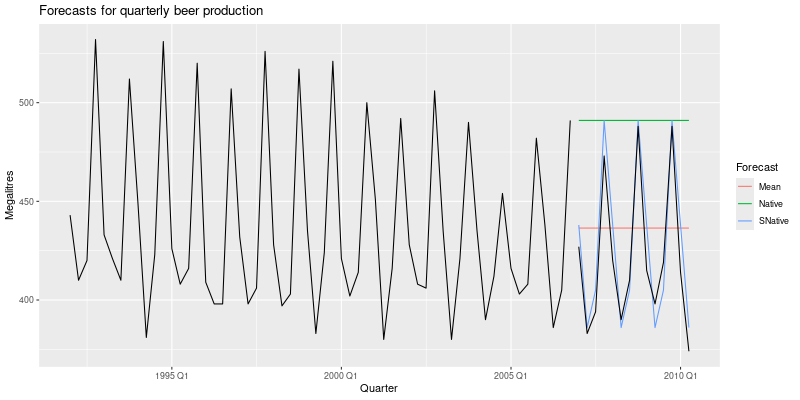

In [78]:
forecast = fabletools.forecast_mdl_df
autoplot_fbl = fabletools.autoplot_fbl_ts
# Set training data from 1992 to 2006
train = (
    tsibble.filter_index(
        tsibble.as_tsibble(
            data(tsibbledata).fetch('aus_production')['aus_production']), rl('"1992 Q1" ~ "2006 Q4"')
    )
)
aus_production = (
    tsibble.as_tsibble(
        data(tsibbledata).fetch('aus_production')['aus_production']
    )
)
aus_production_ = (
    tsibble.filter_index(
        tsibble.as_tsibble(
            data(tsibbledata).fetch('aus_production')['aus_production']), rl('"1992 Q1" ~ .')
    )
)
#train <- aus_production |>
#  filter_index("1992 Q1" ~ "2006 Q4")

# Fit the models
#ro.globalenv[`Naïve`] = "Naive"
beer_fit = fabletools.model(
    train,
    Mean = fable.MEAN(rl('Beer')),
    Native = fable.NAIVE(rl('Beer')),
    SNative = fable.SNAIVE(rl('Beer'))
)
#beer_fit <- train |>
#  model(
#    Mean = MEAN(Beer),
#    `Naïve` = NAIVE(Beer),
#    `Seasonal naïve` = SNAIVE(Beer)
#  )

# Generate forecasts for 14 quarters
beer_fc = forecast(beer_fit, h = 14)
#beer_fc <- beer_fit |> forecast(h = 14)

# Plot forecasts against actual values
#autolayer_tbl = fabletools.autolayer_tbl_ts
#fp_beer = (
#    autoplot_fbl(beer_fc, aus_production_, level = rl('NULL')) 
#)
#display(image_png(fp_beer))
with ro.local_context() as lc:
    lc['beer_fc'] = beer_fc
    lc['aus_production'] = aus_production
    lc['train'] = train
    rcode = ('''
        fabletools::autoplot(beer_fc, train, level = NULL) +
          fabletools::autolayer(
              filter_index(aus_production, "2007 Q1" ~ .),
              colour = "black"
            ) +
          labs(
            y = "Megalitres",
            title = "Forecasts for quarterly beer production"
              ) +
          guides(colour = guide_legend(title = "Forecast"))
        ''')
    display(image_png(ro.r(rcode)))
#beer_fc |>
#  autoplot(train, level = NULL) +
#  autolayer(
#    filter_index(aus_production, "2007 Q1" ~ .),
#    colour = "black"
#  ) +
#  labs(
#    y = "Megalitres",
#    title = "Forecasts for quarterly beer production"
#  ) +
#  guides(colour = guide_legend(title = "Forecast"))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



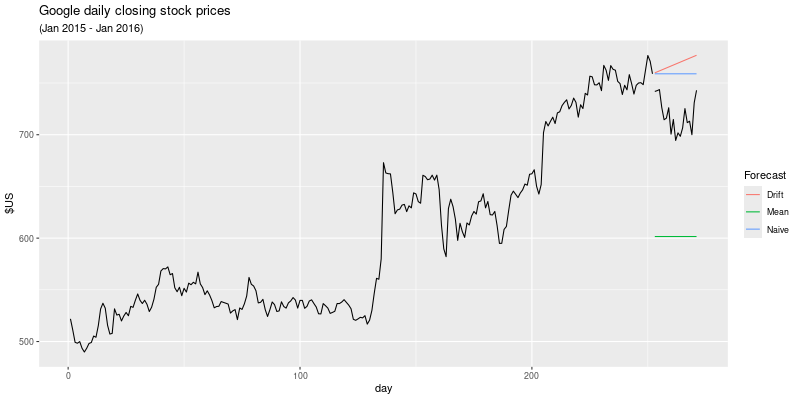

In [79]:
dplyr = importr('dplyr')
forecast = fabletools.forecast_mdl_df
autoplot_fbl = fabletools.autoplot_fbl_ts
autolayer_tbl = fabletools.autolayer_tbl_ts
autolayer_fbl = fabletools.autolayer_fbl_ts
# Re-index based on trading days
google_stock = (
    tsibble.update_tsibble(
        DataFrame(data(tsibbledata).fetch('gafa_stock')['gafa_stock'])
        .filter(rl('Symbol == "GOOG"'), rl('year(Date) >= 2015'))
        .mutate(day = rl('row_number()')),
        index = rl('day'), regular = True)
)
#google_stock <- gafa_stock |>
#  filter(Symbol == "GOOG", year(Date) >= 2015) |>
#  mutate(day = row_number()) |>
#  update_tsibble(index = day, regular = TRUE)

# Filter the year of interest
google_2015 = (
    DataFrame(google_stock)
    .filter(rl('year(Date) == 2015'))
)
#google_2015 <- google_stock |> filter(year(Date) == 2015)

# Fit the models
google_fit = fabletools.model(
    google_2015,
    Mean = fable.MEAN(rl('Close')),
    Naive = fable.NAIVE(rl('Close')),
    Drift = fable.NAIVE(rl('Close ~ drift()'))
)
#google_fit <- google_2015 |>
#  model(
#    Mean = MEAN(Close),
#    `Naïve` = NAIVE(Close),
#    Drift = NAIVE(Close ~ drift())
#  )
# Produce forecasts for the trading days in January 2016
google_jan_2016 = (
    DataFrame(google_stock)
    .filter(rl('yearmonth(Date) == yearmonth("2016 Jan")'))
)
#google_jan_2016 <- google_stock |>
#  filter(yearmonth(Date) == yearmonth("2016 Jan"))
google_fc = forecast(google_fit, new_data = google_jan_2016)
#google_fc <- google_fit |>
#  forecast(new_data = google_jan_2016)
# Plot the forecasts
with ro.local_context() as lc:
    lc['google_fc'] = google_fc
    lc['google_2015'] = google_2015
    lc['google_jan_2016'] = google_jan_2016
    rcode = ('''
        fabletools::autoplot(google_fc, google_2015, level = NULL) +
          fabletools::autolayer(google_jan_2016, Close, colour = "black") +
          labs(y = "$US",
               title = "Google daily closing stock prices",
               subtitle = "(Jan 2015 - Jan 2016)") +
          guides(colour = guide_legend(title = "Forecast"))
        ''')
    display(image_png(ro.r(rcode)))
#fp_google = (
#    autoplot_fbl(google_fc, dplyr.bind_rows(google_2015, google_jan_2016), rl('level=NULL'))
#)
#display(image_png(fp_google))
#google_fc |>
#  autoplot(google_2015, level = NULL) +
#  autolayer(google_jan_2016, Close, colour = "black") +
#  labs(y = "$US",
#       title = "Google daily closing stock prices",
#       subtitle = "(Jan 2015 - Jan 2016)") +
#  guides(colour = guide_legend(title = "Forecast"))

## 5.3 Fitted Values and residuals

In [80]:
augment = fabletools.augment_mdl_df
beer_augment = augment(beer_fit)
print(beer_augment)

# A tsibble: 180 x 6 [1Q]
# Key:       .model [3]
   .model Quarter  Beer .fitted .resid .innov
   <chr>    <qtr> <dbl>   <dbl>  <dbl>  <dbl>
 1 Mean   1992 Q1   443    436.   6.55   6.55
 2 Mean   1992 Q2   410    436. -26.4  -26.4 
 3 Mean   1992 Q3   420    436. -16.4  -16.4 
 4 Mean   1992 Q4   532    436.  95.6   95.6 
 5 Mean   1993 Q1   433    436.  -3.45  -3.45
 6 Mean   1993 Q2   421    436. -15.4  -15.4 
 7 Mean   1993 Q3   410    436. -26.4  -26.4 
 8 Mean   1993 Q4   512    436.  75.6   75.6 
 9 Mean   1994 Q1   449    436.  12.6   12.6 
10 Mean   1994 Q2   381    436. -55.4  -55.4 
# ℹ 170 more rows
# ℹ Use `print(n = ...)` to see more rows



## 5.4 Residual diagnostics

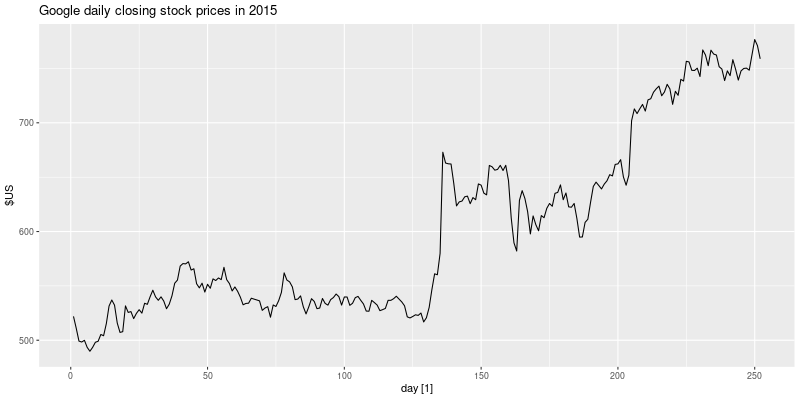

In [81]:
#r_ggplot2 = importr('ggplot2')
#autoplot_gg = r_ggplot2.autoplot
#pp_google = (
#    r_ggplot2.autoplot(google_2015, rl('Close')) 
#)
#display(image_png(pp_google))
with ro.local_context() as lc:
    lc['google_2015'] = google_2015
    rcode = ('''
        ggplot2::autoplot(google_2015, Close) +
          labs(y = "$US",
               title = "Google daily closing stock prices in 2015")
        ''')
    display(image_png(ro.r(rcode)))
#autoplot(google_2015, Close) +
#  labs(y = "$US",
#       title = "Google daily closing stock prices in 2015")

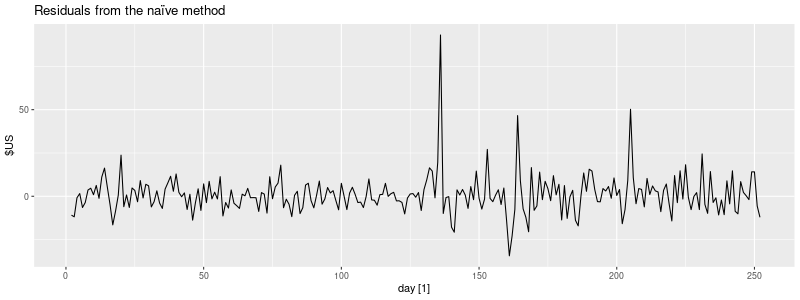

In [82]:
augment = fabletools.augment_mdl_df
#r_ggplot2 = importr('ggplot2')
#autoplot_gg = r_ggplot2.autoplot
aug = augment(
    fabletools.model(
        google_2015,
        NAIVE = fable.NAIVE(rl('Close'))
    )
)
#pa_google = (r_ggplot2.autoplot(aug, rl('.innov')))
#display(image_png(pa_google))
with ro.local_context() as lc:
    lc['aug'] = aug
    rcode = ('''
        ggplot2::autoplot(aug, .innov) +
          labs(y = "$US",
               title = "Residuals from the naïve method")
        ''')
    display(image_png(ro.r(rcode), height=300))
#aug <- google_2015 |>
#  model(NAIVE(Close)) |>
#  augment()
#autoplot(aug, .innov) +
#  labs(y = "$US",
#       title = "Residuals from the naïve method")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 



`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


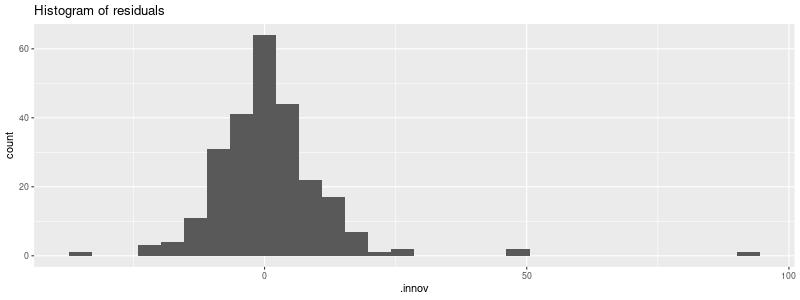

In [83]:
pa2_google = (
    ggplot2.ggplot(aug) +
    ggplot2.aes(x = rl('.innov')) +
    ggplot2.geom_histogram() +
    ggplot2.labs(title = "Histogram of residuals")
)
display(image_png(pa2_google, height=300))
#aug |>
#  ggplot(aes(x = .innov)) +
#  geom_histogram() +
#  labs(title = "Histogram of residuals")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 1 row containing non-finite outside the scale range (`stat_bin()`). 



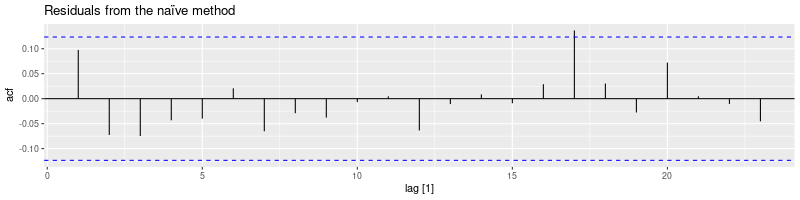

In [84]:
google_acf = feasts.ACF(aug, rl('.innov'))
#autoplot_acf = feasts.autoplot_tbl_cf
#pa3_google = autoplot_acf(google_acf)# + ggplot2.ggtitle("Residuals from the naïve method")
#display(image_png(pa3_google))
with ro.local_context() as lc:
    lc['google_acf'] = google_acf
    rcode = ('''
        feasts::autoplot(google_acf) +
          labs(title = "Residuals from the naïve method")
        ''')
    display(image_png(ro.r(rcode), height=200))
#aug |>
#  ACF(.innov) |>
#  autoplot() +
#  labs(title = "Residuals from the naïve method")

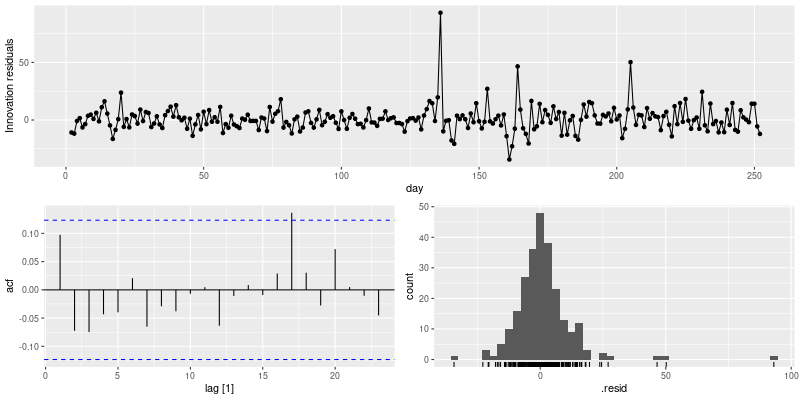

In [85]:
gg_google = feasts.gg_tsresiduals(
    fabletools.model(
        google_2015,
        fable.NAIVE(rl('Close'))
    )
)
display(image_png(gg_google))
#google_2015 |>
#  model(NAIVE(Close)) |>
#  gg_tsresiduals()

In [86]:
google_features_box_pierce = fabletools.features(aug, rl('.innov'), features = ro.ListVector({'box_pierce' : rl('box_pierce')}), lag = 10) 
print(google_features_box_pierce)
#aug |> features(.innov, box_pierce, lag = 10)
#> # A tibble: 1 × 4
#>   Symbol .model       bp_stat bp_pvalue
#>   <chr>  <chr>          <dbl>     <dbl>
#> 1 GOOG   NAIVE(Close)    7.74     0.654
google_features_ljung_box = fabletools.features(aug, rl('.innov'), features = ro.ListVector({'ljung_box' : rl('ljung_box')}), lag = 10) 
print(google_features_ljung_box)
#aug |> features(.innov, ljung_box, lag = 10)
#> # A tibble: 1 × 4
#>   Symbol .model       lb_stat lb_pvalue
#>   <chr>  <chr>          <dbl>     <dbl>
#> 1 GOOG   NAIVE(Close)    7.91     0.637

# A tibble: 1 × 4
  Symbol .model box_pierce_bp_stat box_pierce_bp_pvalue
  <chr>  <chr>               <dbl>                <dbl>
1 GOOG   NAIVE                7.74                0.654

# A tibble: 1 × 4
  Symbol .model ljung_box_lb_stat ljung_box_lb_pvalue
  <chr>  <chr>              <dbl>               <dbl>
1 GOOG   NAIVE               7.91               0.637



In [87]:
tidy = fabletools.tidy_mdl_df
fit = fabletools.model(
        google_2015,
        RW = fable.RW(rl('Close ~ drift()'))
    )
print(tidy(fit))
#fit <- google_2015 |> model(RW(Close ~ drift()))
#tidy(fit)
#> # A tibble: 1 × 7
#>   Symbol .model              term  estimate std.error statistic p.value
#>   <chr>  <chr>               <chr>    <dbl>     <dbl>     <dbl>   <dbl>
#> 1 GOOG   RW(Close ~ drift()) b        0.944     0.705      1.34   0.182

# A tibble: 1 × 7
  Symbol .model term  estimate std.error statistic p.value
  <chr>  <chr>  <chr>    <dbl>     <dbl>     <dbl>   <dbl>
1 GOOG   RW     b        0.944     0.705      1.34   0.182



In [88]:
augment = fabletools.augment_mdl_df
google_rw_ljung_box = fabletools.features(augment(fit), rl('.innov'), features = ro.ListVector({'ljung_box' : rl('ljung_box')}), lag = 10) 
print(google_rw_ljung_box)
#augment(fit) |> features(.innov, ljung_box, lag=10)
#> # A tibble: 1 × 4
#>   Symbol .model              lb_stat lb_pvalue
#>   <chr>  <chr>                 <dbl>     <dbl>
#> 1 GOOG   RW(Close ~ drift())    7.91     0.637

# A tibble: 1 × 4
  Symbol .model ljung_box_lb_stat ljung_box_lb_pvalue
  <chr>  <chr>              <dbl>               <dbl>
1 GOOG   RW                  7.91               0.637



## 5.5 Distributional forecasts and prediction intervals

In [89]:
aus_production_fc = (
    forecast(
        fabletools.model(
            (DataFrame(data(tsibbledata).fetch('aus_production')['aus_production'])
             .filter(rl('!is.na(Bricks)'))),
            Seasonal_naive = fable.SNAIVE(rl('Bricks'))
        ),
        h = "5 years"
    )
)
print(aus_production_fc)

# A fable: 20 x 4 [1Q]
# Key:     .model [1]
   .model         Quarter
   <chr>            <qtr>
 1 Seasonal_naive 2005 Q3
 2 Seasonal_naive 2005 Q4
 3 Seasonal_naive 2006 Q1
 4 Seasonal_naive 2006 Q2
 5 Seasonal_naive 2006 Q3
 6 Seasonal_naive 2006 Q4
 7 Seasonal_naive 2007 Q1
 8 Seasonal_naive 2007 Q2
 9 Seasonal_naive 2007 Q3
10 Seasonal_naive 2007 Q4
11 Seasonal_naive 2008 Q1
12 Seasonal_naive 2008 Q2
13 Seasonal_naive 2008 Q3
14 Seasonal_naive 2008 Q4
15 Seasonal_naive 2009 Q1
16 Seasonal_naive 2009 Q2
17 Seasonal_naive 2009 Q3
18 Seasonal_naive 2009 Q4
19 Seasonal_naive 2010 Q1
20 Seasonal_naive 2010 Q2
# ℹ 2 more variables: Bricks <dist>, .mean <dbl>



In [90]:
rlevel = ro.FloatVector([95])[0]
ro.globalenv['rlevel'] = rlevel
aus_production_hilo = distributional.hilo(
    forecast(
        fabletools.model(
            (DataFrame(data(tsibbledata).fetch('aus_production')['aus_production'])
             .filter(rl('!is.na(Bricks)'))),
            Seasonal_naive = fable.SNAIVE(rl('Bricks'))
        ),
        h = "5 years"
    ),
    level = rl('rlevel')
)
aus_production_hilo = (
    DataFrame(aus_production_hilo)
    .mutate(lower = rl('`95%`$lower'), upper = rl('`95%`$upper'))
)
print(aus_production_hilo)

# A tsibble: 20 x 7 [1Q]
# Key:       .model [1]
   .model         Quarter
   <chr>            <qtr>
 1 Seasonal_naive 2005 Q3
 2 Seasonal_naive 2005 Q4
 3 Seasonal_naive 2006 Q1
 4 Seasonal_naive 2006 Q2
 5 Seasonal_naive 2006 Q3
 6 Seasonal_naive 2006 Q4
 7 Seasonal_naive 2007 Q1
 8 Seasonal_naive 2007 Q2
 9 Seasonal_naive 2007 Q3
10 Seasonal_naive 2007 Q4
11 Seasonal_naive 2008 Q1
12 Seasonal_naive 2008 Q2
13 Seasonal_naive 2008 Q3
14 Seasonal_naive 2008 Q4
15 Seasonal_naive 2009 Q1
16 Seasonal_naive 2009 Q2
17 Seasonal_naive 2009 Q3
18 Seasonal_naive 2009 Q4
19 Seasonal_naive 2010 Q1
20 Seasonal_naive 2010 Q2
# ℹ 5 more variables: Bricks <dist>, .mean <dbl>, `95%` <hilo>, lower <dbl>,
#   upper <dbl>



In [91]:
forecast = fabletools.forecast_mdl_df
distributional = importr('distributional')
google_hilo = distributional.hilo(
    forecast(
        fabletools.model(
        google_2015,
        NAIVE = fable.NAIVE(rl('Close'))
        ),
        h = 10
    )
)
print(google_hilo)    
#google_2015 |>
#  model(NAIVE(Close)) |>
#  forecast(h = 10) |>
#  hilo()

# A tsibble: 10 x 7 [1]
# Key:       Symbol, .model [1]
   Symbol .model   day
   <chr>  <chr>  <dbl>
 1 GOOG   NAIVE    253
 2 GOOG   NAIVE    254
 3 GOOG   NAIVE    255
 4 GOOG   NAIVE    256
 5 GOOG   NAIVE    257
 6 GOOG   NAIVE    258
 7 GOOG   NAIVE    259
 8 GOOG   NAIVE    260
 9 GOOG   NAIVE    261
10 GOOG   NAIVE    262
# ℹ 4 more variables: Close <dist>, .mean <dbl>, `80%` <hilo>, `95%` <hilo>



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 1 row containing missing values or values outside the scale range
(`geom_point()`). 

R[write to console]: 3: Removed 1 row containing non-finite outside the scale range (`stat_bin()`). 

R[write to console]: 4: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



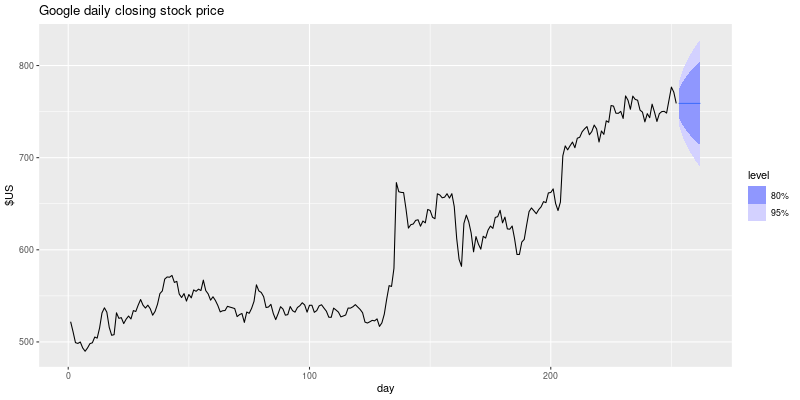

In [92]:
autoplot = fabletools.autoplot_fbl_ts
google_prediction_forecast = (
    forecast(
        fabletools.model(
        google_2015,
        NAIVE = fable.NAIVE(rl('Close'))
        ),
        h = 10))
#google_prediction_interval_plot = autoplot(
#    google_prediction_forecast,
#    data=google_2015
#)
#display(image_png(google_prediction_interval_plot))
with ro.local_context() as lc:
    lc['google_forecast'] = google_prediction_forecast
    lc['google_2015'] = google_2015
    rcode = ('''
        ggplot2::autoplot(google_forecast, google_2015) +
          labs(title = "Google daily closing stock price", y="$US")
        ''')
    display(image_png(ro.r(rcode)))
#google_2015 |>
#  model(NAIVE(Close)) |>
#  forecast(h = 10) |>
#  autoplot(google_2015) +
#  labs(title="Google daily closing stock price", y="$US" )

In [93]:
generate = fabletools.generate_mdl_df
fit = fabletools.model(
        google_2015,
        NAIVE = fable.NAIVE(rl('Close'))
    )
sim = generate(fit, h = 30, times = 5, bootstrap = True)
print(sim)
#fit <- google_2015 |>
#  model(NAIVE(Close))
#sim <- fit |> generate(h = 30, times = 5, bootstrap = TRUE)
#sim

# A tsibble: 150 x 5 [1]
# Key:       Symbol, .model, .rep [5]
   Symbol .model   day .rep   .sim
   <chr>  <chr>  <dbl> <chr> <dbl>
 1 GOOG   NAIVE    253 1      750.
 2 GOOG   NAIVE    254 1      714.
 3 GOOG   NAIVE    255 1      707.
 4 GOOG   NAIVE    256 1      702.
 5 GOOG   NAIVE    257 1      704.
 6 GOOG   NAIVE    258 1      717.
 7 GOOG   NAIVE    259 1      710.
 8 GOOG   NAIVE    260 1      711.
 9 GOOG   NAIVE    261 1      712.
10 GOOG   NAIVE    262 1      719.
# ℹ 140 more rows
# ℹ Use `print(n = ...)` to see more rows



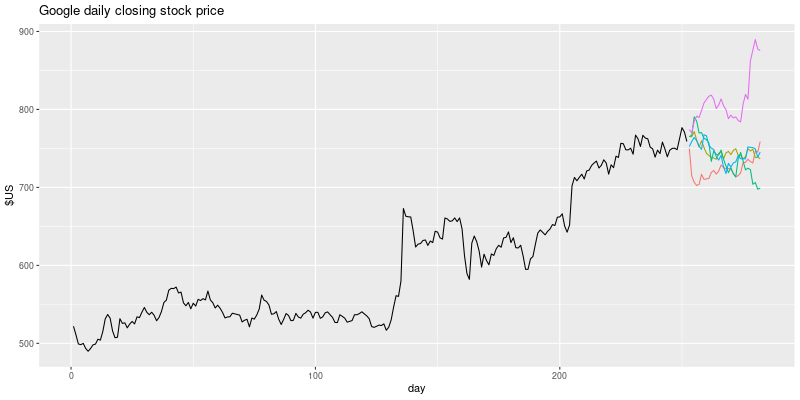

In [94]:
google_sim = (ggplot2.ggplot(google_2015) +
              ggplot2.aes(x = rl('day')) +
              ggplot2.geom_line(ggplot2.aes(y = rl('Close'))) +
              ggplot2.geom_line(ggplot2.aes(y = rl('.sim'), colour = rl('as.factor(.rep)')), data = sim) +
              ggplot2.labs(title="Google daily closing stock price", y="$US" ) +
              ggplot2.guides(colour = "none")
             )
display(image_png(google_sim))
#google_2015 |>
#  ggplot(aes(x = day)) +
#  geom_line(aes(y = Close)) +
#  geom_line(aes(y = .sim, colour = as.factor(.rep)),
#    data = sim) +
#  labs(title="Google daily closing stock price", y="$US" ) +
#  guides(colour = "none")

In [95]:
fc = forecast(fit, h = 30, bootstrap = True)
print(fc)
#fc <- fit |> forecast(h = 30, bootstrap = TRUE)
#fc

# A fable: 30 x 5 [1]
# Key:     Symbol, .model [1]
   Symbol .model   day        Close .mean
   <chr>  <chr>  <dbl>       <dist> <dbl>
 1 GOOG   NAIVE    253 sample[5000]  759.
 2 GOOG   NAIVE    254 sample[5000]  759.
 3 GOOG   NAIVE    255 sample[5000]  759.
 4 GOOG   NAIVE    256 sample[5000]  759.
 5 GOOG   NAIVE    257 sample[5000]  759.
 6 GOOG   NAIVE    258 sample[5000]  759.
 7 GOOG   NAIVE    259 sample[5000]  759.
 8 GOOG   NAIVE    260 sample[5000]  759.
 9 GOOG   NAIVE    261 sample[5000]  759.
10 GOOG   NAIVE    262 sample[5000]  759.
# ℹ 20 more rows
# ℹ Use `print(n = ...)` to see more rows



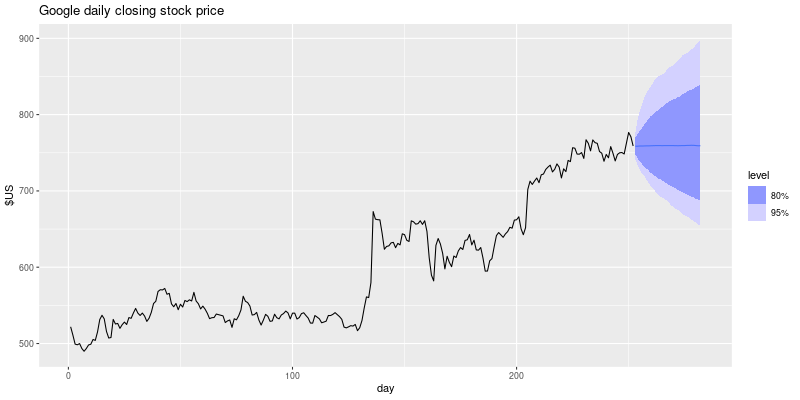

In [96]:
#autoplot = fabletools.autoplot_fbl_ts
#google_fc = autoplot(fc, google_2015)
#display(image_png(google_fc))
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['google_2015'] = google_2015
    rcode = ('''
        fabletools::autoplot(fc, google_2015) +
          labs(title = "Google daily closing stock price", y="$US")
        ''')
    display(image_png(ro.r(rcode)))
#autoplot(fc, google_2015) +
#  labs(title="Google daily closing stock price", y="$US" )

In [97]:
forecast = fabletools.forecast_mdl_df
distributional = importr('distributional')
google_hilo_1000 = distributional.hilo(
    forecast(
        fabletools.model(
        google_2015,
        NAIVE = fable.NAIVE(rl('Close'))
        ),
        h = 10,
        booststrap = True,
        times = 1000
    )
)
print(google_hilo_1000)
#google_2015 |>
#  model(NAIVE(Close)) |>
#  forecast(h = 10, bootstrap = TRUE, times = 1000) |>
#  hilo()

# A tsibble: 10 x 7 [1]
# Key:       Symbol, .model [1]
   Symbol .model   day
   <chr>  <chr>  <dbl>
 1 GOOG   NAIVE    253
 2 GOOG   NAIVE    254
 3 GOOG   NAIVE    255
 4 GOOG   NAIVE    256
 5 GOOG   NAIVE    257
 6 GOOG   NAIVE    258
 7 GOOG   NAIVE    259
 8 GOOG   NAIVE    260
 9 GOOG   NAIVE    261
10 GOOG   NAIVE    262
# ℹ 4 more variables: Close <dist>, .mean <dbl>, `80%` <hilo>, `95%` <hilo>



## 5.6 Forecasting using transformations

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



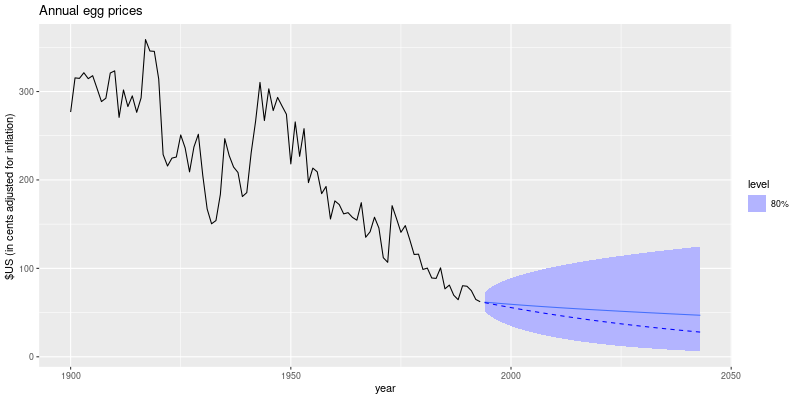

In [98]:
forecast = fabletools.forecast_mdl_df
autoplot = fabletools.autoplot_fbl_ts
rlevel = ro.FloatVector([0.8])[0]
ro.globalenv['rlevel'] = rlevel
prices = data(fpp3).fetch('prices')['prices']
eggs = (DataFrame(prices)
          .filter(rl('!is.na(eggs)'))
          .select(rl('eggs'))
         )
with ro.local_context() as lc:
    lc['prices'] = prices
    rcode = ('''
        fc <- prices |>
              filter(!is.na(eggs)) |>
              model(RW(log(eggs) ~ drift())) |>
              forecast(h = 50) |>
              mutate(.median = median(eggs))
        ''')
    ro.r(rcode)
    fc = lc['fc']

    rcode2 = ('''
        fabletools::autoplot(fc,
                             prices |> filter(!is.na(eggs)),
                             level = 80) +
            ggplot2::geom_line(aes(y = .median), data = fc, linetype = 2, col = "blue") +
            labs(title = "Annual egg prices",
                 y = "$US (in cents adjusted for inflation) ")
        ''')
    display(image_png(ro.r(rcode2)))
#print(fc)

## 5.7 Forecasting with decomposition

In [99]:
us_employment = data(fpp3).fetch('us_employment')['us_employment']
us_retail_employment = (
    DataFrame(us_employment)
    .filter(rl('year(Month) >= 1990'), rl('Title == "Retail Trade"'))
    .select(rl('-Series_ID'))
)
print(us_retail_employment)

# A tsibble: 357 x 3 [1M]
      Month Title        Employed
      <mth> <chr>           <dbl>
 1 1990 Jan Retail Trade   13256.
 2 1990 Feb Retail Trade   12966.
 3 1990 Mar Retail Trade   12938.
 4 1990 Apr Retail Trade   13012.
 5 1990 May Retail Trade   13108.
 6 1990 Jun Retail Trade   13183.
 7 1990 Jul Retail Trade   13170.
 8 1990 Aug Retail Trade   13160.
 9 1990 Sep Retail Trade   13113.
10 1990 Oct Retail Trade   13185.
# ℹ 347 more rows
# ℹ Use `print(n = ...)` to see more rows



In [100]:
components = fabletools.components_mdl_df
dcmp = fabletools.model(us_retail_employment, feasts.STL(rl('Employed')))
dcmp = DataFrame(components(dcmp)).select(rl('-".model"'))
print(dcmp)                 
#dcmp <- us_retail_employment |>
#  model(stl = STL(Employed))
#print(components(dcmp))

# A tsibble: 357 x 6 [1M]
      Month Employed  trend season_year remainder season_adjust
      <mth>    <dbl>  <dbl>       <dbl>     <dbl>         <dbl>
 1 1990 Jan   13256. 13288.      -33.0      0.836        13289.
 2 1990 Feb   12966. 13269.     -258.     -44.6          13224.
 3 1990 Mar   12938. 13250.     -290.     -22.1          13228.
 4 1990 Apr   13012. 13231.     -220.       1.05         13232.
 5 1990 May   13108. 13211.     -114.      11.3          13223.
 6 1990 Jun   13183. 13192.      -24.3     15.5          13207.
 7 1990 Jul   13170. 13172.      -23.2     21.6          13193.
 8 1990 Aug   13160. 13151.       -9.52    17.8          13169.
 9 1990 Sep   13113. 13131.      -39.5     22.0          13153.
10 1990 Oct   13185. 13110.       61.6     13.2          13124.
# ℹ 347 more rows
# ℹ Use `print(n = ...)` to see more rows



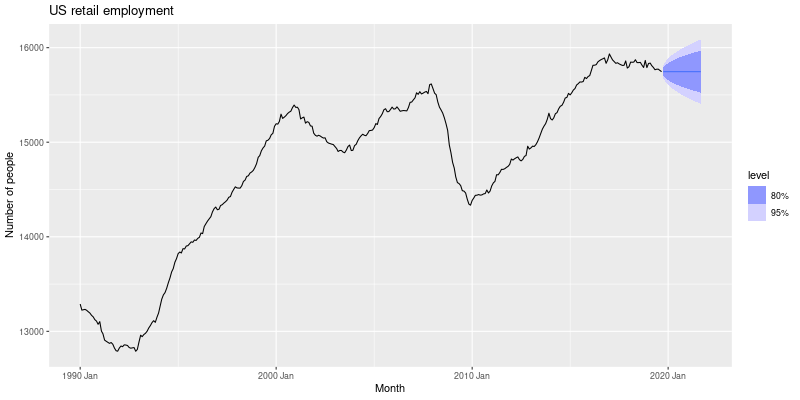

In [101]:
forecast = fabletools.forecast_mdl_df
autoplot = fabletools.autoplot_fbl_ts
dcmp_fc = forecast(
    fabletools.model(
        dcmp,
        fable.NAIVE(rl('season_adjust'))
        )
    )
#dcmp_pp = autoplot(dcmp_fc, dcmp)
#display(image_png(dcmp_pp))
with ro.local_context() as lc:
    lc['dcmp_fc'] = dcmp_fc
    lc['dcmp'] = dcmp
    rcode = ('''
        fabletools::autoplot(dcmp_fc, dcmp) +
            labs(y = "Number of people",
                 title = "US retail employment")
        ''')
    display(image_png(ro.r(rcode)))

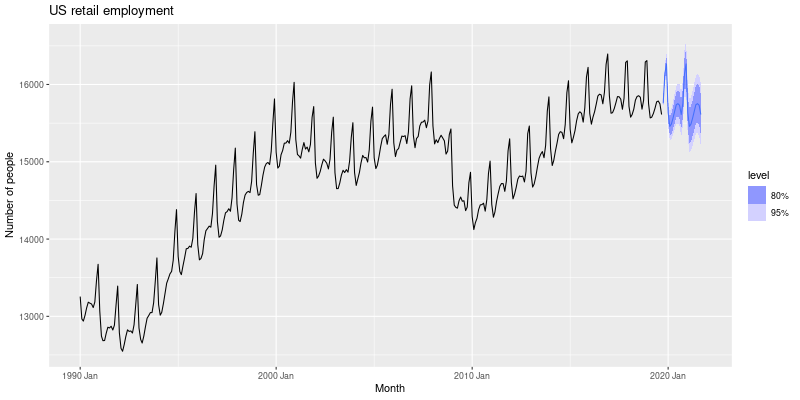

In [102]:
us_retail_fc = forecast(
    fabletools.model(
        us_retail_employment,
        stlf = fabletools.decomposition_model(
            feasts.STL(rl('Employed ~ trend(window = 7)'), robust = True),
            fable.NAIVE(rl('season_adjust'))
        )
    )
)
#us_retail_pp = autoplot(us_retail_fc, us_retail_employment)
#display(image_png(us_retail_pp))
with ro.local_context() as lc:
    lc['us_retail_fc'] = us_retail_fc
    lc['us_retail_employment'] = us_retail_employment
    rcode = ('''
        fabletools::autoplot(us_retail_fc, us_retail_employment) +
            labs(y = "Number of people",
                 title = "US retail employment")
        ''')
    display(image_png(ro.r(rcode)))

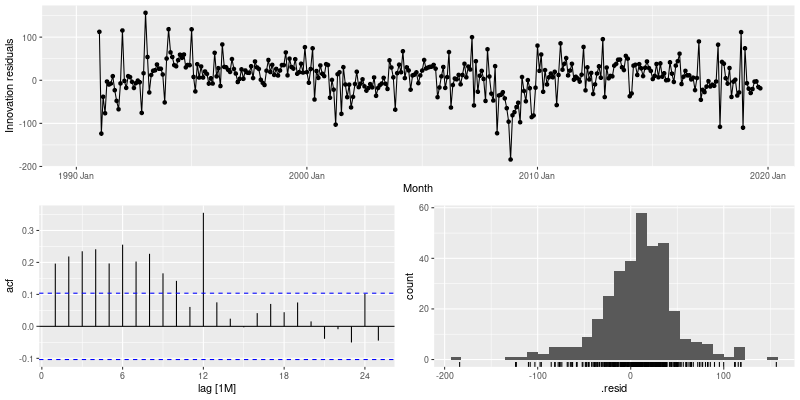

In [103]:
fit_dcmp = fabletools.model(
    us_retail_employment,
    stlf = fabletools.decomposition_model(
        feasts.STL(rl('Employed ~ trend(window = 7)'), robust = True),
        fable.NAIVE(rl('season_adjust'))
    )
)
fit_dcmp_pp = feasts.gg_tsresiduals(fit_dcmp)
display(image_png(fit_dcmp_pp))

## 5.8 Evluating point forecast accuracy

In [104]:
forecast = fabletools.forecast_mdl_df
recent_production = (
    DataFrame(data(tsibbledata).fetch('aus_production')['aus_production'])
    .filter(rl('year(Quarter) >= 1992'))
)
train = (
    DataFrame(recent_production)
    .filter(rl('year(Quarter) <= 2007'))
)
beer_fit = (
    fabletools.model(
        train,
        Mean = fable.MEAN(rl('Beer')),
        Naive = fable.NAIVE(rl('Beer')),
        Seasonal_naive = fable.SNAIVE(rl('Beer')),
        Drift = fable.RW(rl('Beer ~ drift()'))
    )
)
beer_fc = forecast(beer_fit, h = 10)

In [105]:
accuracy = fabletools.accuracy_mdl_df
dplyr = importr('dplyr')
train_accuracy = (
    DataFrame(
        dplyr.arrange(
            accuracy(beer_fit),
            rl('`.model`')
        )
    )
    .select(rl('`.model`'), rl('`.type`'), rl('RMSE'), rl('MAE'), rl('MAPE'), rl('MASE'), rl('RMSSE'))
)
print(train_accuracy)

# A tibble: 4 × 7
  .model         .type     RMSE   MAE  MAPE  MASE RMSSE
  <chr>          <chr>    <dbl> <dbl> <dbl> <dbl> <dbl>
1 Drift          Training  65.3  54.8 12.2   3.83  3.89
2 Mean           Training  43.6  35.2  7.89  2.46  2.60
3 Naive          Training  65.3  54.7 12.2   3.83  3.89
4 Seasonal_naive Training  16.8  14.3  3.31  1     1   



In [106]:
accuracy = fabletools.accuracy_fbl_ts
test_accuracy = (
    DataFrame(
        dplyr.arrange(
            accuracy(beer_fc, recent_production),
            rl('`.model`')
        )
    )
    .select(rl('`.model`'), rl('`.type`'), rl('RMSE'), rl('MAE'), rl('MAPE'), rl('MASE'), rl('RMSSE'))
)
print(test_accuracy)

# A tibble: 4 × 7
  .model         .type  RMSE   MAE  MAPE  MASE RMSSE
  <chr>          <chr> <dbl> <dbl> <dbl> <dbl> <dbl>
1 Drift          Test   64.9  58.9 14.6  4.12  3.87 
2 Mean           Test   38.4  34.8  8.28 2.44  2.29 
3 Naive          Test   62.7  57.4 14.2  4.01  3.74 
4 Seasonal_naive Test   14.3  13.4  3.17 0.937 0.853



In [107]:
dplyr = importr("dplyr")
last_20s_observation =(
    dplyr.slice(
        data(tsibbledata).fetch('aus_production')['aus_production'],
        rl('n() - 19:0') #extracts the last 20 observations (5 years)
    )
)
print(last_20s_observation)
#aus_production |>
#  slice(n()-19:0)

# A tsibble: 20 x 7 [1Q]
   Quarter  Beer Tobacco Bricks Cement Electricity   Gas
     <qtr> <dbl>   <dbl>  <dbl>  <dbl>       <dbl> <dbl>
 1 2005 Q3   408      NA     NA   2340       56043   221
 2 2005 Q4   482      NA     NA   2265       54992   180
 3 2006 Q1   438      NA     NA   2027       57112   171
 4 2006 Q2   386      NA     NA   2278       57157   224
 5 2006 Q3   405      NA     NA   2427       58400   233
 6 2006 Q4   491      NA     NA   2451       56249   192
 7 2007 Q1   427      NA     NA   2140       56244   187
 8 2007 Q2   383      NA     NA   2362       55036   234
 9 2007 Q3   394      NA     NA   2536       59806   245
10 2007 Q4   473      NA     NA   2562       56411   205
11 2008 Q1   420      NA     NA   2183       59118   194
12 2008 Q2   390      NA     NA   2558       56660   229
13 2008 Q3   410      NA     NA   2612       64067   249
14 2008 Q4   488      NA     NA   2373       59045   203
15 2009 Q1   415      NA     NA   1963       58368   196
16 200

In [108]:
#Slice also works with groups, making it possible to subset observations from each key
aus_retail_group_slice = (
    dplyr.slice(
        DataFrame(
            data(tsibbledata).fetch('aus_retail')['aus_retail']
        )
        .group_by(rl('State'), rl('Industry')),
        rl('1:12')  #will subset the first year of data from each time series in the data
    )
)
print(aus_retail_group_slice)
#aus_retail |>
#  group_by(State, Industry) |>
#  slice(1:12)

# A tsibble: 1,824 x 5 [1M]
# Key:       State, Industry [152]
# Groups:    State, Industry [152]
   State                        Industry           `Series ID`    Month Turnover
   <chr>                        <chr>              <chr>          <mth>    <dbl>
 1 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Apr      4.4
 2 Australian Capital Territory Cafes, restaurant… A3349849A   1982 May      3.4
 3 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Jun      3.6
 4 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Jul      4  
 5 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Aug      3.6
 6 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Sep      4.2
 7 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Oct      4.8
 8 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Nov      5.4
 9 Australian Capital Territory Cafes, restaurant… A3349849A   1982 Dec      6.9
10 Australi

In [109]:
accuracy = fabletools.accuracy_fbl_ts
google_accuracy = (
    DataFrame(
        dplyr.arrange(
            accuracy(google_fc, google_stock),
            rl('`.model`')
        )
    )
    .select(rl('`.model`'), rl('`.type`'), rl('RMSE'), rl('MAE'), rl('MAPE'), rl('MASE'), rl('RMSSE'))
)
print(google_accuracy)
#accuracy(google_fc, google_stock)

# A tibble: 3 × 7
  .model .type  RMSE   MAE  MAPE  MASE RMSSE
  <chr>  <chr> <dbl> <dbl> <dbl> <dbl> <dbl>
1 Drift  Test   53.1  49.8  6.99  6.99  4.74
2 Mean   Test  118.  117.  16.2  16.4  10.5 
3 Naive  Test   43.4  40.4  5.67  5.67  3.88



## 5.9 Evaluating distributional forecast accuracy

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 12 rows containing missing values or values outside the scale range
(`geom_point()`). 

R[write to console]: 3: Removed 12 rows containing non-finite outside the scale range (`stat_bin()`). 

R[write to console]: 4: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 5: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



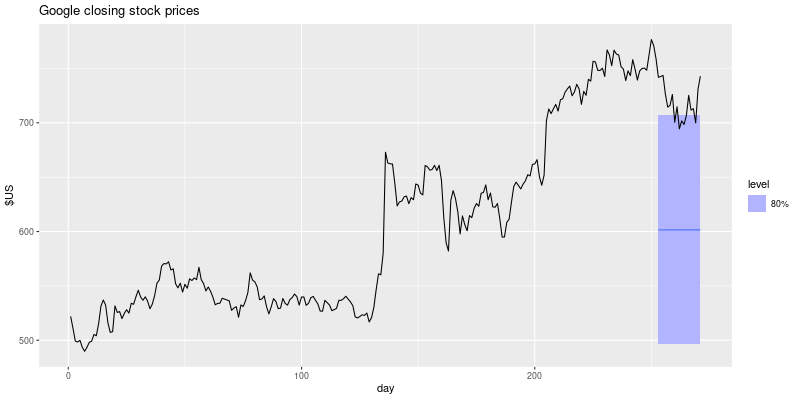

In [110]:
autoplot_fbl = fabletools.autoplot_fbl_ts
#google_fc_mean_plot = (
#    autoplot_fbl(
#        DataFrame(google_fc).filter(rl('.model=="Mean"')),
#        dplyr.bind_rows(google_2015, google_jan_2016),
#        #rl('level=80')
#    )
#)
#display(image_png(google_fc_mean_plot))
with ro.local_context() as lc:
    lc['google_fc'] = google_fc
    lc['google_2015'] = google_2015
    lc['google_jan_2016'] = google_jan_2016
    rcode = ('''
        google_fc |>
          filter(.model == "Mean") |>
          ggplot2::autoplot(bind_rows(google_2015, google_jan_2016), level=80)+
          labs(y = "$US",
               title = "Google closing stock prices")
        ''')
    display(image_png(ro.r(rcode)))


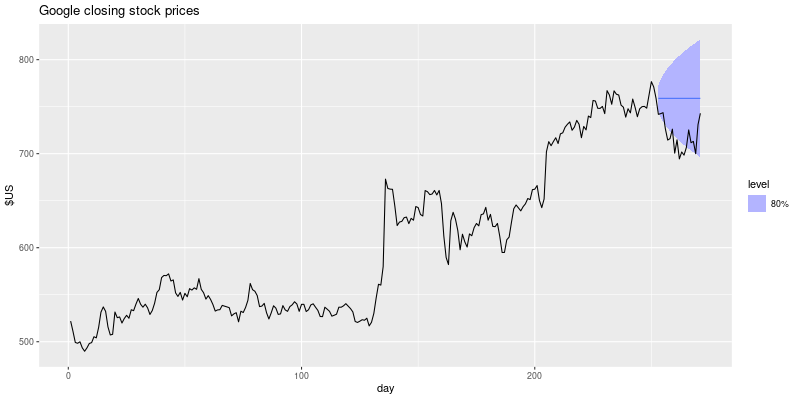

In [111]:
autoplot_fbl = fabletools.autoplot_fbl_ts
#google_fc_naive_plot = (
#    autoplot_fbl(
#        DataFrame(google_fc).filter(rl('.model=="Naive"')),
#        dplyr.bind_rows(google_2015, google_jan_2016),
#        #rl('level=80')
#    )
#)
#display(image_png(google_fc_naive_plot))
with ro.local_context() as lc:
    lc['google_fc'] = google_fc
    lc['google_2015'] = google_2015
    lc['google_jan_2016'] = google_jan_2016
    rcode = ('''
        google_fc |>
          filter(.model == "Naive") |>
          ggplot2::autoplot(bind_rows(google_2015, google_jan_2016), level=80)+
          labs(y = "$US",
               title = "Google closing stock prices")
        ''')
    display(image_png(ro.r(rcode)))
#google_fc |>
#  filter(.model == "Naïve") |>
#  autoplot(bind_rows(google_2015, google_jan_2016), level=80)+
#  labs(y = "$US",
#       title = "Google closing stock prices")

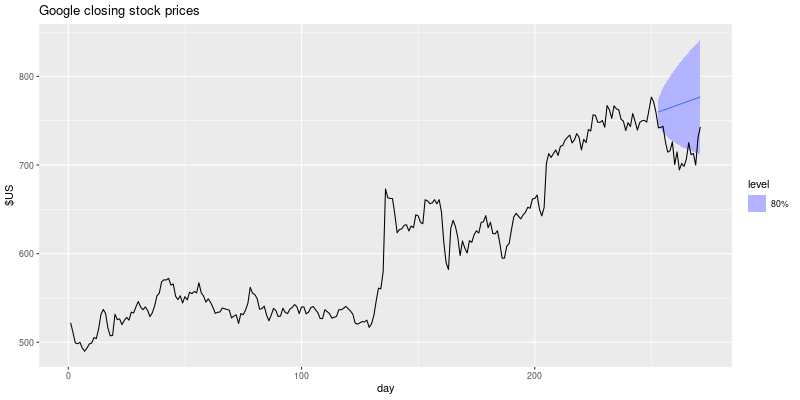

In [112]:
autoplot_fbl = fabletools.autoplot_fbl_ts
#google_fc_drift_plot = (
#    autoplot_fbl(
#        DataFrame(google_fc).filter(rl('.model=="Drift"')),
#        dplyr.bind_rows(google_2015, google_jan_2016),
#        #rl('level=80')
#    )
#)
#display(image_png(google_fc_drift_plot))
with ro.local_context() as lc:
    lc['google_fc'] = google_fc
    lc['google_2015'] = google_2015
    lc['google_jan_2016'] = google_jan_2016
    rcode = ('''
        google_fc |>
          filter(.model == "Drift") |>
          ggplot2::autoplot(bind_rows(google_2015, google_jan_2016), level=80)+
          labs(y = "$US",
               title = "Google closing stock prices")
        ''')
    display(image_png(ro.r(rcode)))

In [113]:
accuracy = fabletools.accuracy_fbl_ts
google_naive_accuracy = (
    accuracy(
        DataFrame(google_fc).filter(rl('.model == "Naive"'), rl('Date == "2016-01-04"')),
        google_stock,
        rl('list(qs=quantile_score)'),
        prob=0.10
    )
)
print(google_naive_accuracy)
#google_fc |>
#  filter(.model == "Naïve", Date == "2016-01-04") |>
#  accuracy(google_stock, list(qs=quantile_score), probs=0.10)

# A tibble: 1 × 4
  .model Symbol .type    qs
  <chr>  <chr>  <chr> <dbl>
1 Naive  GOOG   Test   4.86



In [114]:
accuracy = fabletools.accuracy_fbl_ts
google_naive_accuracy = (
    accuracy(
        DataFrame(google_fc).filter(rl('.model == "Naive"'), rl('Date == "2016-01-04"')),
        google_stock,
        rl('list(qs=quantile_score)'),
        prob=0.9
    )
)
print(google_naive_accuracy)

# A tibble: 1 × 4
  .model Symbol .type    qs
  <chr>  <chr>  <chr> <dbl>
1 Naive  GOOG   Test   6.28



In [115]:
accuracy = fabletools.accuracy_fbl_ts
rlevel = ro.FloatVector([80])[0]
ro.globalenv['rlevel'] = rlevel
google_naive_accuracy = (
    accuracy(
        DataFrame(google_fc).filter(rl('.model == "Naive"'), rl('Date == "2016-01-04"')),
        google_stock,
        rl('list(winkler = winkler_score)'),
        level = rl('rlevel')
    )
)
print(google_naive_accuracy)
#google_fc |>
#  filter(.model == "Naïve", Date == "2016-01-04") |>
#  accuracy(google_stock,
#    list(winkler = winkler_score), level = 80)

# A tibble: 1 × 4
  .model Symbol .type winkler
  <chr>  <chr>  <chr>   <dbl>
1 Naive  GOOG   Test     55.7



In [116]:
accuracy = fabletools.accuracy_fbl_ts
google_crps_accuracy = (
    accuracy(
        google_fc,
        google_stock,
        rl('list(crps = CRPS)') # Continuous Ranked Probability Score or CRPS: its unit is US Dolloar here and Naive is the best
    )
)
print(google_crps_accuracy)
#google_fc |>
#  accuracy(google_stock, list(crps = CRPS))

# A tibble: 3 × 4
  .model Symbol .type  crps
  <chr>  <chr>  <chr> <dbl>
1 Drift  GOOG   Test   33.5
2 Mean   GOOG   Test   76.7
3 Naive  GOOG   Test   26.5



In [117]:
accuracy = fabletools.accuracy_fbl_ts
# Skill scores provide a forecast accuracy measure relative to some benchmark method (often the naive method).
google_skill_accuracy = (
    accuracy(
        google_fc,
        google_stock,
        rl('list(skill = skill_score(CRPS))') # CRPS means using Naive: looking for largest positive values
    )
)
print(google_skill_accuracy)
#google_fc |>
#  accuracy(google_stock, list(skill = skill_score(CRPS)))

# A tibble: 3 × 4
  .model Symbol .type  skill
  <chr>  <chr>  <chr>  <dbl>
1 Drift  GOOG   Test  -0.266
2 Mean   GOOG   Test  -1.90 
3 Naive  GOOG   Test   0    



## 5.10 Time series cross-validation

In [118]:
rInit = ro.IntVector([3])[0]
ro.globalenv['rInit'] = rInit
fb_stock = (
    tsibble.update_tsibble(
        DataFrame(data(tsibbledata).fetch('gafa_stock')['gafa_stock'])
        .filter(rl('Symbol == "FB"'), rl('year(Date) >= 2014'))
        .select(rl('Date'), rl('Close'))
        .mutate(trading_day = rl('row_number()')),
        index = rl('trading_day'), regular = True)
)
fb_stretch = (
    DataFrame(
        tsibble.stretch_tsibble(
            fb_stock,
            1,  # .step
            3   # .init
        )
    )
    .filter(rl('.id != max(.id)'))
    
)
print(fb_stretch)

# A tsibble: 790,650 x 4 [1]
# Key:       .id [1,255]
   Date       Close trading_day   .id
   <date>     <dbl>       <int> <int>
 1 2014-01-02  54.7           1     1
 2 2014-01-03  54.6           2     1
 3 2014-01-06  57.2           3     1
 4 2014-01-02  54.7           1     2
 5 2014-01-03  54.6           2     2
 6 2014-01-06  57.2           3     2
 7 2014-01-07  57.9           4     2
 8 2014-01-02  54.7           1     3
 9 2014-01-03  54.6           2     3
10 2014-01-06  57.2           3     3
# ℹ 790,640 more rows
# ℹ Use `print(n = ...)` to see more rows



In [119]:
fabletools = importr("fabletools")
fit_cv = (
    fabletools.model(
        fb_stretch,
        Drift = fable.RW(rl('Close ~ drift()'))
    )
)
print(fit_cv)

# A mable: 1,255 x 2
# Key:     .id [1,255]
     .id         Drift
   <int>       <model>
 1     1 <RW w/ drift>
 2     2 <RW w/ drift>
 3     3 <RW w/ drift>
 4     4 <RW w/ drift>
 5     5 <RW w/ drift>
 6     6 <RW w/ drift>
 7     7 <RW w/ drift>
 8     8 <RW w/ drift>
 9     9 <RW w/ drift>
10    10 <RW w/ drift>
# ℹ 1,245 more rows
# ℹ Use `print(n = ...)` to see more rows



In [120]:
forecast = fabletools.forecast_mdl_df
fc_cv = forecast(fit_cv, h = 1)
print(fc_cv)

# A fable: 1,255 x 5 [1]
# Key:     .id, .model [1,255]
     .id .model trading_day
   <int> <chr>        <dbl>
 1     1 Drift            4
 2     2 Drift            5
 3     3 Drift            6
 4     4 Drift            7
 5     5 Drift            8
 6     6 Drift            9
 7     7 Drift           10
 8     8 Drift           11
 9     9 Drift           12
10    10 Drift           13
# ℹ 1,245 more rows
# ℹ 2 more variables: Close <dist>, .mean <dbl>
# ℹ Use `print(n = ...)` to see more rows



In [121]:
accuracy_fbl = fabletools.accuracy_fbl_ts
accuracy_mdl = fabletools.accuracy_mdl_df
# Cross-validated
fb_accuracy = accuracy_fbl(fc_cv, fb_stock)
print(fb_accuracy)
# Training set
train_set_accuracy = (
    accuracy_mdl(
        fabletools.model(
            fb_stock,
            Drift = fable.RW(rl('Close ~ drift()'))
        )
    )
)
print(train_set_accuracy)

# A tibble: 1 × 10
  .model .type      ME  RMSE   MAE     MPE  MAPE  MASE RMSSE    ACF1
  <chr>  <chr>   <dbl> <dbl> <dbl>   <dbl> <dbl> <dbl> <dbl>   <dbl>
1 Drift  Test  -0.0529  2.42  1.47 -0.0607  1.27  1.00  1.00 -0.0208

# A tibble: 1 × 10
  .model .type       ME  RMSE   MAE      MPE  MAPE  MASE RMSSE    ACF1
  <chr>  <chr>    <dbl> <dbl> <dbl>    <dbl> <dbl> <dbl> <dbl>   <dbl>
1 Drift  Training     0  2.41  1.46 -0.00571  1.26 0.998  1.00 -0.0205



In [122]:
dplyr = importr("dplyr")
# Time series cross-validation accuracy
google_2015_tr = (
    dplyr.relocate(
        tsibble.stretch_tsibble(
            google_2015,
            1, # .step
            3, # .init
        ),
        rl('Date'), rl('Symbol'), rl('.id')
    )
)
#google_2015_tr <- google_2015 |>
#  stretch_tsibble(.init = 3, .step = 1) |>
#  relocate(Date, Symbol, .id)
print(google_2015_tr)

# A tsibble: 31,875 x 10 [1]
# Key:       Symbol, .id [250]
   Date       Symbol   .id  Open  High   Low Close Adj_Close  Volume   day
   <date>     <chr>  <int> <dbl> <dbl> <dbl> <dbl>     <dbl>   <dbl> <int>
 1 2015-01-02 GOOG       1  526.  528.  521.  522.      522. 1447600     1
 2 2015-01-05 GOOG       1  520.  521.  510.  511.      511. 2059800     2
 3 2015-01-06 GOOG       1  512.  513.  498.  499.      499. 2899900     3
 4 2015-01-02 GOOG       2  526.  528.  521.  522.      522. 1447600     1
 5 2015-01-05 GOOG       2  520.  521.  510.  511.      511. 2059800     2
 6 2015-01-06 GOOG       2  512.  513.  498.  499.      499. 2899900     3
 7 2015-01-07 GOOG       2  504.  504.  497.  498.      498. 2065100     4
 8 2015-01-02 GOOG       3  526.  528.  521.  522.      522. 1447600     1
 9 2015-01-05 GOOG       3  520.  521.  510.  511.      511. 2059800     2
10 2015-01-06 GOOG       3  512.  513.  498.  499.      499. 2899900     3
# ℹ 31,865 more rows
# ℹ Use `print(n = 

In [123]:
# TSCV accuracy
accuracy_fbl = fabletools.accuracy_fbl_ts
accuracy_mdl = fabletools.accuracy_mdl_df
forecast = fabletools.forecast_mdl_df
fc_cv = forecast(fit_cv, h = 1)
# Cross-validated
google_2015_fc_cv = (
    forecast(
        fabletools.model(
            google_2015_tr,
            Drift = fable.RW(rl('Close ~ drift()'))
        ),
        h = 1
    )
)
google_2015_cross_accuracy = (
    accuracy_fbl(
        google_2015_fc_cv, 
        google_2015
    )
)
print(google_2015_cross_accuracy)
# Training set accuracy
google_2015_train_accuracy = (
    accuracy_mdl(
        fabletools.model(
            google_2015,
            Drift = fable.RW(rl('Close ~ drift()'))
        )
    )
)
print(google_2015_train_accuracy)
#google_2015_tr |>
#  model(RW(Close ~ drift())) |>
#  forecast(h = 1) |>
#  accuracy(google_2015)
# Training set accuracy
#google_2015 |>
#  model(RW(Close ~ drift())) |>
#  accuracy()

# A tibble: 1 × 11
  .model Symbol .type    ME  RMSE   MAE   MPE  MAPE  MASE RMSSE   ACF1
  <chr>  <chr>  <chr> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl>  <dbl>
1 Drift  GOOG   Test  0.726  11.3  7.26 0.112  1.19  1.02  1.01 0.0985

# A tibble: 1 × 11
  Symbol .model .type           ME  RMSE   MAE     MPE  MAPE  MASE RMSSE   ACF1
  <chr>  <chr>  <chr>        <dbl> <dbl> <dbl>   <dbl> <dbl> <dbl> <dbl>  <dbl>
1 GOOG   Drift  Training -2.97e-14  11.1  7.16 -0.0267  1.18  1.00 0.996 0.0976



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 3: The future dataset is incomplete, incomplete out-of-sample data will be treated as missing. 
1 observation is missing at 253 

R[write to console]: 4: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contai

# A fable: 2,000 x 7 [1]
# Key:     Symbol, .id, .model [250]
   Symbol   .id .model   day
   <chr>  <int> <chr>  <dbl>
 1 GOOG       1 Drift      4
 2 GOOG       1 Drift      5
 3 GOOG       1 Drift      6
 4 GOOG       1 Drift      7
 5 GOOG       1 Drift      8
 6 GOOG       1 Drift      9
 7 GOOG       1 Drift     10
 8 GOOG       1 Drift     11
 9 GOOG       2 Drift      5
10 GOOG       2 Drift      6
# ℹ 1,990 more rows
# ℹ 3 more variables: Close <dist>, .mean <dbl>, h <int>
# ℹ Use `print(n = ...)` to see more rows

# A tibble: 8 × 11
      h .model .type    ME  RMSE   MAE   MPE  MAPE  MASE RMSSE   ACF1
  <int> <chr>  <chr> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl>  <dbl>
1     1 Drift  Test  0.726  11.3  7.26 0.112  1.19  1.02  1.01 0.0985
2     2 Drift  Test  1.52   16.9 11.0  0.228  1.82  1.54  1.51 0.509 
3     3 Drift  Test  2.34   20.7 14.0  0.350  2.32  1.96  1.85 0.668 
4     4 Drift  Test  3.15   23.7 16.0  0.474  2.65  2.24  2.12 0.749 
5     5 Drift  Test  3.93   26.

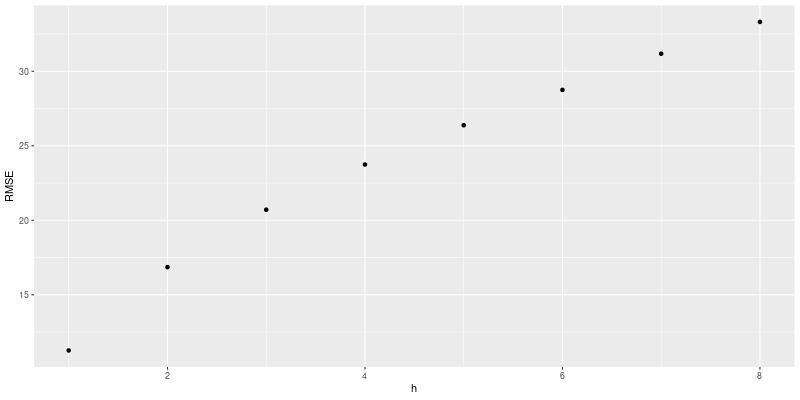

In [124]:
fabletools = importr("fabletools")
accuracy_fbl = fabletools.accuracy_fbl_ts
google_2015_tr = (
    dplyr.relocate(
        tsibble.stretch_tsibble(
            google_2015,
            1, # .step
            3, # .init
        ),
        rl('Date'), rl('Symbol'), rl('.id')
    )
)
google_2015_fc_cv = (
    forecast(
        fabletools.model(
            google_2015_tr,
            Drift = fable.RW(rl('Close ~ drift()'))
        ),
        h = 8
    )
)
#print(google_2015_fc_cv)
fc = (
    fabletools.as_fable(
        (DataFrame(google_2015_fc_cv)
        .group_by(rl('.id'))
        .mutate(h = rl('row_number()'))
        .ungroup()),
        response = "Close",
        distribution = rl('Close')
    )
)
print(fc)
fc_accuracy = (
    accuracy_fbl(
        fc, 
        google_2015,
        by = ro.StrVector({"h", ".model"})
    )
)
print(fc_accuracy)
fc_plot = (
    ggplot2.ggplot(fc_accuracy) +
    ggplot2.aes(x = rl('h'), y = rl('RMSE')) +
    ggplot2.geom_point()
)
display(image_png(fc_plot))
#google_2015_tr <- google_2015 |>
#  stretch_tsibble(.init = 3, .step = 1)
#fc <- google_2015_tr |>
#  model(RW(Close ~ drift())) |>
#  forecast(h = 8) |>
#  group_by(.id) |>
#  mutate(h = row_number()) |>
#  ungroup() |>
#  as_fable(response = "Close", distribution = Close)
#fc |>
#  accuracy(google_2015, by = c("h", ".model")) |>
#  ggplot(aes(x = h, y = RMSE)) +
#  geom_point()

# 7 Time series regression models
## 7.1 The linear model

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



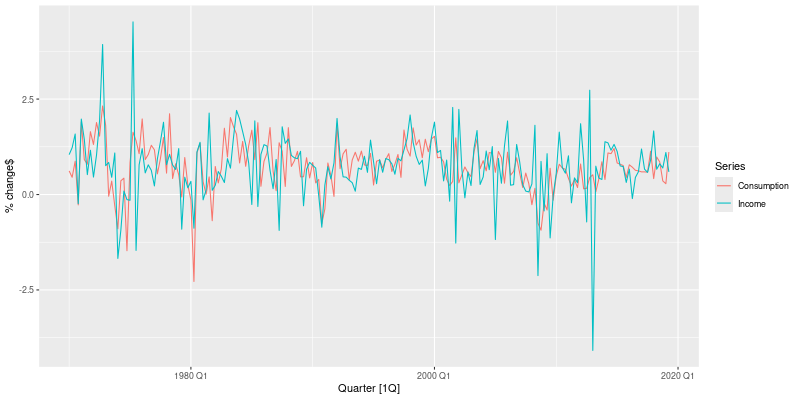

In [125]:
tidyr = importr('tidyr')
rggplot2 = importr('ggplot2')
autoplot_ts = rggplot2.autoplot
us_change = (
    tidyr.pivot_longer(
        data(fpp3).fetch('us_change')['us_change'],
        cols = ro.StrVector(["Consumption", "Income"]), 
        names_to = "Series")
)
#print(us_change)
#pp_us_change = autoplot_ts(us_change, rl('value'))
#display(image_png(pp_us_change))
with ro.local_context() as lc:
    lc['us_change'] = us_change
    rcode = ('''
        ggplot2::autoplot(us_change, value) +
          labs(y = "% change$")
        ''')
    display(image_png(ro.r(rcode)))
#us_change |>
#  pivot_longer(c(Consumption, Income), names_to="Series") |>
#  autoplot(value) +
#  labs(y = "% change")

`geom_smooth()` using formula = 'y ~ x'


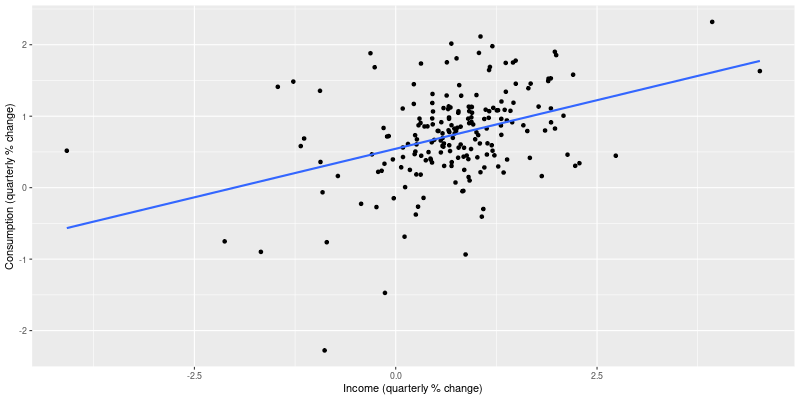

In [126]:
us_change = data(fpp3).fetch('us_change')['us_change']
gg_us_change = (
    ggplot2.ggplot(us_change) +
    ggplot2.aes(x = rl('Income'), y = rl('Consumption')) +
    ggplot2.labs(y = "Consumption (quarterly % change)",
                 x = "Income (quarterly % change)") +
    ggplot2.geom_point() +
    ggplot2.geom_smooth(method = "lm", se = False)
)
display(image_png(gg_us_change))
#us_change |>
#  ggplot(aes(x = Income, y = Consumption)) +
#  labs(y = "Consumption (quarterly % change)",
#       x = "Income (quarterly % change)") +
#  geom_point() +
#  geom_smooth(method = "lm", se = FALSE)

In [127]:
fit_cons = (
    fabletools.model(
        us_change,
        lm = fable.TSLM(rl('Consumption ~ Income'))
    )
)
print(fabletools.report(fit_cons))

Series: Consumption 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-2.58236 -0.27777  0.01862  0.32330  1.42229 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.54454    0.05403  10.079  < 2e-16 ***
Income       0.27183    0.04673   5.817  2.4e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5905 on 196 degrees of freedom
Multiple R-squared: 0.1472,	Adjusted R-squared: 0.1429
F-statistic: 33.84 on 1 and 196 DF, p-value: 2.4022e-08
# A mable: 1 x 1
       lm
  <model>
1  <TSLM>



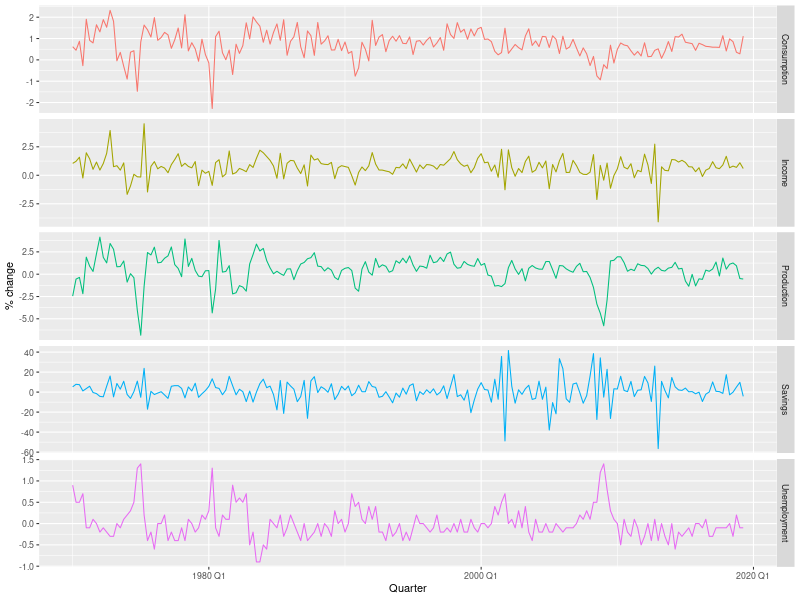

In [128]:
mg_us_change = (
    ggplot2.ggplot(
        tidyr.pivot_longer(
            us_change,
            #(DataFrame(us_change)
            # .select(rl('-Consumption'), rl('-Income'))),
            rl('-Quarter'))) +
    ggplot2.aes(x = rl('Quarter'), y = rl('value'), colour = rl('name')) +
    ggplot2.labs(y = "% change") +
    ggplot2.geom_line() +
    ggplot2.facet_grid(rl('name ~ .'), scales = "free_y") +
    ggplot2.guides(colour = "none")
)
display(image_png(mg_us_change, height=600))
#us_change |>
#  select(-Consumption, -Income) |>
#  pivot_longer(-Quarter) |>
#  ggplot(aes(Quarter, value, colour = name)) +
#  geom_line() +
#  facet_grid(name ~ ., scales = "free_y") +
#  guides(colour = "none") +
#  labs(y="% change")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



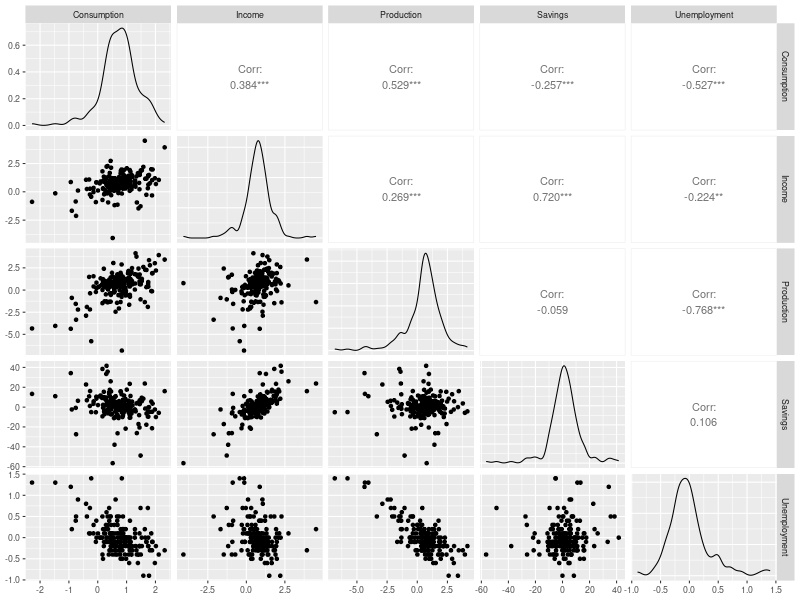

In [129]:
GGally = importr("GGally")
ggpairs_us = GGally.ggpairs(us_change, columns = rl('2:6'))
display(image_png(ggpairs_us, height=600))
#us_change |>
#  GGally::ggpairs(columns = 2:6)

## 7.2 Least squares estimation

In [130]:
fit_consMR = (
    fabletools.model(
        us_change,
        tlm = fable.TSLM(rl('Consumption ~ Income + Production + Unemployment + Savings'))
    )
)
print(fabletools.report(fit_consMR))
#fit_consMR <- us_change |>
#  model(tslm = TSLM(Consumption ~ Income + Production +
#                                    Unemployment + Savings))
#report(fit_consMR)

Series: Consumption 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-0.90555 -0.15821 -0.03608  0.13618  1.15471 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   0.253105   0.034470   7.343 5.71e-12 ***
Income        0.740583   0.040115  18.461  < 2e-16 ***
Production    0.047173   0.023142   2.038   0.0429 *  
Unemployment -0.174685   0.095511  -1.829   0.0689 .  
Savings      -0.052890   0.002924 -18.088  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3102 on 193 degrees of freedom
Multiple R-squared: 0.7683,	Adjusted R-squared: 0.7635
F-statistic:   160 on 4 and 193 DF, p-value: < 2.22e-16
# A mable: 1 x 1
      tlm
  <model>
1  <TSLM>



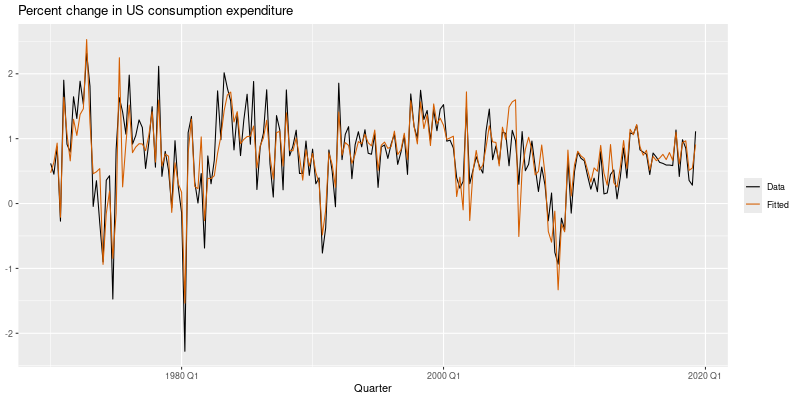

In [131]:
augment = fabletools.augment_mdl_df
aug_us_change = (
    ggplot2.ggplot(augment(fit_consMR)) +
    ggplot2.aes(x = rl('Quarter')) +
    ggplot2.labs(y = rl('NULL'),
                 title = "Percent change in US consumption expenditure") +
    ggplot2.geom_line(ggplot2.aes(y = rl('Consumption'), colour = "Data")) +
    ggplot2.geom_line(ggplot2.aes(y = rl('.fitted'), colour = "Fitted")) + 
    ggplot2.scale_colour_manual(values = rl('c(Data="black",Fitted="#D55E00")')) +
    ggplot2.guides(colour = ggplot2.guide_legend(title = rl("NULL")))
)
display(image_png(aug_us_change))
#augment(fit_consMR) |>
#  ggplot(aes(x = Quarter)) +
#  geom_line(aes(y = Consumption, colour = "Data")) +
#  geom_line(aes(y = .fitted, colour = "Fitted")) +
#  labs(y = NULL,
#    title = "Percent change in US consumption expenditure"
#  ) +
#  scale_colour_manual(values=c(Data="black",Fitted="#D55E00")) +
#  guides(colour = guide_legend(title = NULL))

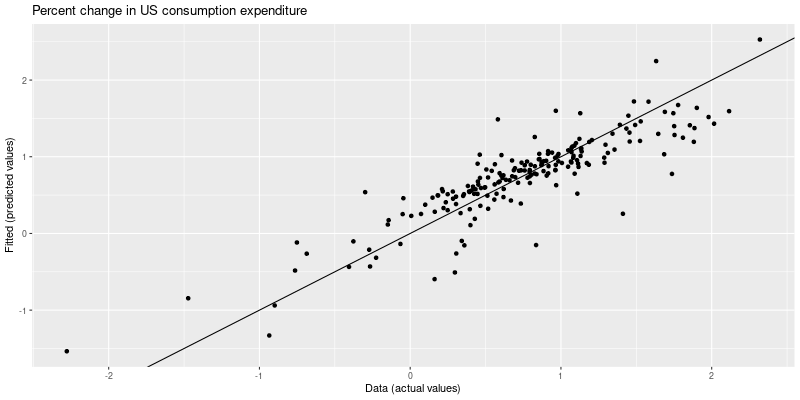

In [132]:
aug_us_change = (
    ggplot2.ggplot(augment(fit_consMR)) +
    ggplot2.aes(x = rl('Consumption'), y = rl('.fitted')) +
    ggplot2.labs(y = "Fitted (predicted values)",
                 x = "Data (actual values)",
                 title = "Percent change in US consumption expenditure") +
    ggplot2.geom_point() +
    ggplot2.geom_abline(intercept = 0, slope = 1) 
)
display(image_png(aug_us_change))
#augment(fit_consMR) |>
#  ggplot(aes(x = Consumption, y = .fitted)) +
#  geom_point() +
#  labs(
#    y = "Fitted (predicted values)",
#    x = "Data (actual values)",
#    title = "Percent change in US consumption expenditure"
#  ) +
#  geom_abline(intercept = 0, slope = 1)

## 7.3 Evaluating the regression model

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



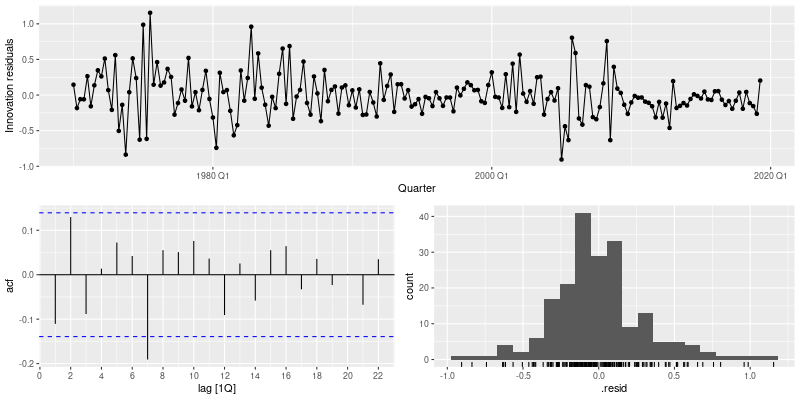

In [133]:
feasts = importr("feasts")
fit_consMR_pp = feasts.gg_tsresiduals(fit_consMR)
display(image_png(fit_consMR_pp))
#fit_consMR |> gg_tsresiduals()

In [134]:
augment = fabletools.augment_mdl_df
fit_consMR_features = fabletools.features(augment(fit_consMR), rl('.innov'), features = ro.ListVector({'ljung_box' : rl('ljung_box')}), lag = 10) 
print(fit_consMR_features)
#augment(fit_consMR) |>
#  features(.innov, ljung_box, lag = 10)

# A tibble: 1 × 3
  .model ljung_box_lb_stat ljung_box_lb_pvalue
  <chr>              <dbl>               <dbl>
1 tlm                 18.9              0.0420



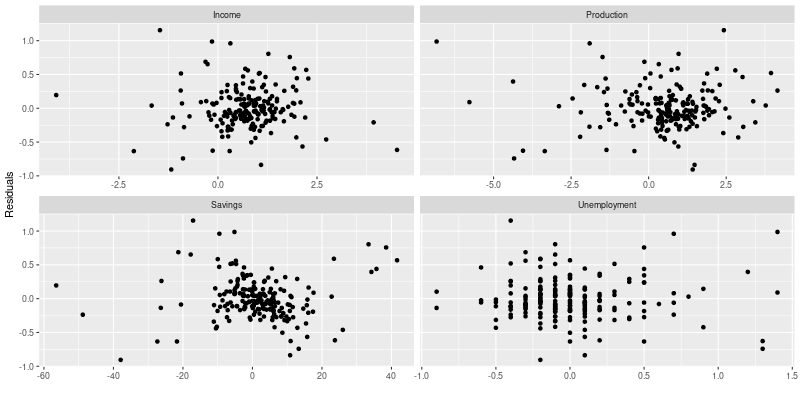

In [135]:
residuals = fabletools.residuals_mdl_df
res_us_change = (
    ggplot2.ggplot(
        tidyr.pivot_longer(
            (DataFrame(us_change)
             .left_join(residuals(fit_consMR), by = "Quarter")),
            rl('Income:Unemployment'),
            names_to = "regressor",
            values_to = "x"
            )) +
    ggplot2.aes(x = rl('x'), y = rl('.resid')) +
    ggplot2.labs(y = "Residuals", x = "") +
    ggplot2.geom_point() +
    ggplot2.facet_wrap(rl('. ~ regressor'), scales = "free_x") 
)
display(image_png(res_us_change))
#us_change |>
#  left_join(residuals(fit_consMR), by = "Quarter") |>
#  pivot_longer(Income:Unemployment,
#               names_to = "regressor", values_to = "x") |>
#  ggplot(aes(x = x, y = .resid)) +
#  geom_point() +
#  facet_wrap(. ~ regressor, scales = "free_x") +
#  labs(y = "Residuals", x = "")

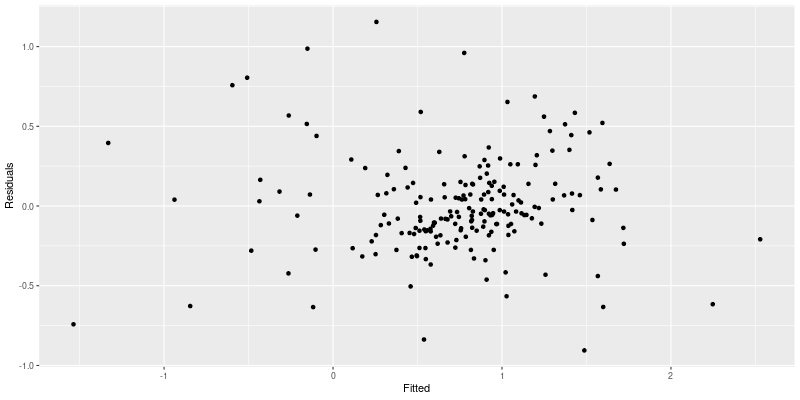

In [136]:
augment = fabletools.augment_mdl_df
resfit_consMR = (
    ggplot2.ggplot(augment(fit_consMR)) +
    ggplot2.aes(x = rl('.fitted'), y = rl('.resid')) +
    ggplot2.geom_point() +
    ggplot2.labs(x = "Fitted", y = "Residuals")
)
display(image_png(resfit_consMR))
#augment(fit_consMR) |>
#  ggplot(aes(x = .fitted, y = .resid)) +
#  geom_point() + labs(x = "Fitted", y = "Residuals")

In [137]:
fit = (
    fabletools.model(
        (DataFrame(data(fpp3).fetch('aus_airpassengers')['aus_airpassengers'])
         .filter(rl('Year <= 2011'))
         .left_join(data(fpp3).fetch('guinea_rice')['guinea_rice'], by = "Year")),
        fable.TSLM(rl('Passengers ~ Production'))
    )
)
print(fabletools.report(fit))
#fit <- aus_airpassengers |>
#  filter(Year <= 2011) |>
#  left_join(guinea_rice, by = "Year") |>
#  model(TSLM(Passengers ~ Production))
#report(fit)

Series: Passengers 
Model: TSLM 

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9448 -1.8917 -0.3272  1.8620 10.4210 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -7.493      1.203  -6.229 2.25e-07 ***
Production    40.288      1.337  30.135  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.239 on 40 degrees of freedom
Multiple R-squared: 0.9578,	Adjusted R-squared: 0.9568
F-statistic: 908.1 on 1 and 40 DF, p-value: < 2.22e-16
# A mable: 1 x 1
  `<environment>`
          <model>
1          <TSLM>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



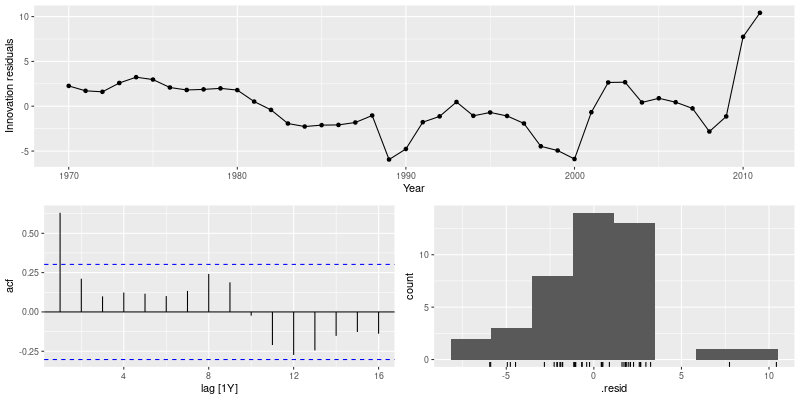

In [138]:
feasts = importr("feasts")
fit_pp = feasts.gg_tsresiduals(fit)
display(image_png(fit_pp))

## 7.4 Some useful predictors

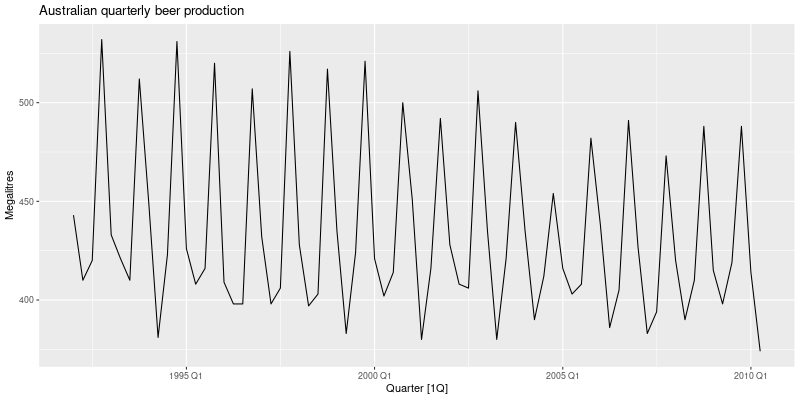

In [139]:
#rggplot2 = importr("ggplot2")
recent_production = (
    DataFrame(data(tsibbledata).fetch('aus_production')['aus_production'])
    .filter(rl('year(Quarter) >= 1992'))
)
#recent_pp = rggplot2.autoplot(recent_production, rl('Beer'))
#display(image_png(recent_pp))
with ro.local_context() as lc:
    lc['recent_production'] = recent_production
    rcode = ('''
        ggplot2::autoplot(recent_production, Beer)+
          labs(y = "Megalitres",
               title = "Australian quarterly beer production")
        ''')
    display(image_png(ro.r(rcode)))
#recent_production <- aus_production |>
#  filter(year(Quarter) >= 1992)
#recent_production |>
#  autoplot(Beer) +
#  labs(y = "Megalitres",
#       title = "Australian quarterly beer production")

In [140]:
fit_beer = (
    fabletools.model(
        recent_production,
        fable.TSLM(rl('Beer ~ trend() + season()'))
    )
)
print(fabletools.report(fit_beer))
#fit_beer <- recent_production |>
#  model(TSLM(Beer ~ trend() + season()))
#report(fit_beer)

Series: Beer 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-42.9029  -7.5995  -0.4594   7.9908  21.7895 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   441.80044    3.73353 118.333  < 2e-16 ***
trend()        -0.34027    0.06657  -5.111 2.73e-06 ***
season()year2 -34.65973    3.96832  -8.734 9.10e-13 ***
season()year3 -17.82164    4.02249  -4.430 3.45e-05 ***
season()year4  72.79641    4.02305  18.095  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 12.23 on 69 degrees of freedom
Multiple R-squared: 0.9243,	Adjusted R-squared: 0.9199
F-statistic: 210.7 on 4 and 69 DF, p-value: < 2.22e-16
# A mable: 1 x 1
  `<environment>`
          <model>
1          <TSLM>



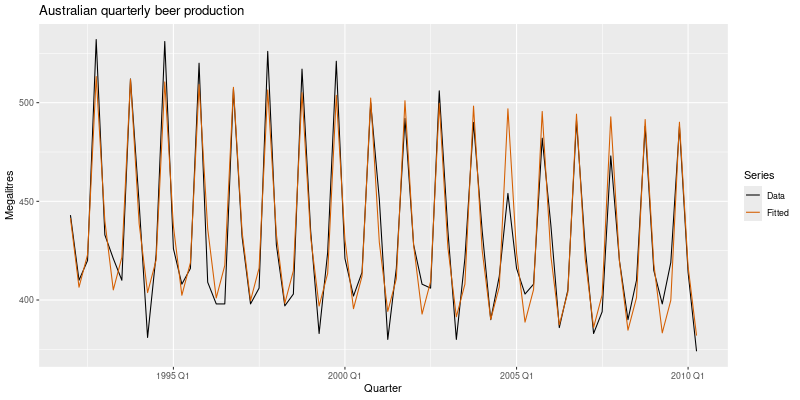

In [141]:
augment = fabletools.augment_mdl_df
aug_fit_beer = (
    ggplot2.ggplot(augment(fit_beer)) +
    ggplot2.aes(x = rl('Quarter')) +
    ggplot2.labs(y = "Megalitres",
                 title = "Australian quarterly beer production") +
    ggplot2.geom_line(ggplot2.aes(y = rl('Beer'), colour = "Data")) +
    ggplot2.geom_line(ggplot2.aes(y = rl('.fitted'), colour = "Fitted")) + 
    ggplot2.scale_colour_manual(values = rl('c(Data="black",Fitted="#D55E00")')) +
    ggplot2.guides(colour = ggplot2.guide_legend(title = "Series"))
)
display(image_png(aug_fit_beer))
#augment(fit_beer) |>
#  ggplot(aes(x = Quarter)) +
#  geom_line(aes(y = Beer, colour = "Data")) +
#  geom_line(aes(y = .fitted, colour = "Fitted")) +
#  scale_colour_manual(
#    values = c(Data = "black", Fitted = "#D55E00")
#  ) +
#  labs(y = "Megalitres",
#       title = "Australian quarterly beer production") +
#  guides(colour = guide_legend(title = "Series"))

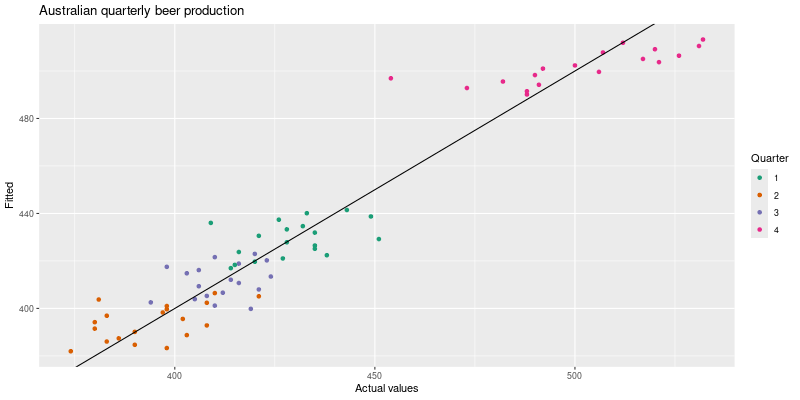

In [142]:
augment = fabletools.augment_mdl_df
aug_fit_beer = (
    ggplot2.ggplot(augment(fit_beer)) +
    ggplot2.aes(x = rl('Beer'), y = rl('.fitted'), colour = rl('factor(quarter(Quarter))')) +
    ggplot2.labs(y = "Fitted", x = "Actual values",
                 title = "Australian quarterly beer production") +
    ggplot2.geom_point() +
    ggplot2.geom_abline(intercept = 0, slope = 1) +
    ggplot2.scale_colour_brewer(palette = "Dark2", name = "Quarter")
    #ggplot2.guides(colour = ggplot2.guide_legend(title = "Quarter"))
)
display(image_png(aug_fit_beer))
#augment(fit_beer) |>
#  ggplot(aes(x = Beer, y = .fitted,
#             colour = factor(quarter(Quarter)))) +
#  geom_point() +
#  labs(y = "Fitted", x = "Actual values",
#       title = "Australian quarterly beer production") +
#  geom_abline(intercept = 0, slope = 1) +
#  guides(colour = guide_legend(title = "Quarter"))

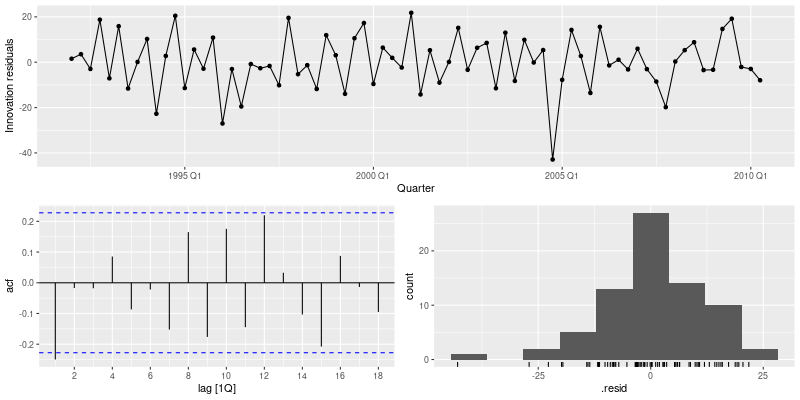

In [143]:
fit_beer_pp = feasts.gg_tsresiduals(fit_beer)
display(image_png(fit_beer_pp))

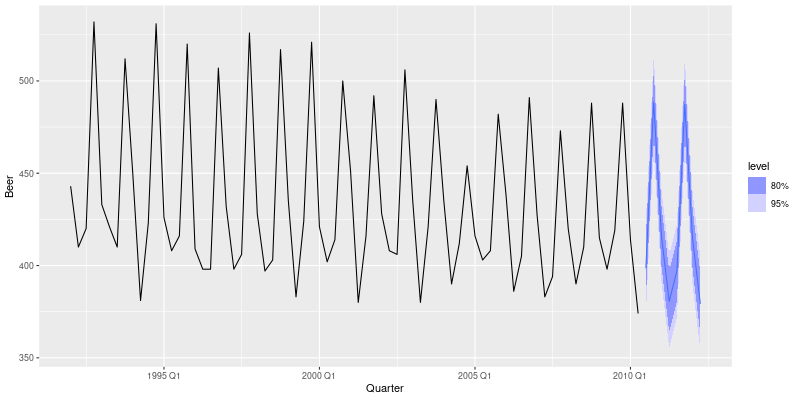

In [144]:
forecast = fabletools.forecast_mdl_df
autoplot_fbl = fabletools.autoplot_fbl_ts
fit_beer_fc_pp = (
    autoplot_fbl(
        forecast(fit_beer),
        recent_production
    )
)
display(image_png(fit_beer_fc_pp))

In [145]:
fourier_beer = (
    fabletools.model(
        recent_production,
        fable.TSLM(rl('Beer ~ trend() + fourier(K = 2)'))
    )
)
print(fabletools.report(fourier_beer))
#fourier_beer <- recent_production |>
#  model(TSLM(Beer ~ trend() + fourier(K = 2)))
#report(fourier_beer)

Series: Beer 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-42.9029  -7.5995  -0.4594   7.9908  21.7895 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        446.87920    2.87321 155.533  < 2e-16 ***
trend()             -0.34027    0.06657  -5.111 2.73e-06 ***
fourier(K = 2)C1_4   8.91082    2.01125   4.430 3.45e-05 ***
fourier(K = 2)S1_4 -53.72807    2.01125 -26.714  < 2e-16 ***
fourier(K = 2)C2_4 -13.98958    1.42256  -9.834 9.26e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 12.23 on 69 degrees of freedom
Multiple R-squared: 0.9243,	Adjusted R-squared: 0.9199
F-statistic: 210.7 on 4 and 69 DF, p-value: < 2.22e-16
# A mable: 1 x 1
  `<environment>`
          <model>
1          <TSLM>



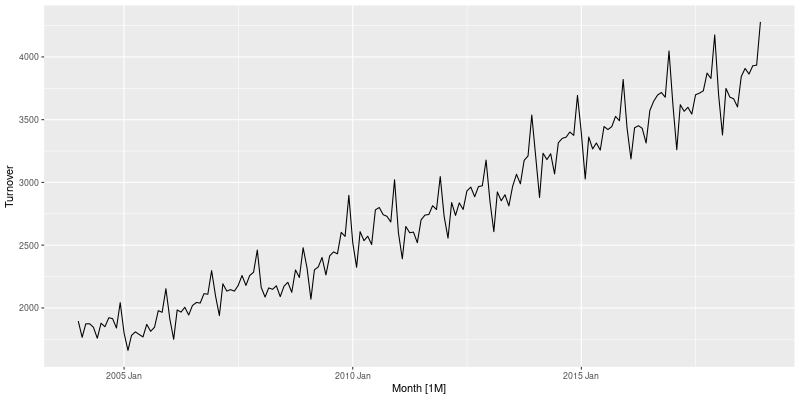

In [146]:
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
aus_cafe = (
    DataFrame(aus_retail)
    .filter(rl('Industry == "Cafes, restaurants and takeaway food services"'),
            rl('year(Month) %in% 2004:2018'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
cafe_pp = rggplot2.autoplot(aus_cafe, rl('Turnover'))
display(image_png(cafe_pp))

In [147]:
fit = (
    fabletools.model(
        aus_cafe, 
        K1 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 1)')),
        K2 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 2)')),
        K3 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 3)')),
        K4 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 4)')),
        K5 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 5)')),
        K6 = fable.TSLM(rl('log(Turnover) ~ trend() + fourier(K = 6)'))
    )
)

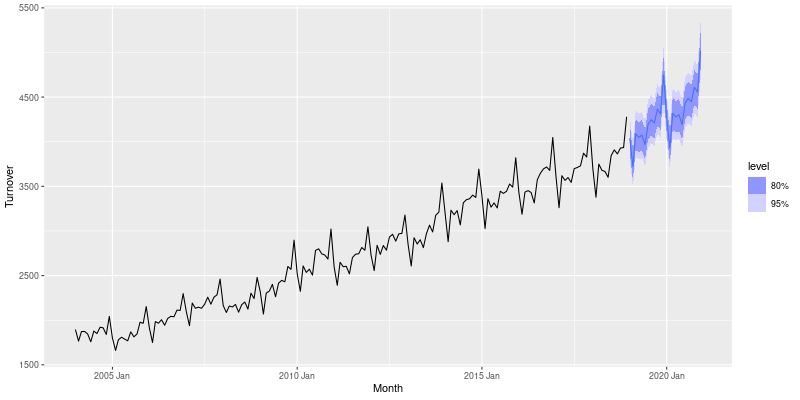

In [148]:
forecast = fabletools.forecast_mdl_df
autoplot_fbl = fabletools.autoplot_fbl_ts
fit_cafe_fc_pp = (
    autoplot_fbl(
        DataFrame(forecast(fit)).filter(rl('.model == "K5"')),
        aus_cafe
    )
)
display(image_png(fit_cafe_fc_pp))

## 7.5 Selecting predictors

In [149]:
fabletools = importr("fabletools")
glance = fabletools.glance_mdl_df
glance_fit = (
    DataFrame(glance(fit_consMR))
    .select(rl('adj_r_squared'), rl('CV'), rl('AIC'), rl('AICc'), rl('BIC'))
)
print(glance_fit)
#glance(fit_consMR) |>
#  select(adj_r_squared, CV, AIC, AICc, BIC)  # by comparing these values (lowest one) to get the best model 

# A tibble: 1 × 5
  adj_r_squared    CV   AIC  AICc   BIC
          <dbl> <dbl> <dbl> <dbl> <dbl>
1         0.763 0.104 -457. -456. -437.



In [150]:
cafe_glance_fit = (
    DataFrame(glance(fit))
    .select(rl('.model'), rl('r_squared'), rl('adj_r_squared'), rl('CV'), rl('AICc'))
)
print(cafe_glance_fit) # The lowest CV or AICc is K5

# A tibble: 6 × 5
  .model r_squared adj_r_squared      CV   AICc
  <chr>      <dbl>         <dbl>   <dbl>  <dbl>
1 K1         0.962         0.962 0.00238 -1085.
2 K2         0.966         0.965 0.00220 -1099.
3 K3         0.976         0.975 0.00157 -1160.
4 K4         0.980         0.979 0.00138 -1183.
5 K5         0.985         0.984 0.00104 -1234.
6 K6         0.985         0.984 0.00105 -1232.



## 7.6 Forecasting with regression

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



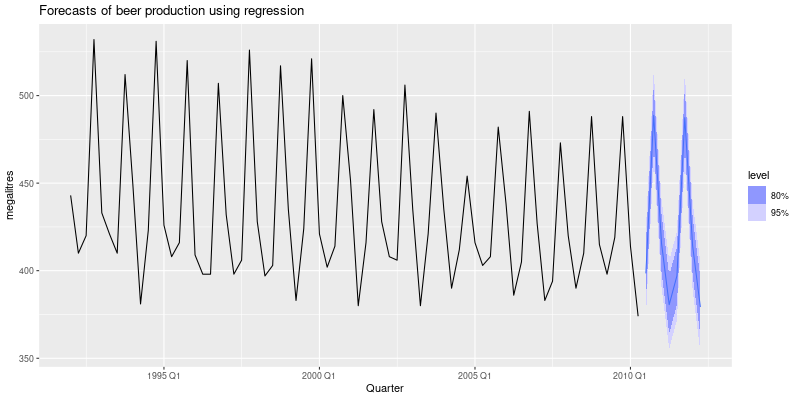

In [151]:
forecast = fabletools.forecast_mdl_df
recent_production = (
    DataFrame(data(tsibbledata).fetch('aus_production')['aus_production'])
    .filter(rl('year(Quarter) >= 1992'))
)
fit_beer = (
    fabletools.model(
        recent_production,
        fable.TSLM(rl('Beer ~ trend() + season()'))
    )
)
fc_beer = forecast(fit_beer)
#fc_beer_plot = rggplot2.autoplot(fc_beer, recent_production)
#display(image_png(fc_beer_plot))
with ro.local_context() as lc:
    lc['fc_beer'] = fc_beer
    lc['recent_production'] = recent_production
    rcode = ('''
        ggplot2::autoplot(fc_beer, recent_production) +
          labs(y = "megalitres",
               title = "Forecasts of beer production using regression")
        ''')
    display(image_png(ro.r(rcode)))
#recent_production <- aus_production |>
#  filter(year(Quarter) >= 1992)
#fit_beer <- recent_production |>
#  model(TSLM(Beer ~ trend() + season()))
#fc_beer <- forecast(fit_beer)
#fc_beer |>
#  autoplot(recent_production) +
#  labs(
#    title = "Forecasts of beer production using regression",
#    y = "megalitres"
#  )

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



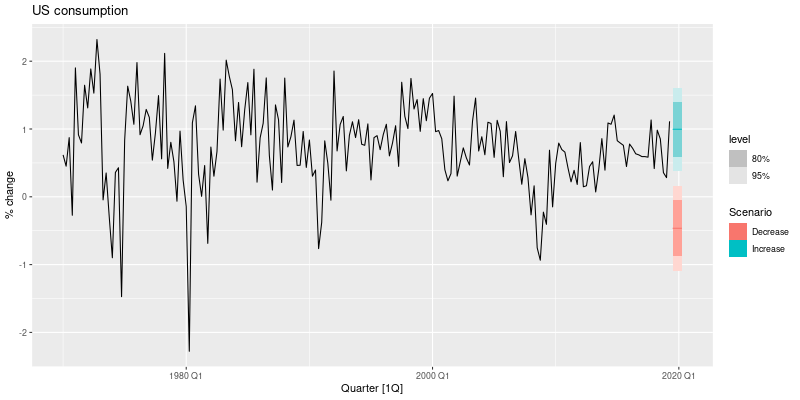

In [152]:
forecast = fabletools.forecast_mdl_df
#forecast = fabletools.forecast_mdl_ts
rforecast = importr("forecast")
autoplot = rforecast.autoplot_mforecast
us_change = data(fpp3).fetch('us_change')['us_change']
autoplot_tbl = fabletools.autoplot_tbl_ts
autoplot_fbl = fabletools.autoplot_fbl_ts
autolayer_fbl = fabletools.autolayer_fbl_ts
fit_consBest = (
    fabletools.model(
        us_change,
        lm = fable.TSLM(rl('Consumption ~ Income + Savings + Unemployment'))
    )
)
newdata_up = DataFrame(tsibble.new_data(us_change, 4)).mutate(Income=1, Savings=0.5, Unemployment=0)
newdata_down = DataFrame(tsibble.new_data(us_change,4)).mutate(Income=-1, Savings=-0.5, Unemployment=0)
future_scenarios = (
    fabletools.scenarios(
        Increase = newdata_up,
        Decrease = newdata_down,
        names_to = "Scenario"
    )
)

fc = forecast(fit_consBest, new_data = future_scenarios)
with ro.local_context() as lc:
    lc['us_change'] = us_change
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(us_change, Consumption) +
          labs(y = "% change in US consumption") +
          fabletools::autolayer(fc) +
          labs(y = "% change",
               title = "US consumption")
        ''')
    display(image_png(ro.r(rcode)))
#fit_consBest <- us_change |>
#  model(
#    lm = TSLM(Consumption ~ Income + Savings + Unemployment)
#  )
#future_scenarios <- scenarios(
#  Increase = new_data(us_change, 4) |>
#    mutate(Income=1, Savings=0.5, Unemployment=0),
#  Decrease = new_data(us_change, 4) |>
#    mutate(Income=-1, Savings=-0.5, Unemployment=0),
#  names_to = "Scenario")

#fc <- forecast(fit_consBest, new_data = future_scenarios)
#us_change |>
#  autoplot(Consumption) +
#  autolayer(fc) +
#  labs(title = "US consumption", y = "% change")

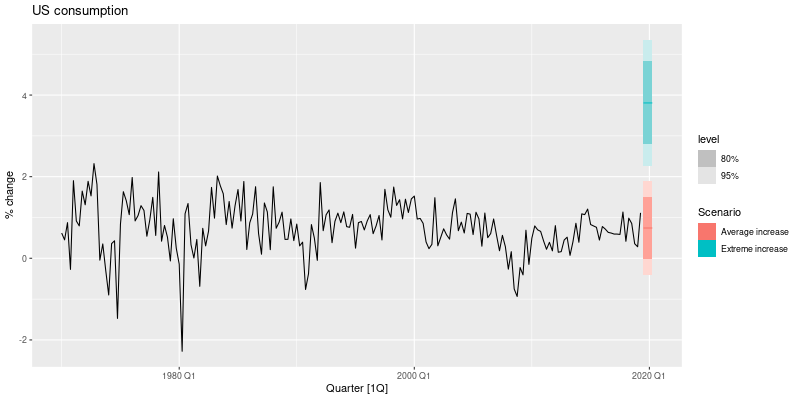

In [153]:
forecast = fabletools.forecast_mdl_df
fit_cons = (
    fabletools.model(
        us_change,
        fable.TSLM(rl('Consumption ~ Income'))
    )
)
with ro.local_context() as lc:
    lc['us_change'] = us_change
    rcode = ('''
        new_cons <- scenarios(
          "Average increase" = new_data(us_change, 4) |>
            mutate(Income = mean(us_change$Income)),
          "Extreme increase" = new_data(us_change, 4) |>
            mutate(Income = 12),
          names_to = "Scenario"
        )
        ''')
    ro.r(rcode)
    new_cons = lc['new_cons']
fcast = forecast(fit_cons, new_cons)
with ro.local_context() as lc:
    lc['us_change'] = us_change
    lc['fcast'] = fcast
    rcode = ('''
        ggplot2::autoplot(us_change, Consumption) +
          fabletools::autolayer(fcast) +
          labs(y = "% change",
               title = "US consumption")
        ''')
    display(image_png(ro.r(rcode)))

## 7.7 Nonlinear regression

In [154]:
boston_men = (
    DataFrame(data(fpp3).fetch("boston_marathon")["boston_marathon"])
    .filter(rl('Year >= 1924'))
    .filter(rl('Event == "Men\'s open division"'))
    .mutate(Minutes = rl('as.numeric(Time/60)'))
)
#boston_men <- boston_marathon |>
#  filter(Year >= 1924) |>
#  filter(Event == "Men's open division") |>
#  mutate(Minutes = as.numeric(Time)/60)

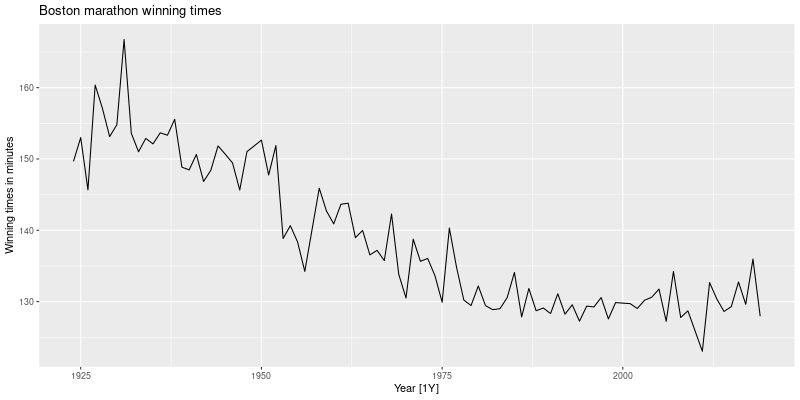

In [155]:
with ro.local_context() as lc:
    lc['boston_men'] = boston_men
    rcode = ('''
        ggplot2::autoplot(boston_men, Minutes) +
          labs(y = "Winning times in minutes",
               title = "Boston marathon winning times")
        ''')
    display(image_png(ro.r(rcode)))

# A mable: 1 x 4
# Key:     Event [1]
  Event                linear exponential piecewise
  <fct>               <model>     <model>   <model>
1 Men's open division  <TSLM>      <TSLM>    <TSLM>



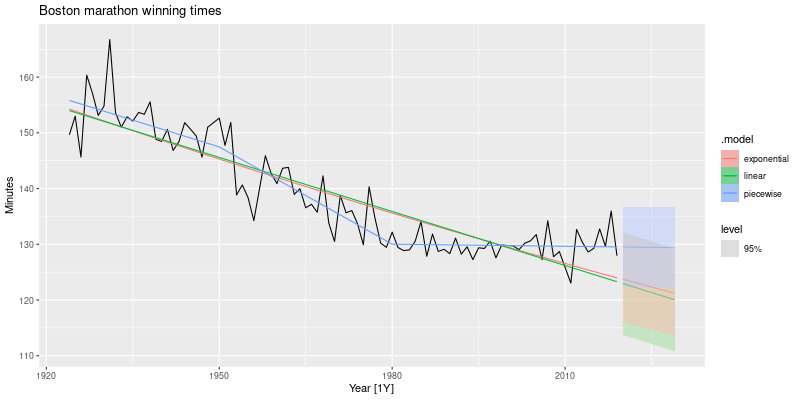

In [156]:
forecast = fabletools.forecast_mdl_df
fit_trends = (
    fabletools.model(
        boston_men,
        linear = fable.TSLM(rl('Minutes ~ trend()')),
        exponential = fable.TSLM(rl('log(Minutes) ~ trend()')),
        piecewise = fable.TSLM(rl('Minutes ~ trend(knots = c(1950, 1980))'))
    )
)
fc_trends = forecast(fit_trends, h = 10)
print(fit_trends)
with ro.local_context() as lc:
    lc['boston_men'] = boston_men
    lc['fit_trends'] = fit_trends
    lc['fc_trends'] = fc_trends
    rcode = ('''
        ggplot2::autoplot(boston_men, Minutes) +
          ggplot2::geom_line(data = fitted(fit_trends),
                             aes(y = .fitted, colour = .model)) +
          fabletools::autolayer(fc_trends, alpha = 0.5, level = 95) +
          labs(y = "Minutes",
               title = "Boston marathon winning times")
        ''')
    display(image_png(ro.r(rcode)))
#fit_trends <- boston_men |>
#  model(
#    # Linear trend  
#    linear = TSLM(Minutes ~ trend()),
#    # Exponential trend
#    exponential = TSLM(log(Minutes) ~ trend()),
#    #Piecewise linear trend  
#    piecewise = TSLM(Minutes ~ trend(knots = c(1950, 1980)))
#  )
#fc_trends <- fit_trends |> forecast(h = 10)

#boston_men |>
#  autoplot(Minutes) +
#  geom_line(data = fitted(fit_trends),
#            aes(y = .fitted, colour = .model)) +
#  autolayer(fc_trends, alpha = 0.5, level = 95) +
#  labs(y = "Minutes",
#       title = "Boston marathon winning times")

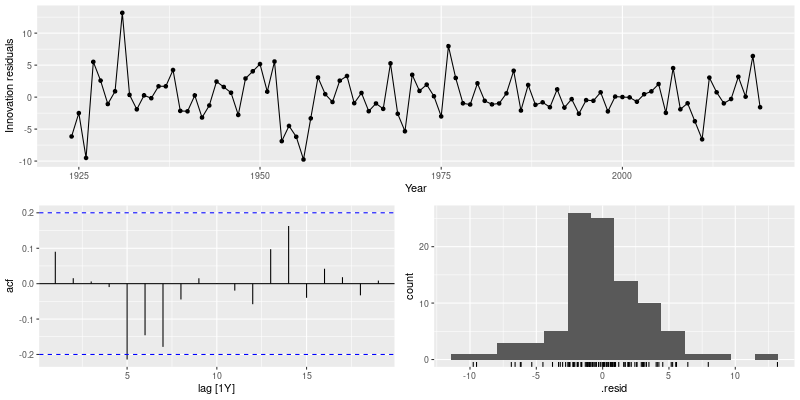

In [157]:
with ro.local_context() as lc:
    lc['fit_trends'] = fit_trends
    rcode = ('''
        fit_trends |>
            select(piecewise) |>
            feasts::gg_tsresiduals()
        ''')
    display(image_png(ro.r(rcode)))

In [158]:
stats = importr('stats')
stats.fitted(fit_trends)

,,Event,.model,Year,.fitted
0,1,Men's open division,linear,1924,153.9976159793808
1,2,Men's open division,linear,1925,153.6742889763068
2,3,Men's open division,linear,1926,153.35096197323207
3,4,Men's open division,linear,1927,153.02763497015738
4,5,Men's open division,linear,1928,152.70430796708268
5,6,Men's open division,linear,1929,152.380980964008
6,7,Men's open division,linear,1930,152.0576539609333
7,8,Men's open division,linear,1931,151.7343269578586
...,...,...,...,...,...
286,287,Men's open division,piecewise,2018,129.5447370955521


# 8 Exponential smoothing
## 8.1 Simple exponential smoothing

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



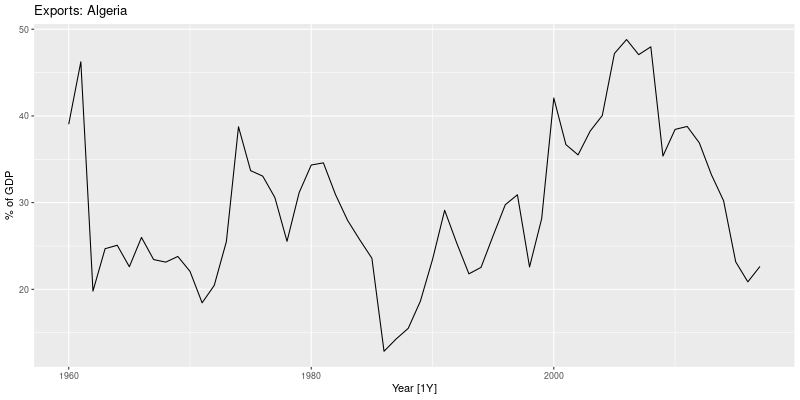

In [159]:
algeria_economy = DataFrame(data(tsibbledata).fetch("global_economy")["global_economy"])\
                  .filter(rl('Country == "Algeria"'))
with ro.local_context() as lc:
    lc['algeria_economy'] = algeria_economy
    rcode = ('''
        ggplot2::autoplot(algeria_economy, Exports) +
            labs(y = "% of GDP", title = "Exports: Algeria")
        ''')
    display(image_png(ro.r(rcode)))
#algeria_economy <- global_economy |>
#  filter(Country == "Algeria")
#algeria_economy |>
#  autoplot(Exports) +
#  labs(y = "% of GDP", title = "Exports: Algeria")

In [160]:
forecast = fabletools.forecast_mdl_df
# Estimate parameters
fit = fabletools.model(
    algeria_economy,
    ANN = fable.ETS(rl('Exports ~ error("A") + trend("N") + season("N")')))
print(fabletools.report(fit))
fc = forecast(fit, h = 5)
#fit <- algeria_economy |>
#  model(ETS(Exports ~ error("A") + trend("N") + season("N")))
#fc <- fit |>
#  forecast(h = 5)

Series: Exports 
Model: ETS(A,N,N) 
  Smoothing parameters:
    alpha = 0.8399875 

  Initial states:
   l[0]
 39.539

  sigma^2:  35.6301

     AIC     AICc      BIC 
446.7154 447.1599 452.8968 
# A mable: 1 x 2
# Key:     Country [1]
  Country          ANN
  <fct>        <model>
1 Algeria <ETS(A,N,N)>



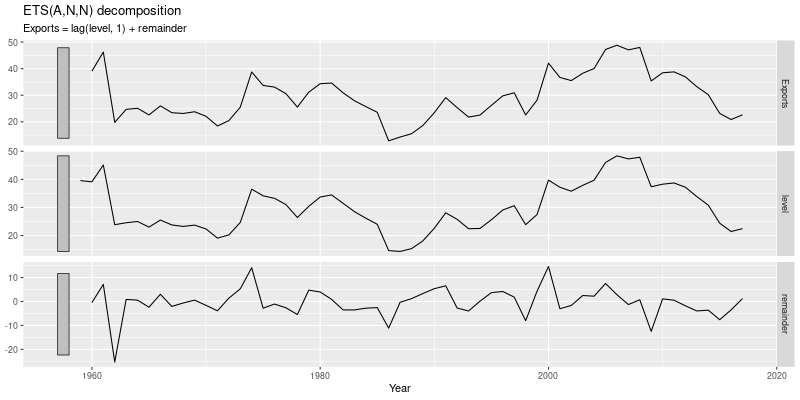

In [161]:
components = fabletools.components_mdl_df
fit_cmp = rggplot2.autoplot(components(fit))
display(image_png(fit_cmp))

In [162]:
stats = importr('stats')
df_fit = (DataFrame(components(fit))
          .left_join(stats.fitted(fit), by = ro.StrVector({"Country", ".model", "Year"})))
print(df_fit)

# A dable: 59 x 7 [1Y]
# Key:     Country, .model [1]
# :        Exports = lag(level, 1) + remainder
   Country .model  Year Exports level remainder .fitted
   <fct>   <chr>  <dbl>   <dbl> <dbl>     <dbl>   <dbl>
 1 Algeria ANN     1959    NA    39.5    NA        NA  
 2 Algeria ANN     1960    39.0  39.1    -0.496    39.5
 3 Algeria ANN     1961    46.2  45.1     7.12     39.1
 4 Algeria ANN     1962    19.8  23.8   -25.3      45.1
 5 Algeria ANN     1963    24.7  24.6     0.841    23.8
 6 Algeria ANN     1964    25.1  25.0     0.534    24.6
 7 Algeria ANN     1965    22.6  23.0    -2.39     25.0
 8 Algeria ANN     1966    26.0  25.5     3.00     23.0
 9 Algeria ANN     1967    23.4  23.8    -2.07     25.5
10 Algeria ANN     1968    23.1  23.2    -0.630    23.8
# ℹ 49 more rows
# ℹ Use `print(n = ...)` to see more rows



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



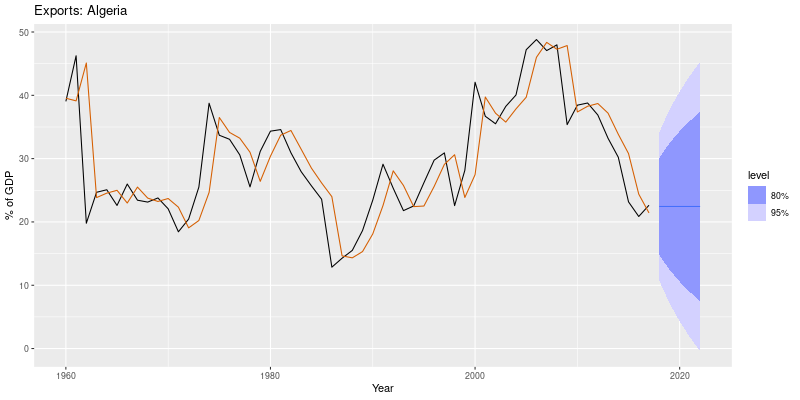

In [163]:
with ro.local_context() as lc:
    lc['algeria_economy'] = algeria_economy
    lc['fc'] = fc
    lc['fit'] = fit
    rcode = ('''
        ggplot2::autoplot(fc, algeria_economy) +
            ggplot2::geom_line(aes(y = .fitted), col="#D55E00",
                               data = augment(fit)) +
            labs(y = "% of GDP", title = "Exports: Algeria") +
            guides(colour = "none")
        ''')
    display(image_png(ro.r(rcode)))
#fc |>
#  autoplot(algeria_economy) +
#  geom_line(aes(y = .fitted), col="#D55E00",
#            data = augment(fit)) +
#  labs(y="% of GDP", title="Exports: Algeria") +
#  guides(colour = "none")

## 8.2 Methods with trend

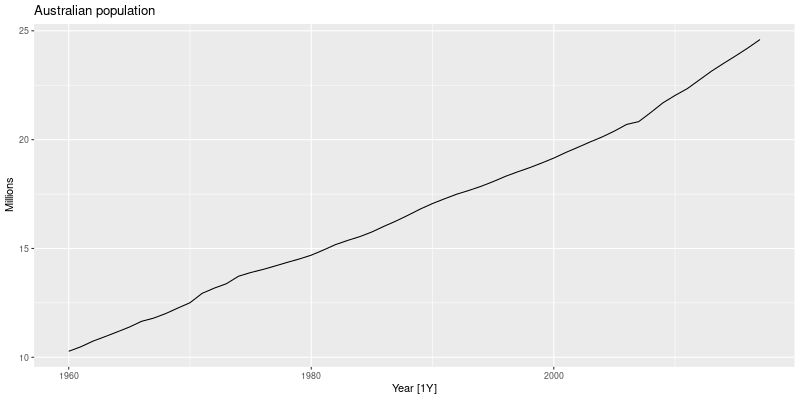

In [164]:
aus_economy = DataFrame(data(tsibbledata).fetch("global_economy")["global_economy"])\
                  .filter(rl('Code == "AUS"'))\
                  .mutate(Pop = rl('Population / 1e6'))
with ro.local_context() as lc:
    lc['aus_economy'] = aus_economy
    rcode = ('''
        ggplot2::autoplot(aus_economy, Pop) +
            labs(y = "Millions", title = "Australian population")
        ''')
    display(image_png(ro.r(rcode)))
#aus_economy <- global_economy |>
#  filter(Code == "AUS") |>
#  mutate(Pop = Population / 1e6)
#autoplot(aus_economy, Pop) +
#  labs(y = "Millions", title = "Australian population")

Series: Pop 
Model: ETS(A,A,N) 
  Smoothing parameters:
    alpha = 0.9999 
    beta  = 0.3266366 

  Initial states:
     l[0]      b[0]
 10.05414 0.2224818

  sigma^2:  0.0041

      AIC      AICc       BIC 
-76.98569 -75.83184 -66.68347 


R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A mable: 1 x 2
# Key:     Country [1]
  Country            AAN
  <fct>          <model>
1 Australia <ETS(A,A,N)>



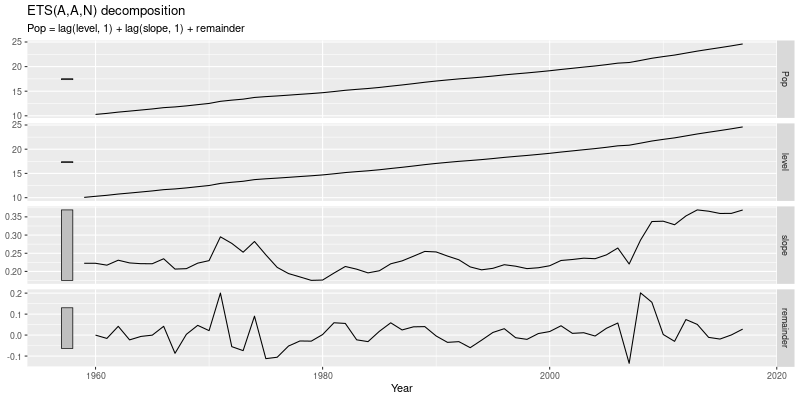

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 



# A dable: 59 x 8 [1Y]
# Key:     Country, .model [1]
# :        Pop = lag(level, 1) + lag(slope, 1) + remainder
   Country   .model  Year   Pop level slope remainder .fitted
   <fct>     <chr>  <dbl> <dbl> <dbl> <dbl>     <dbl>   <dbl>
 1 Australia AAN     1959  NA    10.1 0.222 NA           NA  
 2 Australia AAN     1960  10.3  10.3 0.222 -0.000145    10.3
 3 Australia AAN     1961  10.5  10.5 0.217 -0.0159      10.5
 4 Australia AAN     1962  10.7  10.7 0.231  0.0418      10.7
 5 Australia AAN     1963  11.0  11.0 0.223 -0.0229      11.0
 6 Australia AAN     1964  11.2  11.2 0.221 -0.00641     11.2
 7 Australia AAN     1965  11.4  11.4 0.221 -0.000314    11.4
 8 Australia AAN     1966  11.7  11.7 0.235  0.0418      11.6
 9 Australia AAN     1967  11.8  11.8 0.206 -0.0869      11.9
10 Australia AAN     1968  12.0  12.0 0.208  0.00350     12.0
# ℹ 49 more rows
# ℹ Use `print(n = ...)` to see more rows



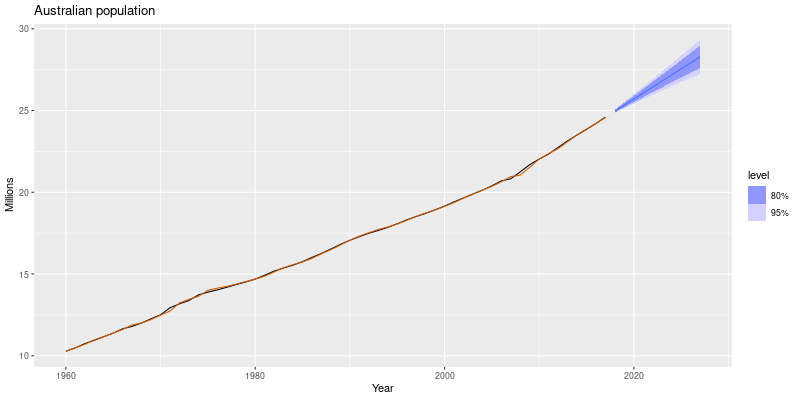

In [165]:
forecast = fabletools.forecast_mdl_df
components = fabletools.components_mdl_df
stats = importr('stats')
fit = fabletools.model(
        aus_economy,
        AAN = fable.ETS(rl('Pop ~ error("A") + trend("A") + season("N")')))
print(fabletools.report(fit))

fit_cmp = rggplot2.autoplot(components(fit))
display(image_png(fit_cmp))

df_fit = (DataFrame(components(fit))
          .left_join(stats.fitted(fit), by = ro.StrVector({"Country", ".model", "Year"})))
print(df_fit)

fc = forecast(fit, h = 10)
with ro.local_context() as lc:
    lc['aus_economy'] = aus_economy
    lc['fc'] = fc
    lc['fit'] = fit
    rcode = ('''
        ggplot2::autoplot(fc, aus_economy) +
            ggplot2::geom_line(aes(y = .fitted), col="#D55E00",
                               data = augment(fit)) +
            labs(y = "Millions", title = "Australian population") +
            guides(colour = "none")
        ''')
    display(image_png(ro.r(rcode)))
#fit <- aus_economy |>
#  model(
#    AAN = ETS(Pop ~ error("A") + trend("A") + season("N"))
#  )
#fc <- fit |> forecast(h = 10)

In [166]:
accuracy_mdl = fabletools.accuracy_mdl_df
fit = fabletools.model(
    DataFrame(aus_economy).filter(rl('Year <= 2010')),
    ses = fable.ETS(rl('Pop ~ error("A") + trend("N") + season("N")')),
    Holt = fable.ETS(rl('Pop ~ error("A") + trend("A") + season("N")')),
    Damped = fable.ETS(rl('Pop ~ error("A") + trend("Ad") + season("N")')))
print(fabletools.tidy_mdl_df(fit))
print(accuracy_mdl(fit))

# A tibble: 11 × 4
   Country   .model term  estimate
   <fct>     <chr>  <chr>    <dbl>
 1 Australia ses    alpha    1.00 
 2 Australia ses    l[0]    10.3  
 3 Australia Holt   alpha    1.00 
 4 Australia Holt   beta     0.296
 5 Australia Holt   l[0]    10.1  
 6 Australia Holt   b[0]     0.224
 7 Australia Damped alpha    1.00 
 8 Australia Damped beta     0.402
 9 Australia Damped phi      0.980
10 Australia Damped l[0]    10.0  
11 Australia Damped b[0]     0.246

# A tibble: 3 × 11
  Country   .model .type       ME   RMSE    MAE    MPE  MAPE  MASE RMSSE    ACF1
  <fct>     <chr>  <chr>    <dbl>  <dbl>  <dbl>  <dbl> <dbl> <dbl> <dbl>   <dbl>
1 Australia ses    Train… 0.231   0.242  0.231  1.48   1.48  0.980 0.990  0.267 
2 Australia Holt   Train… 0.00716 0.0646 0.0451 0.0336 0.289 0.192 0.264  0.0504
3 Australia Damped Train… 0.0157  0.0665 0.0466 0.0883 0.300 0.198 0.272 -0.0334



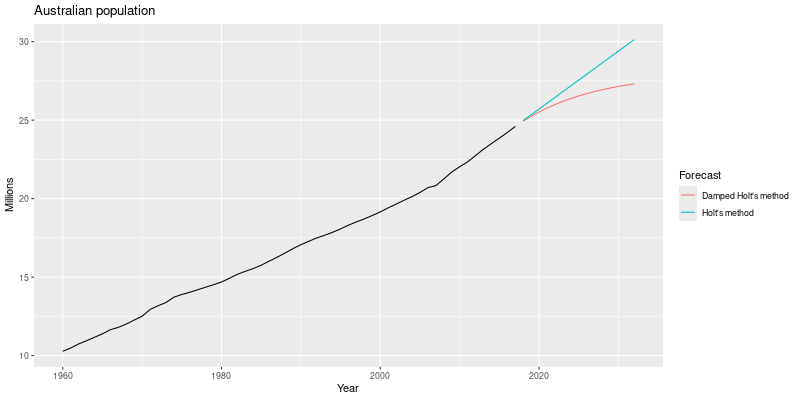

In [167]:
forecast = fabletools.forecast_mdl_df

with ro.local_context() as lc:
    lc['aus_economy'] = aus_economy
    rcode = ('''
        fit = fabletools::model(
                aus_economy,
                `Holt's method` = fable::ETS(Pop ~ error("A") + trend("A") + season("N")),
                `Damped Holt's method` = fable::ETS(Pop ~ error("A") + trend("Ad", phi = 0.9) + season("N")))
        ''')
    ro.r(rcode)
    fit = lc['fit']

fc = forecast(fit, h = 15)

with ro.local_context() as lc:
    lc['aus_economy'] = aus_economy
    lc['fit'] = fit
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, aus_economy, level = NULL) +
            labs(y = "Millions", title = "Australian population") +
            guides(colour = guide_legend(title = "Forecast"))
        ''')
    display(image_png(ro.r(rcode)))
#aus_economy |>
#  model(
#    `Holt's method` = ETS(Pop ~ error("A") +
#                       trend("A") + season("N")),
#    `Damped Holt's method` = ETS(Pop ~ error("A") +
#                       trend("Ad", phi = 0.9) + season("N"))
#  ) |>
#  forecast(h = 15) |>
#  autoplot(aus_economy, level = NULL) +
#  labs(title = "Australian population",
#       y = "Millions") +
#  guides(colour = guide_legend(title = "Forecast"))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



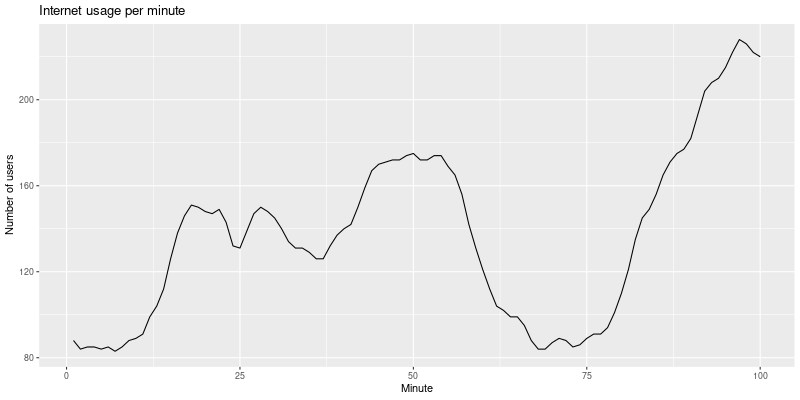

In [168]:
datasets = importr('datasets')
www_usage = tsibble.as_tsibble(data(datasets).fetch('WWWusage')['WWWusage'])
with ro.local_context() as lc:
    lc['www_usage'] = www_usage
    rcode = ('''
        ggplot2::autoplot(www_usage, value) +
            labs(x="Minute", y="Number of users", 
                 title = "Internet usage per minute")
        ''')
    display(image_png(ro.r(rcode)))
#www_usage <- as_tsibble(WWWusage)
#www_usage |> autoplot(value) +
#  labs(x="Minute", y="Number of users",
#       title = "Internet usage per minute")

In [169]:
forecast = fabletools.forecast_mdl_df
accuracy_fbl = fabletools.accuracy_fbl_ts
fit = fabletools.model(
    tsibble.stretch_tsibble(www_usage,1,10),
    SES = fable.ETS(rl('value ~ error("A") + trend("N") + season("N")')),
    Holt = fable.ETS(rl('value ~ error("A") + trend("A") + season("N")')),
    Damped = fable.ETS(rl('value ~ error("A") + trend("Ad") + season("N")')))
fc = forecast(fit, h = 1)
fc_accuracy = accuracy_fbl(fc, www_usage)
print(fc_accuracy)
#www_usage |>
#  stretch_tsibble(.init = 10) |>
#  model(
#    SES = ETS(value ~ error("A") + trend("N") + season("N")),
#    Holt = ETS(value ~ error("A") + trend("A") + season("N")),
#    Damped = ETS(value ~ error("A") + trend("Ad") +
#                   season("N"))
#  ) |>
#  forecast(h = 1) |>
#  accuracy(www_usage)

# A tibble: 3 × 10
  .model .type     ME  RMSE   MAE   MPE  MAPE  MASE RMSSE  ACF1
  <chr>  <chr>  <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl>
1 Damped Test  0.288   3.69  3.00 0.347  2.26 0.663 0.636 0.336
2 Holt   Test  0.0610  3.87  3.17 0.244  2.38 0.701 0.668 0.296
3 SES    Test  1.46    6.05  4.81 0.904  3.55 1.06  1.04  0.803



In [170]:
forecast = fabletools.forecast_mdl_df
fit = fabletools.model(
    www_usage,
    Damped = fable.ETS(rl('value ~ error("A") + trend("Ad") + season("N")')))
# Estimated parameters:
print(fabletools.tidy_mdl_df(fit))
#fit <- www_usage |>
#  model(
#    Damped = ETS(value ~ error("A") + trend("Ad") +
#                   season("N"))
#  )
#tidy(fit)

# A tibble: 5 × 3
  .model term  estimate
  <chr>  <chr>    <dbl>
1 Damped alpha   1.00  
2 Damped beta    0.997 
3 Damped phi     0.815 
4 Damped l[0]   90.4   
5 Damped b[0]   -0.0173



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: The future dataset is incomplete, incomplete out-of-sample data will be treated as missing. 
1 observation is missing at 101 



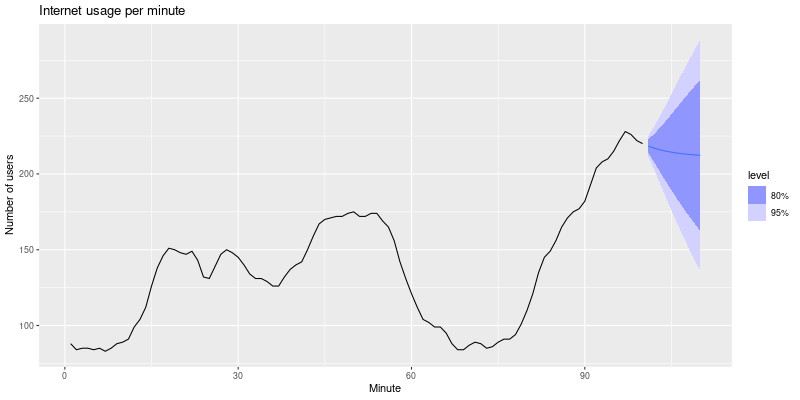

In [171]:
fc = forecast(fit, h = 10)
with ro.local_context() as lc:
    lc['www_usage'] = www_usage
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, www_usage) +
            labs(x="Minute", y="Number of users", 
                 title = "Internet usage per minute")
        ''')
    display(image_png(ro.r(rcode)))
#fit |>
#  forecast(h = 10) |>
#  autoplot(www_usage) +
#  labs(x="Minute", y="Number of users",
#       title = "Internet usage per minute")

## 8.3 Methods with seasonality

# A tibble: 9 × 3
  term     additive multiplicative
  <chr>       <dbl>          <dbl>
1 alpha    0.236          0.186   
2 b[0]   -37.4          -33.4     
3 beta     0.0298         0.0248  
4 gamma    0.000100       0.000100
5 l[0]  9899.          9853.      
6 s[-1] -684.             0.926   
7 s[-2] -290.             0.970   
8 s[-3] 1512.             1.16    
9 s[0]  -538.             0.943   

# A dable: 84 x 8 [1Q]
# Key:     .model [1]
# :        Trips = lag(level, 1) + lag(slope, 1) + lag(season, 4) + remainder
   .model   Quarter  Trips level slope season remainder .fitted
   <chr>      <qtr>  <dbl> <dbl> <dbl>  <dbl>     <dbl>   <dbl>
 1 additive 1997 Q1    NA    NA   NA    1512.      NA       NA 
 2 additive 1997 Q2    NA    NA   NA    -290.      NA       NA 
 3 additive 1997 Q3    NA    NA   NA    -684.      NA       NA 
 4 additive 1997 Q4    NA  9899. -37.4  -538.      NA       NA 
 5 additive 1998 Q1 11806. 9964. -24.5  1512.     433.   11373.
 6 additive 1998 Q2  9276

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A dable: 84 x 8 [1Q]
# Key:     .model [1]
# :        Trips = lag(level, 1) + lag(slope, 1) + lag(season, 4) + remainder
   .model         Quarter  Trips level slope season remainder .fitted
   <chr>            <qtr>  <dbl> <dbl> <dbl>  <dbl>     <dbl>   <dbl>
 1 multiplicative 1997 Q1    NA    NA   NA    1.16   NA           NA 
 2 multiplicative 1997 Q2    NA    NA   NA    0.970  NA           NA 
 3 multiplicative 1997 Q3    NA    NA   NA    0.926  NA           NA 
 4 multiplicative 1997 Q4    NA  9853. -33.4  0.943  NA           NA 
 5 multiplicative 1998 Q1 11806. 9883. -24.9  1.16    0.0348   11409.
 6 multiplicative 1998 Q2  9276. 9803. -32.3  0.970  -0.0299    9562.
 7 multiplicative 1998 Q3  8642. 9690. -43.0  0.926  -0.0444    9044.
 8 multiplicative 1998 Q4  9300. 9688. -37.6  0.943   0.0227    9093.
 9 multiplicative 1999 Q1 11172. 9644. -38.4  1.16   -0.00362  11213.
10 multiplicative 1999 Q2  9608. 9661. -31.0  0.970   0.0312    9317.
# ℹ 74 more rows
# ℹ Use `print(n = .

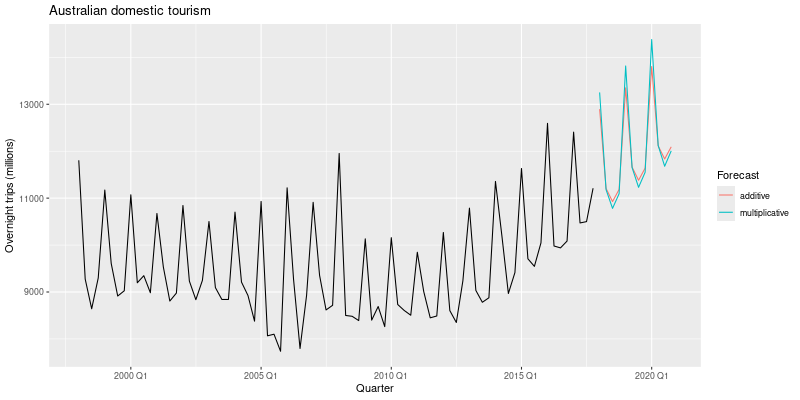

In [172]:
tidyr = importr('tidyr')
forecast = fabletools.forecast_mdl_df
tourism = data(tsibble).fetch('tourism')['tourism']
aus_holidays = (DataFrame(tourism).filter(rl('Purpose == "Holiday"'))\
               .summarise(Trips = rl('sum(Trips)')))
fit = fabletools.model(
    aus_holidays,
    additive = fable.ETS(rl('Trips ~ error("A") + trend("A") + season("A")')),
    multiplicative = fable.ETS(rl('Trips ~ error("M") + trend("A") + season("M")')))
#fc = forecast(fit)
print(tidyr.spread(fabletools.tidy_mdl_df(fit), rl('.model'), rl('estimate')))
additive_fit = (DataFrame(fabletools.components_mdl_df(fit))
                .filter(rl('.model=="additive"'))
                .left_join(stats.fitted(fit), by = ro.StrVector({".model", "Quarter"})))
print(additive_fit)
multiplicative_fit = (DataFrame(fabletools.components_mdl_df(fit))
                .filter(rl('.model=="multiplicative"'))
                .left_join(stats.fitted(fit), by = ro.StrVector({".model", "Quarter"})))
print(multiplicative_fit)
fc = forecast(fit, h = "3 years")
with ro.local_context() as lc:
    lc['aus_holidays'] = aus_holidays
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, aus_holidays, level = NULL) +
            labs(title="Australian domestic tourism",
                 y="Overnight trips (millions)") +
                 guides(colour = guide_legend(title = "Forecast"))
        ''')
    display(image_png(ro.r(rcode)))
#aus_holidays <- tourism |>
#  filter(Purpose == "Holiday") |>
#  summarise(Trips = sum(Trips)/1e3)
#fit <- aus_holidays |>
#  model(
#    additive = ETS(Trips ~ error("A") + trend("A") +
#                                                season("A")),
#    multiplicative = ETS(Trips ~ error("M") + trend("A") +
#                                                season("M"))
#  )
#fc <- fit |> forecast(h = "3 years")
#fc |>
#  autoplot(aus_holidays, level = NULL) +
#  labs(title="Australian domestic tourism",
#       y="Overnight trips (millions)") +
#  guides(colour = guide_legend(title = "Forecast"))

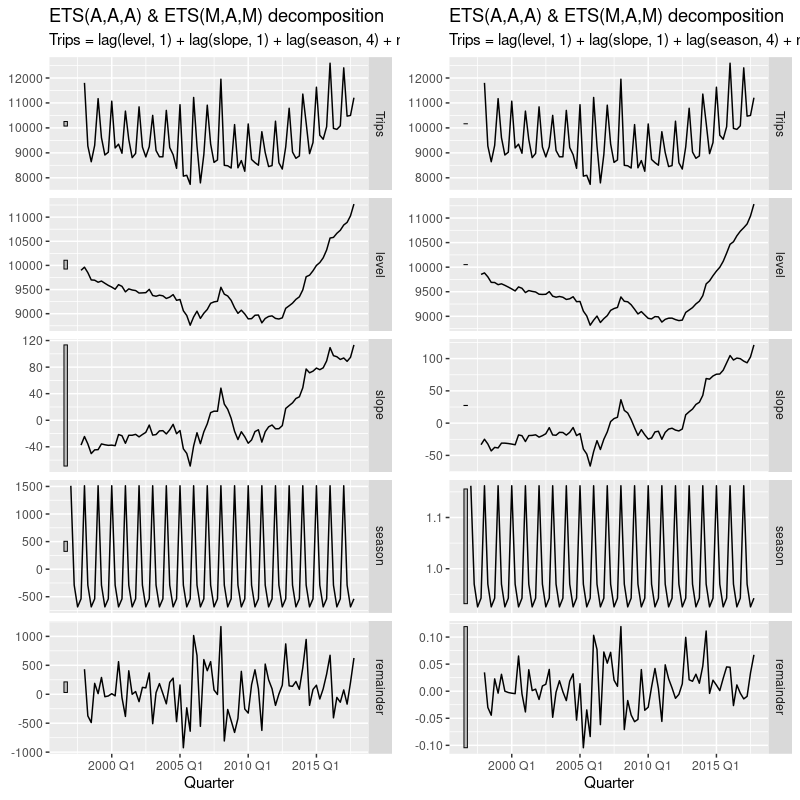

In [173]:
gridExtra = importr('gridExtra')
plot1 = rggplot2.autoplot(DataFrame(fabletools.components_mdl_df(fit)).filter(rl('.model=="additive"')))
plot2 = rggplot2.autoplot(DataFrame(fabletools.components_mdl_df(fit)).filter(rl('.model=="multiplicative"')))
graphics = importr("graphics")
with r_inline_plot(width=800, height=800, dpi=100):
    gridExtra.grid_arrange(plot1, plot2, ncol=2)
#plot2s = rggplot2.autoplot(fabletools.components_mdl_df(fit)) 
#display(image_png(plot2s))

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 3: Removed 4 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 4: Removed 4 rows containing missing values or values outside the scale range
(`geom_line()`). 



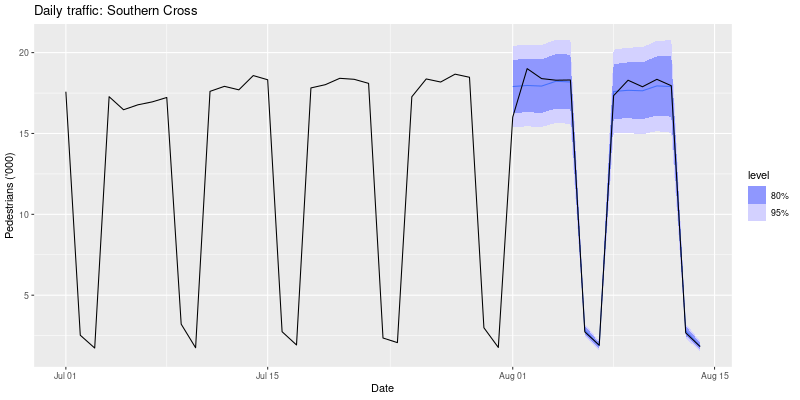

In [174]:
forecast = fabletools.forecast_mdl_df
sth_cross_ped = tsibble.index_by(data(tsibble).fetch("pedestrian")["pedestrian"], rl('Date'))
sth_cross_ped = (DataFrame(sth_cross_ped)
                 .group_by(rl('Sensor'))
                 .summarise(Count = rl('sum(Count)/1000'))
                 .filter(rl('Date >= "2016-07-01"'),
                         rl('Sensor == "Southern Cross Station"')))

fit = fabletools.model(
    DataFrame(sth_cross_ped).filter(rl('Date <= "2016-07-31"')),
    hw = fable.ETS(rl('Count ~ error("M") + trend("Ad") + season("M")')))
fc = forecast(fit, h = "2 weeks")
with ro.local_context() as lc:
    lc['sth_cross_ped'] = sth_cross_ped
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, sth_cross_ped |> filter(Date <= "2016-08-14")) +
            labs(title="Daily traffic: Southern Cross",
                 y="Pedestrians ('000)")
        ''')
    display(image_png(ro.r(rcode)))

#sth_cross_ped <- pedestrian |>
#  filter(Date >= "2016-07-01",
#         Sensor == "Southern Cross Station") |>
#  index_by(Date) |>
#  summarise(Count = sum(Count)/1000)
#sth_cross_ped |>
#  filter(Date <= "2016-07-31") |>
#  model(
#    hw = ETS(Count ~ error("M") + trend("Ad") + season("M"))
#  ) |>
#  forecast(h = "2 weeks") |>
#  autoplot(sth_cross_ped |> filter(Date <= "2016-08-14")) +
#  labs(title = "Daily traffic: Southern Cross",
#       y="Pedestrians ('000)")

## 8.6 Estimation and model selection

In [175]:
fit = fabletools.model(
        (DataFrame(data(tsibbledata).fetch("global_economy")["global_economy"])
            .mutate(Pop = rl('Population / 1e6'))),
        ets = fable.ETS(rl('Pop')))
print(fit)
fc = fabletools.forecast_mdl_df(fit, h = 5)
print(fc)

# A mable: 263 x 2
# Key:     Country [263]
   Country                      ets
   <fct>                    <model>
 1 Afghanistan         <ETS(A,A,N)>
 2 Albania             <ETS(M,A,N)>
 3 Algeria             <ETS(M,A,N)>
 4 American Samoa      <ETS(M,A,N)>
 5 Andorra             <ETS(M,A,N)>
 6 Angola              <ETS(M,A,N)>
 7 Antigua and Barbuda <ETS(M,A,N)>
 8 Arab World          <ETS(M,A,N)>
 9 Argentina           <ETS(A,A,N)>
10 Armenia             <ETS(M,A,N)>
# ℹ 253 more rows
# ℹ Use `print(n = ...)` to see more rows

# A fable: 1,315 x 5 [1Y]
# Key:     Country, .model [263]
   Country     .model  Year
   <fct>       <chr>  <dbl>
 1 Afghanistan ets     2018
 2 Afghanistan ets     2019
 3 Afghanistan ets     2020
 4 Afghanistan ets     2021
 5 Afghanistan ets     2022
 6 Albania     ets     2018
 7 Albania     ets     2019
 8 Albania     ets     2020
 9 Albania     ets     2021
10 Albania     ets     2022
# ℹ 1,305 more rows
# ℹ 2 more variables: Pop <dist>, .mean <dbl>
# 

In [176]:
forecast = fabletools.forecast_mdl_df
tourism = data(tsibble).fetch('tourism')['tourism']
aus_holidays = (DataFrame(tourism)
                .filter(rl('Purpose == "Holiday"'))
                .summarise(Trips = rl('sum(Trips)')))
fit = fabletools.model(
    aus_holidays,
    fable.ETS(rl('Trips')))
print(fabletools.report(fit))
# Minimizing the AIC (AICc for small samples) assuming Gaussian residuals is asymptotically equivalent to minimizing one-step time series cross validation MSE.
#aus_holidays <- tourism |>
#  filter(Purpose == "Holiday") |>
#  summarise(Trips = sum(Trips)/1e3)
#fit <- aus_holidays |>
#  model(ETS(Trips))
#report(fit)

Series: Trips 
Model: ETS(M,N,M) 
  Smoothing parameters:
    alpha = 0.3578226 
    gamma = 0.0009685565 

  Initial states:
     l[0]      s[0]     s[-1]    s[-2]    s[-3]
 9666.501 0.9430367 0.9268433 0.968352 1.161768

  sigma^2:  0.0022

     AIC     AICc      BIC 
1331.372 1332.928 1348.046 
# A mable: 1 x 1
  `<environment>`
          <model>
1    <ETS(M,N,M)>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: 1 error encountered for ets
[1] ETS does not support missing values.
 



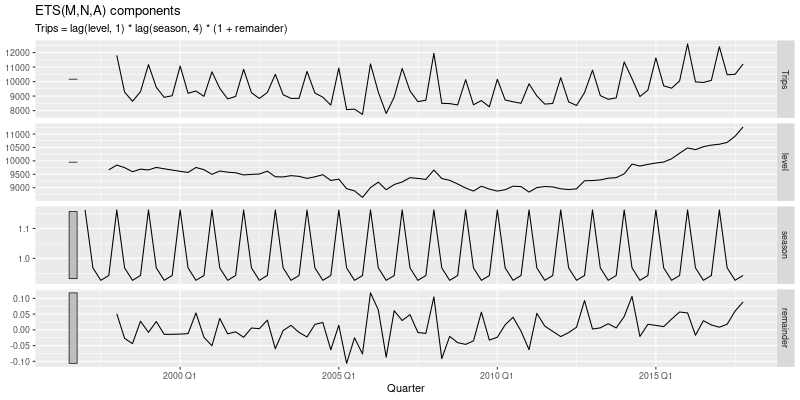

In [177]:
components = fabletools.components_mdl_df
with ro.local_context() as lc:
    lc['fit'] = fit
    rcode = ('''
        ggplot2::autoplot(fabletools::components(fit)) +
            labs(title="ETS(M,N,A) components")
        ''')
    display(image_png(ro.r(rcode)))
#components(fit) |>
#  autoplot() +
#  labs(title = "ETS(M,N,A) components")

# A tsibble: 80 x 3 [1Q]
# Key:       .model [1]
   .model        Quarter   .resid
   <chr>           <qtr>    <dbl>
 1 <environment> 1998 Q1  0.0513 
 2 <environment> 1998 Q2 -0.0269 
 3 <environment> 1998 Q3 -0.0435 
 4 <environment> 1998 Q4  0.0275 
 5 <environment> 1999 Q1 -0.00781
 6 <environment> 1999 Q2  0.0266 
 7 <environment> 1999 Q3 -0.0142 
 8 <environment> 1999 Q4 -0.0140 
 9 <environment> 2000 Q1 -0.0134 
10 <environment> 2000 Q2 -0.0120 
# ℹ 70 more rows
# ℹ Use `print(n = ...)` to see more rows

# A tsibble: 80 x 3 [1Q]
# Key:       .model [1]
   .model        Quarter .resid
   <chr>           <qtr>  <dbl>
 1 <environment> 1998 Q1  576. 
 2 <environment> 1998 Q2 -257. 
 3 <environment> 1998 Q3 -393. 
 4 <environment> 1998 Q4  249. 
 5 <environment> 1999 Q1  -88.0
 6 <environment> 1999 Q2  249. 
 7 <environment> 1999 Q3 -129. 
 8 <environment> 1999 Q4 -129. 
 9 <environment> 2000 Q1 -150. 
10 <environment> 2000 Q2 -111. 
# ℹ 70 more rows
# ℹ Use `print(n = ...)` to see m

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 4 rows containing missing values or values outside the scale range
(`geom_line()`). 



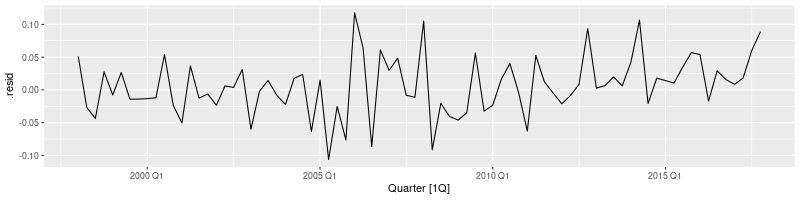

Plot variable not specified, automatically selected `.vars = .resid`


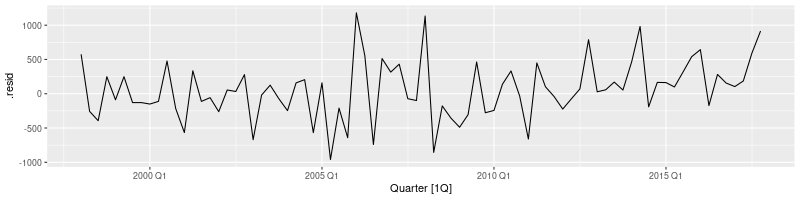

# A tsibble: 80 x 6 [1Q]
# Key:       .model [1]
   .model        Quarter  Trips .fitted .resid   .innov
   <chr>           <qtr>  <dbl>   <dbl>  <dbl>    <dbl>
 1 <environment> 1998 Q1 11806.  11230.  576.   0.0513 
 2 <environment> 1998 Q2  9276.   9532. -257.  -0.0269 
 3 <environment> 1998 Q3  8642.   9036. -393.  -0.0435 
 4 <environment> 1998 Q4  9300.   9050.  249.   0.0275 
 5 <environment> 1999 Q1 11172.  11260.  -88.0 -0.00781
 6 <environment> 1999 Q2  9608.   9358.  249.   0.0266 
 7 <environment> 1999 Q3  8914.   9042. -129.  -0.0142 
 8 <environment> 1999 Q4  9026.   9154. -129.  -0.0140 
 9 <environment> 2000 Q1 11071.  11221. -150.  -0.0134 
10 <environment> 2000 Q2  9196.   9308. -111.  -0.0120 
# ℹ 70 more rows
# ℹ Use `print(n = ...)` to see more rows



In [178]:
print(fabletools.residuals_mdl_df(fit))
print(fabletools.residuals_mdl_df(fit, type = "response"))
display(image_png(rggplot2.autoplot(fabletools.residuals_mdl_df(fit)), height=200))
display(image_png(rggplot2.autoplot(fabletools.residuals_mdl_df(fit, type = "response")), height=200))
print(fabletools.augment_mdl_df(fit))
# The innovation residuals are given by ^εt, while the regular residuals are defined as yt−^yt|t−1.

## 8.7 Forecasting with ETS models

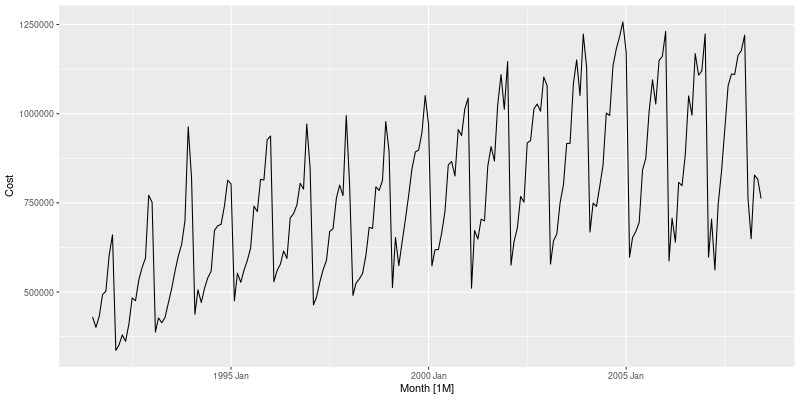

****** auto report ********
Series: Cost 
Model: ETS(M,Ad,M) 
  Smoothing parameters:
    alpha = 0.3071016 
    beta  = 0.0001006793 
    gamma = 0.0001007181 
    phi   = 0.977528 

  Initial states:
     l[0]    b[0]      s[0]     s[-1]     s[-2]     s[-3]     s[-4]    s[-5]
 417268.7 8205.82 0.8716807 0.8259747 0.7562808 0.7733338 0.6872373 1.283821
    s[-6]    s[-7]    s[-8]    s[-9]   s[-10]    s[-11]
 1.324616 1.180067 1.163601 1.104801 1.047963 0.9806235

  sigma^2:  0.0046

     AIC     AICc      BIC 
5515.212 5518.909 5574.938 
# A mable: 1 x 1
  `<environment>`
          <model>
1   <ETS(M,Ad,M)>

****** Manual AAA report ******
Series: Cost 
Model: ETS(A,A,A) 
  Smoothing parameters:
    alpha = 0.1702163 
    beta  = 0.006310854 
    gamma = 0.4545987 

  Initial states:
     l[0]     b[0]      s[0]     s[-1]     s[-2]     s[-3]     s[-4]    s[-5]
 409705.9 9097.111 -99075.37 -136602.3 -191496.1 -174530.8 -241436.7 210643.8
    s[-6]    s[-7]    s[-8]    s[-9]  s[-10]    

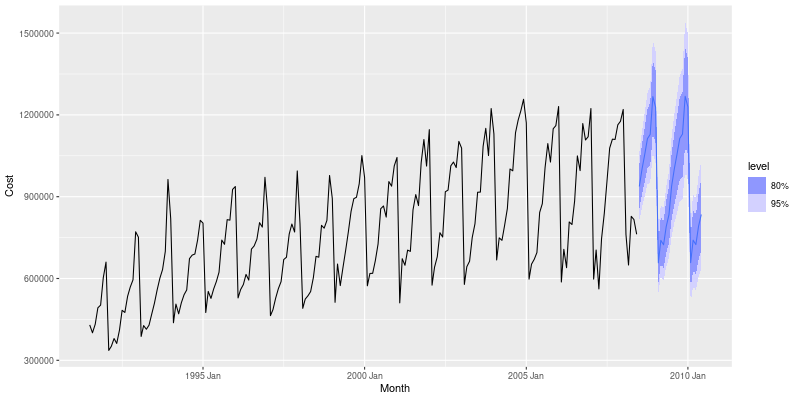

******** auto model accuracy *********
# A tibble: 2 × 10
  .model .type        ME   RMSE    MAE     MPE  MAPE  MASE RMSSE    ACF1
  <chr>  <chr>     <dbl>  <dbl>  <dbl>   <dbl> <dbl> <dbl> <dbl>   <dbl>
1 auto   Training  2461. 51102. 38649. -0.0127  4.99 0.638 0.689 -0.0958
2 AAA    Training -5780. 56784. 43378. -1.30    6.05 0.716 0.766  0.0258



In [179]:
h02 = (DataFrame(data(tsibbledata).fetch("PBS")["PBS"])
       .filter(rl('ATC2 == "H02"'))
       .summarise(Cost = rl('sum(Cost)')))
with ro.local_context() as lc:
    lc['h02'] = h02
    rcode = ('''
        ggplot2::autoplot(h02, Cost)
        ''')
    display(image_png(ro.r(rcode)))

autofit = fabletools.model(
    h02,
    fable.ETS(rl('Cost')))
print("****** auto report ********")
print(fabletools.report(autofit))

AAAfit = fabletools.model(
    h02,
    fable.ETS(rl('Cost ~ error("A") + trend("A") + season("A")'))) 
print("****** Manual AAA report ******")
print(fabletools.report(AAAfit))

autofit_plot = rggplot2.autoplot(fabletools.forecast_mdl_df(autofit), h02)
display(image_png(autofit_plot))

fit = fabletools.model(
    h02,
    auto = fable.ETS(rl('Cost')),
    AAA = fable.ETS(rl('Cost ~ error("A") + trend("A") + season("A")'))) 
print("******** auto model accuracy *********")
print(fabletools.accuracy_mdl_df(fit))

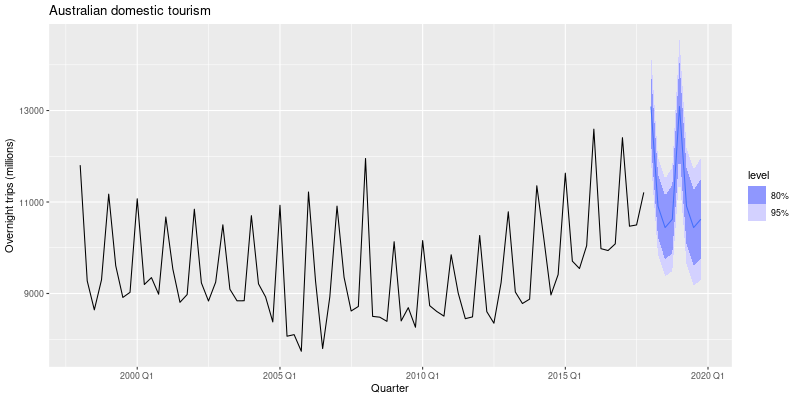

In [183]:
forecast = fabletools.forecast_mdl_df
aus_holidays = (DataFrame(tourism)
                .filter(rl('Purpose == "Holiday"'))
                .summarise(Trips = rl('sum(Trips)')))
fit = fabletools.model(
    aus_holidays,
    fable.ETS(rl('Trips')))

fc = forecast(fit, h = 8)

with ro.local_context() as lc:
    lc['fc'] = fc
    lc['aus_holidays'] = aus_holidays
    rcode = ('''
        ggplot2::autoplot(fc, aus_holidays) +
            labs(title="Australian domestic tourism",
                 y="Overnight trips (millions)")
        ''')
    display(image_png(ro.r(rcode)))
#fit |>
#  forecast(h = 8) |>
#  autoplot(aus_holidays)+
#  labs(title="Australian domestic tourism",
#       y="Overnight trips (millions)")

# 9 ARIMA models
## 9.1 Stationarity and differencing

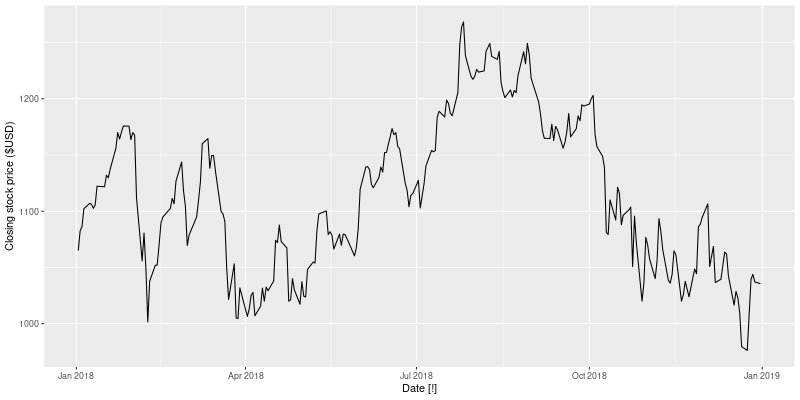

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Provided data has an irregular interval, results should be treated with caution. Computing ACF by observation. 



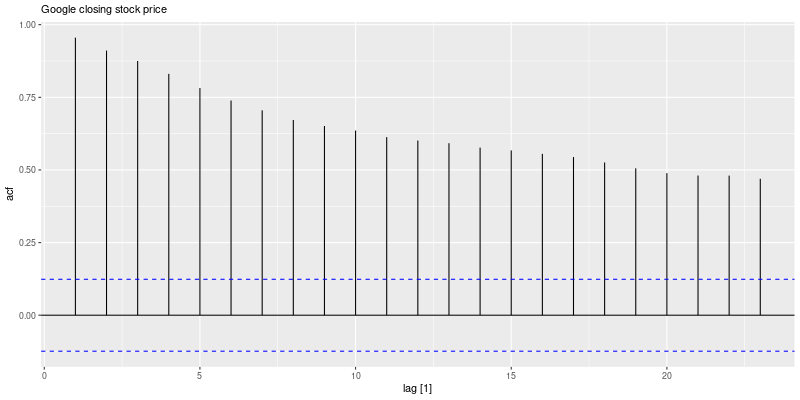

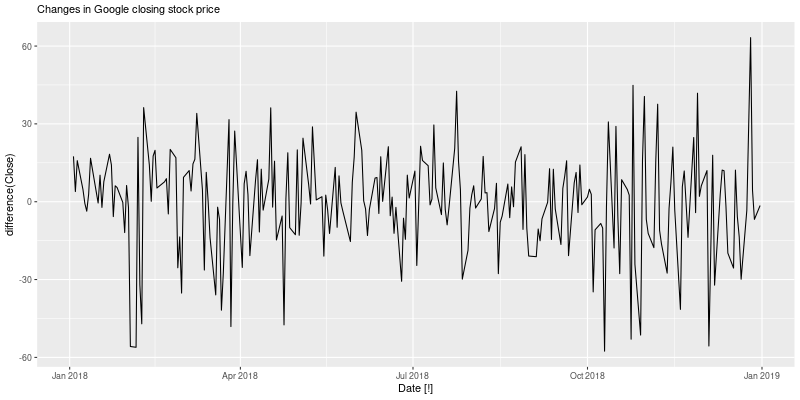

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Provided data has an irregular interval, results should be treated with caution. Computing ACF by observation. 



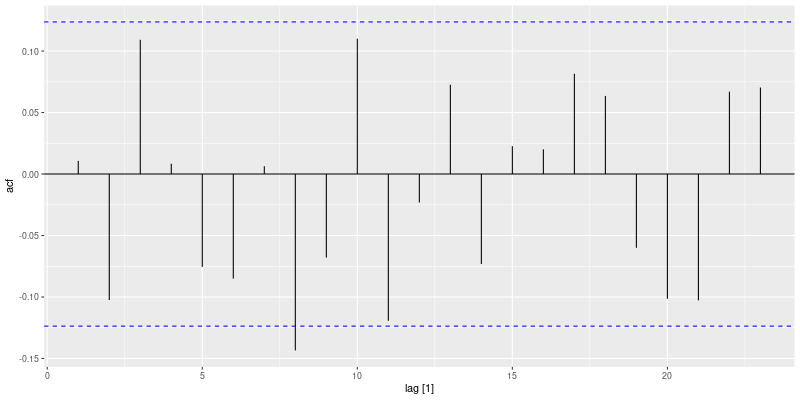

In [184]:
# Preview: make data stationary, build model(s), reverse everything, generate forecasts
# 1. identifying non-stationary series:
#    time plot; The ACF of stationary data drops to zero relatively quickly; The ACF of non-stationary data decreases slowly; 
#    For non-stationary data, the value of r1 is often large and positive 
google_2018 = (DataFrame(data(tsibbledata).fetch('gafa_stock')['gafa_stock'])
               .filter(rl('Symbol == "GOOG"'), rl('year(Date) == 2018')))
with ro.local_context() as lc:
    lc['google_2018'] = google_2018
    rcode = ('''
        ggplot2::autoplot(google_2018, Close) +
            labs(y="Closing stock price ($USD)")
        ''')
    display(image_png(ro.r(rcode)))

    rcode2 = ('''
        ggplot2::autoplot(feasts::ACF(google_2018, Close)) +
            labs(subtitle = "Google closing stock price") 
        ''')
    display(image_png(ro.r(rcode2)))
    # difference function = yt' = yt - yt-1
    rcode3 = ('''
        ggplot2::autoplot(google_2018, difference(Close)) +
            labs(subtitle = "Changes in Google closing stock price") 
        ''')
    display(image_png(ro.r(rcode3)))

    rcode4 = ('''
        ggplot2::autoplot(feasts::ACF(google_2018, difference(Close))) 
        ''')
    display(image_png(ro.r(rcode4)))

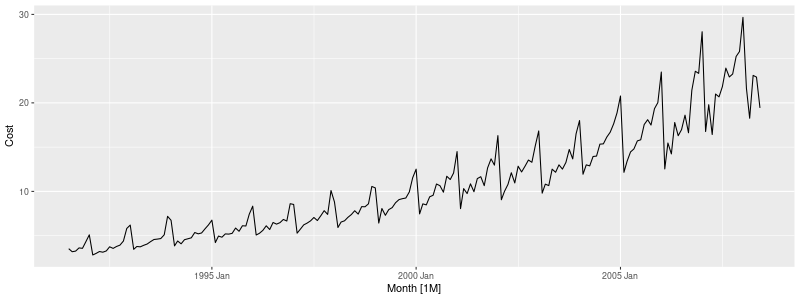

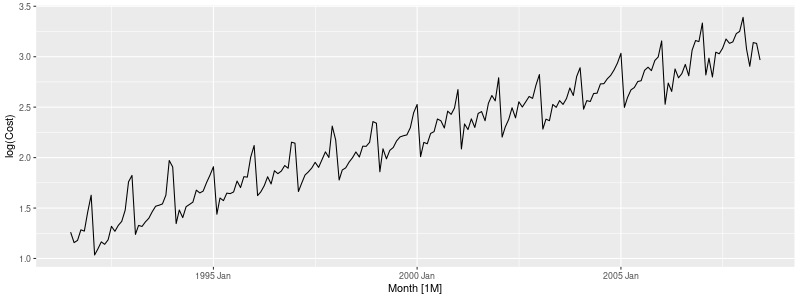

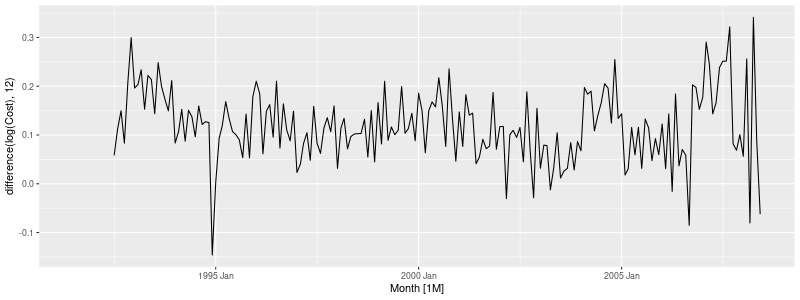

In [185]:
#diff_plot = rggplot2.autoplot(google_2018, rl('difference(Close)'))
#display(image_png(diff_plot))
# A seasonal difference can help stablize the time series yt' = yt - yt-m where m = number of seasons (monthly data m = 12, quarterly m = 4)
a10 = (DataFrame(data(tsibbledata).fetch("PBS")["PBS"])
       .filter(rl('ATC2 == "A10"'))
       .summarise(Cost = rl('sum(Cost) / 1e6')))
a10_plot = rggplot2.autoplot(a10, rl('Cost'))
display(image_png(a10_plot, height=300))
# take log to stabilize the variance
a10_log = rggplot2.autoplot(a10, rl('log(Cost)'))
display(image_png(a10_log, height=300))
# take out the seasonality by differencing
a10_diff = rggplot2.autoplot(a10, rl('difference(log(Cost), 12)'))
display(image_png(a10_diff, height = 300))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 



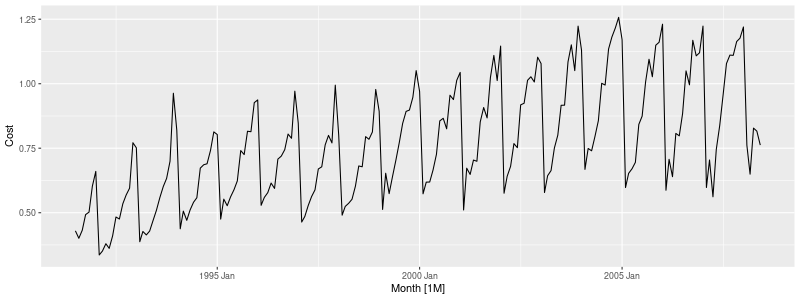

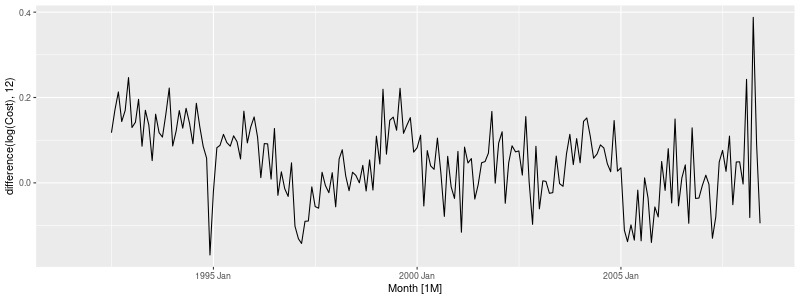

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 



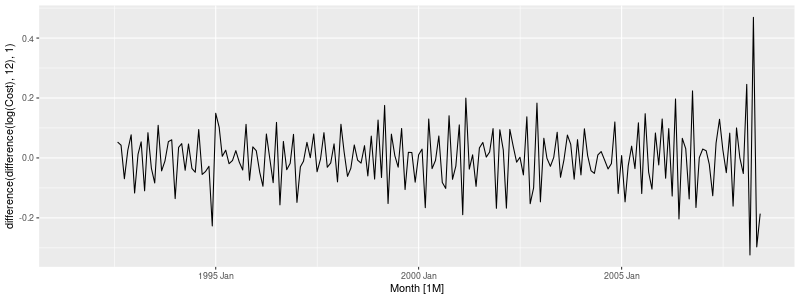

In [186]:
h02 = (DataFrame(data(tsibbledata).fetch("PBS")["PBS"])
       .filter(rl('ATC2 == "H02"'))
       .summarise(Cost = rl('sum(Cost) / 1e6')))
h02_plot = rggplot2.autoplot(h02, rl('Cost'))
display(image_png(h02_plot, height=300))
h02_diff = rggplot2.autoplot(h02, rl('difference(log(Cost), 12)')) # seasonal difference are change between one year to the next
display(image_png(h02_diff, height = 300))
# take further first differencing (i.e. change between one observation and the next)
h02_diff2 = rggplot2.autoplot(h02, rl('difference(difference(log(Cost), 12),1)'))
display(image_png(h02_diff2, height = 300))

To determine the required order of differencing: 
1. Augmented Dickey Fuller test: null hypothesis is that the data are non-stationary and non-seasonal
2. Kwiatkowski-Philips-Schmidt-Shin(KPSS) tess: null hypothesis is that the data are stationary and non-seasonal
3. Other tests available for seasonal data

In [187]:
from pprint import pprint as pp
# For non-seasonal data
google_features = fabletools.features(google_2018, rl('Close'), rl('unitroot_kpss')) 
print(google_features)

google_features2 = fabletools.features(google_2018, rl('Close'), rl('unitroot_ndiffs')) # this will tell you how many differencing to take to make it stationary
print(google_features2)

# For seasonal data
h02_features = (fabletools.features(
    DataFrame(h02).mutate(log_sales = rl('log(Cost)')), rl('log_sales'), rl('feat_stl')))
print(h02_features) # if Seasonal strength Fs > 0.64, do one seasonal difference

h02_features2 = (fabletools.features(
    DataFrame(h02).mutate(log_sales = rl('log(Cost)')), rl('log_sales'), rl('unitroot_nsdiffs')))
print(h02_features2)

h02_features3 = (fabletools.features(
    DataFrame(h02).mutate(d_log_sales = rl('difference(log(Cost), 12)')), rl('d_log_sales'), rl('unitroot_ndiffs')))
print(h02_features3)
#google_2015 |>
#  mutate(diff_close = difference(Close)) |>
#  features(diff_close, ljung_box, lag = 10)

# A tibble: 1 × 3
  Symbol kpss_stat kpss_pvalue
  <chr>      <dbl>       <dbl>
1 GOOG       0.573      0.0252

# A tibble: 1 × 2
  Symbol ndiffs
  <chr>   <int>
1 GOOG        1

# A tibble: 1 × 9
  trend_strength seasonal_strength_year seasonal_peak_year seasonal_trough_year
           <dbl>                  <dbl>              <dbl>                <dbl>
1          0.957                  0.955                  6                    8
# ℹ 5 more variables: spikiness <dbl>, linearity <dbl>, curvature <dbl>,
#   stl_e_acf1 <dbl>, stl_e_acf10 <dbl>

# A tibble: 1 × 1
  nsdiffs
    <int>
1       1

# A tibble: 1 × 1
  ndiffs
   <int>
1      1



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 13 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tsibble: 816 x 3 [1M]
# Key:       Type [4]
      Month Type                          Sales
      <mth> <fct>                         <dbl>
 1 1991 Jul Sales ($million)              0.430
 2 1991 Jul Log sales                    -0.844
 3 1991 Jul Annual change in log sales   NA    
 4 1991 Jul Doubly differenced log sales NA    
 5 1991 Aug Sales ($million)              0.401
 6 1991 Aug Log sales                    -0.914
 7 1991 Aug Annual change in log sales   NA    
 8 1991 Aug Doubly differenced log sales NA    
 9 1991 Sep Sales ($million)              0.432
10 1991 Sep Log sales                    -0.839
# ℹ 806 more rows
# ℹ Use `print(n = ...)` to see more rows



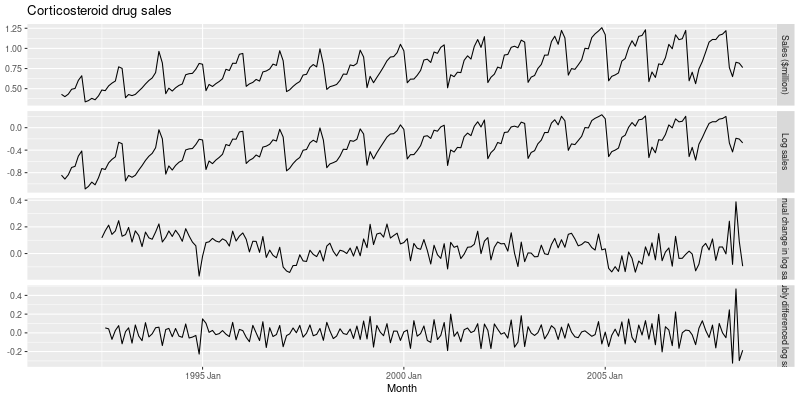

In [188]:
tidyr = importr('tidyr')
h02 = (DataFrame(data(tsibbledata).fetch("PBS")["PBS"])
       .filter(rl('ATC2 == "H02"'))
       .summarise(Cost = rl('sum(Cost) / 1e6')))
with ro.local_context() as lc:
    lc['h02'] = h02
    rcode = ('''
        h02 <- h02 |>
            transmute(
                `Sales ($million)` = Cost,
                `Log sales` = log(Cost),
                `Annual change in log sales` = difference(log(Cost), 12),
                `Doubly differenced log sales` =
                     difference(difference(log(Cost), 12), 1)
              )
        ''')
    ro.r(rcode)
    h02 = lc['h02']
h02 = (DataFrame(tidyr.pivot_longer(h02, rl('-Month'), names_to="Type", values_to="Sales"))
       .mutate(
           Type = rl('factor(Type, levels = c("Sales ($million)", "Log sales", "Annual change in log sales", "Doubly differenced log sales"))')
       ))
print(h02)
h02_plot = (ggplot2.ggplot(h02) +
            ggplot2.aes(x = rl('Month'), y = rl('Sales')) +
            ggplot2.geom_line() +
            ggplot2.facet_grid(rl('vars(Type)'), scales = "free_y") +
            ggplot2.labs(title = "Corticosteroid drug sales", y = rl('NULL')))
display(image_png(h02_plot))
#PBS |>
#  filter(ATC2 == "H02") |>
#  summarise(Cost = sum(Cost)/1e6) |>
#  transmute(
#    `Sales ($million)` = Cost,
#    `Log sales` = log(Cost),
#    `Annual change in log sales` = difference(log(Cost), 12),
#    `Doubly differenced log sales` =
#                     difference(difference(log(Cost), 12), 1)
#  ) |>
#  pivot_longer(-Month, names_to="Type", values_to="Sales") |>
#  mutate(
#    Type = factor(Type, levels = c(
#      "Sales ($million)",
#      "Log sales",
#      "Annual change in log sales",
#      "Doubly differenced log sales"))
#  ) |>
#  ggplot(aes(x = Month, y = Sales)) +
#  geom_line() +
#  facet_grid(vars(Type), scales = "free_y") +
#  labs(title = "Corticosteroid drug sales", y = NULL)

## 9.5 Non-seasonal ARIMA models

Autoregressive Moving Averate models:<br>
. Predictors include both lagged value of yt and lagged errors.<br>
. Conditions on AR coefficients ensure stationarity.<br>
. Conditions on MA coefficients ensure invertibility.<br>
Autoregressive Intergrated Moving Average models:<br>
. Combine ARMA model with differencing.<br>
. (1 - B)^dyt follows an ARMA model.
ARIMA(p,d,q) model<br>
AR: p = order of the autoregressive part<br>
I:  d = degree of first differencing involved<br>
MA: q = order of the moving average part

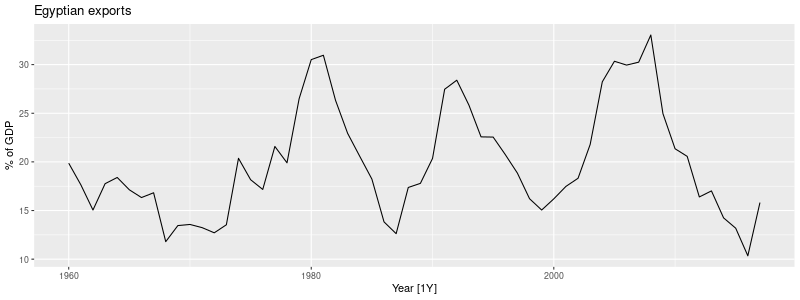

In [189]:
global_economy = data(tsibbledata).fetch("global_economy")["global_economy"]
egy_economy = DataFrame(global_economy).filter(rl('Code == "EGY"'))
with ro.local_context() as lc:
    lc['egy_economy'] = egy_economy
    rcode = ('''
        ggplot2::autoplot(egy_economy, Exports) +
            labs(y="% of GDP", title = "Egyptian exports")
        ''')
    display(image_png(ro.r(rcode),height=300))
#global_economy |>
#  filter(Code == "EGY") |>
#  autoplot(Exports) +
#  labs(y = "% of GDP", title = "Egyptian exports")

Series: Exports 
Model: ARIMA(2,0,1) w/ mean 

Coefficients:
         ar1      ar2      ma1  constant
      1.6764  -0.8034  -0.6896    2.5623
s.e.  0.1111   0.0928   0.1492    0.1161

sigma^2 estimated as 8.046:  log likelihood=-141.57
AIC=293.13   AICc=294.29   BIC=303.43
# A mable: 1 x 2
# Key:     Country [1]
  Country                 `<environment>`
  <fct>                           <model>
1 Egypt, Arab Rep. <ARIMA(2,0,1) w/ mean>



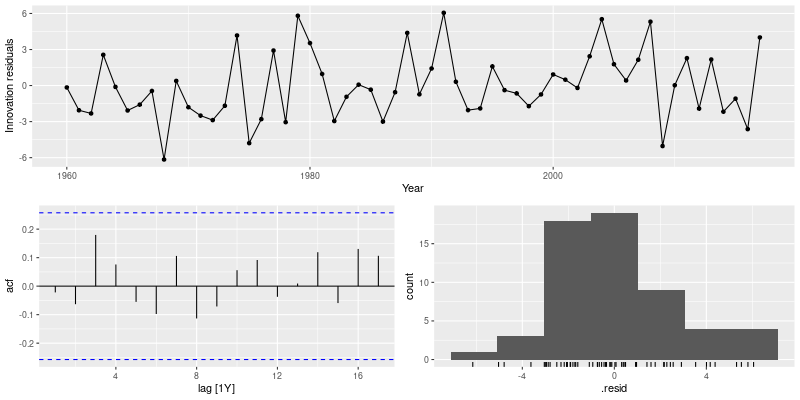

In [190]:
fit = fabletools.model(
    egy_economy,
    fable.ARIMA(rl('Exports')))
print(fabletools.report(fit))
#fit <- global_economy |>
#  filter(Code == "EGY") |>
#  model(ARIMA(Exports))
#report(fit)
#yt=2.56 + 1.68yt−1 − 0.80yt−2 −0.69εt−1 +εt, where εt is white noise with standard deviation of 2.837 = sqrt(8.046) 
egy_res = feasts.gg_tsresiduals(fit)
display(image_png(egy_res))

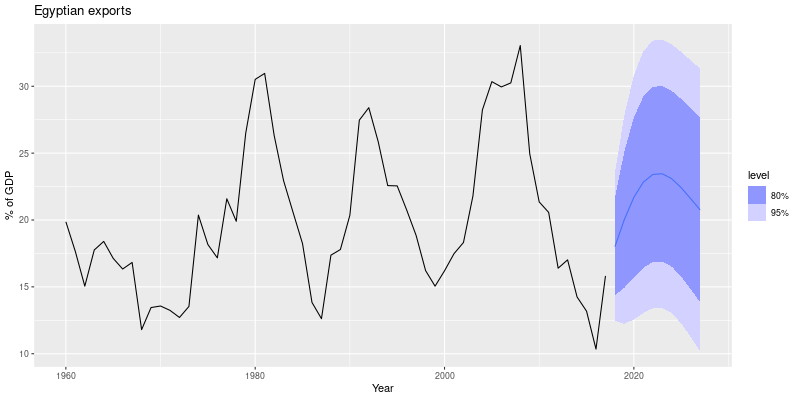

In [191]:
fc = fabletools.forecast_mdl_df(fit, h = 10)
with ro.local_context() as lc:
    lc['egy_economy'] = egy_economy
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, egy_economy) +
            labs(y="% of GDP", title = "Egyptian exports")
        ''')
    display(image_png(ro.r(rcode)))
#fit |> forecast(h=10) |>
#  autoplot(global_economy) +
#  labs(y = "% of GDP", title = "Egyptian exports")
# p and q affecting the short term part while c and d affecting the long term part of the forecast
# if you have c and d=0, the long term forecasts will go to the mean of the data
# The higher the value of d, the more rapidly the prediction intervals increase in size
# For cyclic behaviour, p need to be >= 2

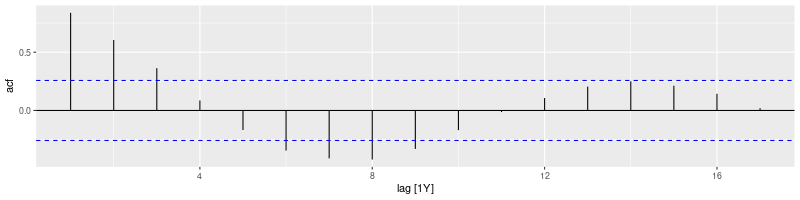

In [192]:
egy_acf = rggplot2.autoplot(feasts.ACF(egy_economy, rl('Exports')))
display(image_png(egy_acf, height=200))
#global_economy |>
#  filter(Code == "EGY") |>
#  ACF(Exports) |>
#  autoplot()

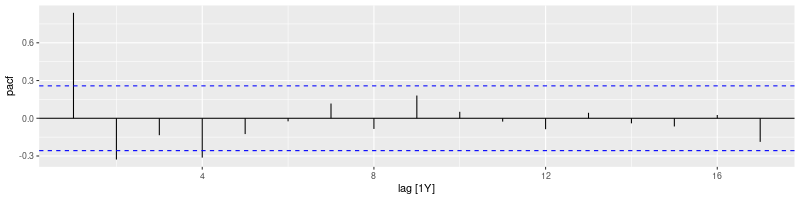

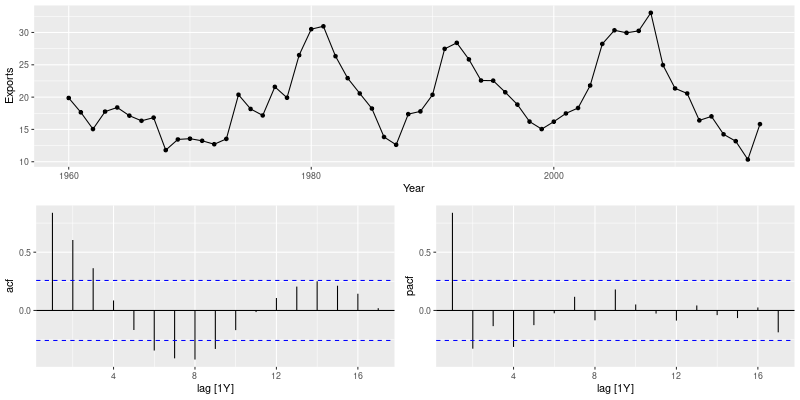

In [193]:
egy_acf = rggplot2.autoplot(feasts.PACF(egy_economy, rl('Exports')))
display(image_png(egy_acf, height=200))
#global_economy |>
#  filter(Code == "EGY") |>
#  PACF(Exports) |>
#  autoplot()

#A convenient way to produce a time plot, ACF plot and PACF plot in one command is to use the gg_tsdisplay() function 
#with plot_type = "partial"
# Last significant alpha-k (last significant Spike in pacf) indicates the order of an AR model. This trick can only be use if you have a pure AR model
egy_gg = feasts.gg_tsdisplay(egy_economy, rl('Exports'), plot_type = "partial")
display(image_png(egy_gg))

In [194]:
fit2 = fabletools.model(
    egy_economy,
    ar4 = fable.ARIMA(rl('Exports ~ pdq(4,0,0)')),
    auto = fable.ARIMA(rl('Exports')))
print(fabletools.glance_mdl_df(fit2))
#fit2 <- global_economy |>
#  filter(Code == "EGY") |>
#  model(ARIMA(Exports ~ pdq(4,0,0)))
#report(fit2)
#We can also specify particular values of pdq() that ARIMA() can search for. 
#For example, to find the best ARIMA model with p∈{1,2,3}, q∈{0,1,2} and d=1, you could use ARIMA(y ~ pdq(p=1:3, d=1, q=0:2))
fit3 = fabletools.model(
    egy_economy,
    fable.ARIMA(rl('Exports ~ pdq(p=1:3, d=1, q=0:2)')))
print(fabletools.report(fit3))

# A tibble: 2 × 9
  Country          .model sigma2 log_lik   AIC  AICc   BIC ar_roots  ma_roots 
  <fct>            <chr>   <dbl>   <dbl> <dbl> <dbl> <dbl> <list>    <list>   
1 Egypt, Arab Rep. ar4      7.88   -141.  293.  295.  305. <cpl [4]> <cpl [0]>
2 Egypt, Arab Rep. auto     8.05   -142.  293.  294.  303. <cpl [2]> <cpl [1]>

Series: Exports 
Model: ARIMA(1,1,0) 

Coefficients:
         ar1
      0.1973
s.e.  0.1327

sigma^2 estimated as 9.91:  log likelihood=-145.76
AIC=295.52   AICc=295.75   BIC=299.61
# A mable: 1 x 2
# Key:     Country [1]
  Country          `<environment>`
  <fct>                    <model>
1 Egypt, Arab Rep.  <ARIMA(1,1,0)>



AIC = -2log(L) + 2(p + q + k + 1) where L is the likelihood of the data, k = 1 if c != 0 and k = 0 if c = 0<br>
AICc = AIC + 2(p+q+k+1)(p+q+k+2)/(T-p-q-k-2)<br>
BIC = AIC + [log(T) -2](p+q+k+1)<br>
Good models are obtained by minimizing either the AIC, AICc or BIC. Our preference is to use the AICc.<br>

## 9.7 ARIMA modelling in fable

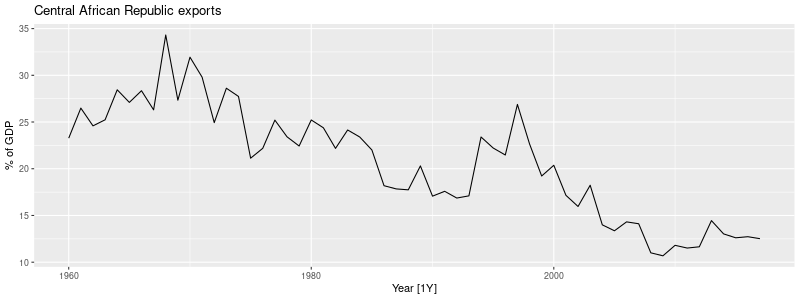

In [195]:
caf_economy = DataFrame(data(tsibbledata).fetch('global_economy')['global_economy']).filter(rl('Code == "CAF"'))
with ro.local_context() as lc:
    lc['caf_economy'] = caf_economy
    rcode = ('''
        ggplot2::autoplot(caf_economy, Exports) +
            labs(y="% of GDP", title = "Central African Republic exports")
        ''')
    display(image_png(ro.r(rcode), height=300))
#global_economy |>
#  filter(Code == "CAF") |>
#  autoplot(Exports) +
#  labs(title="Central African Republic exports",
#       y="% of GDP")

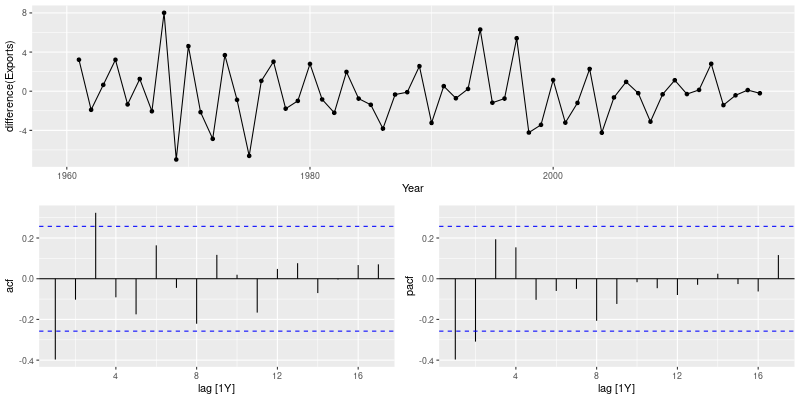

In [196]:
caf_gg = feasts.gg_tsdisplay(caf_economy, rl('difference(Exports)'), plot_type = "partial")
display(image_png(caf_gg))
#global_economy |>
#  filter(Code == "CAF") |>
#  gg_tsdisplay(difference(Exports), plot_type='partial')

In [197]:
caf_fit = fabletools.model(
    caf_economy,
    arima210 = fable.ARIMA(rl('Exports ~ pdq(2,1,0)')),
    arima013 = fable.ARIMA(rl('Exports ~ pdq(0,1,3)')),
    stepwise = fable.ARIMA(rl('Exports')),
    search = fable.ARIMA(rl('Exports'), stepwise=False))
caf_fit_x = tidyr.pivot_longer(caf_fit, rl('!Country'), names_to = "Model name", values_to = "Orders")
print(caf_fit_x)
glance_caf_fit = fabletools.glance_mdl_df(caf_fit)
print(glance_caf_fit)
print(DataFrame(dplyr.arrange(glance_caf_fit, rl('AICc'))).select(rl('.model:BIC')))
#with ro.local_context() as lc:
#    lc['caf_fit'] = caf_fit
#    rcode = ('''
#        glance_caf_fit2 <- fabletools::glance(caf_fit)
#        result <- dplyr::arrange(glance_caf_fit2, AICc) |> select(.model:BIC)
#        ''')
#    ro.r(rcode)
#    glance_caf_fit2 = lc['glance_caf_fit2']
#    result = lc['result']
#print(glance_caf_fit2)
#print(result)
#caf_fit <- global_economy |>
#  filter(Code == "CAF") |>
#  model(arima210 = ARIMA(Exports ~ pdq(2,1,0)),
#        arima013 = ARIMA(Exports ~ pdq(0,1,3)),
#        stepwise = ARIMA(Exports),
#        search = ARIMA(Exports, stepwise=FALSE))

#caf_fit |> pivot_longer(!Country, names_to = "Model name",
#                         values_to = "Orders")
#glance(caf_fit) |> arrange(AICc) |> select(.model:BIC)

# A mable: 4 x 3
# Key:     Country, Model name [4]
  Country                  `Model name`         Orders
  <fct>                    <chr>               <model>
1 Central African Republic arima210     <ARIMA(2,1,0)>
2 Central African Republic arima013     <ARIMA(0,1,3)>
3 Central African Republic stepwise     <ARIMA(2,1,2)>
4 Central African Republic search       <ARIMA(3,1,0)>

# A tibble: 4 × 9
  Country              .model sigma2 log_lik   AIC  AICc   BIC ar_roots ma_roots
  <fct>                <chr>   <dbl>   <dbl> <dbl> <dbl> <dbl> <list>   <list>  
1 Central African Rep… arima…   6.71   -134.  275.  275.  281. <cpl>    <cpl>   
2 Central African Rep… arima…   6.54   -133.  274.  275.  282. <cpl>    <cpl>   
3 Central African Rep… stepw…   6.42   -132.  274.  275.  284. <cpl>    <cpl>   
4 Central African Rep… search   6.52   -133.  274.  275.  282. <cpl>    <cpl>   

# A tibble: 4 × 6
  .model   sigma2 log_lik   AIC  AICc   BIC
  <chr>     <dbl>   <dbl> <dbl> <dbl> <dbl>
1 sear

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 1 row containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 1 row containing missing values or values outside the scale range
(`geom_point()`). 



# A mable: 1 x 5
# Key:     Country [1]
  Country                  arima210       arima013       stepwise         search
  <fct>                     <model>        <model>        <model>        <model>
1 Central African R… <ARIMA(2,1,0)> <ARIMA(0,1,3)> <ARIMA(2,1,2)> <ARIMA(3,1,0)>



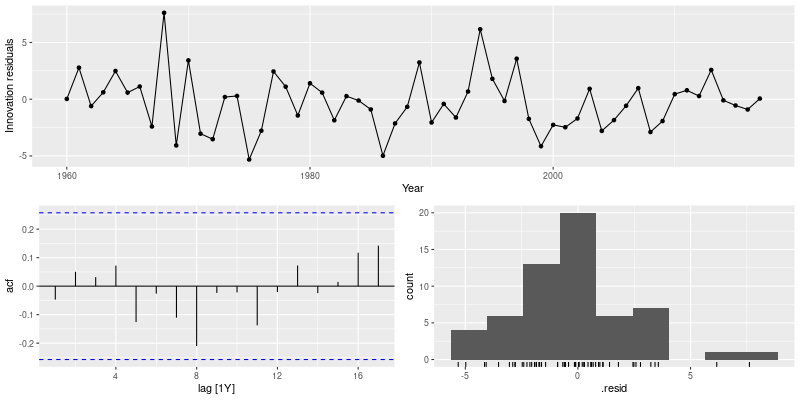

In [198]:
print(caf_fit)
caf_gg_search = feasts.gg_tsresiduals(DataFrame(caf_fit).select(rl('search')))
display(image_png(caf_gg_search))
#caf_fit |>
#  select(search) |>
#  gg_tsresiduals()

In [199]:
caf_features = fabletools.features(DataFrame(fabletools.augment_mdl_df(caf_fit)).filter(rl('.model=="search"')), 
                                   rl('.innov'), rl('ljung_box'), lag = 10, dof = 3) 
print(caf_features)
#augment(caf_fit) |>
#  filter(.model=='search') |>
#  features(.innov, ljung_box, lag = 10, dof = 3)  #non-seasonal data, always use lag = 10; dof(i.e. degree of freedom) is # of parameters: p plus q = 3

# A tibble: 1 × 4
  Country                  .model lb_stat lb_pvalue
  <fct>                    <chr>    <dbl>     <dbl>
1 Central African Republic search    5.75     0.569



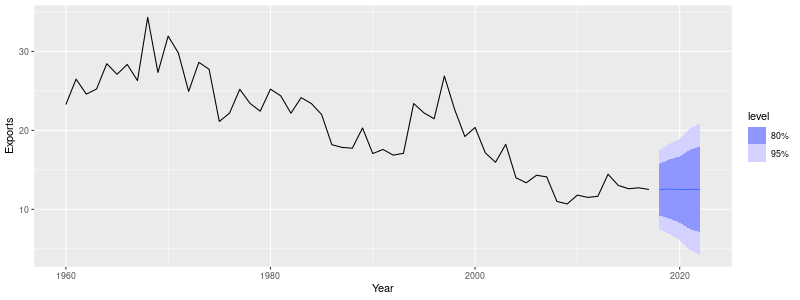

In [200]:
caf_fc = fabletools.forecast_mdl_df(caf_fit, h = 5)
#print(caf_fc)
caf_gg_plot = rggplot2.autoplot(DataFrame(caf_fc).filter(rl('.model=="search"')), caf_economy)
display(image_png(caf_gg_plot, height=300))
#caf_fit |>
#  forecast(h=5) |>
#  filter(.model=='search') |>
#  autoplot(global_economy)

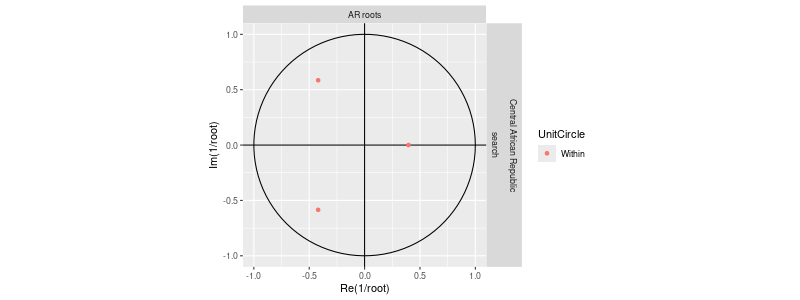

In [201]:
caf_gg_arma = feasts.gg_arma(DataFrame(caf_fit).select(rl('Country'), rl('search')))
display(image_png(caf_gg_arma, height=300))
#gg_arma(caf_fit |> select(Country, search))

## 9.9 Seasonal ARIMA models

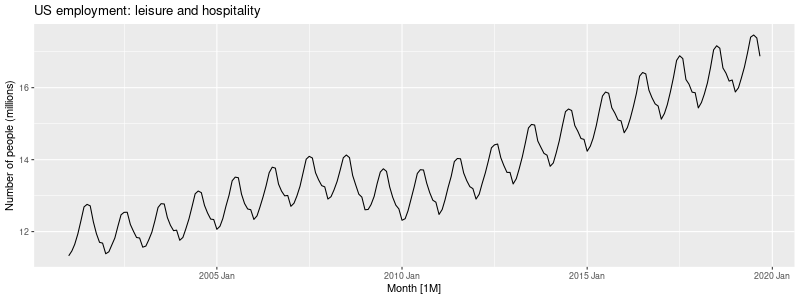

In [202]:
leisure = (DataFrame(data(fpp3).fetch('us_employment')['us_employment'])
          .filter(rl('Title == "Leisure and Hospitality"'), rl('year(Month) > 2000'))
          .mutate(Employed = rl('Employed/1000'))
          .select(rl('Month'), rl('Employed')))
with ro.local_context() as lc:
    lc['leisure'] = leisure
    rcode = ('''
        ggplot2::autoplot(leisure, Employed) +
            labs(title = "US employment: leisure and hospitality",
                 y="Number of people (millions)")
        ''')
    display(image_png(ro.r(rcode), height=300))
#leisure <- us_employment |>
#  filter(Title == "Leisure and Hospitality",
#         year(Month) > 2000) |>
#  mutate(Employed = Employed/1000) |>
#  select(Month, Employed)
#autoplot(leisure, Employed) +
#  labs(title = "US employment: leisure and hospitality",
#       y="Number of people (millions)")

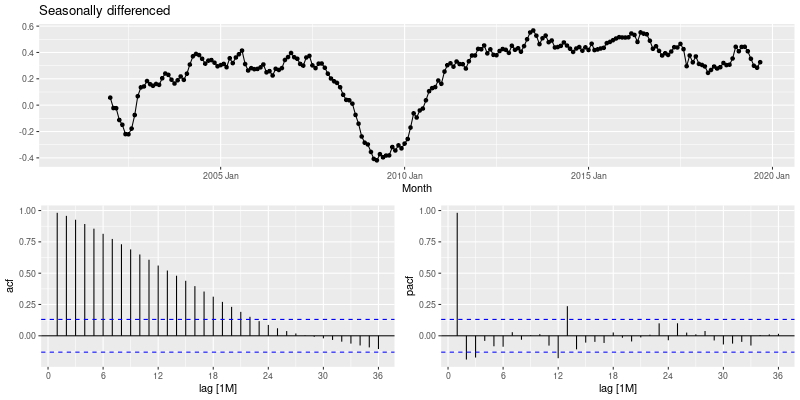

In [203]:
with ro.local_context() as lc:
    lc['leisure'] = leisure
    rcode = ('''
        feasts::gg_tsdisplay(leisure, difference(Employed, 12),
            plot_type='partial', lag=36) +
            labs(title = "Seasonally differenced", y="")
        ''')
    display(image_png(ro.r(rcode)))
#leisure |>
#  gg_tsdisplay(difference(Employed, 12),
#               plot_type='partial', lag=36) +
#  labs(title="Seasonally differenced", y="")

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 12 rows containing missing values or values outside the scale range
(`geom_point()`). 



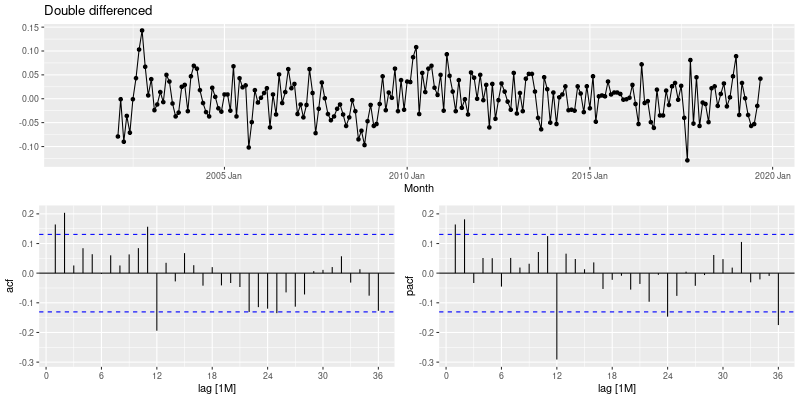

In [204]:
with ro.local_context() as lc:
    lc['leisure'] = leisure
    rcode = ('''
        feasts::gg_tsdisplay(leisure, difference(Employed, 12) |> difference(),
            plot_type='partial', lag=36) +
            labs(title = "Double differenced", y="")
        ''')
    display(image_png(ro.r(rcode)))
#leisure |>
#  gg_tsdisplay(difference(Employed, 12) |> difference(),
#               plot_type='partial', lag=36) +
#  labs(title = "Double differenced", y="")

In [205]:
fit = fabletools.model(
    leisure,
    arima012011 = fable.ARIMA(rl('Employed ~ pdq(0,1,2) + PDQ(0,1,1)')),
    arima210011 = fable.ARIMA(rl('Employed ~ pdq(2,1,0) + PDQ(0,1,1)')),
    auto = fable.ARIMA(rl('Employed'), stepwise = False, approx = False))

In [206]:
fit_x = tidyr.pivot_longer(fit, rl('everything()'), names_to = "Model name", values_to = "Orders")
print(fit_x)
fit_glance = DataFrame(dplyr.arrange(fabletools.glance_mdl_df(fit), rl('AICc'))).select(rl('.model:BIC'))
print(fit_glance)
#fit <- leisure |>
#  model(
#    arima012011 = ARIMA(Employed ~ pdq(0,1,2) + PDQ(0,1,1)),
#    arima210011 = ARIMA(Employed ~ pdq(2,1,0) + PDQ(0,1,1)),
#    auto = ARIMA(Employed, stepwise = FALSE, approx = FALSE)
#  )
#fit |> pivot_longer(everything(), names_to = "Model name",
#                     values_to = "Orders")
#glance(fit) |> arrange(AICc) |> select(.model:BIC)

# A mable: 3 x 2
# Key:     Model name [3]
  `Model name`                    Orders
  <chr>                          <model>
1 arima012011  <ARIMA(0,1,2)(0,1,1)[12]>
2 arima210011  <ARIMA(2,1,0)(0,1,1)[12]>
3 auto         <ARIMA(2,1,0)(1,1,1)[12]>

# A tibble: 3 × 6
  .model       sigma2 log_lik   AIC  AICc   BIC
  <chr>         <dbl>   <dbl> <dbl> <dbl> <dbl>
1 auto        0.00142    395. -780. -780. -763.
2 arima210011 0.00145    392. -776. -776. -763.
3 arima012011 0.00146    391. -775. -775. -761.



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 13 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 13 rows containing missing values or values outside the scale range
(`geom_point()`). 



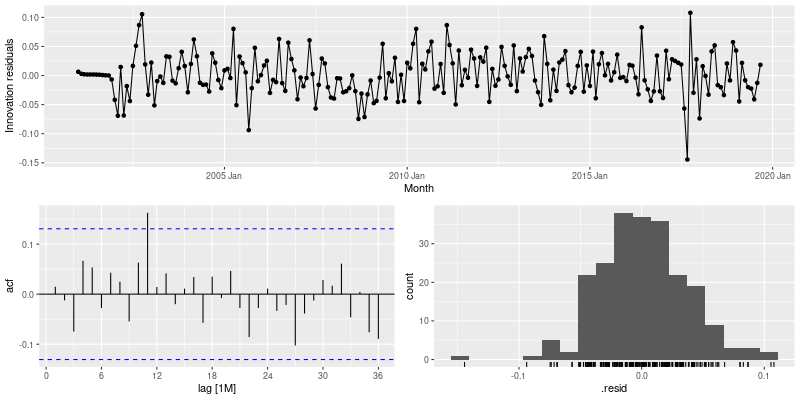

In [207]:
us_gg_auto = feasts.gg_tsresiduals(DataFrame(fit).select(rl('auto')), lag=36)
display(image_png(us_gg_auto))
#fit |> select(auto) |> gg_tsresiduals(lag=36)

In [208]:
us_features = fabletools.features(DataFrame(fabletools.augment_mdl_df(fit)).filter(rl('.model=="auto"')), 
                                   rl('.innov'), rl('ljung_box'), lag = 24, dof = 4) 
print(us_features)
#augment(fit) |>
#  filter(.model == "auto") |>
#  features(.innov, ljung_box, lag=24, dof=4)

# A tibble: 1 × 3
  .model lb_stat lb_pvalue
  <chr>    <dbl>     <dbl>
1 auto      16.6     0.680



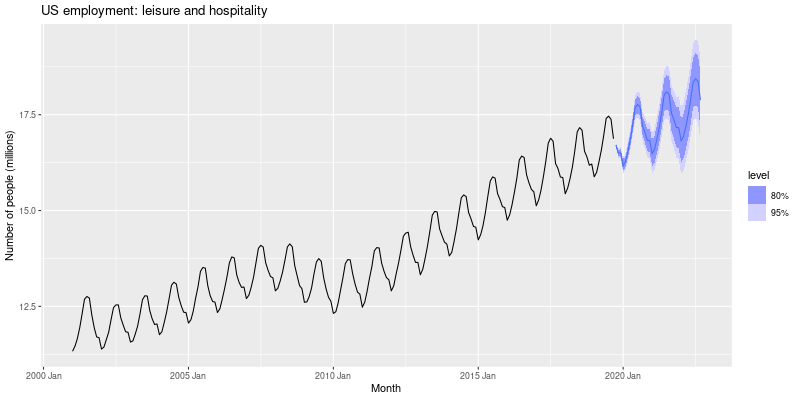

In [209]:
fc = fabletools.forecast_mdl_df(fit, h=36)
with ro.local_context() as lc:
    lc['leisure'] = leisure
    lc['fc'] =fc
    rcode = ('''
        ggplot2::autoplot(fc |> filter(.model=='auto'),
            leisure) +
            labs(title = "US employment: leisure and hospitality",
                 y="Number of people (millions)")
        ''')
    display(image_png(ro.r(rcode)))
#forecast(fit, h=36) |>
#  filter(.model=='auto') |>
#  autoplot(leisure) +
#  labs(title = "US employment: leisure and hospitality",
#       y="Number of people (millions)")

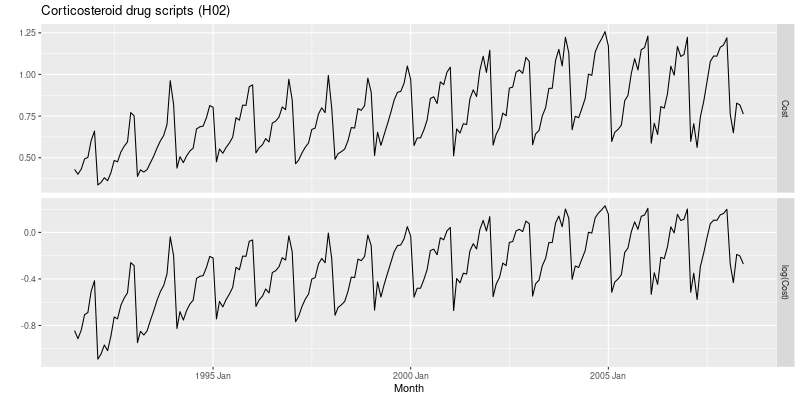

# A tsibble: 408 x 3 [1M]
# Key:       name [2]
      Month name       value
      <mth> <chr>      <dbl>
 1 1991 Jul Cost       0.430
 2 1991 Jul log(Cost) -0.844
 3 1991 Aug Cost       0.401
 4 1991 Aug log(Cost) -0.914
 5 1991 Sep Cost       0.432
 6 1991 Sep log(Cost) -0.839
 7 1991 Oct Cost       0.493
 8 1991 Oct log(Cost) -0.708
 9 1991 Nov Cost       0.502
10 1991 Nov log(Cost) -0.688
# ℹ 398 more rows
# ℹ Use `print(n = ...)` to see more rows



In [210]:
h02 = (DataFrame(data(tsibbledata).fetch('PBS')['PBS'])
       .filter(rl('ATC2 == "H02"'))
       .summarise(Cost = rl('sum(Cost)/1e6')))
with ro.local_context() as lc:
    lc['h02'] = h02
    rcode = ('''
         h02x <- h02 |>
            mutate(log(Cost)) |>
            pivot_longer(-Month)
        ''')
    ro.r(rcode)
    h02x = lc['h02x']
    rcode2 = ('''
         ggplot(h02x, aes(x = Month, y = value)) +
            geom_line() +
            facet_grid(name ~ ., scales = "free_y") +
            labs(y="", title="Corticosteroid drug scripts (H02)")
        ''')
    display(image_png(ro.r(rcode2)))
print(h02x)        
#h02 <- PBS |>
#  filter(ATC2 == "H02") |>
#  summarise(Cost = sum(Cost)/1e6)
#h02 |>
#  mutate(log(Cost)) |>
#  pivot_longer(-Month) |>
#  ggplot(aes(x = Month, y = value)) +
#  geom_line() +
#  facet_grid(name ~ ., scales = "free_y") +
#  labs(y="", title="Corticosteroid drug scripts (H02)")

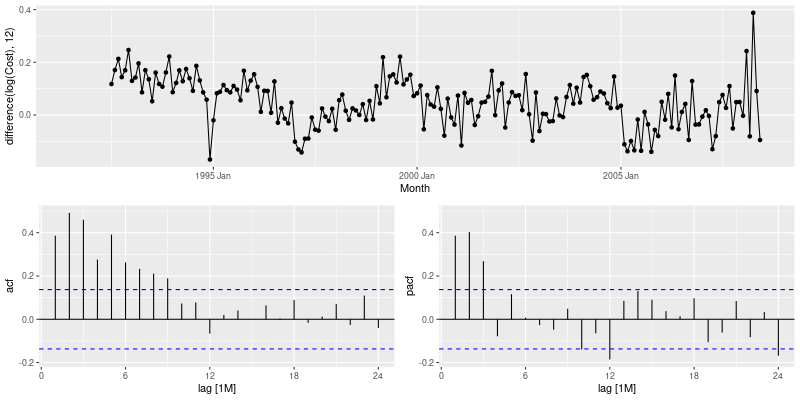

In [211]:
us_gg_log = feasts.gg_tsdisplay(h02, rl('difference(log(Cost), 12)'),
                               plot_type='partial', lag_max = 24)
display(image_png(us_gg_log))
#h02 |> gg_tsdisplay(difference(log(Cost), 12),
#                     plot_type='partial', lag_max = 24)

Series: Cost 
Model: ARIMA(3,0,1)(0,1,2)[12] 
Transformation: log(Cost) 

Coefficients:
          ar1     ar2     ar3     ma1     sma1     sma2
      -0.1603  0.5481  0.5678  0.3827  -0.5222  -0.1768
s.e.   0.1636  0.0878  0.0942  0.1895   0.0861   0.0872

sigma^2 estimated as 0.004278:  log likelihood=250.04
AIC=-486.08   AICc=-485.48   BIC=-463.28


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 12 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Removed 12 rows containing missing values or values outside the scale range
(`geom_point()`). 



# A mable: 1 x 1
            `<environment>`
                    <model>
1 <ARIMA(3,0,1)(0,1,2)[12]>



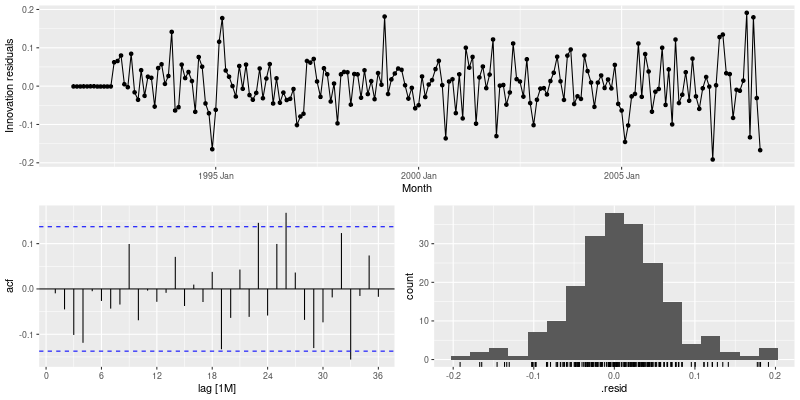

In [212]:
fit = fabletools.model(
    h02,
    fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3,0,1) + PDQ(0,1,2)')))
print(fabletools.report(fit))
fit_gg = feasts.gg_tsresiduals(fit, lag_max=36)
display(image_png(fit_gg))
#fit <- h02 |>
#  model(ARIMA(log(Cost) ~ 0 + pdq(3,0,1) + PDQ(0,1,2)))
#fit |> gg_tsresiduals(lag_max=36)

In [213]:
us_features = fabletools.features(fabletools.augment_mdl_df(fit), 
                                   rl('.innov'), rl('ljung_box'), lag = 36, dof = 6) 
print(us_features)
#augment(fit) |>
#  features(.innov, ljung_box, lag = 36, dof = 6)  # 0.0104 is significant!

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    50.7    0.0104



In [214]:
fit = fabletools.model(h02, auto = fable.ARIMA(rl('log(Cost)')))
print(fabletools.report(fit))

Series: Cost 
Model: ARIMA(2,1,0)(0,1,1)[12] 
Transformation: log(Cost) 

Coefficients:
          ar1      ar2     sma1
      -0.8491  -0.4207  -0.6401
s.e.   0.0712   0.0714   0.0694

sigma^2 estimated as 0.004387:  log likelihood=245.39
AIC=-482.78   AICc=-482.56   BIC=-469.77
# A mable: 1 x 1
                       auto
                    <model>
1 <ARIMA(2,1,0)(0,1,1)[12]>



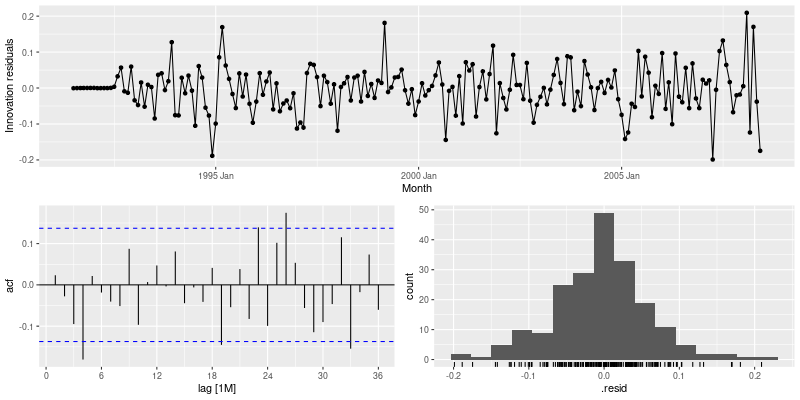

In [215]:
fit_gg2 = feasts.gg_tsresiduals(fit, lag_max=36)
display(image_png(fit_gg2))

In [216]:
us_features2 = fabletools.features(fabletools.augment_mdl_df(fit), 
                                   rl('.innov'), rl('ljung_box'), lag = 36, dof = 3) 
print(us_features2)

# A tibble: 1 × 3
  .model lb_stat lb_pvalue
  <chr>    <dbl>     <dbl>
1 auto      59.3   0.00332



In [217]:
# As both are worse, let make it work really really hard
fit = fabletools.model(h02,
                       best = fable.ARIMA(rl('log(Cost)'),
                                          stepwise=False, approximation=False,
                                          order_constraint = rl('p + q + P + Q <= 9')))
print(fabletools.report(fit))

Series: Cost 
Model: ARIMA(4,1,1)(2,1,2)[12] 
Transformation: log(Cost) 

Coefficients:
          ar1     ar2     ar3      ar4      ma1    sar1     sar2     sma1
      -0.0425  0.2098  0.2017  -0.2273  -0.7424  0.6213  -0.3832  -1.2019
s.e.   0.2167  0.1813  0.1144   0.0810   0.2074  0.2421   0.1185   0.2491
        sma2
      0.4959
s.e.  0.2135

sigma^2 estimated as 0.004049:  log likelihood=254.31
AIC=-488.63   AICc=-487.4   BIC=-456.1
# A mable: 1 x 1
                       best
                    <model>
1 <ARIMA(4,1,1)(2,1,2)[12]>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Model specification induces a quadratic or higher order polynomial trend. 
This is generally discouraged, consider removing the constant or reducing the number of differences. 



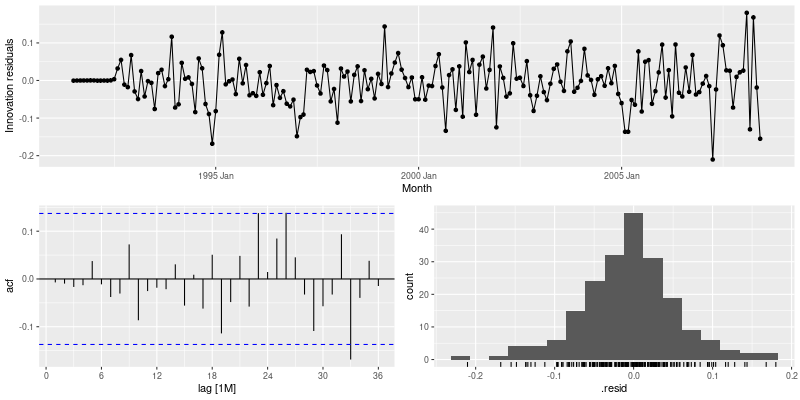

In [218]:
fit_gg3 = feasts.gg_tsresiduals(fit, lag_max=36)
display(image_png(fit_gg3))

In [219]:
us_features3 = fabletools.features(fabletools.augment_mdl_df(fit), 
                                   rl('.innov'), rl('ljung_box'), lag = 36, dof = 9) 
print(us_features3)  # it's better than 0.05 which is good

# A tibble: 1 × 3
  .model lb_stat lb_pvalue
  <chr>    <dbl>     <dbl>
1 best      36.5     0.106



In [220]:
# Traing data: July 1991 to June 2006
# Test data: July 2006 - June 2008
fit2 = fabletools.model(
    tsibble.filter_index(h02, rl('~ "2006 Jun"')),
    arima301111 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 1) + PDQ(1, 1, 1)')),
    arima301012 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 1) + PDQ(0, 1, 2)')),
    arima301011 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 1) + PDQ(0, 1, 1)')),
    arima210011 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(2, 1, 0) + PDQ(0, 1, 1)')),
    arima411212 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(4, 1, 1) + PDQ(2, 1, 2)')),
    arima302210 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 2) + PDQ(2, 1, 0)')),
    arima301210 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 1) + PDQ(2, 1, 0)')),
    arima301110 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 1) + PDQ(1, 1, 0)')),
    arima300210 = fable.ARIMA(rl('log(Cost) ~ 0 + pdq(3, 0, 0) + PDQ(2, 1, 0)'))
)

In [221]:
fit2_x = tidyr.pivot_longer(fit2, rl('everything()'), names_to = "Model name", values_to = "Orders")
print(fit2_x)
fit2_glance = DataFrame(dplyr.arrange(fabletools.glance_mdl_df(fit2), rl('AICc'))).select(rl('.model:BIC'))
print(fit2_glance)

# A mable: 9 x 2
# Key:     Model name [9]
  `Model name`                    Orders
  <chr>                          <model>
1 arima301111  <ARIMA(3,0,1)(1,1,1)[12]>
2 arima301012  <ARIMA(3,0,1)(0,1,2)[12]>
3 arima301011  <ARIMA(3,0,1)(0,1,1)[12]>
4 arima210011  <ARIMA(2,1,0)(0,1,1)[12]>
5 arima411212  <ARIMA(4,1,1)(2,1,2)[12]>
6 arima302210  <ARIMA(3,0,2)(2,1,0)[12]>
7 arima301210  <ARIMA(3,0,1)(2,1,0)[12]>
8 arima301110  <ARIMA(3,0,1)(1,1,0)[12]>
9 arima300210  <ARIMA(3,0,0)(2,1,0)[12]>

# A tibble: 9 × 6
  .model       sigma2 log_lik   AIC  AICc   BIC
  <chr>         <dbl>   <dbl> <dbl> <dbl> <dbl>
1 arima301012 0.00356    235. -455. -454. -433.
2 arima411212 0.00340    237. -455. -453. -424.
3 arima301111 0.00363    233. -453. -452. -431.
4 arima210011 0.00372    229. -450. -450. -437.
5 arima301011 0.00373    231. -450. -449. -431.
6 arima300210 0.00376    231. -449. -449. -431.
7 arima301210 0.00375    231. -449. -448. -427.
8 arima302210 0.00376    231. -447. -446. -422.
9 arima

In [222]:
fc2 = fabletools.forecast_mdl_df(fit2, h = "2 years")
#print(fabletools.accuracy_fbl_ts(fc2, h02))
print(dplyr.arrange(fabletools.accuracy_fbl_ts(fc2, h02), rl('RMSE'))) ## We would choose arima301012 because AICc is the lowest

# A tibble: 9 × 10
  .model      .type        ME   RMSE    MAE    MPE  MAPE  MASE RMSSE   ACF1
  <chr>       <chr>     <dbl>  <dbl>  <dbl>  <dbl> <dbl> <dbl> <dbl>  <dbl>
1 arima301111 Test   0.00109  0.0619 0.0482 -0.381  5.73 0.806 0.860 -0.210
2 arima301012 Test  -0.00731  0.0621 0.0483 -1.35   5.84 0.808 0.864 -0.205
3 arima301011 Test   0.00572  0.0630 0.0485  0.208  5.72 0.812 0.875 -0.209
4 arima210011 Test   0.000462 0.0630 0.0479 -0.377  5.68 0.801 0.876 -0.253
5 arima411212 Test  -0.0213   0.0631 0.0516 -2.89   6.24 0.863 0.878 -0.251
6 arima302210 Test  -0.0128   0.0651 0.0514 -1.80   6.19 0.860 0.906 -0.163
7 arima301210 Test  -0.0129   0.0653 0.0512 -1.80   6.16 0.856 0.908 -0.168
8 arima301110 Test   0.00583  0.0666 0.0491  0.462  5.74 0.822 0.927 -0.246
9 arima300210 Test  -0.0141   0.0668 0.0533 -1.92   6.36 0.891 0.929 -0.197



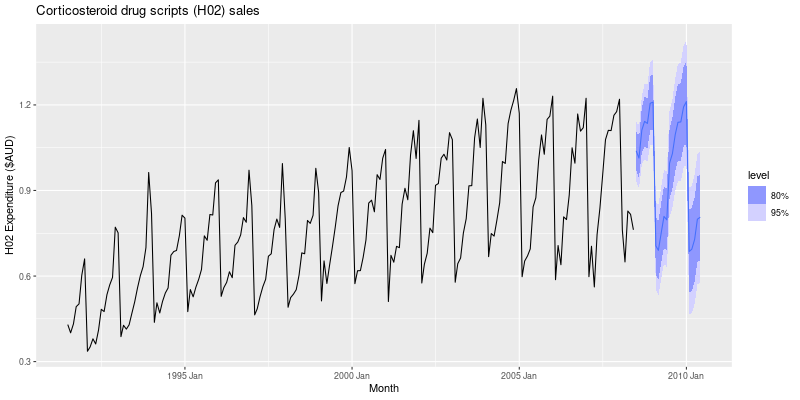

In [223]:
fit = fabletools.model(h02, fable.ARIMA(rl('Cost ~ 0 + pdq(3,0,1) + PDQ(0,1,2)')))
fc = fabletools.forecast_mdl_df(fit)
with ro.local_context() as lc:
    lc['h02'] = h02
    lc['fc'] =fc
    rcode = ('''
        ggplot2::autoplot(fc, h02) +
            labs(y="H02 Expenditure ($AUD)",
                 title="Corticosteroid drug scripts (H02) sales")
        ''')
    display(image_png(ro.r(rcode)))
#h02 |>
#  model(ARIMA(log(Cost) ~ 0 + pdq(3,0,1) + PDQ(0,1,2))) |>
#  forecast() |>
#  autoplot(h02) +
#  labs(y=" $AU (millions)",
#       title="Corticosteroid drug scripts (H02) sales")

## 9.10 ARIMA vs ETS

In [224]:
aus_economy = (DataFrame(data(tsibbledata).fetch('global_economy')['global_economy'])
               .filter(rl('Code == "AUS"'))
               .mutate(Population = rl('Population/1e6')))
#aus_economy <- global_economy |>
#  filter(Code == "AUS") |>
#  mutate(Population = Population/1e6)
fit = fabletools.model(
    tsibble.stretch_tsibble(
        dplyr.slice(aus_economy, rl('-n()')),
        1,
        10),
    ets = fable.ETS(rl('Population')),
    arima = fable.ARIMA(rl('Population'))
    )
fc = fabletools.forecast_mdl_df(fit, h = 1)
print(DataFrame(fabletools.accuracy_fbl_ts(fc, aus_economy)).select(rl('.model'), rl('RMSE:MAPE')))
#aus_economy |>
#  slice(-n()) |>
#  stretch_tsibble(.init = 10) |>
#  model(
#    ETS(Population),
#    ARIMA(Population)
#  ) |>
#  forecast(h = 1) |>
#  accuracy(aus_economy) |>
#  select(.model, RMSE:MAPE)
# ETS get lowest RMSE than ARIMA

# A tibble: 2 × 5
  .model   RMSE    MAE   MPE  MAPE
  <chr>   <dbl>  <dbl> <dbl> <dbl>
1 arima  0.194  0.0789 0.277 0.509
2 ets    0.0774 0.0543 0.112 0.327



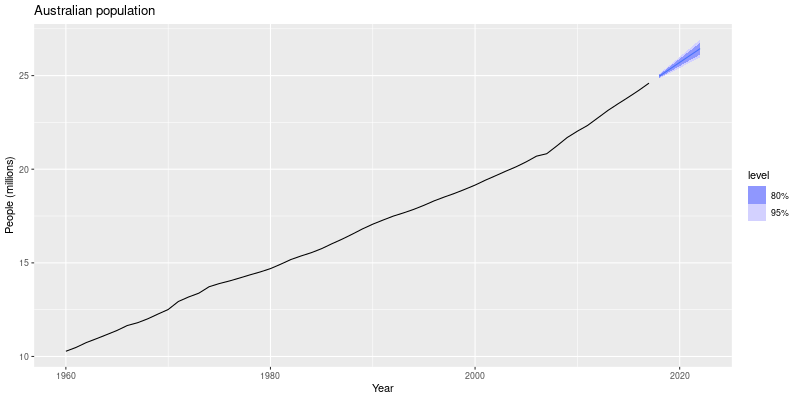

In [225]:
fit = fabletools.model(
    aus_economy,
    fable.ETS(rl('Population')))
fc = fabletools.forecast_mdl_df(fit, h = "5 years")
with ro.local_context() as lc:
    lc['aus_economy'] = aus_economy
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, aus_economy) +
            labs(title = "Australian population",
                 y = "People (millions)")
        ''')
    display(image_png(ro.r(rcode)))
#aus_economy |>
#  model(ETS(Population)) |>
#  forecast(h = "5 years") |>
#  autoplot(aus_economy |> filter(Year >= 2000)) +
#  labs(title = "Australian population",
#       y = "People (millions)")

In [226]:
# For seasonal data
aus_production = data(tsibbledata).fetch('aus_production')['aus_production']
cement = (DataFrame(
    tsibble.filter_index(
        aus_production, rl('"1988 Q1" ~ .')
    )).select(rl('Cement')))
train = tsibble.filter_index(
    cement, rl('. ~ "2007 Q4"'))
fit = fabletools.model(
    train,
    arima = fable.ARIMA(rl('Cement')),
    ets = fable.ETS(rl('Cement'))
)
print(fabletools.report(DataFrame(fit).select(rl('arima'))))
print(fabletools.report(DataFrame(fit).select(rl('ets'))))
#cement <- aus_production |>
#  select(Cement) |>
#  filter_index("1988 Q1" ~ .)
#train <- cement |> filter_index(. ~ "2007 Q4")
#fit <- train |>
#    model(
#      arima = ARIMA(Cement),
#      ets = ETS(Cement)
#    )
#fit |>
#  select(arima) |>
#  report
#fit |>
#  select(ets) |>
#  report
# Cannot compare AICc because both models compute it differently. The only way can compare them is on the test set

Series: Cement 
Model: ARIMA(1,0,1)(2,1,1)[4] w/ drift 

Coefficients:
         ar1      ma1   sar1     sar2     sma1  constant
      0.8886  -0.2366  0.081  -0.2345  -0.8979    5.3884
s.e.  0.0842   0.1334  0.157   0.1392   0.1780    1.4844

sigma^2 estimated as 11456:  log likelihood=-463.52
AIC=941.03   AICc=942.68   BIC=957.35
# A mable: 1 x 1
                              arima
                            <model>
1 <ARIMA(1,0,1)(2,1,1)[4] w/ drift>

Series: Cement 
Model: ETS(M,N,M) 
  Smoothing parameters:
    alpha = 0.7533714 
    gamma = 0.0001000093 

  Initial states:
     l[0]     s[0]    s[-1]    s[-2]     s[-3]
 1694.712 1.031179 1.045209 1.011424 0.9121874

  sigma^2:  0.0034

     AIC     AICc      BIC 
1104.095 1105.650 1120.769 
# A mable: 1 x 1
           ets
       <model>
1 <ETS(M,N,M)>



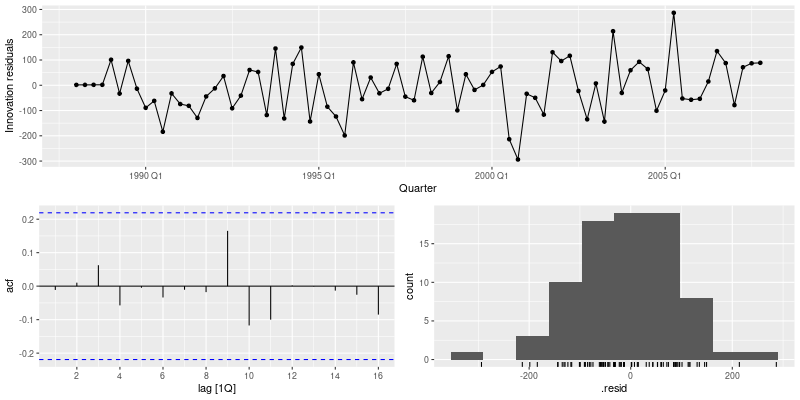

In [227]:
fit_resid = feasts.gg_tsresiduals(DataFrame(fit).select(rl('arima')), lag_max = 16) # It looks pretty good
display(image_png(fit_resid))

In [228]:
arima_features = (fabletools.features(
    fabletools.augment_mdl_df(
        DataFrame(fit).select(rl('arima'))),
    rl('.innov'), rl('ljung_box'), lag = 16, dof = 6))
ets_features = (fabletools.features(
    fabletools.augment_mdl_df(
        DataFrame(fit).select(rl('ets'))),
    rl('.innov'), rl('ljung_box'), lag = 16))
print(arima_features)
print(ets_features)
#fit |>
#  select(arima) |>
#  augment() |>
#  features(.innov, ljung_box, lag = 16, dof = 6) # ARIMA model need to include dof and pvalue is quite significant, i.e. no problem with it
#fit |>
#  select(ets) |>
#  augment() |>
#  features(.innov, ljung_box, lag = 16) # ets also pass this test

# A tibble: 1 × 3
  .model lb_stat lb_pvalue
  <chr>    <dbl>     <dbl>
1 arima     6.37     0.783

# A tibble: 1 × 3
  .model lb_stat lb_pvalue
  <chr>    <dbl>     <dbl>
1 ets       10.0     0.865



In [229]:
fit_accuracy = (DataFrame(
    fabletools.accuracy_fbl_ts(
        fabletools.forecast_mdl_df(fit, h = "2 years 6 months"),
        cement)).select(rl('-ME'), rl('-MPE'), rl('-ACF1')))
print(fit_accuracy) 
#fit |>
#  forecast(h = "2 years 6 months") |>
#  accuracy(cement) |>
#  select(-ME, -MPE, -ACF1)  # ARIMA model is slightly better than ETS comparing RMSE and therefore we would choose ARIMA

# A tibble: 2 × 7
  .model .type  RMSE   MAE  MAPE  MASE RMSSE
  <chr>  <chr> <dbl> <dbl> <dbl> <dbl> <dbl>
1 arima  Test   216.  186.  8.68  1.27  1.26
2 ets    Test   222.  191.  8.85  1.30  1.29



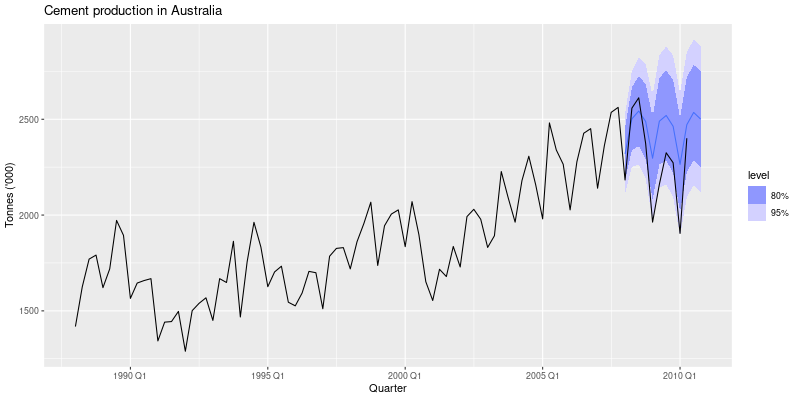

In [230]:
fc = fabletools.forecast_mdl_df(DataFrame(fit).select(rl('arima')), h = "3 years")
with ro.local_context() as lc:
    lc['cement'] = cement
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, cement) +
            labs(title = "Cement production in Australia", y = "Tonnes ('000)")
        ''')
    display(image_png(ro.r(rcode)))
#fit |>
#  select(arima) |>
#  forecast(h = "3 years") |>
#  autoplot(cement) +
#  labs(title = "Cement production in Australia", y = "Tonnes ('000)")
# It is not a great model because actual value close to the edge of the prediction level.

Series: Cement 
Model: ARIMA(1,0,1)(2,1,1)[4] w/ drift 

Coefficients:
         ar1      ma1   sar1     sar2     sma1  constant
      0.8886  -0.2366  0.081  -0.2345  -0.8979    5.3884
s.e.  0.0842   0.1334  0.157   0.1392   0.1780    1.4844

sigma^2 estimated as 11456:  log likelihood=-463.52
AIC=941.03   AICc=942.68   BIC=957.35
# A mable: 1 x 1
                    `<environment>`
                            <model>
1 <ARIMA(1,0,1)(2,1,1)[4] w/ drift>



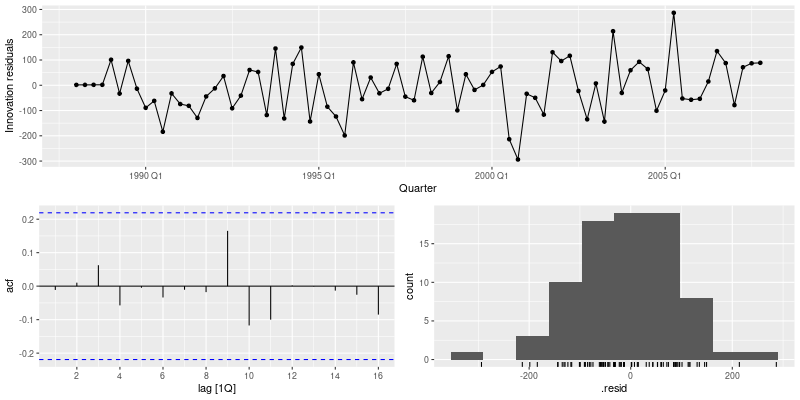

In [231]:
fit_arima = fabletools.model(train, fable.ARIMA(rl('Cement')))
print(fabletools.report(fit_arima))
fit_arima_gg = feasts.gg_tsresiduals(fit_arima, lag_max = 16)
display(image_png(fit_arima_gg))
#fit_arima <- train |> model(ARIMA(Cement))
#report(fit_arima)
#fit_arima |> gg_tsresiduals(lag_max = 16)

In [232]:
arima_features = fabletools.features(
    fabletools.augment_mdl_df(fit_arima),
    rl('.innov'), rl('ljung_box'), lag = 16, dof = 5)
print(arima_features)
#augment(fit_arima) |>
#  features(.innov, ljung_box, lag = 16, dof = 5)

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    6.37     0.847



Series: Cement 
Model: ETS(M,N,M) 
  Smoothing parameters:
    alpha = 0.7533714 
    gamma = 0.0001000093 

  Initial states:
     l[0]     s[0]    s[-1]    s[-2]     s[-3]
 1694.712 1.031179 1.045209 1.011424 0.9121874

  sigma^2:  0.0034

     AIC     AICc      BIC 
1104.095 1105.650 1120.769 
# A mable: 1 x 1
  `<environment>`
          <model>
1    <ETS(M,N,M)>



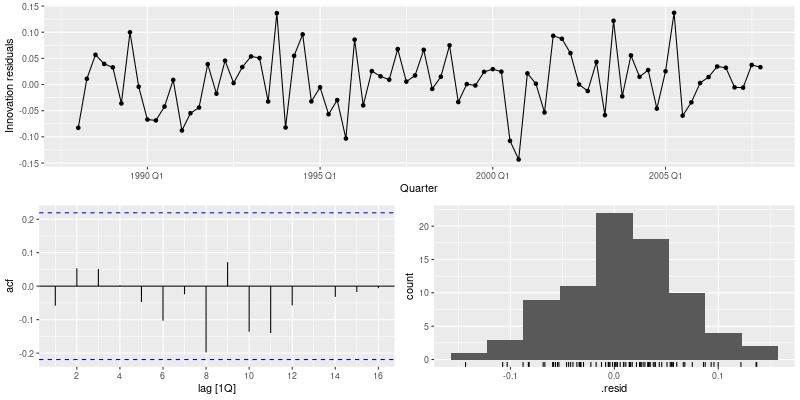

In [233]:
fit_ets = fabletools.model(train, fable.ETS(rl('Cement')))
print(fabletools.report(fit_ets))
fit_ets_gg = feasts.gg_tsresiduals(fit_ets, lag_max = 16)
display(image_png(fit_ets_gg))
#fit_ets <- train |> model(ETS(Cement))
#report(fit_ets)
#fit_ets |>
#  gg_tsresiduals(lag_max = 16)

In [234]:
ets_features = fabletools.features(
    fabletools.augment_mdl_df(fit_ets),
    rl('.innov'), rl('ljung_box'), lag = 16)
print(ets_features)
#augment(fit_ets) |>
#  features(.innov, ljung_box, lag = 16)

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    10.0     0.865



In [235]:
# Generate forecasts and compare accuracy over the test set
result = (DataFrame(
    dplyr.bind_rows(
        fabletools.accuracy_mdl_df(fit_arima),
        fabletools.accuracy_mdl_df(fit_ets),
        fabletools.accuracy_fbl_ts(
            fabletools.forecast_mdl_df(fit_arima, h = 10), cement),
        fabletools.accuracy_fbl_ts(
            fabletools.forecast_mdl_df(fit_ets, h = 10), cement)))
          .select(rl('-ME'), rl('-MPE'), rl('-ACF1')))
print(result)
#bind_rows(
#    fit_arima |> accuracy(),
#    fit_ets |> accuracy(),
#    fit_arima |> forecast(h = 10) |> accuracy(cement),
#    fit_ets |> forecast(h = 10) |> accuracy(cement)
#  ) |>
#  select(-ME, -MPE, -ACF1)

# A tibble: 4 × 7
  .model        .type     RMSE   MAE  MAPE  MASE RMSSE
  <chr>         <chr>    <dbl> <dbl> <dbl> <dbl> <dbl>
1 <environment> Training  100.  79.9  4.37 0.546 0.582
2 <environment> Training  103.  80.0  4.41 0.547 0.596
3 <environment> Test      216. 186.   8.68 1.27  1.26 
4 <environment> Test      222. 191.   8.85 1.30  1.29 



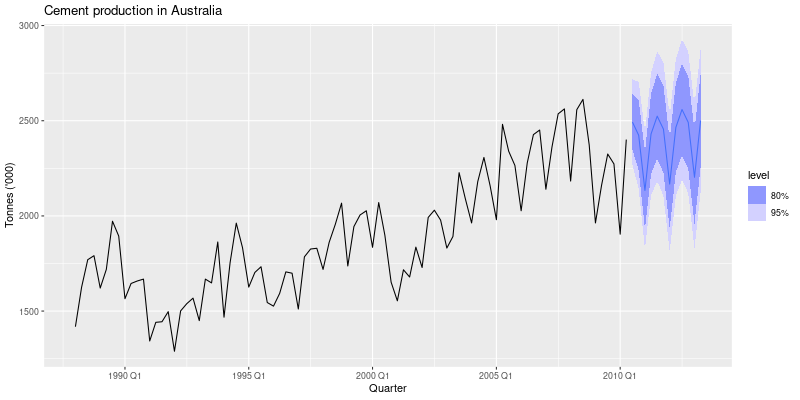

In [236]:
fc = fabletools.forecast_mdl_df(fabletools.model(cement,fable.ARIMA(rl('Cement'))),h = "3 years")
with ro.local_context() as lc:
    lc['cement'] = cement
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, cement) +
            labs(title = "Cement production in Australia", y = "Tonnes ('000)")
        ''')
    display(image_png(ro.r(rcode)))
#cement |>
#  model(ARIMA(Cement)) |>
#  forecast(h="3 years") |>
#  autoplot(cement) +
#  labs(title = "Cement production in Australia",
#       y = "Tonnes ('000)")

# 10 Dynamic regression models
## 10.2 Regression with ARIMA errors using fable

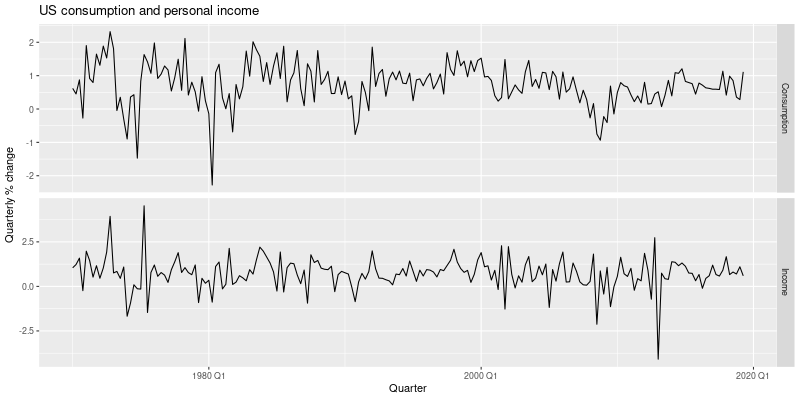

In [237]:
us_change = data(fpp3).fetch('us_change')['us_change']
us_ggplot = (ggplot2.ggplot(tidyr.pivot_longer(us_change, rl('c(Consumption, Income)'),
                                              names_to = "var", values_to = "value")) +
            ggplot2.aes(x = rl('Quarter'), y = rl('value')) +
            ggplot2.geom_line() +
            ggplot2.facet_grid(rl('vars(var)'), scales = "free_y") +
            ggplot2.labs(title = "US consumption and personal income",
                         y= "Quarterly % change"))
display(image_png(us_ggplot))
#us_change |>
#  pivot_longer(c(Consumption, Income),
#               names_to = "var", values_to = "value") |>
#  ggplot(aes(x = Quarter, y = value)) +
#  geom_line() +
#  facet_grid(vars(var), scales = "free_y") +
#  labs(title = "US consumption and personal income",
#       y = "Quarterly % change")

In [238]:
fit = fabletools.model(
    us_change,
    fable.ARIMA(rl('Consumption ~ Income')))
print(fabletools.report(fit))
#fit <- us_change |>
#  model(ARIMA(Consumption ~ Income))
#report(fit)

Series: Consumption 
Model: LM w/ ARIMA(1,0,2) errors 

Coefficients:
         ar1      ma1     ma2  Income  intercept
      0.7070  -0.6172  0.2066  0.1976     0.5949
s.e.  0.1068   0.1218  0.0741  0.0462     0.0850

sigma^2 estimated as 0.3113:  log likelihood=-163.04
AIC=338.07   AICc=338.51   BIC=357.8
# A mable: 1 x 1
              `<environment>`
                      <model>
1 <LM w/ ARIMA(1,0,2) errors>



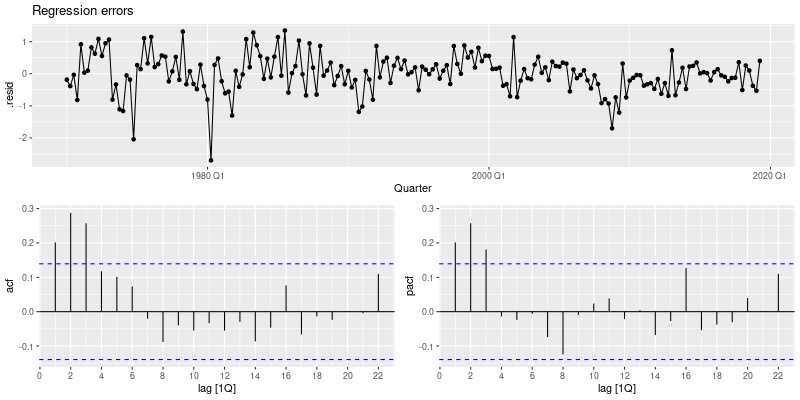

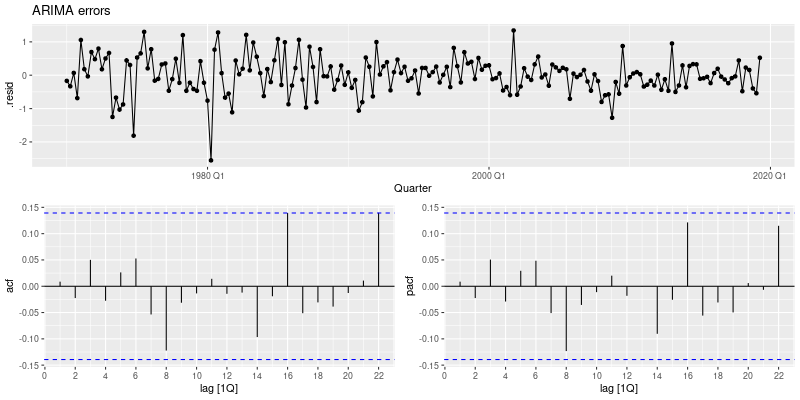

# A tsibble: 198 x 3 [1Q]
# Key:       .model [1]
   .model        Quarter  .resid
   <chr>           <qtr>   <dbl>
 1 <environment> 1970 Q1 -0.183 
 2 <environment> 1970 Q2 -0.385 
 3 <environment> 1970 Q3 -0.0353
 4 <environment> 1970 Q4 -0.819 
 5 <environment> 1971 Q1  0.916 
 6 <environment> 1971 Q2  0.0342
 7 <environment> 1971 Q3  0.0962
 8 <environment> 1971 Q4  0.822 
 9 <environment> 1972 Q1  0.626 
10 <environment> 1972 Q2  1.09  
# ℹ 188 more rows
# ℹ Use `print(n = ...)` to see more rows

# A tsibble: 198 x 3 [1Q]
# Key:       .model [1]
   .model        Quarter  .resid
   <chr>           <qtr>   <dbl>
 1 <environment> 1970 Q1 -0.170 
 2 <environment> 1970 Q2 -0.332 
 3 <environment> 1970 Q3  0.0681
 4 <environment> 1970 Q4 -0.687 
 5 <environment> 1971 Q1  1.06  
 6 <environment> 1971 Q2  0.181 
 7 <environment> 1971 Q3 -0.0348
 8 <environment> 1971 Q4  0.695 
 9 <environment> 1972 Q1  0.481 
10 <environment> 1972 Q2  0.797 
# ℹ 188 more rows
# ℹ Use `print(n = ...)` to s

In [239]:
with ro.local_context() as lc:
    lc['fit'] = fit
    rcode = ('''
        regression_resid <- residuals(fit, type="regression")
        innovation_resid <- residuals(fit, type="innovation")
        ''')
    ro.r(rcode)
    regression_resid = lc['regression_resid']
    innovation_resid = lc['innovation_resid']
    rcode2 = ('''
        feasts::gg_tsdisplay(regression_resid, .resid, plot_type = "partial") +
            labs(title = "Regression errors")
        ''')
    display(image_png(ro.r(rcode2)))
    rcode3 = ('''
        feasts::gg_tsdisplay(innovation_resid, .resid, plot_type = "partial") +
            labs(title = "ARIMA errors")
        ''')
    display(image_png(ro.r(rcode3)))
print(regression_resid)
print(innovation_resid)

In [240]:
print(fabletools.features(fabletools.augment_mdl_df(fit), rl('.innov'), rl('ljung_box'), dof = 3, lag = 12))

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    5.54     0.785



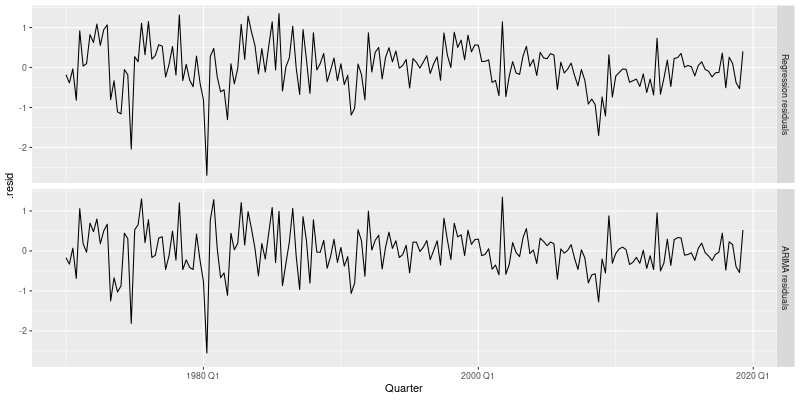

In [241]:
with ro.local_context() as lc:
    lc['fit'] = fit
    rcode = ('''
        bind_rows(
            `Regression residuals` =
                as_tibble(residuals(fit, type = "regression")),
            `ARIMA residuals` =
                as_tibble(residuals(fit, type = "innovation")),
            .id = "type"
          ) |>
          mutate(
            type = factor(type, levels=c(
            "Regression residuals", "ARIMA residuals"))
          ) |>
          ggplot(aes(x = Quarter, y = .resid)) +
          geom_line() +
          facet_grid(vars(type))
        ''')
    display(image_png(ro.r(rcode)))

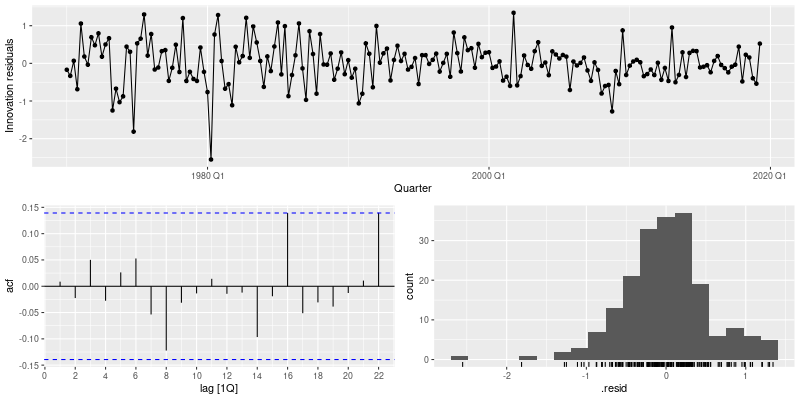

In [242]:
us_gg_res = feasts.gg_tsresiduals(fit)
display(image_png(us_gg_res))
#fit |> gg_tsresiduals()

In [243]:
print(fabletools.features(fabletools.augment_mdl_df(fit), rl('.innov'), rl('ljung_box'), dof = 3, lag = 8))
#augment(fit) |>
#  features(.innov, ljung_box, dof = 3, lag = 8)

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    5.21     0.391



## 10.3 Forecasting

# A tsibble: 8 x 2 [1Q]
  Quarter Income
    <qtr>  <dbl>
1 2019 Q3  0.728
2 2019 Q4  0.728
3 2020 Q1  0.728
4 2020 Q2  0.728
5 2020 Q3  0.728
6 2020 Q4  0.728
7 2021 Q1  0.728
8 2021 Q2  0.728



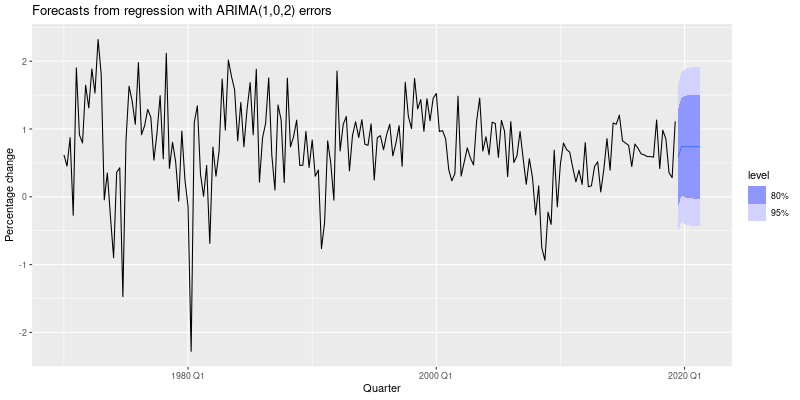

In [244]:
us_change = data(fpp3).fetch('us_change')['us_change']
fit = fabletools.model(us_change, fable.ARIMA(rl('Consumption ~ Income')))
us_change_future = DataFrame(tsibble.new_data(us_change,8)).mutate(Income=rl('mean(us_change$Income)'))
print(us_change_future)
fc = fabletools.forecast_mdl_df(fit, new_data = us_change_future)
with ro.local_context() as lc:
    lc['us_change'] = us_change
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, us_change) +
            labs(y = "Percentage change",
                 title = "Forecasts from regression with ARIMA(1,0,2) errors")
        ''')
    display(image_png(ro.r(rcode)))
#fit <- us_change |> model(ARIMA(Consumption ~ Income))
#us_change_future <- new_data(us_change, 8) |>
#  mutate(Income = mean(us_change$Income))
#forecast(fit, new_data = us_change_future) |>
#  autoplot(us_change) +
#  labs(y = "Percentage change",
#       title = "Forecasts from regression with ARIMA(1,0,2) errors")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tsibble: 365 x 5 [1D]
   Date       Demand Temperature Holiday Day_Type
   <date>      <dbl>       <dbl> <lgl>   <chr>   
 1 2014-01-01   175.        26   TRUE    Holiday 
 2 2014-01-02   188.        23   FALSE   Weekday 
 3 2014-01-03   189.        22.2 FALSE   Weekday 
 4 2014-01-04   174.        20.3 FALSE   Weekend 
 5 2014-01-05   170.        26.1 FALSE   Weekend 
 6 2014-01-06   195.        19.6 FALSE   Weekday 
 7 2014-01-07   200.        20   FALSE   Weekday 
 8 2014-01-08   205.        27.4 FALSE   Weekday 
 9 2014-01-09   227.        32.4 FALSE   Weekday 
10 2014-01-10   258.        34   FALSE   Weekday 
# ℹ 355 more rows
# ℹ Use `print(n = ...)` to see more rows



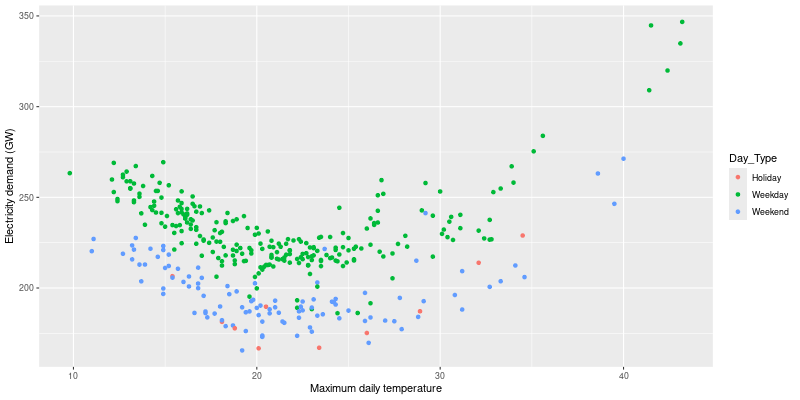

In [245]:
lubridate = importr('lubridate')
vic_elec = (tsibble.index_by(
    DataFrame(data(tsibbledata).fetch("vic_elec")["vic_elec"])
    .mutate(Date = rl('date(Time)')),
    rl('Date')))
vic_elec_daily = (
    DataFrame(vic_elec)
    .filter(rl('year(Time) == 2014'))
    .summarise(
        Demand = rl('sum(Demand) / 1e3'),
        Temperature = rl('max(Temperature)'),
        Holiday = rl('any(Holiday)')
    )
    .mutate(Day_Type = rl('case_when(Holiday ~ "Holiday", wday(Date) %in% 2:6 ~ "Weekday", TRUE ~ "Weekend")'))
)
print(vic_elec_daily)
vic_gg = (ggplot2.ggplot(vic_elec_daily) +
          ggplot2.aes(x = rl('Temperature'), y = rl('Demand'), colour = rl('Day_Type')) +
          ggplot2.geom_point() +
          ggplot2.labs(y = "Electricity demand (GW)",
                       x = "Maximum daily temperature"))
display(image_png(vic_gg))
#vic_elec_daily <- vic_elec |>
#  filter(year(Time) == 2014) |>
#  index_by(Date = date(Time)) |>
#  summarise(
#    Demand = sum(Demand) / 1e3,
#    Temperature = max(Temperature),
#    Holiday = any(Holiday)
#  ) |>
#  mutate(Day_Type = case_when(
#    Holiday ~ "Holiday",
#    wday(Date) %in% 2:6 ~ "Weekday",
#    TRUE ~ "Weekend"
#  ))

#vic_elec_daily |>
#  ggplot(aes(x = Temperature, y = Demand, colour = Day_Type)) +
#  geom_point() +
#  labs(y = "Electricity demand (GW)",
#       x = "Maximum daily temperature")

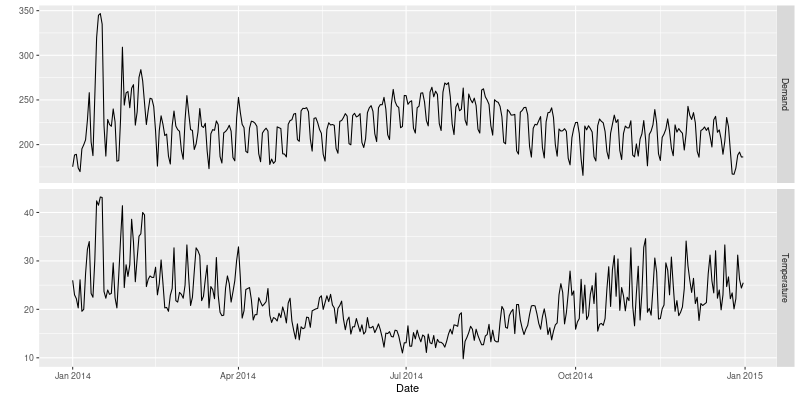

In [246]:
vic_gg_2 = (ggplot2.ggplot(tidyr.pivot_longer(vic_elec_daily, rl('c(Demand, Temperature)'))) +
            ggplot2.aes(x = rl('Date'), y = rl('value')) +
            ggplot2.geom_line() +
            ggplot2.facet_grid(rl('name ~ .'), scales = "free_y") + 
            ggplot2.ylab(""))
display(image_png(vic_gg_2))
#vic_elec_daily |>
#  pivot_longer(c(Demand, Temperature)) |>
#  ggplot(aes(x = Date, y = value)) +
#  geom_line() +
#  facet_grid(name ~ ., scales = "free_y") + ylab("")

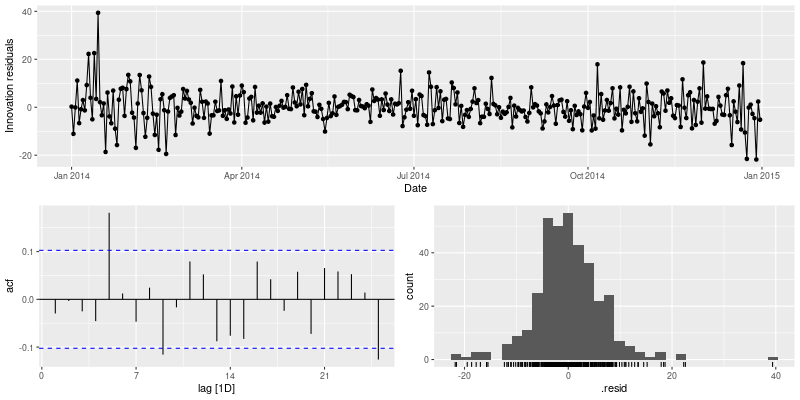

In [247]:
fit = fabletools.model(
    vic_elec_daily,
    fable.ARIMA(rl('Demand ~ Temperature + I(Temperature^2) + (Day_Type == "Weekday")')))
display(image_png(feasts.gg_tsresiduals(fit)))
#fit <- vic_elec_daily |>
#  model(ARIMA(Demand ~ Temperature + I(Temperature^2) +
#                (Day_Type == "Weekday")))
#fit |> gg_tsresiduals() 

In [248]:
print(fabletools.features(fabletools.augment_mdl_df(fit), rl('.innov'), rl('ljung_box'), dof = 6, lag = 14))
#augment(fit) |>
#  features(.innov, ljung_box, dof = 6, lag = 14) # This model is rejected due to a spike in acf

# A tibble: 1 × 3
  .model        lb_stat lb_pvalue
  <chr>           <dbl>     <dbl>
1 <environment>    28.4  0.000404



In [249]:
fit = fabletools.model(
    vic_elec_daily,
    fable.ARIMA(rl('log(Demand) ~ Temperature + I(Temperature^2) + (Day_Type == "Weekday")'),
                  stepwise = False, order_constraint = rl('(p+q <=8) & (P+Q <=5)')))
print(fabletools.report(fit))
#fit <- vic_elec_daily |>
#  model(arima = ARIMA(log(Demand) ~ Temperature + I(Temperature ^2) +
#                         (Day_Type == "Weekday"), stepwise = FALSE,
#                      order_constraint = (p+q <=8 & P+Q <=5)))
#report(fit)  # result is ARIMA(5,1,3)(2,0,0)

Series: Demand 
Model: LM w/ ARIMA(5,1,3)(2,0,0)[7] errors 
Transformation: log(Demand) 

Coefficients:
         ar1      ar2     ar3     ar4     ar5      ma1      ma2      ma3
      0.0262  -0.0290  0.5387  -0.087  0.1854  -0.2122  -0.1405  -0.6215
s.e.  0.2311   0.1481  0.1167   0.061  0.0710   0.2303   0.1793   0.1276
        sar1    sar2  Temperature  I(Temperature^2)  Day_Type == "Weekday"TRUE
      0.3217  0.3866      -0.0311             8e-04                     0.1396
s.e.  0.0594  0.0593       0.0004             0e+00                     0.0061

sigma^2 estimated as 0.0008747:  log likelihood=769.48
AIC=-1510.95   AICc=-1509.75   BIC=-1456.39
# A mable: 1 x 1
                        `<environment>`
                                <model>
1 <LM w/ ARIMA(5,1,3)(2,0,0)[7] errors>



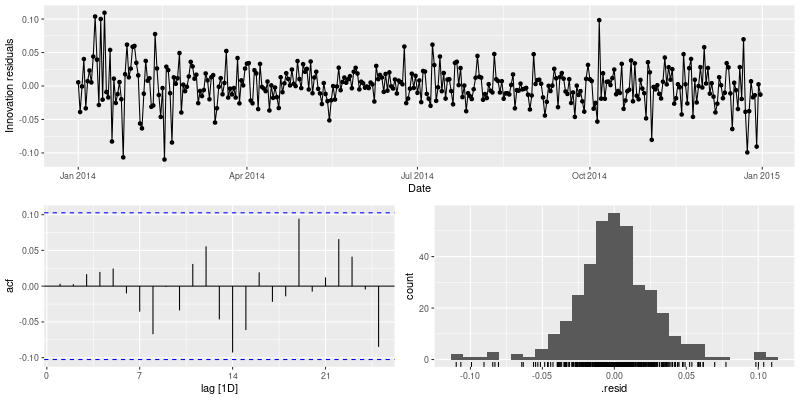

In [250]:
vic_res = feasts.gg_tsresiduals(fit)
display(image_png(vic_res))  #acf is now fairly well behaved

In [251]:
# Forecast one day ahead
vic_next_day = DataFrame(tsibble.new_data(vic_elec_daily, 1)).mutate(Temperature = 26, Day_Type = "Holiday")
vic_fc = fabletools.forecast_mdl_df(fit, vic_next_day)
print(vic_fc)
#vic_next_day <- new_data(vic_elec_daily, 1) |>
#  mutate(Temperature = 26, Day_type = "Holiday")
#forecast(fit, vic_next_day)

# A fable: 1 x 6 [1D]
# Key:     .model [1]
  .model        Date                   Demand .mean Temperature Day_Type
  <chr>         <date>                 <dist> <dbl>       <int> <chr>   
1 <environment> 2015-01-01 t(N(5.1, 0.00087))  163.          26 Holiday 



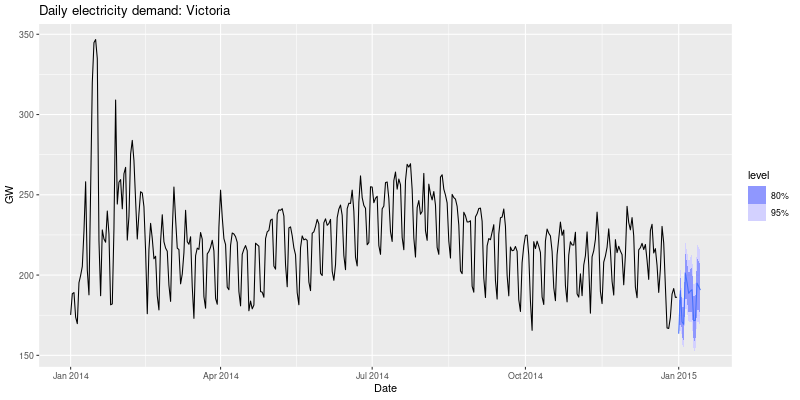

In [252]:
vic_elec_future = (DataFrame(tsibble.new_data(vic_elec_daily, 14))
                   .mutate(
                       Temperature = 26, 
                       Holiday = rl('c(TRUE, rep(FALSE, 13))'),
                       Day_Type = rl('case_when(Holiday ~ "Holiday", wday(Date) %in% 2:6 ~ "Weekday", TRUE ~ "Weekend")')))
fc = fabletools.forecast_mdl_df(fit, vic_elec_future)
with ro.local_context() as lc:
    lc['vic_elec_daily'] = vic_elec_daily
    lc['fc'] = fc
    rcode = ('''
        ggplot2::autoplot(fc, vic_elec_daily) +
            labs(title="Daily electricity demand: Victoria",
                 y="GW")
        ''')
    display(image_png(ro.r(rcode)))
#vic_elec_future <- new_data(vic_elec_daily, 14) |>
#  mutate(
#    Temperature = 26,
#    Holiday = c(TRUE, rep(FALSE, 13)),
#    Day_Type = case_when(
#      Holiday ~ "Holiday",
#      wday(Date) %in% 2:6 ~ "Weekday",
#      TRUE ~ "Weekend"
#    )
#  )
#forecast(fit, vic_elec_future) |>
#  autoplot(vic_elec_daily) +
#  labs(title="Daily electricity demand: Victoria",
#       y="GW")
# This model did not account for the annual seasonal ability.

## 10.4 Stochastic and deterministic trends

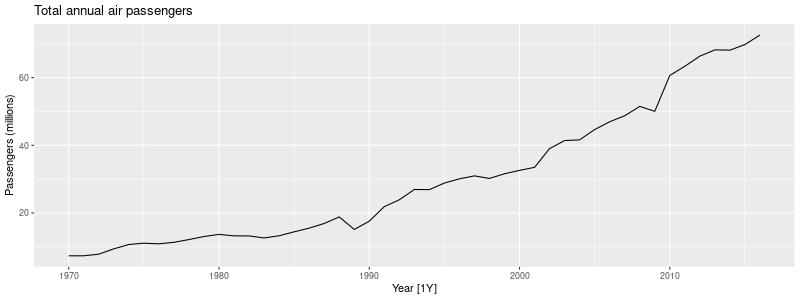

In [253]:
aus_airpassengers = data(fpp3).fetch('aus_airpassengers')['aus_airpassengers']
with ro.local_context() as lc:
    lc['aus_airpassengers'] = aus_airpassengers
    rcode = ('''
        ggplot2::autoplot(aus_airpassengers, Passengers) +
            labs(y = "Passengers (millions)",
                 title = "Total annual air passengers")
        ''')
    display(image_png(ro.r(rcode), height=300))
#aus_airpassengers |>
#  autoplot(Passengers) +
#  labs(y = "Passengers (millions)",
#       title = "Total annual air passengers")

In [254]:
fit_deterministic = fabletools.model(
    aus_airpassengers,
    deterministic = fable.ARIMA(rl('Passengers ~ 1 + trend() + pdq(d = 0)')))
print(fabletools.report(fit_deterministic))
#fit_deterministic <- aus_airpassengers |>
#  model(deterministic = ARIMA(Passengers ~ 1 + trend() +
#                                pdq(d = 0)))
#report(fit_deterministic)

Series: Passengers 
Model: LM w/ ARIMA(1,0,0) errors 

Coefficients:
         ar1  trend()  intercept
      0.9564   1.4151     0.9014
s.e.  0.0362   0.1972     7.0751

sigma^2 estimated as 4.343:  log likelihood=-100.88
AIC=209.77   AICc=210.72   BIC=217.17
# A mable: 1 x 1
                deterministic
                      <model>
1 <LM w/ ARIMA(1,0,0) errors>



In [255]:
fit_stochastic = fabletools.model(
    aus_airpassengers,
    stochastic = fable.ARIMA(rl('Passengers ~ 1 + pdq(d = 1)')))
print(fabletools.report(fit_stochastic))
#fit_stochastic <- aus_airpassengers |>
#  model(stochastic = ARIMA(Passengers ~ pdq(d = 1)))
#report(fit_stochastic)

Series: Passengers 
Model: ARIMA(0,1,0) w/ drift 

Coefficients:
      constant
        1.4191
s.e.    0.3014

sigma^2 estimated as 4.271:  log likelihood=-98.16
AIC=200.31   AICc=200.59   BIC=203.97
# A mable: 1 x 1
               stochastic
                  <model>
1 <ARIMA(0,1,0) w/ drift>



Scale for fill_ramp is already present.
Adding another scale for fill_ramp, which will replace the existing scale.


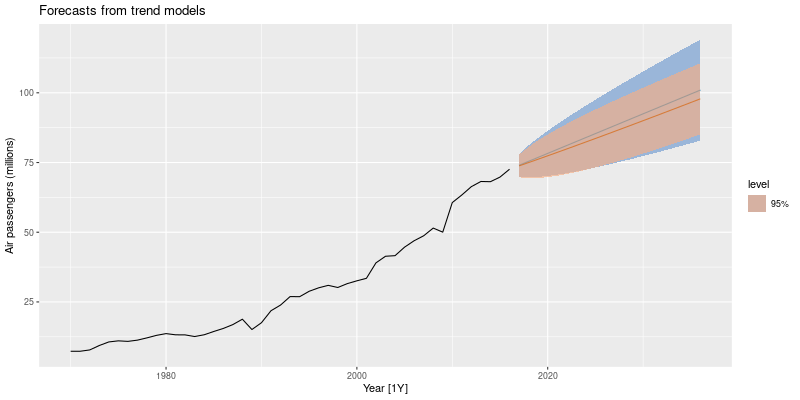

In [256]:
with ro.local_context() as lc:
    lc['aus_airpassengers'] = aus_airpassengers
    lc['fit_stochastic'] = fit_stochastic
    lc['fit_deterministic'] = fit_deterministic
    rcode = ('''
        ggplot2::autoplot(aus_airpassengers, Passengers) +
        ggplot2::autolayer(fit_stochastic |> fabletools::forecast(h = 20),
                            colour = "#0072B2", level = 95) +
        ggplot2::autolayer(fit_deterministic |> fabletools::forecast(h = 20),
                            colour = "#D55E00", alpha = 0.65, level = 95) +
        ggplot2::labs(y = "Air passengers (millions)",
                      title = "Forecasts from trend models")
        ''')
    display(image_png(ro.r(rcode)))
#aus_airpassengers |>
#  autoplot(Passengers) +
#  autolayer(fit_stochastic |> forecast(h = 20),
#    colour = "#0072B2", level = 95) +
#  autolayer(fit_deterministic |> forecast(h = 20),
#    colour = "#D55E00", alpha = 0.65, level = 95) +
#  labs(y = "Air passengers (millions)",
#       title = "Forecasts from trend models")

## 10.5 Dynamic harmonic regression

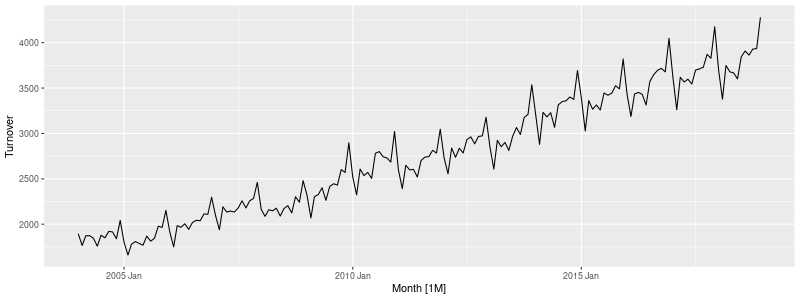

# A tibble: 6 × 6
  .model   sigma2 log_lik   AIC  AICc   BIC
  <chr>     <dbl>   <dbl> <dbl> <dbl> <dbl>
1 K = 1  0.00175     317. -616. -615. -588.
2 K = 2  0.00107     362. -700. -698. -661.
3 K = 3  0.000761    394. -763. -761. -725.
4 K = 4  0.000539    427. -822. -818. -771.
5 K = 5  0.000317    474. -919. -917. -875.
6 K = 6  0.000316    474. -920. -918. -875.

# A mable: 6 x 2
# Key:     Model name [6]
  `Model name`                      Orders
  <chr>                            <model>
1 K = 1        <LM w/ ARIMA(2,1,3) errors>
2 K = 2        <LM w/ ARIMA(5,1,1) errors>
3 K = 3        <LM w/ ARIMA(3,1,1) errors>
4 K = 4        <LM w/ ARIMA(1,1,5) errors>
5 K = 5        <LM w/ ARIMA(2,1,0) errors>
6 K = 6        <LM w/ ARIMA(0,1,1) errors>



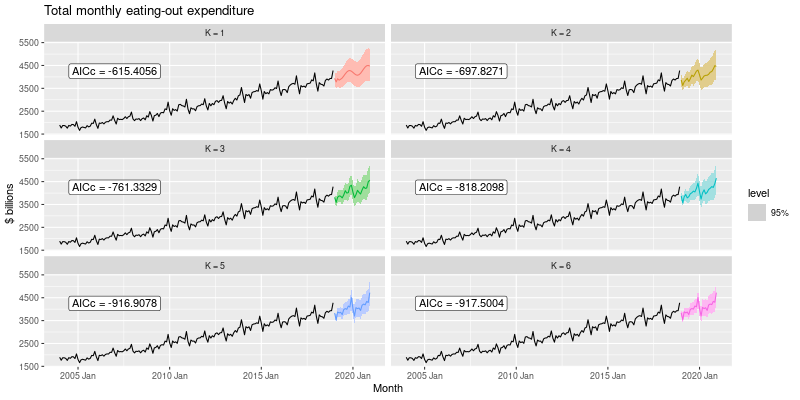

In [257]:
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
aus_cafe = (
    DataFrame(aus_retail)
    .filter(rl('Industry == "Cafes, restaurants and takeaway food services"'),
            rl('year(Month) %in% 2004:2018'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
cafe_gg = rggplot2.autoplot(aus_cafe, rl('Turnover'))
display(image_png(cafe_gg, height=300))
with ro.local_context() as lc:
    lc['aus_cafe'] = aus_cafe
    rcode = ('''
        fit <- model(aus_cafe,
          `K = 1` = ARIMA(log(Turnover) ~ fourier(K=1) + PDQ(0,0,0)),
          `K = 2` = ARIMA(log(Turnover) ~ fourier(K=2) + PDQ(0,0,0)),
          `K = 3` = ARIMA(log(Turnover) ~ fourier(K=3) + PDQ(0,0,0)),
          `K = 4` = ARIMA(log(Turnover) ~ fourier(K=4) + PDQ(0,0,0)),
          `K = 5` = ARIMA(log(Turnover) ~ fourier(K=5) + PDQ(0,0,0)),
          `K = 6` = ARIMA(log(Turnover) ~ fourier(K=6) + PDQ(0,0,0))
        )
        ''')
    ro.r(rcode)
    fit = lc['fit']
fit_glance = DataFrame(fabletools.glance_mdl_df(fit)).select(rl('.model:BIC'))
print(fit_glance)
fit_x = tidyr.pivot_longer(fit, rl('everything()'), names_to = "Model name", values_to = "Orders")
print(fit_x)
fc = fabletools.forecast_mdl_df(fit, h = "2 years")                      
with ro.local_context() as lc:
    lc['aus_cafe'] = aus_cafe
    lc['fc'] = fc
    lc['fit'] = fit
    rcode = ('''
        ggplot2::autoplot(fc, aus_cafe, level = 95) +
        ggplot2::facet_wrap(vars(.model), ncol = 2) +
        ggplot2::guides(colour = "none", fill = "none", level = "none") +
        ggplot2::geom_label(
                aes(x = yearmonth("2007 Jan"), y = 4250,
                label = paste0("AICc = ", format(AICc))),
                    data = glance(fit)
            ) +
        ggplot2::labs(title= "Total monthly eating-out expenditure",
                 y="$ billions")
        ''')
    display(image_png(ro.r(rcode)))
#fit |>
#  forecast(h = "2 years") |>
#  autoplot(aus_cafe, level = 95) +
#  facet_wrap(vars(.model), ncol = 2) +
#  guides(colour = "none", fill = "none", level = "none") +
#  geom_label(
#    aes(x = yearmonth("2007 Jan"), y = 4250,
#        label = paste0("AICc = ", format(AICc))),
#    data = glance(fit)
#  ) +
#  labs(title= "Total monthly eating-out expenditure",
#       y="$ billions")

Series: Barrels 
Model: LM w/ ARIMA(0,1,1) errors 

Coefficients:
          ma1  fourier(K = 6)C1_52  fourier(K = 6)S1_52  fourier(K = 6)C2_52
      -0.8956              -0.1122              -0.2300               0.0419
s.e.   0.0130               0.0123               0.0122               0.0099
      fourier(K = 6)S2_52  fourier(K = 6)C3_52  fourier(K = 6)S3_52
                   0.0316               0.0832               0.0345
s.e.               0.0099               0.0094               0.0094
      fourier(K = 6)C4_52  fourier(K = 6)S4_52  fourier(K = 6)C5_52
                   0.0186               0.0397              -0.0314
s.e.               0.0093               0.0092               0.0092
      fourier(K = 6)S5_52  fourier(K = 6)C6_52  fourier(K = 6)S6_52  intercept
                   0.0010              -0.0522               0.0002     0.0014
s.e.               0.0092               0.0091               0.0091     0.0007

sigma^2 estimated as 0.06205:  log likelihood=-33.11
AIC=

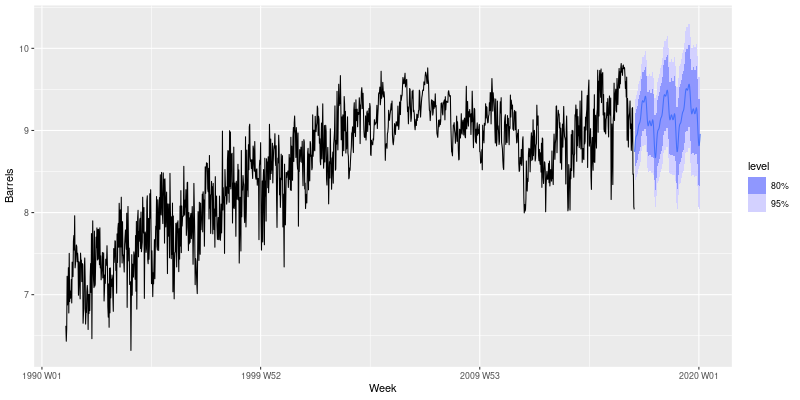

In [258]:
# weekly gasoline products, tried a variety of K and turnout K = 6 has the smallest AICc
us_gasoline = data(fpp3).fetch('us_gasoline')['us_gasoline']
fit = fabletools.model(
    us_gasoline,
    K06 = fable.ARIMA(rl('Barrels ~ fourier(K = 6) + PDQ(0, 0, 0)')))
print(fabletools.report(fit))
fc = fabletools.forecast_mdl_df(fit, h = "3 years")
gas_gg = rggplot2.autoplot(fc, us_gasoline)
display(image_png(gas_gg))

## 10.6 Lagged predictors

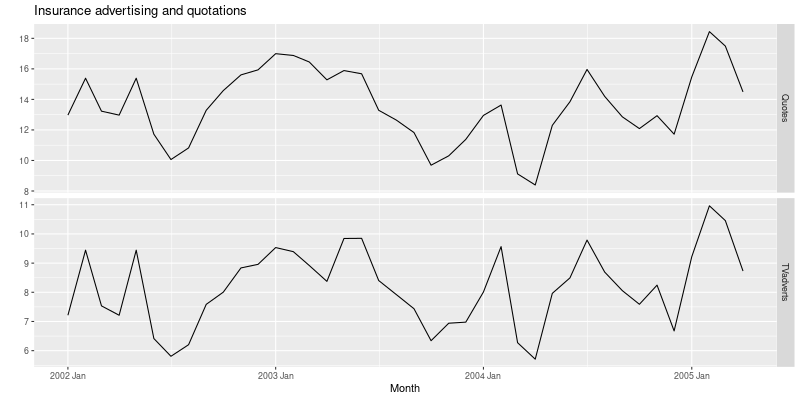

In [259]:
insurance = data(fpp3).fetch('insurance')['insurance']
insurance_x = tidyr.pivot_longer(insurance, rl('Quotes:TVadverts'))
insurance_gg = (ggplot2.ggplot(insurance_x) +
               ggplot2.aes(x = rl('Month'), y = rl('value')) +
               ggplot2.geom_line() +
               ggplot2.facet_grid(rl('vars(name)'), scales = "free_y") +
               ggplot2.labs(y = "", title = "Insurance advertising and quotations"))
display(image_png(insurance_gg))
#insurance |>
#  pivot_longer(Quotes:TVadverts) |>
#  ggplot(aes(x = Month, y = value)) +
#  geom_line() +
#  facet_grid(vars(name), scales = "free_y") +
#  labs(y = "", title = "Insurance advertising and quotations")

In [260]:
fit = fabletools.model(
    DataFrame(insurance).mutate(Quotes = rl('c(NA, NA, NA, Quotes[4:40])')),
    lag0 = fable.ARIMA(rl('Quotes ~ pdq(d = 0) + TVadverts')),
    lag1 = fable.ARIMA(rl('Quotes ~ pdq(d = 0) + TVadverts + lag(TVadverts)')),
    lag2 = fable.ARIMA(rl('Quotes ~ pdq(d = 0) + TVadverts + lag(TVadverts) + lag(TVadverts, 2)')),
    lag3 = fable.ARIMA(rl('Quotes ~ pdq(d = 0) + TVadverts + lag(TVadverts) + lag(TVadverts, 2) + lag(TVadverts, 3)')))
#fit <- insurance |>
#  # Restrict data so models use same fitting period
#  mutate(Quotes = c(NA, NA, NA, Quotes[4:40])) |>
#  # Estimate models
#  model(
#    lag0 = ARIMA(Quotes ~ pdq(d = 0) + TVadverts),
#    lag1 = ARIMA(Quotes ~ pdq(d = 0) +
#                 TVadverts + lag(TVadverts)),
#    lag2 = ARIMA(Quotes ~ pdq(d = 0) +
#                 TVadverts + lag(TVadverts) +
#                 lag(TVadverts, 2)),
#    lag3 = ARIMA(Quotes ~ pdq(d = 0) +
#                 TVadverts + lag(TVadverts) +
#                 lag(TVadverts, 2) + lag(TVadverts, 3))
#  )

In [261]:
fit_glance = DataFrame(fabletools.glance_mdl_df(fit)).select(rl('.model:BIC'))
print(fit_glance)
fit_x = tidyr.pivot_longer(fit, rl('everything()'), names_to = "Model name", values_to = "Orders")
print(fit_x)
#glance(fit)

# A tibble: 4 × 6
  .model sigma2 log_lik   AIC  AICc   BIC
  <chr>   <dbl>   <dbl> <dbl> <dbl> <dbl>
1 lag0    0.265   -28.3  66.6  68.3  75.0
2 lag1    0.209   -24.0  58.1  59.9  66.5
3 lag2    0.215   -24.0  60.0  62.6  70.2
4 lag3    0.206   -22.2  60.3  65.0  73.8

# A mable: 4 x 2
# Key:     Model name [4]
  `Model name`                      Orders
  <chr>                            <model>
1 lag0         <LM w/ ARIMA(2,0,0) errors>
2 lag1         <LM w/ ARIMA(1,0,1) errors>
3 lag2         <LM w/ ARIMA(1,0,1) errors>
4 lag3         <LM w/ ARIMA(1,0,1) errors>



In [262]:
fit_best = fabletools.model(
    insurance,
    fable.ARIMA(rl('Quotes ~ pdq(d = 0) + TVadverts + lag(TVadverts)')))
print(fabletools.report(fit_best))
#fit_best <- insurance |>
#  model(ARIMA(Quotes ~ pdq(d = 0) +
#              TVadverts + lag(TVadverts)))
#report(fit_best)

Series: Quotes 
Model: LM w/ ARIMA(1,0,2) errors 

Coefficients:
         ar1     ma1     ma2  TVadverts  lag(TVadverts)  intercept
      0.5123  0.9169  0.4591     1.2527          0.1464     2.1554
s.e.  0.1849  0.2051  0.1895     0.0588          0.0531     0.8595

sigma^2 estimated as 0.2166:  log likelihood=-23.94
AIC=61.88   AICc=65.38   BIC=73.7
# A mable: 1 x 1
              `<environment>`
                      <model>
1 <LM w/ ARIMA(1,0,2) errors>



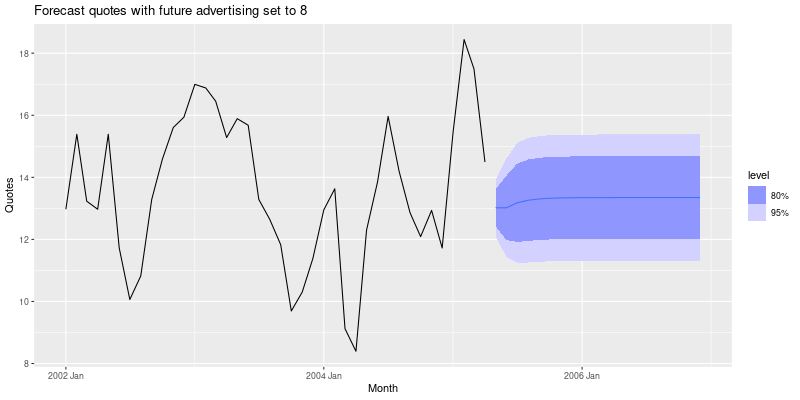

In [263]:
insurance_future = DataFrame(tsibble.new_data(insurance, 20)).mutate(TVadverts = 8)
fit_best_fc = fabletools.forecast_mdl_df(fit_best, insurance_future)
with ro.local_context() as lc:
    lc['insurance'] = insurance
    lc['fc'] = fit_best_fc 
    rcode = ('''
        ggplot2::autoplot(fc, insurance) +
            labs(y = "Quotes",
                 title = "Forecast quotes with future advertising set to 8")
        ''')
    display(image_png(ro.r(rcode)))
#insurance_future <- new_data(insurance, 20) |>
#  mutate(TVadverts = 8)
#fit_best |>
#  forecast(insurance_future) |>
#  autoplot(insurance) +
#  labs(
#    y = "Quotes",
#    title = "Forecast quotes with future advertising set to 8"
#  )

# 11 Forecasting hierarchical and grouped time series
## 11.1 Hierarchical and grouped time series

In [264]:
tourism = DataFrame(data(tsibble).fetch('tourism')['tourism']).mutate(
    State=rl('recode(State, `New South Wales`="NSW",`Northern Territory`="NT",`Queensland`="QLD",`South Australia`="SA",`Tasmania`="TAS",`Victoria`="VIC",`Western Australia`="WA")'))
print(tourism)
#tourism <- tsibble::tourism |>
#  mutate(State = recode(State,
#    `New South Wales` = "NSW",
#    `Northern Territory` = "NT",
#    `Queensland` = "QLD",
#    `South Australia` = "SA",
#    `Tasmania` = "TAS",
#    `Victoria` = "VIC",
#    `Western Australia` = "WA"
#  ))

# A tsibble: 24,320 x 5 [1Q]
# Key:       Region, State, Purpose [304]
   Quarter Region   State Purpose  Trips
     <qtr> <chr>    <chr> <chr>    <dbl>
 1 1998 Q1 Adelaide SA    Business  135.
 2 1998 Q2 Adelaide SA    Business  110.
 3 1998 Q3 Adelaide SA    Business  166.
 4 1998 Q4 Adelaide SA    Business  127.
 5 1999 Q1 Adelaide SA    Business  137.
 6 1999 Q2 Adelaide SA    Business  200.
 7 1999 Q3 Adelaide SA    Business  169.
 8 1999 Q4 Adelaide SA    Business  134.
 9 2000 Q1 Adelaide SA    Business  154.
10 2000 Q2 Adelaide SA    Business  169.
# ℹ 24,310 more rows
# ℹ Use `print(n = ...)` to see more rows



In [265]:
tourism_hts = fabletools.aggregate_key(tourism, rl('State / Region'), Trips = rl('sum(Trips)'))
print(tourism_hts)
#tourism_hts <- tourism |>
#  aggregate_key(State / Region, Trips = sum(Trips))
#tourism_hts

# A tsibble: 6,800 x 4 [1Q]
# Key:       State, Region [85]
   Quarter State        Region        Trips
     <qtr> <chr*>       <chr*>        <dbl>
 1 1998 Q1 <aggregated> <aggregated> 23182.
 2 1998 Q2 <aggregated> <aggregated> 20323.
 3 1998 Q3 <aggregated> <aggregated> 19827.
 4 1998 Q4 <aggregated> <aggregated> 20830.
 5 1999 Q1 <aggregated> <aggregated> 22087.
 6 1999 Q2 <aggregated> <aggregated> 21458.
 7 1999 Q3 <aggregated> <aggregated> 19914.
 8 1999 Q4 <aggregated> <aggregated> 20028.
 9 2000 Q1 <aggregated> <aggregated> 22339.
10 2000 Q2 <aggregated> <aggregated> 19941.
# ℹ 6,790 more rows
# ℹ Use `print(n = ...)` to see more rows



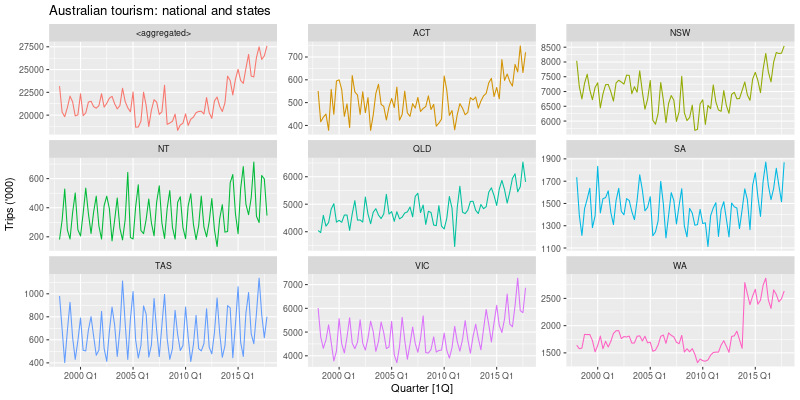

In [266]:
with ro.local_context() as lc:
    lc['tourism_hts'] = tourism_hts
    rcode = ('''
        tourism_hts |>
          filter(is_aggregated(Region)) |>
          ggplot2::autoplot(Trips) +
          labs(y = "Trips ('000)",
               title = "Australian tourism: national and states") +
          ggplot2::facet_wrap(vars(State), scales = "free_y", ncol = 3) +
          ggplot2::theme(legend.position = "none")
        ''')
    display(image_png(ro.r(rcode)))
#tourism_hts |>
#  filter(is_aggregated(Region)) |>
#  autoplot(Trips) +
#  labs(y = "Trips ('000)",
#       title = "Australian tourism: national and states") +
#  facet_wrap(vars(State), scales = "free_y", ncol = 3) +
#  theme(legend.position = "none")

# A tsibble: 320 x 3 [1Q]
# Key:       State [4]
   Quarter State Trips
     <qtr> <fct> <dbl>
 1 1998 Q1 NT     181.
 2 1998 Q1 QLD   4041.
 3 1998 Q1 TAS    982.
 4 1998 Q1 VIC   6010.
 5 1998 Q2 NT     314.
 6 1998 Q2 QLD   3968.
 7 1998 Q2 TAS    693.
 8 1998 Q2 VIC   4795.
 9 1998 Q3 NT     528.
10 1998 Q3 QLD   4594.
# ℹ 310 more rows
# ℹ Use `print(n = ...)` to see more rows



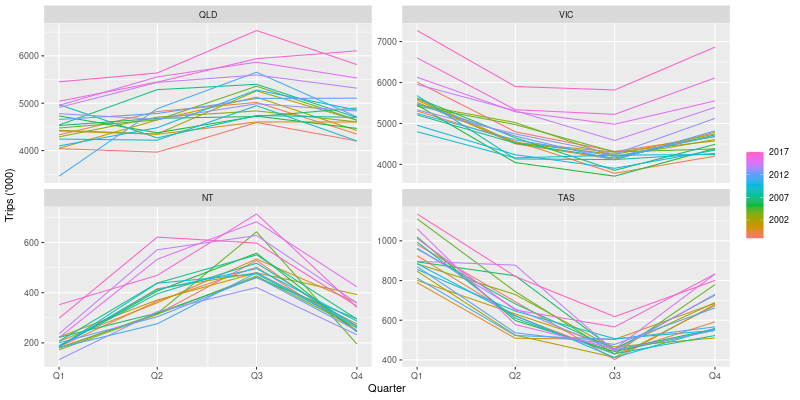

In [267]:
tourism_hts_x = (DataFrame(tourism_hts)
                 .filter(rl('State == "NT" | State == "QLD" | State == "TAS" | State == "VIC"'), rl('is_aggregated(Region)'))
                 .select(rl('-Region'))
                 .mutate(State = rl('factor(State, levels=c("QLD","VIC","NT","TAS"))')))
print(tourism_hts_x)
with ro.local_context() as lc:
    lc['tourism_hts'] = tourism_hts_x
    rcode = ('''
        tourism_hts |>
          feasts::gg_season(Trips) +
            ggplot2::facet_wrap(vars(State), nrow = 2, scales = "free_y")+
            labs(y = "Trips ('000)")
        ''')
    display(image_png(ro.r(rcode)))
#tourism_hts |>
#  filter(State == "NT" | State == "QLD" |
#         State == "TAS" | State == "VIC", is_aggregated(Region)) |>
#  select(-Region) |>
#  mutate(State = factor(State, levels=c("QLD","VIC","NT","TAS"))) |>
#  gg_season(Trips) +
#  facet_wrap(vars(State), nrow = 2, scales = "free_y")+
#  labs(y = "Trips ('000)")

In [268]:
readr = importr('readr')
prison = dplyr.relocate(
    tsibble.as_tsibble(
    (DataFrame(readr.read_csv("https://OTexts.com/fpp3/extrafiles/prison_population.csv"))
     .mutate(Quarter = rl('yearquarter(Date)'))
     .select(rl('-Date'))),
    key = rl('c(Gender, Legal, State, Indigenous)'),
    index = rl('Quarter')),
    rl('Quarter'))
print(prison)
#prison <- readr::read_csv("https://OTexts.com/fpp3/extrafiles/prison_population.csv") |>
#  mutate(Quarter = yearquarter(Date)) |>
#  select(-Date)  |>
#  as_tsibble(key = c(Gender, Legal, State, Indigenous),
#             index = Quarter) |>
#  relocate(Quarter)

Rows: 3072 Columns: 6
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (4): State, Gender, Legal, Indigenous
dbl  (1): Count
date (1): Date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tsibble: 3,072 x 6 [1Q]
# Key:       State, Gender, Legal, Indigenous [64]
   Quarter State Gender Legal    Indigenous Count
     <qtr> <chr> <chr>  <chr>    <chr>      <dbl>
 1 2005 Q1 ACT   Female Remanded ATSI           0
 2 2005 Q2 ACT   Female Remanded ATSI           1
 3 2005 Q3 ACT   Female Remanded ATSI           0
 4 2005 Q4 ACT   Female Remanded ATSI           0
 5 2006 Q1 ACT   Female Remanded ATSI           1
 6 2006 Q2 ACT   Female Remanded ATSI           1
 7 2006 Q3 ACT   Female Remanded ATSI           1
 8 2006 Q4 ACT   Female Remanded ATSI           0
 9 2007 Q1 ACT   Female Remanded ATSI           0
10 2007 Q2 ACT   Female 

In [269]:
prison_gts = fabletools.aggregate_key(prison, rl('Gender * Legal * State'), Count = rl('sum(Count)/1e3'))
print(prison_gts)
#prison_gts <- prison |>
#  aggregate_key(Gender * Legal * State, Count = sum(Count)/1e3)

# A tsibble: 3,888 x 5 [1Q]
# Key:       Gender, Legal, State [81]
   Quarter Gender       Legal        State        Count
     <qtr> <chr*>       <chr*>       <chr*>       <dbl>
 1 2005 Q1 <aggregated> <aggregated> <aggregated>  24.3
 2 2005 Q2 <aggregated> <aggregated> <aggregated>  24.6
 3 2005 Q3 <aggregated> <aggregated> <aggregated>  24.5
 4 2005 Q4 <aggregated> <aggregated> <aggregated>  24.4
 5 2006 Q1 <aggregated> <aggregated> <aggregated>  24.5
 6 2006 Q2 <aggregated> <aggregated> <aggregated>  25.0
 7 2006 Q3 <aggregated> <aggregated> <aggregated>  25.4
 8 2006 Q4 <aggregated> <aggregated> <aggregated>  25.9
 9 2007 Q1 <aggregated> <aggregated> <aggregated>  25.9
10 2007 Q2 <aggregated> <aggregated> <aggregated>  26.5
# ℹ 3,878 more rows
# ℹ Use `print(n = ...)` to see more rows



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



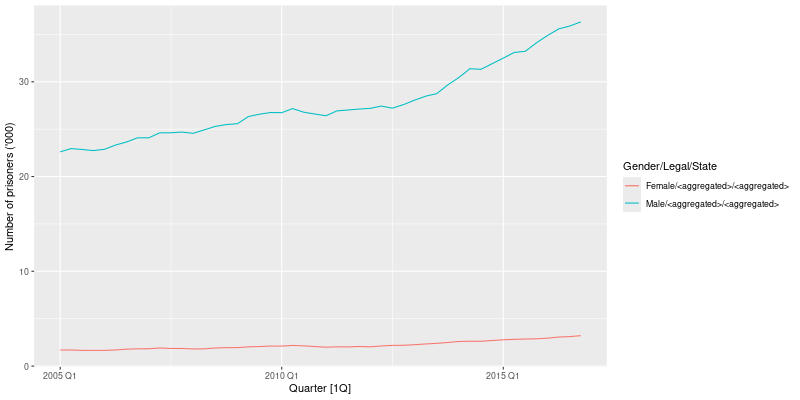

In [270]:
with ro.local_context() as lc:
    lc['prison_gts'] = prison_gts
    rcode = ('''
        prison_gts |>
          filter(!is_aggregated(Gender), is_aggregated(Legal),
                 is_aggregated(State)) |>
          autoplot(Count) +
              labs(y = "Number of prisoners ('000)")
        ''')
    display(image_png(ro.r(rcode)))
#prison_gts |>
#  filter(!is_aggregated(Gender), is_aggregated(Legal),
#         is_aggregated(State)) |>
#  autoplot(Count) +
#  labs(y = "Number of prisoners ('000)")

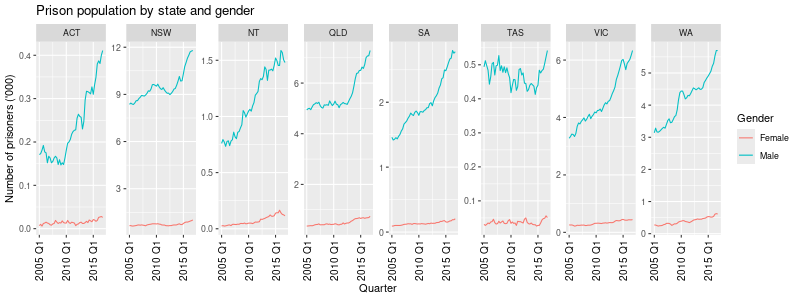

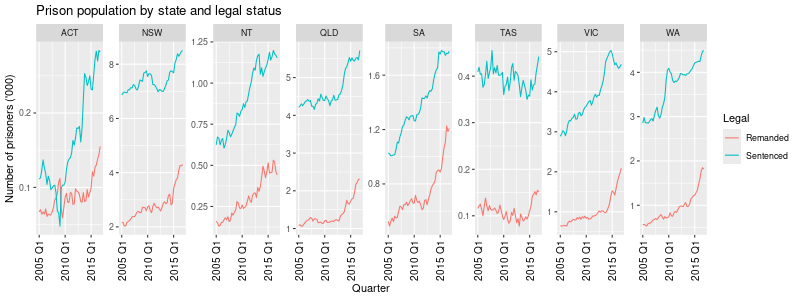

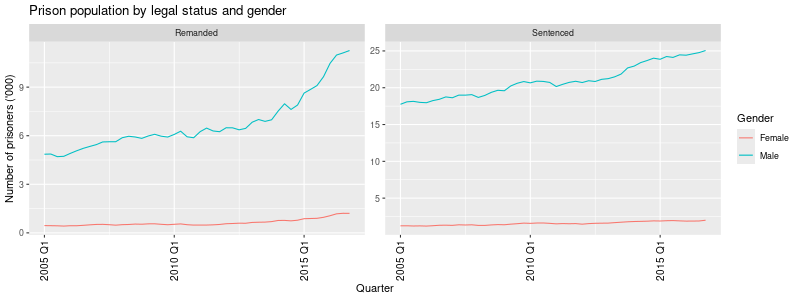

In [271]:
prison_gg = (ggplot2.ggplot(DataFrame(prison_gts)
                            .filter(rl('!is_aggregated(Gender)'), rl('!is_aggregated(Legal)'),rl('!is_aggregated(State)'))
                            .mutate(Gender = rl('as.character(Gender)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Count'), group = rl('Gender'), colour = rl('Gender')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(State)'), nrow = 1, scales = "free_y") +
             ggplot2.labs(title = "Prison population by state and gender",
                          y = "Number of prisoners ('000)") +
             ggplot2.theme(axis_text_x = ggplot2.element_text(angle = 90, hjust = 1)))
display(image_png(prison_gg, height=300))
prison_gg2 = (ggplot2.ggplot(DataFrame(prison_gts)
                            .filter(rl('!is_aggregated(Gender)'), rl('!is_aggregated(Legal)'),rl('!is_aggregated(State)'))
                            .mutate(Legal = rl('as.character(Legal)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Count'), group = rl('Legal'), colour = rl('Legal')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(State)'), nrow = 1, scales = "free_y") +
             ggplot2.labs(title = "Prison population by state and legal status",
                          y = "Number of prisoners ('000)") +
             ggplot2.theme(axis_text_x = ggplot2.element_text(angle = 90, hjust = 1)))
display(image_png(prison_gg2, height=300))
prison_gg3 = (ggplot2.ggplot(DataFrame(prison_gts)
                            .filter(rl('!is_aggregated(Gender)'), rl('!is_aggregated(Legal)'),rl('!is_aggregated(State)'))
                            .mutate(Gender = rl('as.character(Gender)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Count'), group = rl('Gender'), colour = rl('Gender')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(Legal)'), nrow = 1, scales = "free_y") +
             ggplot2.labs(title = "Prison population by legal status and gender",
                          y = "Number of prisoners ('000)") +
             ggplot2.theme(axis_text_x = ggplot2.element_text(angle = 90, hjust = 1)))
display(image_png(prison_gg3,height=300))
#prison_gts |>
#  filter(!is_aggregated(Gender), !is_aggregated(Legal),
#         !is_aggregated(State)) |>
#  mutate(Gender = as.character(Gender)) |>
#  ggplot(aes(x = Quarter, y = Count,
#             group = Gender, colour=Gender)) +
#  stat_summary(fun = sum, geom = "line") +
#  labs(title = "Prison population by state and gender",
#       y = "Number of prisoners ('000)") +
#  facet_wrap(~ as.character(State),
#             nrow = 1, scales = "free_y") +
#  theme(axis.text.x = element_text(angle = 90, hjust = 1))

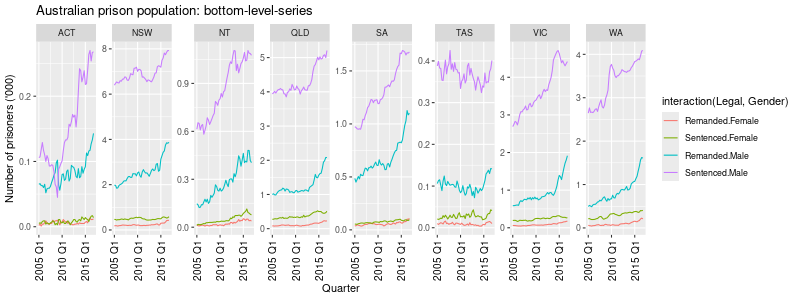

In [272]:
prison_gg = (ggplot2.ggplot(DataFrame(prison_gts)
                            .filter(rl('!is_aggregated(Gender)'), rl('!is_aggregated(Legal)'),rl('!is_aggregated(State)'))
                            .mutate(Gender = rl('as.character(Gender)'),
                                    Legal = rl('as.character(Legal)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Count'), 
                         group = rl('interaction(Legal,Gender)'), colour = rl('interaction(Legal,Gender)')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(State)'), nrow = 1, scales = "free_y") +
             ggplot2.labs(title = "Australian prison population: bottom-level-series",
                          y = "Number of prisoners ('000)") +
             ggplot2.theme(axis_text_x = ggplot2.element_text(angle = 90, hjust = 1)))
display(image_png(prison_gg, height=300))

In [273]:
tourism_full = fabletools.aggregate_key(tourism, rl('(State/Region) * Purpose'), Trips = rl('sum(Trips)'))
#tourism_full <- tourism |>
#  aggregate_key((State/Region) * Purpose, Trips = sum(Trips))

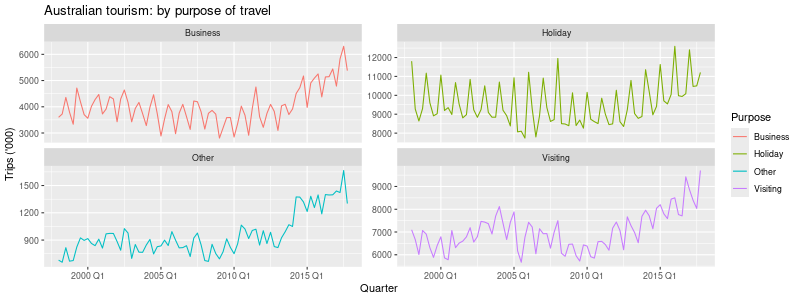

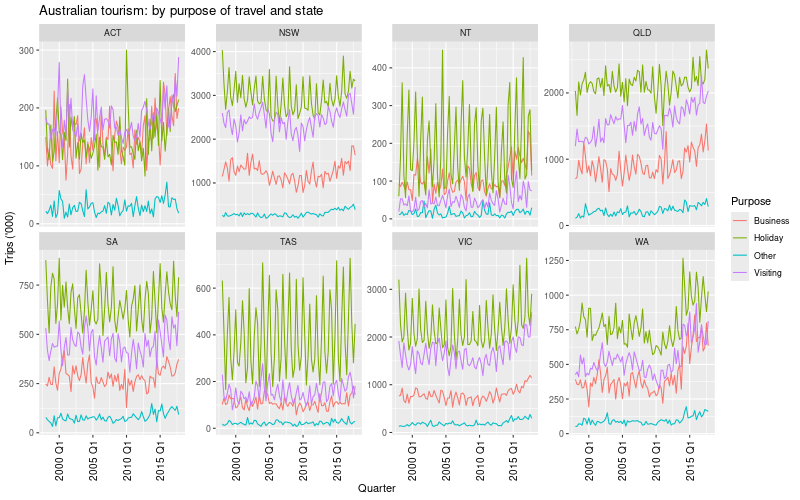

In [274]:
tourism_gg = (ggplot2.ggplot(DataFrame(tourism_full)
                            .filter(rl('!is_aggregated(Purpose)'), rl('!is_aggregated(State)'),rl('!is_aggregated(Region)'))
                            .select(rl('-State'), rl('-Region'))
                            .mutate(Purpose = rl('as.character(Purpose)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Trips'), colour = rl('Purpose')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(Purpose)'), nrow = 2, scales = "free_y") +
             ggplot2.labs(title = "Australian tourism: by purpose of travel",
                          y = "Trips ('000)") +
             ggplot2.guides(colour = ggplot2.guide_legend(title = "Purpose")))
display(image_png(tourism_gg, height=300))
tourism_gg2 = (ggplot2.ggplot(DataFrame(tourism_full)
                            .filter(rl('!is_aggregated(Purpose)'), rl('!is_aggregated(State)'),rl('!is_aggregated(Region)'))
                            .select(rl('-Region'))
                            .mutate(Purpose = rl('as.character(Purpose)'))) + 
             ggplot2.aes(x = rl('Quarter'), y = rl('Trips'), 
                         group = rl('Purpose'), colour = rl('Purpose')) +
             ggplot2.stat_summary(fun = rl('sum'), geom = "line") +
             ggplot2.facet_wrap(rl('~ as.character(State)'), nrow = 2, scales = "free_y") +
             ggplot2.labs(title = "Australian tourism: by purpose of travel and state",
                          y = "Trips ('000)") +
             ggplot2.theme(axis_text_x = ggplot2.element_text(angle = 90, hjust = 1)))
display(image_png(tourism_gg2, height=500))

## 11.2 Single level approaches

In [275]:
tourism = DataFrame(data(tsibble).fetch('tourism')['tourism']).mutate(
    State=rl('recode(State, `New South Wales`="NSW",`Northern Territory`="NT",`Queensland`="QLD",`South Australia`="SA",`Tasmania`="TAS",`Victoria`="VIC",`Western Australia`="WA")'))
tourism_full = fabletools.aggregate_key(tourism, rl('(State/Region) * Purpose'), Trips = rl('sum(Trips)'))
fit = (fabletools.model(
       DataFrame(tourism_full).filter(rl('year(Quarter) <= 2015')),
       ets = fable.ETS(rl('Trips'))))
print(fit)

# A mable: 425 x 4
# Key:     State, Purpose, Region [425]
   State  Purpose      Region                ets
   <chr*> <chr*>       <chr*>            <model>
 1 ACT    Business     Canberra     <ETS(M,N,M)>
 2 ACT    Business     <aggregated> <ETS(M,N,M)>
 3 ACT    Holiday      Canberra     <ETS(M,N,A)>
 4 ACT    Holiday      <aggregated> <ETS(M,N,A)>
 5 ACT    Other        Canberra     <ETS(M,N,N)>
 6 ACT    Other        <aggregated> <ETS(M,N,N)>
 7 ACT    Visiting     Canberra     <ETS(A,N,N)>
 8 ACT    Visiting     <aggregated> <ETS(A,N,N)>
 9 ACT    <aggregated> Canberra     <ETS(A,N,N)>
10 ACT    <aggregated> <aggregated> <ETS(A,N,N)>
# ℹ 415 more rows
# ℹ Use `print(n = ...)` to see more rows



In [276]:
with ro.local_context() as lc:
    lc['fit'] = fit
    rcode = ('''
        fc <- fit |>
        reconcile(bu = fabletools::bottom_up(ets)) |>
        forecast(h = "2 years")
        ''')
    ro.r(rcode)
    fc = lc['fc']
print(fc)
# mint_c = fabletools::min_trace(ets, method = "mint_conv"),
#bu = fabletools::bottom_up(ets),
#wlsv = min_trace(ets, method = "wls_var"),
#                        wlss = min_trace(ets, method = "wls_struct),
#                        mint_s = min_trace(ets, method = "mint_shrink")

# A fable: 6,800 x 7 [1Q]
# Key:     State, Purpose, Region, .model [850]
   State  Purpose  Region   .model Quarter
   <chr*> <chr*>   <chr*>   <chr>    <qtr>
 1 ACT    Business Canberra ets    2016 Q1
 2 ACT    Business Canberra ets    2016 Q2
 3 ACT    Business Canberra ets    2016 Q3
 4 ACT    Business Canberra ets    2016 Q4
 5 ACT    Business Canberra ets    2017 Q1
 6 ACT    Business Canberra ets    2017 Q2
 7 ACT    Business Canberra ets    2017 Q3
 8 ACT    Business Canberra ets    2017 Q4
 9 ACT    Business Canberra bu     2016 Q1
10 ACT    Business Canberra bu     2016 Q2
# ℹ 6,790 more rows
# ℹ 2 more variables: Trips <dist>, .mean <dbl>
# ℹ Use `print(n = ...)` to see more rows



## 11.4 Forecasting Australian domestic tourism

In [277]:
tourism = DataFrame(data(tsibble).fetch('tourism')['tourism']).mutate(
    State=rl('recode(State, `New South Wales`="NSW",`Northern Territory`="NT",`Queensland`="QLD",`South Australia`="SA",`Tasmania`="TAS",`Victoria`="VIC",`Western Australia`="WA")'))
tourism_full = fabletools.aggregate_key(tourism, rl('(State/Region) * Purpose'), Trips = rl('sum(Trips)'))
with ro.local_context() as lc:
    lc['tourism_full'] = tourism_full
    rcode = ('''
        fit <- tourism_full |>
          filter(year(Quarter) <= 2015) |>
          fabletools::model(base = ETS(Trips)) |>
          reconcile(
            bu = bottom_up(base),
            ols = min_trace(base, method = "ols"),
            mint = min_trace(base, method = "mint_shrink")
          )
        ''')
    ro.r(rcode)
    fit = lc['fit']


In [278]:
fc = fabletools.forecast_mdl_df(fit, h = "2 years")
print(fc)
#fc <- fit |> forecast(h = "2 years")

# A fable: 13,600 x 7 [1Q]
# Key:     State, Purpose, Region, .model [1,700]
   State  Purpose  Region   .model Quarter
   <chr*> <chr*>   <chr*>   <chr>    <qtr>
 1 ACT    Business Canberra base   2016 Q1
 2 ACT    Business Canberra base   2016 Q2
 3 ACT    Business Canberra base   2016 Q3
 4 ACT    Business Canberra base   2016 Q4
 5 ACT    Business Canberra base   2017 Q1
 6 ACT    Business Canberra base   2017 Q2
 7 ACT    Business Canberra base   2017 Q3
 8 ACT    Business Canberra base   2017 Q4
 9 ACT    Business Canberra bu     2016 Q1
10 ACT    Business Canberra bu     2016 Q2
# ℹ 13,590 more rows
# ℹ 2 more variables: Trips <dist>, .mean <dbl>
# ℹ Use `print(n = ...)` to see more rows



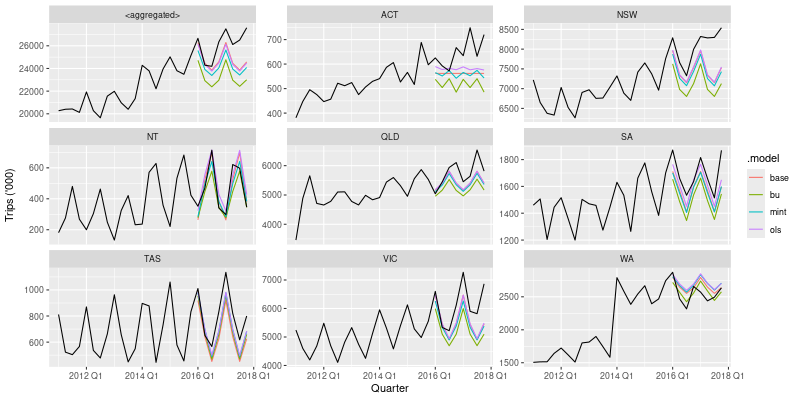

In [279]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['tourism_full'] = tourism_full
    rcode = ('''
        fc |>
          filter(is_aggregated(Region), is_aggregated(Purpose)) |>
          autoplot(
            tourism_full |> filter(year(Quarter) >= 2011),
            level = NULL
          ) +
          labs(y = "Trips ('000)") +
          facet_wrap(vars(State), scales = "free_y")
        ''')
    display(image_png(ro.r(rcode)))

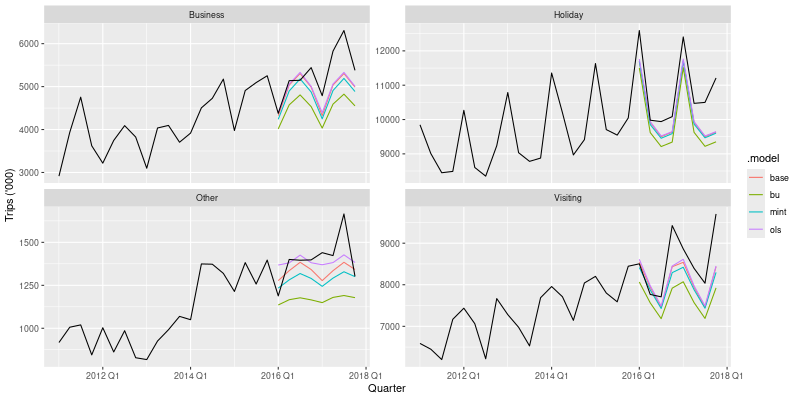

In [280]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['tourism_full'] = tourism_full
    rcode = ('''
        fc |>
          filter(is_aggregated(State), !is_aggregated(Purpose)) |>
          autoplot(
            tourism_full |> filter(year(Quarter) >= 2011),
            level = NULL
          ) +
          labs(y = "Trips ('000)") +
          facet_wrap(vars(Purpose), scales = "free_y")
        ''')
    display(image_png(ro.r(rcode)))


In [281]:
accuracy = (fabletools.accuracy_fbl_ts(
        (DataFrame(fc)
        .filter(rl('is_aggregated(State)'), rl('is_aggregated(Purpose)'))),
        data = tourism_full,
        measures = rl('list(rmse = RMSE, mase = MASE)')))
result = (DataFrame(accuracy)
          .group_by(rl('.model'))
          .summarise(rmse = rl('mean(rmse)'), mase = rl('mean(mase)')))
print(result)
#fc |>
#  filter(is_aggregated(State), is_aggregated(Purpose)) |>
#  accuracy(
#    data = tourism_full,
#    measures = list(rmse = RMSE, mase = MASE)
#  ) |>
#  group_by(.model) |>
#  summarise(rmse = mean(rmse), mase = mean(mase))

# A tibble: 4 × 3
  .model  rmse  mase
  <chr>  <dbl> <dbl>
1 base   1721.  1.53
2 bu     3071.  3.17
3 mint   2158.  2.09
4 ols    1804.  1.63



## 11.6 Forecasting Australian prison population

In [282]:
readr = importr('readr')
prison = dplyr.relocate(
    tsibble.as_tsibble(
    (DataFrame(readr.read_csv("https://OTexts.com/fpp3/extrafiles/prison_population.csv"))
     .mutate(Quarter = rl('yearquarter(Date)'))
     .select(rl('-Date'))),
    key = rl('c(Gender, Legal, State, Indigenous)'),
    index = rl('Quarter')),
    rl('Quarter'))
prison_gts = fabletools.aggregate_key(prison, rl('Gender * Legal * State'), Count = rl('sum(Count)/1e3'))

Rows: 3072 Columns: 6
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (4): State, Gender, Legal, Indigenous
dbl  (1): Count
date (1): Date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [283]:
with ro.local_context() as lc:
    lc['prison_gts'] = prison_gts
    rcode = ('''
        fit <- prison_gts |>
            filter(year(Quarter) <= 2014) |>
            model(base = ETS(Count)) |>
            reconcile(
                bottom_up = bottom_up(base),
                MinT = min_trace(base, method = "mint_shrink")
            )
        ''')
    ro.r(rcode)
    fit = lc['fit']
fc = fabletools.forecast_mdl_df(fit, h = 8)
print(fc)
#fit <- prison_gts |>
#  filter(year(Quarter) <= 2014) |>
#  model(base = ETS(Count)) |>
#  reconcile(
#    bottom_up = bottom_up(base),
#    MinT = min_trace(base, method = "mint_shrink")
#  )
#fc <- fit |> forecast(h = 8)

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A fable: 1,944 x 7 [1Q]
# Key:     Gender, Legal, State, .model [243]
   Gender Legal    State  .model    Quarter
   <chr*> <chr*>   <chr*> <chr>       <qtr>
 1 Female Remanded ACT    base      2015 Q1
 2 Female Remanded ACT    base      2015 Q2
 3 Female Remanded ACT    base      2015 Q3
 4 Female Remanded ACT    base      2015 Q4
 5 Female Remanded ACT    base      2016 Q1
 6 Female Remanded ACT    base      2016 Q2
 7 Female Remanded ACT    base      2016 Q3
 8 Female Remanded ACT    base      2016 Q4
 9 Female Remanded ACT    bottom_up 2015 Q1
10 Female Remanded ACT    bottom_up 2015 Q2
# ℹ 1,934 more rows
# ℹ 2 more variables: Count <dist>, .mean <dbl>
# ℹ Use `print(n = ...)` to see more rows



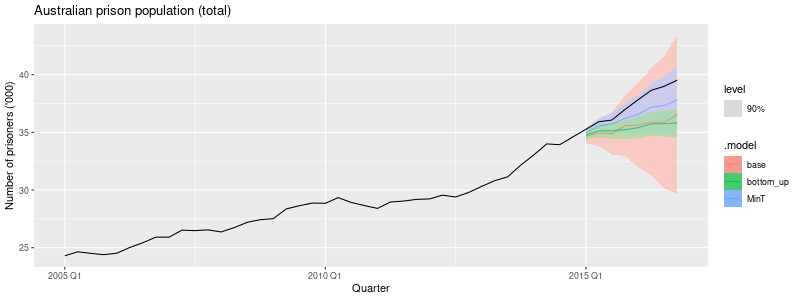

In [284]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['prison_gts'] = prison_gts
    rcode = ('''
        fc |>
          filter(is_aggregated(State), is_aggregated(Gender), is_aggregated(Legal)) |>
          autoplot(
            prison_gts, alpha = 0.7, level = 90) +
          labs(y = "Number of prisoners ('000)",
               title = "Australian prison population (total)")
        ''')
    display(image_png(ro.r(rcode),height=300))
#fc |>
#  filter(is_aggregated(State), is_aggregated(Gender),
#         is_aggregated(Legal)) |>
#  autoplot(prison_gts, alpha = 0.7, level = 90) +
#  labs(y = "Number of prisoners ('000)",
#       title = "Australian prison population (total)")

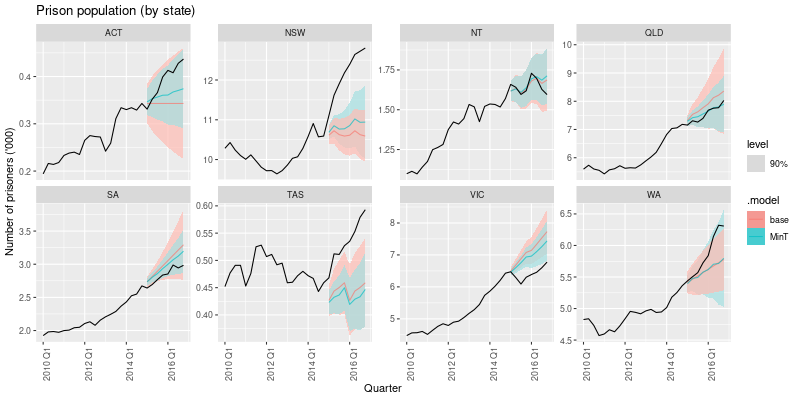

In [285]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['prison_gts'] = prison_gts
    rcode = ('''
        fc |>
          filter(
            .model %in% c("base", "MinT"),
            !is_aggregated(State), is_aggregated(Legal),
            is_aggregated(Gender)
          ) |>
          autoplot(
            prison_gts |> filter(year(Quarter) >= 2010),
            alpha = 0.7, level = 90
          ) +
          labs(title = "Prison population (by state)",
               y = "Number of prisoners ('000)") +
          facet_wrap(vars(State), scales = "free_y", ncol = 4) +
          theme(axis.text.x = element_text(angle = 90, hjust = 1))
        ''')
    display(image_png(ro.r(rcode),height=400))
#fc |>
#  filter(
#    .model %in% c("base", "MinT"),
#    !is_aggregated(State), is_aggregated(Legal),
#    is_aggregated(Gender)
#  ) |>
#  autoplot(
#    prison_gts |> filter(year(Quarter) >= 2010),
#    alpha = 0.7, level = 90
#  ) +
#  labs(title = "Prison population (by state)",
#       y = "Number of prisoners ('000)") +
#  facet_wrap(vars(State), scales = "free_y", ncol = 4) +
#  theme(axis.text.x = element_text(angle = 90, hjust = 1))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



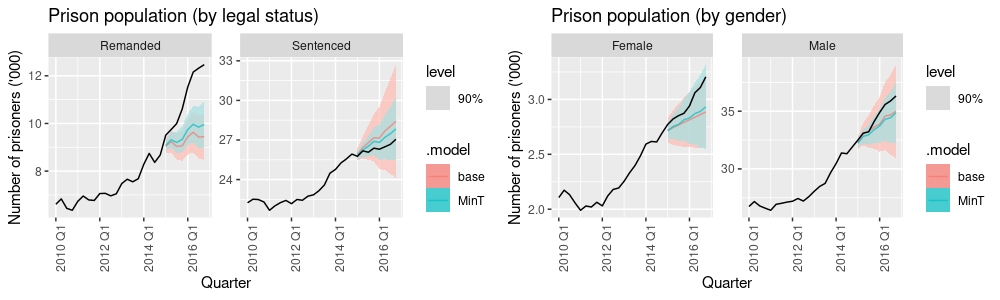

In [286]:
gridExtra = importr('gridExtra')
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['prison_gts'] = prison_gts
    rcode = ('''
        plot1 <- fc |>
          filter(
            .model %in% c("base", "MinT"),
            is_aggregated(State), !is_aggregated(Legal), is_aggregated(Gender)
          ) |>
          autoplot(prison_gts |> filter(year(Quarter) >= 2010), alpha = 0.7, level = 90) +
          labs(title = "Prison population (by legal status)", y = "Number of prisoners ('000)") +
          facet_wrap(vars(Legal), scales = "free_y", nrow = 1) +
          theme(axis.text.x = element_text(angle = 90, hjust = 1))
        ''')
    rcode2 = ('''
        plot2 <- fc |>
          filter(
            .model %in% c("base", "MinT"),
            is_aggregated(State), is_aggregated(Legal), !is_aggregated(Gender)
          ) |>
          autoplot(prison_gts |> filter(year(Quarter) >= 2010), alpha = 0.7, level = 90) +
          labs(title = "Prison population (by gender)", y = "Number of prisoners ('000)") +
          facet_wrap(vars(Gender), scales = "free_y", nrow = 1) +
          theme(axis.text.x = element_text(angle = 90, hjust = 1))
        ''')
    ro.r(rcode)
    ro.r(rcode2)
    plot1 = lc['plot1']
    plot2 = lc['plot2']
graphics = importr("graphics")
with r_inline_plot(width=1000, height=300, dpi=100):
    gridExtra.grid_arrange(plot1, plot2, ncol=2)

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



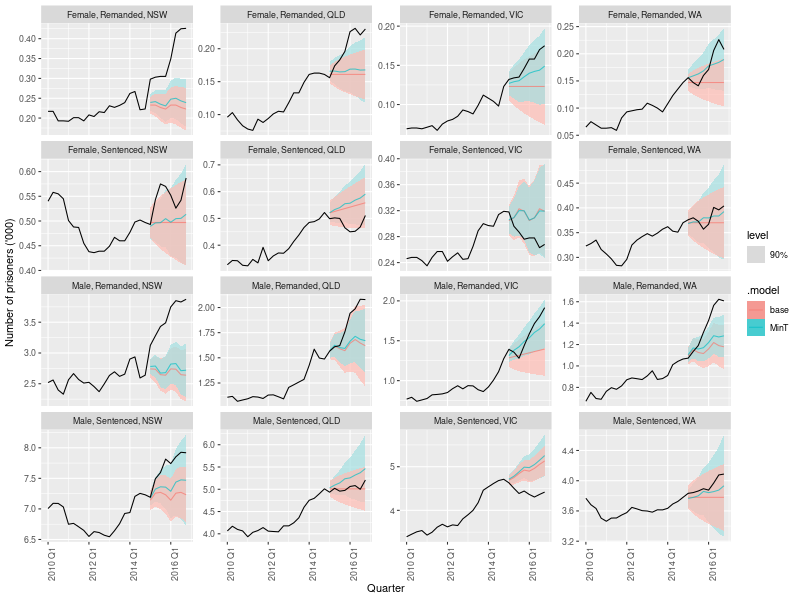

In [287]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['prison_gts'] = prison_gts
    rcode = ('''
        fc |>
          filter(
            .model %in% c("base", "MinT"),
            State %in% c("NSW", "QLD", "VIC", "WA"),
            !is_aggregated(State), !is_aggregated(Legal),
            !is_aggregated(Gender)
          ) |>
          autoplot(
            prison_gts |> filter(year(Quarter) >= 2010),
            alpha = 0.7, level = 90
          ) +
          labs(y = "Number of prisoners ('000)") +
          facet_wrap(~Gender + Legal + State, scales = "free_y", ncol = 4, labeller = 
                      label_wrap_gen(multi_line=FALSE)) +
          theme(axis.text.x = element_text(angle = 90, hjust = 1))
        ''')
    display(image_png(ro.r(rcode),height=600))

In [288]:
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['prison_gts'] = prison_gts
    rcode = ('''
        fc |>
          filter(is_aggregated(State), is_aggregated(Gender),
                 is_aggregated(Legal)) |>
          accuracy(data = prison_gts,
               measures = list(mase = MASE,
                               ss = skill_score(CRPS)
                               )
               ) |>
          group_by(.model) |>
          summarise(mase = mean(mase), sspc = mean(ss) * 100)
        ''')
    print(ro.r(rcode))
#result = (DataFrame(fabletools.accuracy_fbl_ts(
#            (DataFrame(fc)
#            .filter(rl('is_aggregated(State)'), rl('is_aggregated(Gender)'), rl('is_aggregated(Legal)'))),
#            data = prison_gts,
#            measures = rl('list(mase = MASE, ss = skill_score(CPRS))')))
#          .group_by(rl('.model'))
#          .summarise(mase = rl('mean(mase)'), sspc = rl('mean(ss) * 100')))
#print(result)
#fc |>
#  filter(is_aggregated(State), is_aggregated(Gender),
#         is_aggregated(Legal)) |>
#  accuracy(data = prison_gts,
#           measures = list(mase = MASE,
#                           ss = skill_score(CRPS)
#                           )
#           ) |>
#  group_by(.model) |>
#  summarise(mase = mean(mase), sspc = mean(ss) * 100)

# A tibble: 3 × 3
  .model     mase  sspc
  <chr>     <dbl> <dbl>
1 MinT      0.895  76.8
2 base      1.72   55.9
3 bottom_up 1.84   33.5



# 12 Advanced forecasting methods
## 12.1 Complex seasonality

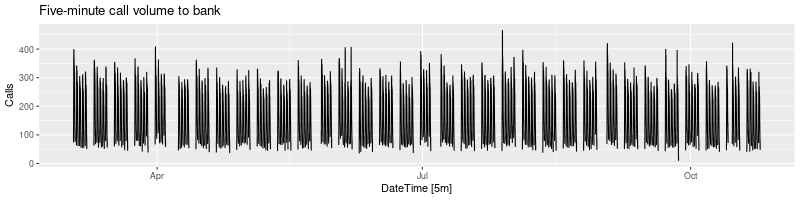

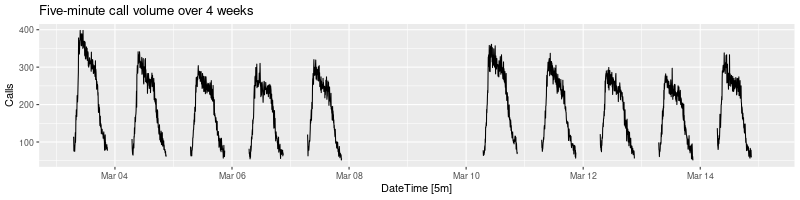

In [289]:
bank_calls = data(fpp3).fetch('bank_calls')['bank_calls']
with ro.local_context() as lc:
    lc['bank_calls'] = bank_calls
    rcode = ('''
        bank_calls |>
            fill_gaps() |>
            autoplot(Calls) +
              labs(y = "Calls",
                   title = "Five-minute call volume to bank")
        ''')
    display(image_png(ro.r(rcode),height=200))
    rcode2 = ('''
        bank_calls |>
            fill_gaps() |>
            slice(1:3380) |>
            autoplot(Calls) +
            labs(y = "Calls",
                 title = "Five-minute call volume over 4 weeks")
        ''')
    display(image_png(ro.r(rcode2),height=200))
#bank_calls |>
#  fill_gaps() |>
#  autoplot(Calls) +
#  labs(y = "Calls",
#       title = "Five-minute call volume to bank")

In [290]:
calls = tsibble.update_tsibble(
            DataFrame(bank_calls)
             .mutate(t = rl('row_number()')),
            index = rl('t'), regular = True)
print(calls)
fit = fabletools.model(
        calls,
        feasts.STL(rl('sqrt(Calls) ~ season(period = 169) + season(period = 5*169)'), robust = True))
print(fabletools.report(fit))

# A tsibble: 27,716 x 3 [1]
   DateTime            Calls     t
   <dttm>              <dbl> <int>
 1 2003-03-03 07:00:00   111     1
 2 2003-03-03 07:05:00   113     2
 3 2003-03-03 07:10:00    76     3
 4 2003-03-03 07:15:00    82     4
 5 2003-03-03 07:20:00    91     5
 6 2003-03-03 07:25:00    87     6
 7 2003-03-03 07:30:00    75     7
 8 2003-03-03 07:35:00    89     8
 9 2003-03-03 07:40:00    99     9
10 2003-03-03 07:45:00   125    10
# ℹ 27,706 more rows
# ℹ Use `print(n = ...)` to see more rows

Series: Calls 
Model: STL 
Transformation: sqrt(Calls) 

A model specific report is not available for this model class.# A mable: 1 x 1
  `<environment>`
          <model>
1           <STL>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 43 rows containing missing values or values outside the scale range
(`geom_line()`). 



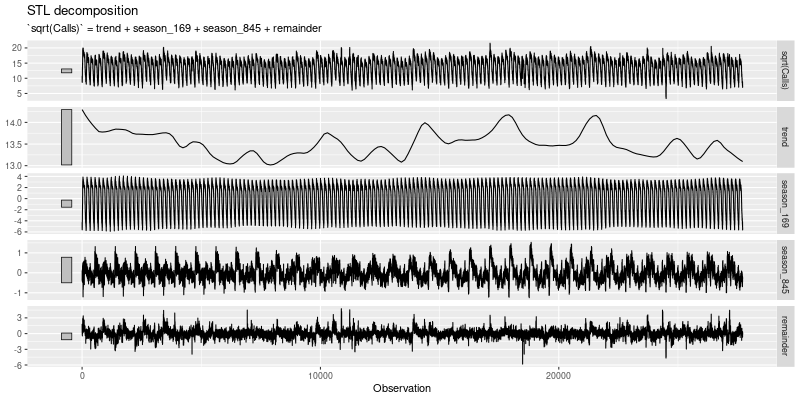

In [291]:
stl_dcmp = fabletools.components_mdl_df(fit)
with ro.local_context() as lc:
    lc['stl_dcmp'] = stl_dcmp
    rcode = ('''
        autoplot(stl_dcmp) +
          labs(x = "Observation")
        ''')
    display(image_png(ro.r(rcode)))
#calls |>
#  model(
#    STL(sqrt(Calls) ~ season(period = 169) +
#                      season(period = 5*169),
#        robust = TRUE)
#  ) |>
#  components() |>
#  autoplot() + labs(x = "Observation")

In [292]:
# Forecasts from STL+ETS decomposition
my_dcmp_spec = fabletools.decomposition_model(
    feasts.STL(rl('sqrt(Calls) ~ season(period = 169) + season(period = 5*169)'), robust=True),
    fable.ETS(rl('season_adjust ~ season("N")')))
fc = fabletools.forecast_mdl_df(
    fabletools.model(calls, my_dcmp_spec),
    h = 5 * 169)
#my_dcmp_spec <- decomposition_model(
#  STL(sqrt(Calls) ~ season(period = 169) +
#                    season(period = 5*169),
#      robust = TRUE),
#  ETS(season_adjust ~ season("N"))
#)
#fc <- calls |>
#  model(my_dcmp_spec) |>
#  forecast(h = 5 * 169)

In [293]:
# Add correct time stamps to fable
with ro.local_context() as lc:
    lc['calls'] = calls
    fc_with_times = fabletools.as_fable(
                    (DataFrame(tsibble.new_data(bank_calls,
                                                n = 7 * 24 * 60 / 5))
                     .mutate(time = rl('format(DateTime, format = "%H:%M:%S")'))
                     .filter(
                         rl('time %in% format(bank_calls$DateTime, format = "%H:%M:%S")'),
                         rl('wday(DateTime, week_start = 1) <= 5'))
                     .mutate(t = rl('row_number() + max(calls$t)'))
                     .left_join(fc, by = "t")),
                    response = "Calls",
                    distribution = "Calls")
print(fc_with_times)
#fc_with_times <- bank_calls |>
#  new_data(n = 7 * 24 * 60 / 5) |>
#  mutate(time = format(DateTime, format = "%H:%M:%S")) |>
#  filter(
#    time %in% format(bank_calls$DateTime, format = "%H:%M:%S"),
#    wday(DateTime, week_start = 1) <= 5
#  ) |>
#  mutate(t = row_number() + max(calls$t)) |>
#  left_join(fc, by = "t") |>
#  as_fable(response = "Calls", distribution = Calls)

# A fable: 845 x 6 [5m] <UTC>
   DateTime            time         t .model                  Calls .mean
   <dttm>              <chr>    <dbl> <chr>                  <dist> <dbl>
 1 2003-10-27 07:00:00 07:00:00 27717 <environment> t(N(8.8, 0.24))  76.8
 2 2003-10-27 07:05:00 07:05:00 27718 <environment> t(N(9.2, 0.25))  85.7
 3 2003-10-27 07:10:00 07:10:00 27719 <environment> t(N(8.9, 0.25))  79.8
 4 2003-10-27 07:15:00 07:15:00 27720 <environment> t(N(8.6, 0.26))  75.0
 5 2003-10-27 07:20:00 07:20:00 27721 <environment> t(N(9.2, 0.27))  85.0
 6 2003-10-27 07:25:00 07:25:00 27722 <environment> t(N(8.7, 0.28))  75.7
 7 2003-10-27 07:30:00 07:30:00 27723 <environment> t(N(9.1, 0.28))  82.9
 8 2003-10-27 07:35:00 07:35:00 27724 <environment>   t(N(9, 0.29))  81.2
 9 2003-10-27 07:40:00 07:40:00 27725 <environment>  t(N(9.2, 0.3))  85.0
10 2003-10-27 07:45:00 07:45:00 27726 <environment>  t(N(9.6, 0.3))  92.9
# ℹ 835 more rows
# ℹ Use `print(n = ...)` to see more rows



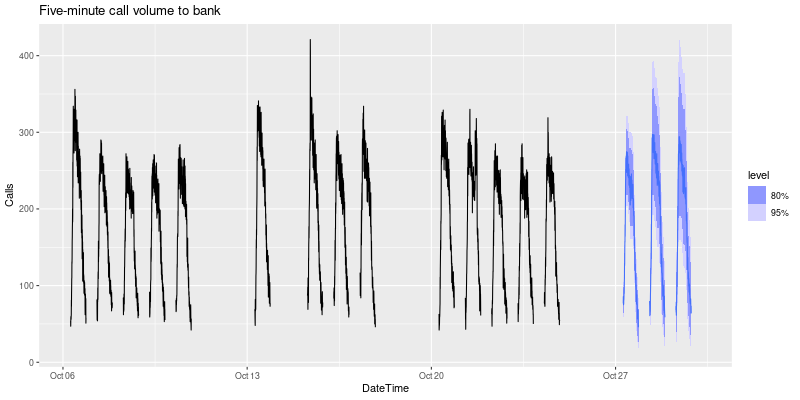

In [294]:
# Plot results with last 3 weeks of data
with ro.local_context() as lc:
    lc['fc_with_times'] = fc_with_times
    rcode = ('''
        fc_with_times |>
          fill_gaps() |>
          autoplot(bank_calls |> tail(14 * 169) |> fill_gaps()) +
          labs(y = "Calls",
               title = "Five-minute call volume to bank")
        ''')
    display(image_png(ro.r(rcode)))
#fc_with_times |>
#  fill_gaps() |>
#  autoplot(bank_calls |> tail(14 * 169) |> fill_gaps()) +
#  labs(y = "Calls",
#       title = "Five-minute call volume to bank")
#> Warning: Removed 100 rows containing missing values (`geom_line()`).

### Dynamic Harmonic regression with multiple seasonal periods

In [295]:
fit = fabletools.model(
        calls,
        dhr = fable.ARIMA(rl('sqrt(Calls) ~ PDQ(0,0,0)+pdq(d=0) + fourier(period=169, K=10) + fourier(period=5*169, K=5)')))
print(fabletools.report(fit))
fc = fabletools.forecast_mdl_df(fit, h = 5 * 169)
#fit <- calls |>
#  model(
#    dhr = ARIMA(sqrt(Calls) ~ PDQ(0, 0, 0) + pdq(d = 0) +
#                  fourier(period = 169, K = 10) +
#                  fourier(period = 5*169, K = 5)))

#fc <- fit |> forecast(h = 5 * 169)

Series: Calls 
Model: LM w/ ARIMA(1,0,3) errors 
Transformation: sqrt(Calls) 

Coefficients:
         ar1      ma1      ma2      ma3  fourier(period = 169, K = 10)C1_169
      0.9871  -0.7253  -0.0415  -0.0321                              -3.1438
s.e.  0.0011   0.0061   0.0075   0.0060                               0.0252
      fourier(period = 169, K = 10)S1_169  fourier(period = 169, K = 10)C2_169
                                   1.9775                              -1.3323
s.e.                               0.0253                               0.0138
      fourier(period = 169, K = 10)S2_169  fourier(period = 169, K = 10)C3_169
                                   0.6322                              -0.4468
s.e.                               0.0139                               0.0100
      fourier(period = 169, K = 10)S3_169  fourier(period = 169, K = 10)C4_169
                                  -0.3943                              -0.1932
s.e.                               0.0100   

# A fable: 845 x 6 [5m] <UTC>
   DateTime            time         t .model           Calls .mean
   <dttm>              <chr>    <dbl> <chr>           <dist> <dbl>
 1 2003-10-27 07:00:00 07:00:00 27717 dhr    t(N(7.5, 0.32))  56.7
 2 2003-10-27 07:05:00 07:05:00 27718 dhr    t(N(7.5, 0.35))  57.1
 3 2003-10-27 07:10:00 07:10:00 27719 dhr    t(N(7.6, 0.36))  57.7
 4 2003-10-27 07:15:00 07:15:00 27720 dhr    t(N(7.6, 0.37))  58.7
 5 2003-10-27 07:20:00 07:20:00 27721 dhr    t(N(7.7, 0.38))  60.1
 6 2003-10-27 07:25:00 07:25:00 27722 dhr    t(N(7.9, 0.39))  62.1
 7 2003-10-27 07:30:00 07:30:00 27723 dhr       t(N(8, 0.4))  64.8
 8 2003-10-27 07:35:00 07:35:00 27724 dhr    t(N(8.2, 0.41))  68.1
 9 2003-10-27 07:40:00 07:40:00 27725 dhr    t(N(8.5, 0.42))  72.0
10 2003-10-27 07:45:00 07:45:00 27726 dhr    t(N(8.7, 0.43))  76.6
# ℹ 835 more rows
# ℹ Use `print(n = ...)` to see more rows



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Removed 100 rows containing missing values or values outside the scale range
(`geom_line()`). 

R[write to console]: 2: Provided exogenous regressors are rank deficient, removing regressors: `fourier(period = 5 * 169, K = 5)C5_845`, `fourier(period = 5 * 169, K = 5)S5_845` 



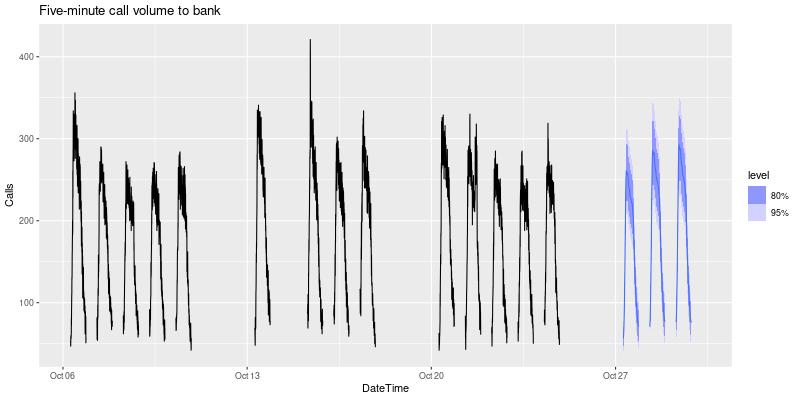

In [296]:
# Add correct time stamps to fable
with ro.local_context() as lc:
    lc['calls'] = calls
    fc_with_times = fabletools.as_fable(
                    (DataFrame(tsibble.new_data(bank_calls,
                                                n = 7 * 24 * 60 / 5))
                     .mutate(time = rl('format(DateTime, format = "%H:%M:%S")'))
                     .filter(
                         rl('time %in% format(bank_calls$DateTime, format = "%H:%M:%S")'),
                         rl('wday(DateTime, week_start = 1) <= 5'))
                     .mutate(t = rl('row_number() + max(calls$t)'))
                     .left_join(fc, by = "t")),
                    response = "Calls",
                    distribution = "Calls")
print(fc_with_times)
#fc_with_times <- bank_calls |>
#  new_data(n = 7 * 24 * 60 / 5) |>
#  mutate(time = format(DateTime, format = "%H:%M:%S")) |>
#  filter(
#    time %in% format(bank_calls$DateTime, format = "%H:%M:%S"),
#    wday(DateTime, week_start = 1) <= 5
#  ) |>
#  mutate(t = row_number() + max(calls$t)) |>
#  left_join(fc, by = "t") |>
#  as_fable(response = "Calls", distribution = Calls)

# Plot results with last 3 weeks of data
with ro.local_context() as lc:
    lc['fc_with_times'] = fc_with_times
    rcode = ('''
        fc_with_times |>
          fill_gaps() |>
          autoplot(bank_calls |> tail(14 * 169) |> fill_gaps()) +
          labs(y = "Calls",
               title = "Five-minute call volume to bank")
        ''')
    display(image_png(ro.r(rcode)))
#fc_with_times |>
#  fill_gaps() |>
#  autoplot(bank_calls |> tail(14 * 169) |> fill_gaps()) +
#  labs(y = "Calls",
#       title = "Five-minute call volume to bank")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 100 rows containing missing values or values outside the scale range
(`geom_line()`). 



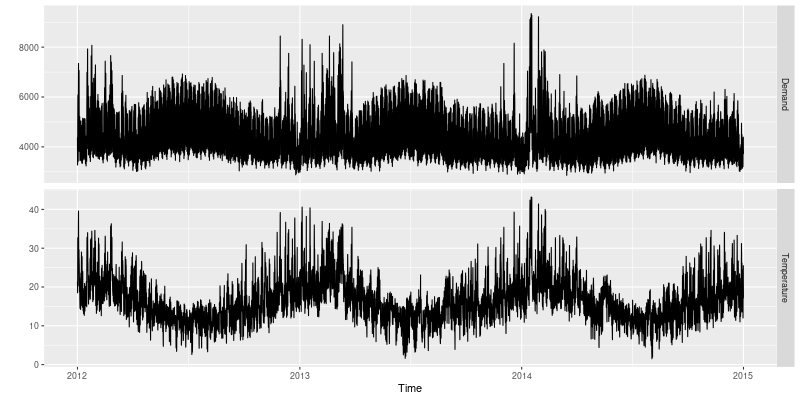

In [297]:
vic_elec = data(tsibbledata).fetch('vic_elec')['vic_elec']
vic_gg = (  ggplot2.ggplot(tidyr.pivot_longer(vic_elec, rl('Demand:Temperature'), names_to = "Series")) +
            ggplot2.aes(x = rl('Time'), y = rl('value')) +
            ggplot2.geom_line() +
            ggplot2.facet_grid(rows=rl('vars(Series)'), scales = "free_y") + 
            ggplot2.labs(y = ""))
display(image_png(vic_gg))
#vic_elec |>
#  pivot_longer(Demand:Temperature, names_to = "Series") |>
#  ggplot(aes(x = Time, y = value)) +
#  geom_line() +
#  facet_grid(rows = vars(Series), scales = "free_y") +
#  labs(y = "")

# A tsibble: 52,608 x 8 [30m] <Australia/Melbourne>
   Time                Demand Temperature Date       Holiday DOW   Working_Day
   <dttm>               <dbl>       <dbl> <date>     <lgl>   <ord> <lgl>      
 1 2012-01-01 00:00:00  4383.        21.4 2012-01-01 TRUE    Sun   FALSE      
 2 2012-01-01 00:30:00  4263.        21.0 2012-01-01 TRUE    Sun   FALSE      
 3 2012-01-01 01:00:00  4049.        20.7 2012-01-01 TRUE    Sun   FALSE      
 4 2012-01-01 01:30:00  3878.        20.6 2012-01-01 TRUE    Sun   FALSE      
 5 2012-01-01 02:00:00  4036.        20.4 2012-01-01 TRUE    Sun   FALSE      
 6 2012-01-01 02:30:00  3866.        20.2 2012-01-01 TRUE    Sun   FALSE      
 7 2012-01-01 03:00:00  3694.        20.1 2012-01-01 TRUE    Sun   FALSE      
 8 2012-01-01 03:30:00  3562.        19.6 2012-01-01 TRUE    Sun   FALSE      
 9 2012-01-01 04:00:00  3433.        19.1 2012-01-01 TRUE    Sun   FALSE      
10 2012-01-01 04:30:00  3359.        19.0 2012-01-01 TRUE    Sun   FALSE      


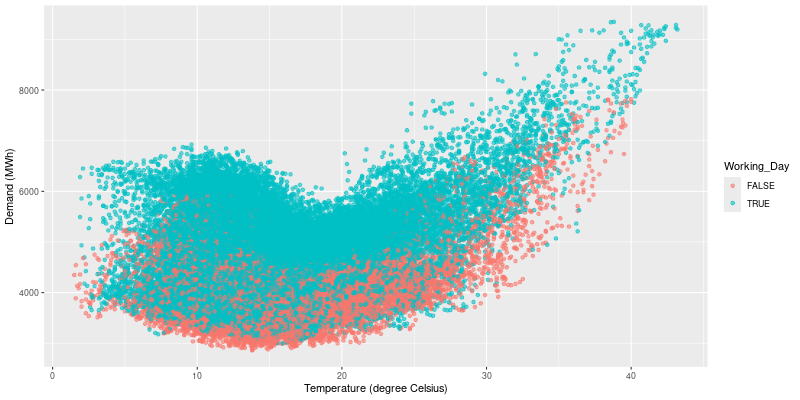

In [298]:
elec = (DataFrame(vic_elec)
        .mutate(
            DOW = rl('wday(Date, label = TRUE)'),
            Working_Day = rl('!Holiday & !(DOW %in% c("Sat", "Sun"))'),
            Cooling = rl('pmax(Temperature, 18)')))
print(elec)
vic_gg2 = ( ggplot2.ggplot(elec) +
            ggplot2.aes(x = rl('Temperature'), y = rl('Demand'), col=rl('Working_Day')) +
            ggplot2.geom_point(alpha = 0.6) +
            ggplot2.labs(x="Temperature (degree Celsius)", y = "Demand (MWh)"))
display(image_png(vic_gg2))
#elec <- vic_elec |>
#  mutate(
#    DOW = wday(Date, label = TRUE),
#    Working_Day = !Holiday & !(DOW %in% c("Sat", "Sun")),
#    Cooling = pmax(Temperature, 18)
#  )
#elec |>
#  ggplot(aes(x=Temperature, y=Demand, col=Working_Day)) +
#  geom_point(alpha = 0.6) +
#  labs(x="Temperature (degrees Celsius)", y="Demand (MWh)")

In [299]:
fit = fabletools.model(
        elec,
        fable.ARIMA(rl('Demand ~ PDQ(0,0,0)+pdq(d=0)+Temperature+Cooling+Working_Day+fourier(period="day",K=10)+fourier(period="week",K=5)+fourier(period="year",K=3)')))
#fit <- elec |>
#  model(
#    ARIMA(Demand ~ PDQ(0, 0, 0) + pdq(d = 0) +
#          Temperature + Cooling + Working_Day +
#          fourier(period = "day", K = 10) +
#          fourier(period = "week", K = 5) +
#          fourier(period = "year", K = 3))
#  )
print(fabletools.report(fit))

Series: Demand 
Model: LM w/ ARIMA(1,0,5) errors 

Coefficients:
         ar1     ma1     ma2     ma3     ma4     ma5  Temperature  Cooling
      0.9258  0.6653  0.3209  0.3094  0.2354  0.0114      -9.0508  19.6214
s.e.  0.0021  0.0051  0.0064  0.0067  0.0059  0.0047       0.8467   1.1120
      Working_DayTRUE  fourier(period = "day", K = 10)C1_48
               0.4319                              235.2615
s.e.           3.4543                                7.9027
      fourier(period = "day", K = 10)S1_48
                                  708.8534
s.e.                                8.0945
      fourier(period = "day", K = 10)C2_48
                                  221.4974
s.e.                                4.2041
      fourier(period = "day", K = 10)S2_48
                                 -243.5861
s.e.                                4.2168
      fourier(period = "day", K = 10)C3_48
                                   57.2103
s.e.                                2.6533
      fourier(

# A tsibble: 96 x 6 [30m] <Australia/Melbourne>
   Time                Temperature Date       DOW   Working_Day Cooling
   <dttm>                    <dbl> <date>     <ord> <lgl>         <dbl>
 1 2015-01-01 00:00:00        15.5 2015-01-01 Thu   FALSE            18
 2 2015-01-01 00:30:00        14.9 2015-01-01 Thu   FALSE            18
 3 2015-01-01 01:00:00        14.8 2015-01-01 Thu   FALSE            18
 4 2015-01-01 01:30:00        14.4 2015-01-01 Thu   FALSE            18
 5 2015-01-01 02:00:00        14   2015-01-01 Thu   FALSE            18
 6 2015-01-01 02:30:00        14.5 2015-01-01 Thu   FALSE            18
 7 2015-01-01 03:00:00        14.2 2015-01-01 Thu   FALSE            18
 8 2015-01-01 03:30:00        14.1 2015-01-01 Thu   FALSE            18
 9 2015-01-01 04:00:00        13.9 2015-01-01 Thu   FALSE            18
10 2015-01-01 04:30:00        14.2 2015-01-01 Thu   FALSE            18
# ℹ 86 more rows
# ℹ Use `print(n = ...)` to see more rows



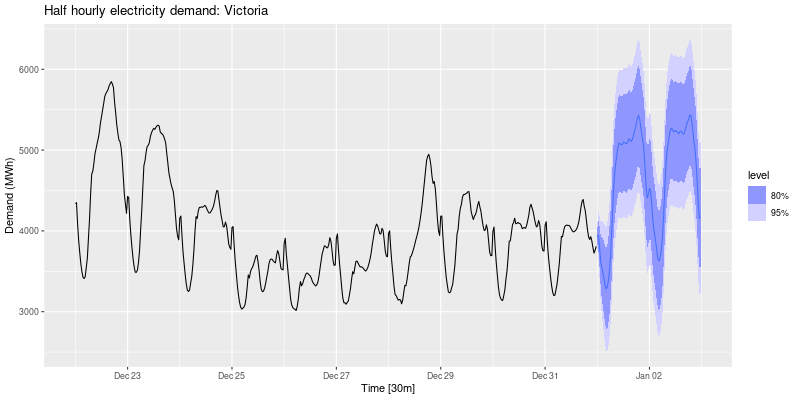

In [300]:
with ro.local_context() as lc:
    lc['elec'] = elec
    elec_newdata = (DataFrame(tsibble.new_data(elec, 2 * 48))
                    .mutate(
                        Temperature = rl('tail(elec$Temperature, 2 * 48)'),
                        Date = rl('lubridate::as_date(Time)'),
                        DOW = rl('wday(Date, label = TRUE)'),
                        Working_Day = rl('(Date != "2015-01-01") & !(DOW %in% c("Sat", "Sun"))'),
                        Cooling = rl('pmax(Temperature, 18)')
                    ))
print(elec_newdata)
fc = fabletools.forecast_mdl_df(fit, new_data = elec_newdata)
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['elec'] = elec
    rcode = ('''
        fc |>
          autoplot(elec |> tail(10 * 48)) +
          labs(title="Half hourly electricity demand: Victoria",
               y = "Demand (MWh)", x = "Time [30m]")
        ''')
    display(image_png(ro.r(rcode)))
#elec_newdata <- new_data(elec, 2*48) |>
#  mutate(
#    Temperature = tail(elec$Temperature, 2 * 48),
#    Date = lubridate::as_date(Time),
#    DOW = wday(Date, label = TRUE),
#    Working_Day = (Date != "2015-01-01") &
#                   !(DOW %in% c("Sat", "Sun")),
#    Cooling = pmax(Temperature, 18)
#  )
#fc <- fit |>
#  forecast(new_data = elec_newdata)

#fc |>
#  autoplot(elec |> tail(10 * 48)) +
#  labs(title="Half hourly electricity demand: Victoria",
#       y = "Demand (MWh)", x = "Time [30m]")

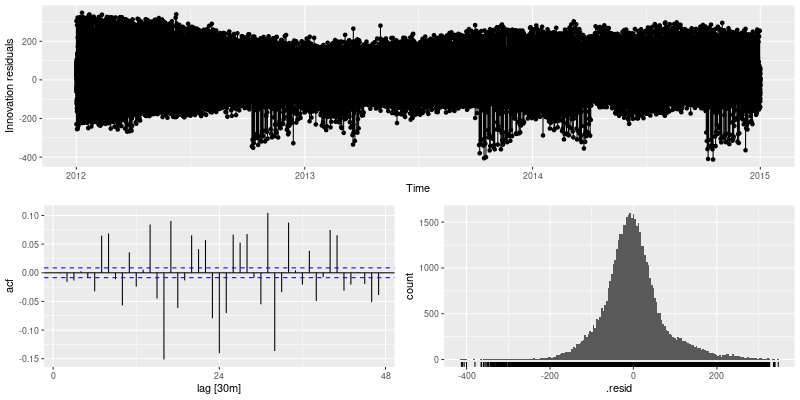

In [301]:
display(image_png(feasts.gg_tsresiduals(fit)))
#fit |> gg_tsresiduals()

## 12.2 Prophet model

In [304]:
f_prophet = importr('fable.prophet')
aus_production = data(tsibbledata).fetch('aus_production')['aus_production']
cement = (DataFrame(aus_production)
          .filter(rl('year(Quarter) >= 1988')))
train = (DataFrame(cement)
         .filter(rl('year(Quarter) <= 2007')))
fit = fabletools.model(
        train,
        arima = fable.ARIMA(rl('Cement')),
        ets = fable.ETS(rl('Cement')),
        prophet = f_prophet.prophet(rl('Cement ~ season(period = 4, order = 2, type = "multiplicative")')))
print(DataFrame(fabletools.glance_mdl_df(fit)).select(rl('.model:BIC')))
#library(fable.prophet)
#cement <- aus_production |>
#  filter(year(Quarter) >= 1988)
#train <- cement |>
#  filter(year(Quarter) <= 2007)
#fit <- train |>
#  model(
#    arima = ARIMA(Cement),
#    ets = ETS(Cement),
#    prophet = prophet(Cement ~ season(period = 4, order = 2,
#                                    type = "multiplicative"))
#  )

# A tibble: 3 × 6
  .model       sigma2 log_lik   AIC  AICc   BIC
  <chr>         <dbl>   <dbl> <dbl> <dbl> <dbl>
1 arima   11456.        -464.  941.  943.  957.
2 ets         0.00341   -545. 1104. 1106. 1121.
3 prophet    NA           NA    NA    NA    NA 



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



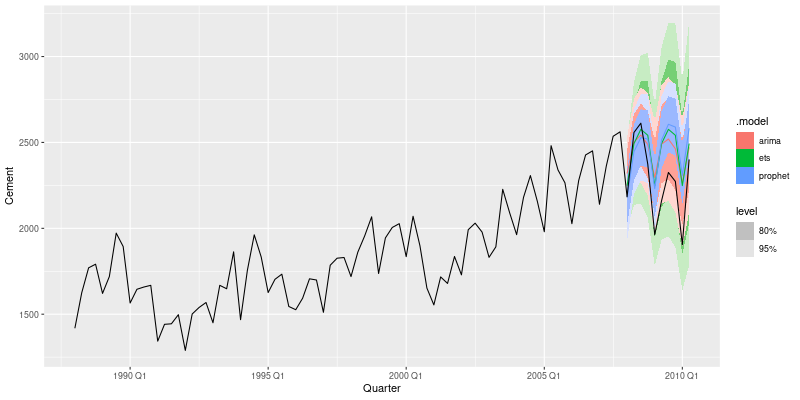

In [305]:
fc = fabletools.forecast_mdl_df(fit, h = "2 years 6 months")
display(image_png(rggplot2.autoplot(fc, cement)))
#fc <- fit |> forecast(h = "2 years 6 months")
#fc |> autoplot(cement)

In [306]:
print(fabletools.accuracy_fbl_ts(fc, cement))
#fc |> accuracy(cement)

# A tibble: 3 × 10
  .model  .type    ME  RMSE   MAE   MPE  MAPE  MASE RMSSE  ACF1
  <chr>   <chr> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl> <dbl>
1 arima   Test  -161.  216.  186. -7.71  8.68  1.27  1.26 0.387
2 ets     Test  -171.  222.  191. -8.07  8.85  1.30  1.29 0.579
3 prophet Test  -176.  248.  215. -8.34  9.87  1.47  1.44 0.700



Series: Demand 
Model: prophet 

A model specific report is not available for this model class.

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A mable: 1 x 1
  `<environment>`
          <model>
1       <prophet>



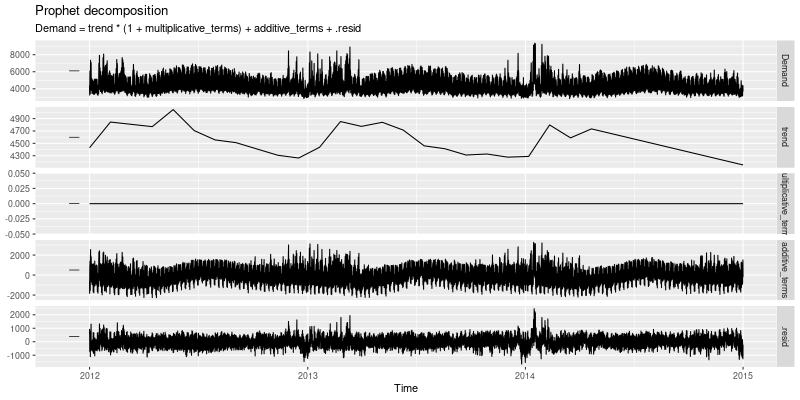

In [307]:
f_prophet = importr('fable.prophet')
fit = fabletools.model(
        elec,
        f_prophet.prophet(rl('Demand ~ Temperature+Cooling+Working_Day+season(period="day",order=10)+season(period="week",order=5)+season(period="year",order=3)')))
print(fabletools.report(fit))
display(image_png(rggplot2.autoplot(fabletools.components_mdl_df(fit))))
#fit <- elec |>
#  model(
#    prophet(Demand ~ Temperature + Cooling + Working_Day +
#            season(period = "day", order = 10) +
#            season(period = "week", order = 5) +
#            season(period = "year", order = 3))
#  )
#fit |>
#  components() |>
#  autoplot()

# A tibble: 1 × 3
  .model        sigma changepoints     
  <chr>         <dbl> <list>           
1 <environment>  354. <tibble [25 × 2]>



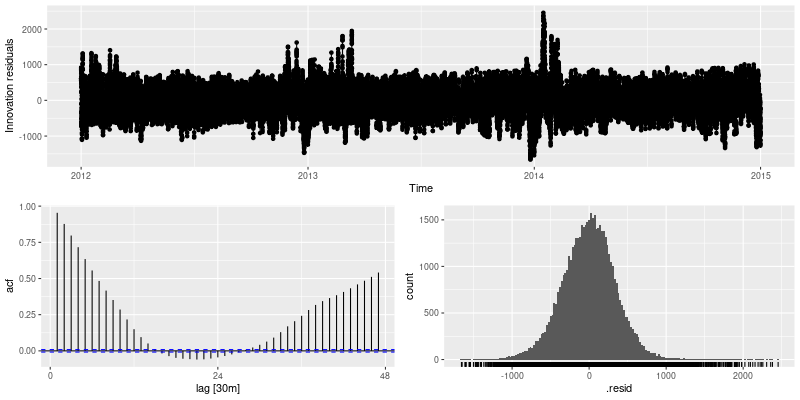

In [308]:
print(DataFrame(fabletools.glance_mdl_df(fit)))
display(image_png(feasts.gg_tsresiduals(fit)))
#fit |> gg_tsresiduals()

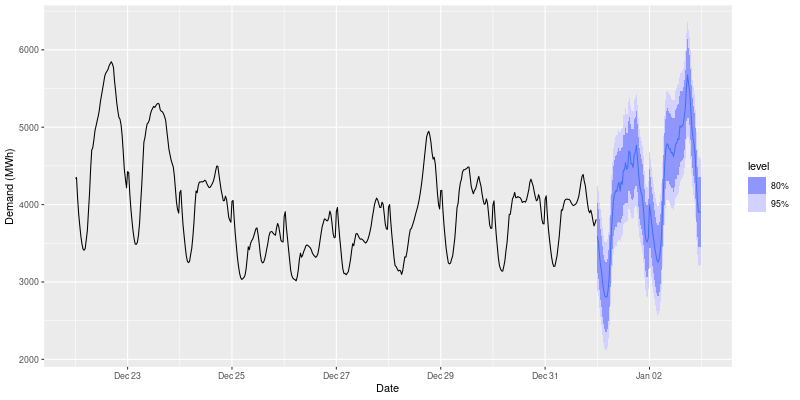

In [309]:
fc = fabletools.forecast_mdl_df(fit, new_data = elec_newdata)
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['elec'] = elec
    rcode = ('''
        fc |>
          autoplot(elec |> tail(10 * 48)) +
          labs(x = "Date", y = "Demand (MWh)")
        ''')
    display(image_png(ro.r(rcode)))
#fc <- fit |>
#  forecast(new_data = elec_newdata)

#fc |>
#  autoplot(elec |> tail(10 * 48)) +
#  labs(x = "Date", y = "Demand (MWh)")

## 12.3 Vector autoregressions

In [310]:
us_change = data(fpp3).fetch('us_change')['us_change']
fit = fabletools.model(
        us_change,
        aicc = fable.VAR(rl('vars(Consumption, Income)')),
        bic = fable.VAR(rl('vars(Consumption, Income)'), ic = "bic"))
print(fit)
#fit <- us_change |>
#  model(
#    aicc = VAR(vars(Consumption, Income)),
#    bic = VAR(vars(Consumption, Income), ic = "bic")
#  )
#fit

# A mable: 1 x 2
              aicc              bic
           <model>          <model>
1 <VAR(5) w/ mean> <VAR(1) w/ mean>



In [311]:
print(fabletools.glance_mdl_df(fit))

# A tibble: 2 × 6
  .model sigma2        log_lik   AIC  AICc   BIC
  <chr>  <list>          <dbl> <dbl> <dbl> <dbl>
1 aicc   <dbl [2 × 2]>   -373.  798.  806.  883.
2 bic    <dbl [2 × 2]>   -408.  836.  837.  869.



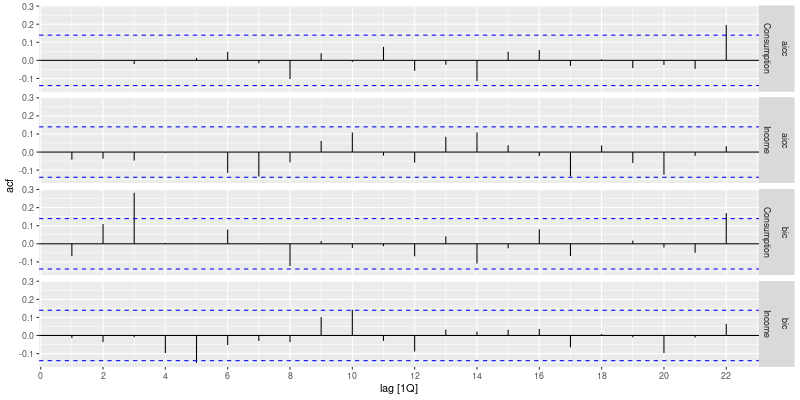

In [312]:
display(image_png(rggplot2.autoplot(feasts.ACF(fabletools.augment_mdl_df(fit), rl('.innov')))))
#fit |>
#  augment() |>
#  ACF(.innov) |>
#  autoplot()

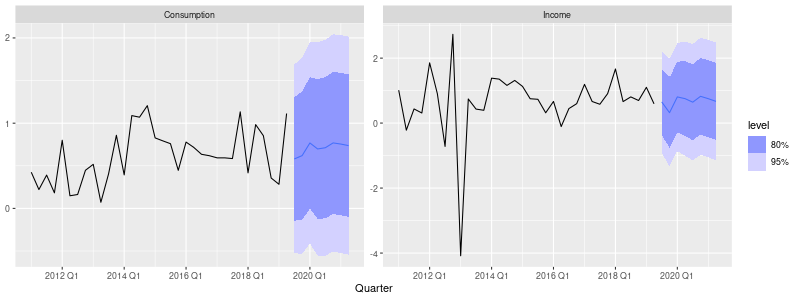

In [313]:
display(image_png(rggplot2.autoplot(
                    fabletools.forecast_mdl_df(
                        DataFrame(fit).select(rl('aicc'))),
                    DataFrame(us_change).filter(rl('year(Quarter) > 2010'))), height=300))
#fit |>
#  select(aicc) |>
#  forecast() |>
#  autoplot(us_change |> filter(year(Quarter) > 2010))

## 12.4 Neural network models

# A tsibble: 289 x 2 [1Y]
   index value
   <dbl> <dbl>
 1  1700     5
 2  1701    11
 3  1702    16
 4  1703    23
 5  1704    36
 6  1705    58
 7  1706    29
 8  1707    20
 9  1708    10
10  1709     8
# ℹ 279 more rows
# ℹ Use `print(n = ...)` to see more rows

Series: value 
Model: NNAR(9,5) 
Transformation: sqrt(value) 

Average of 20 networks, each of which is
a 9-5-1 network with 56 weights
options were - linear output units 

sigma^2 estimated as 0.495
# A mable: 1 x 1
  `<environment>`
          <model>
1     <NNAR(9,5)>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



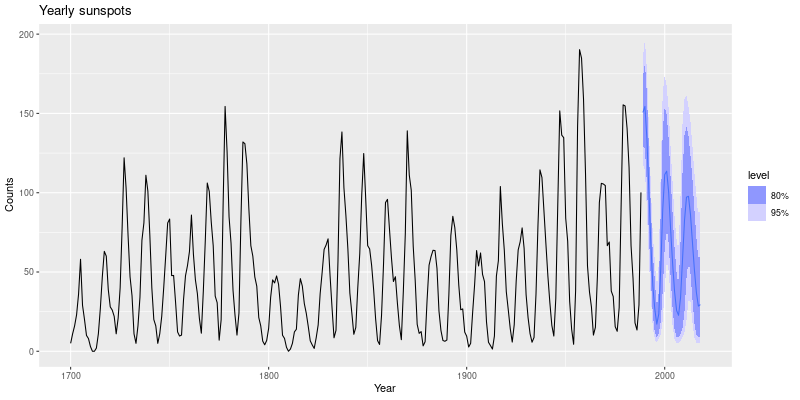

In [314]:
datasets = importr('datasets')
sunspots = tsibble.as_tsibble(data(datasets).fetch('sunspot.year')['sunspot.year'])
print(sunspots)
fit = fabletools.model(
        sunspots,
        fable.NNETAR(rl('sqrt(value)')))
print(fabletools.report(fit))
fc = fabletools.forecast_mdl_df(fit, h = 30)
with ro.local_context() as lc:
    lc['fc'] = fc
    lc['sunspots'] = sunspots
    rcode = ('''
        fc |>
          autoplot(sunspots) +
          labs(x = "Year", y = "Counts", title = "Yearly sunspots")
        ''')
    display(image_png(ro.r(rcode)))
#sunspots <- sunspot.year |> as_tsibble()
#fit <- sunspots |>
#  model(NNETAR(sqrt(value)))
#fit |>
#  forecast(h = 30) |>
#  autoplot(sunspots) +
#  labs(x = "Year", y = "Counts", title = "Yearly sunspots")

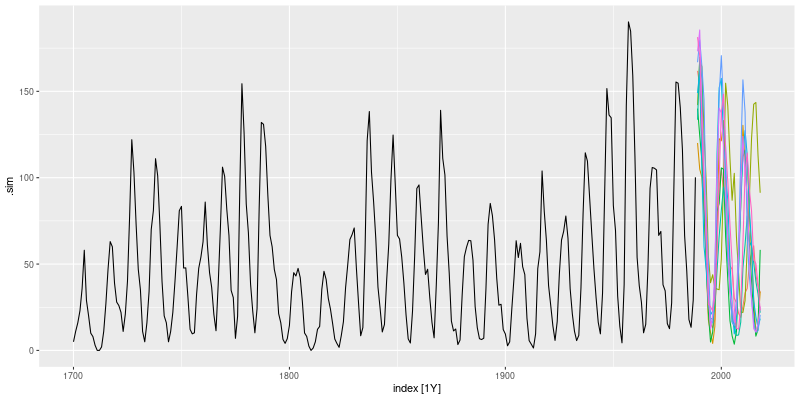

In [315]:
fit_gen = fabletools.generate_mdl_df(fit, times = 9, h = 30)
with ro.local_context() as lc:
    lc['fit_gen'] = fit_gen
    lc['sunspots'] = sunspots
    rcode = ('''
        fit_gen |>
          autoplot(.sim) +
          autolayer(sunspots, value) +
          theme(legend.position = "none")
        ''')
    display(image_png(ro.r(rcode)))            
#fit |>
#  generate(times = 9, h = 30) |>
#  autoplot(.sim) +
#  autolayer(sunspots, value) +
#  theme(legend.position = "none")

## 12.5 Bootstrapping and bagging

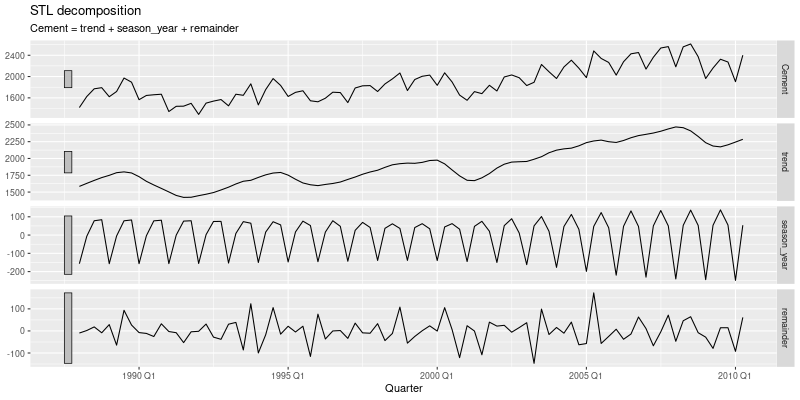

In [316]:
aus_production = data(tsibbledata).fetch('aus_production')['aus_production']
cement = (DataFrame(aus_production)
          .filter(rl('year(Quarter) >= 1988'))
          .select(rl('Quarter'), rl('Cement')))
cement_stl = fabletools.model(
                cement,
                stl = feasts.STL(rl('Cement')))
with r_inline_plot(width=800, height=800, dpi=100):
    display(image_png(rggplot2.autoplot(fabletools.components_mdl_df(cement_stl))))
#cement <- aus_production |>
#  filter(year(Quarter) >= 1988) |>
#  select(Quarter, Cement)
#cement_stl <- cement |>
#  model(stl = STL(Cement))
#cement_stl |>
#  components() |>
#  autoplot()

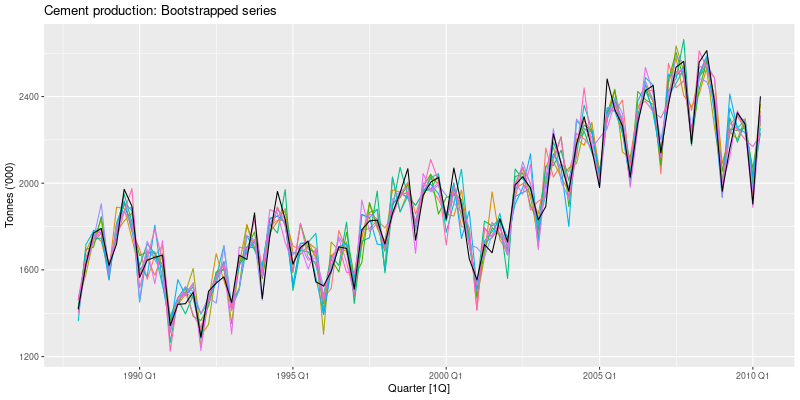

In [317]:
cement_gen = fabletools.generate_mdl_df(cement_stl, new_data = cement, times = 10,
                                        bootstrap_block_size = 8)
with ro.local_context() as lc:
    lc['cement_gen'] = cement_gen
    lc['cement'] = cement
    rcode = ('''
        cement_gen |>
          autoplot(.sim) +
          autolayer(cement, Cement) +
          guides(colour = "none") +
          labs(title = "Cement production: Bootstrapped series",
               y="Tonnes ('000)")
        ''')
    display(image_png(ro.r(rcode)))  
#cement_stl |>
#  generate(new_data = cement, times = 10,
#           bootstrap_block_size = 8) |>
#  autoplot(.sim) +
#  autolayer(cement, Cement) +
#  guides(colour = "none") +
#  labs(title = "Cement production: Bootstrapped series",
#       y="Tonnes ('000)")

In [318]:
sim = (DataFrame(
        fabletools.generate_mdl_df(
            cement_stl,
            new_data = cement, times = 100,
               bootstrap_block_size = 8))
       .select(rl('-.model'), rl('-Cement')))
print(sim)
#sim <- cement_stl |>
#  generate(new_data = cement, times = 100,
#           bootstrap_block_size = 8) |>
#  select(-.model, -Cement)

# A tsibble: 9,000 x 3 [1Q]
# Key:       .rep [100]
   .rep  Quarter  .sim
   <chr>   <qtr> <dbl>
 1 1     1988 Q1 1536.
 2 1     1988 Q2 1568.
 3 1     1988 Q3 1790.
 4 1     1988 Q4 1713.
 5 1     1989 Q1 1715.
 6 1     1989 Q2 1684.
 7 1     1989 Q3 1861.
 8 1     1989 Q4 1973.
 9 1     1990 Q1 1558.
10 1     1990 Q2 1678.
# ℹ 8,990 more rows
# ℹ Use `print(n = ...)` to see more rows



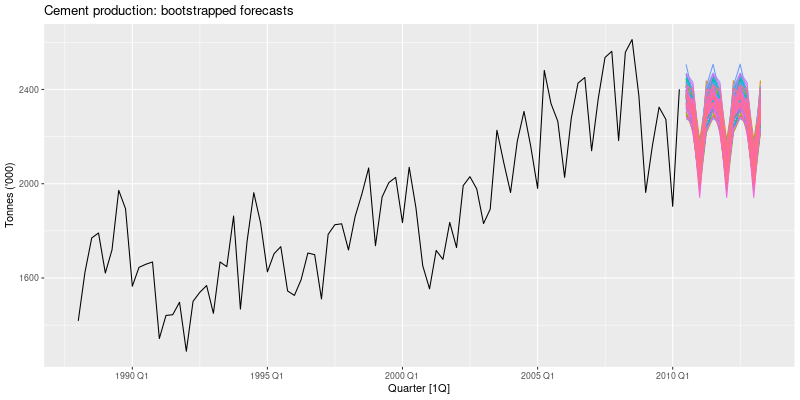

In [319]:
ets_forecasts = fabletools.forecast_mdl_df(
                    fabletools.model(
                        sim,
                        ets = fable.ETS(rl('.sim'))),
                    h = 12)
with ro.local_context() as lc:
    lc['ets_forecasts'] = ets_forecasts
    lc['cement'] = cement
    rcode = ('''
        ets_forecasts |>
          update_tsibble(key = .rep) |>
          autoplot(.mean) +
          autolayer(cement, Cement) +
          guides(colour = "none") +
          labs(title = "Cement production: bootstrapped forecasts",
               y="Tonnes ('000)")
        ''')
    display(image_png(ro.r(rcode))) 
#ets_forecasts <- sim |>
#  model(ets = ETS(.sim)) |>
#  forecast(h = 12)
#ets_forecasts |>
#  update_tsibble(key = .rep) |>
#  autoplot(.mean) +
#  autolayer(cement, Cement) +
#  guides(colour = "none") +
#  labs(title = "Cement production: bootstrapped forecasts",
#       y="Tonnes ('000)")

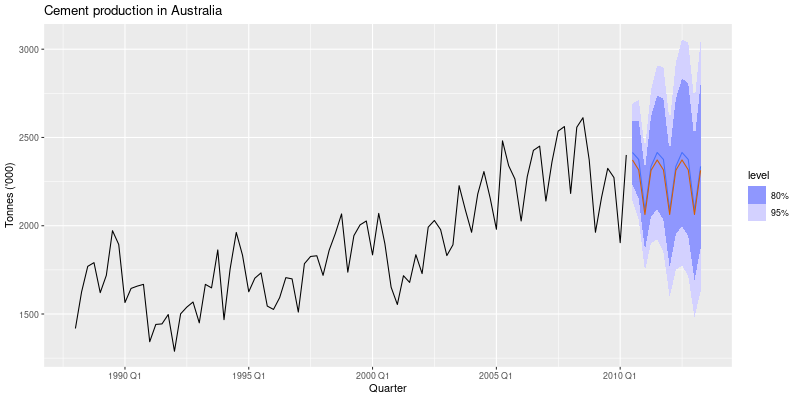

In [320]:
bagged = (DataFrame(ets_forecasts)
          .summarise(bagged_mean = rl('mean(.mean)')))
with ro.local_context() as lc:
    lc['bagged'] = bagged
    lc['cement'] = cement
    rcode = ('''
        cement |>
          model(ets = ETS(Cement)) |>
          forecast(h = 12) |>
          autoplot(cement) +
          autolayer(bagged, bagged_mean, col = "#D55E00") +
          labs(title = "Cement production in Australia",
               y="Tonnes ('000)")
        ''')
    display(image_png(ro.r(rcode))) 
#bagged <- ets_forecasts |>
#  summarise(bagged_mean = mean(.mean))
#cement |>
#  model(ets = ETS(Cement)) |>
#  forecast(h = 12) |>
#  autoplot(cement) +
#  autolayer(bagged, bagged_mean, col = "#D55E00") +
#  labs(title = "Cement production in Australia",
#       y="Tonnes ('000)")

# 13 Some practical forecasting issues
## 13.1 Weekly, daily and sub-daily data

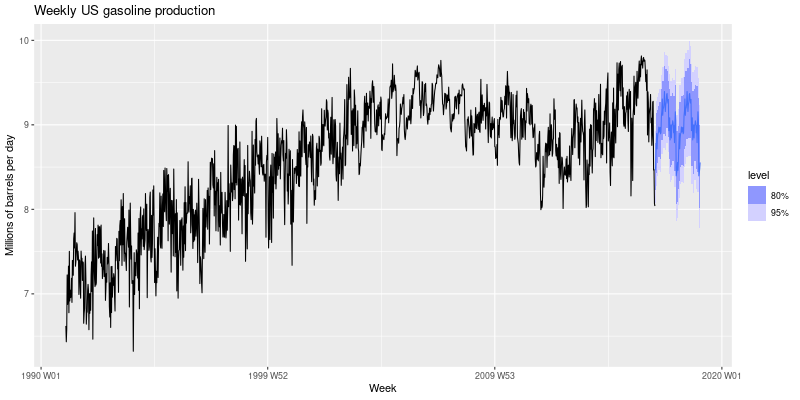

In [321]:
us_gasoline = data(fpp3).fetch('us_gasoline')['us_gasoline']
my_dcmp_spec = fabletools.decomposition_model(
    feasts.STL(rl('Barrels')),
    fable.ETS(rl('season_adjust ~ season("N")')))
gas_fit = fabletools.model(
            us_gasoline,
            stl_ets = my_dcmp_spec)
gas_fc = fabletools.forecast_mdl_df(gas_fit, h = "2 years")
with ro.local_context() as lc:
    lc['fc'] = gas_fc
    lc['us_gasoline'] = us_gasoline
    rcode = ('''
        fc |>
          autoplot(us_gasoline) +
          labs(y = "Millions of barrels per day",
               title = "Weekly US gasoline production")
        ''')
    display(image_png(ro.r(rcode))) 
#my_dcmp_spec <- decomposition_model(
#  STL(Barrels),
#  ETS(season_adjust ~ season("N"))
#)
#us_gasoline |>
#  model(stl_ets = my_dcmp_spec) |>
#  forecast(h = "2 years") |>
#  autoplot(us_gasoline) +
#  labs(y = "Millions of barrels per day",
#       title = "Weekly US gasoline production")

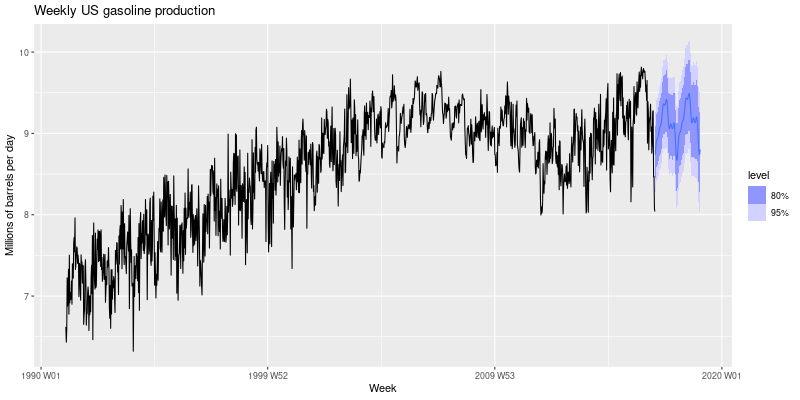

In [322]:
# Alternative approach: dynamic harmonic regression model
gas_dhr = fabletools.model(
            us_gasoline,
            dh = fable.ARIMA(rl('Barrels ~ PDQ(0, 0, 0) + fourier(K = 6)')))
gas_dhr_fc = fabletools.forecast_mdl_df(gas_dhr, h = "2 years")
with ro.local_context() as lc:
    lc['fc'] = gas_dhr_fc
    lc['us_gasoline'] = us_gasoline
    rcode = ('''
        fc |>
          autoplot(us_gasoline) +
          labs(y = "Millions of barrels per day",
               title = "Weekly US gasoline production")
        ''')
    display(image_png(ro.r(rcode)))
#gas_dhr <- us_gasoline |>
#  model(dhr = ARIMA(Barrels ~ PDQ(0, 0, 0) + fourier(K = 6)))
#gas_dhr |>
#  forecast(h = "2 years") |>
#  autoplot(us_gasoline) +
#  labs(y = "Millions of barrels per day",
#       title = "Weekly US gasoline production")

## 13.2 Time series of counts

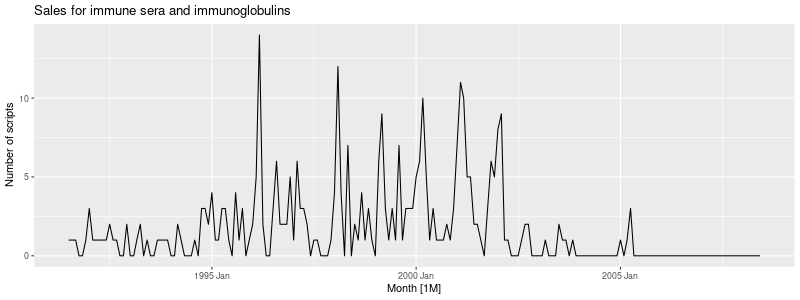

In [323]:
j06 = (DataFrame(data(tsibbledata).fetch('PBS')['PBS'])
       .filter(rl('ATC2 == "J06"'))
       .summarise(Scripts = rl('sum(Scripts)')))
with ro.local_context() as lc:
    lc['j06'] = j06
    rcode = ('''
        j06 |> autoplot(Scripts) +
          labs(y="Number of scripts",
               title = "Sales for immune sera and immunoglobulins")
        ''')
    display(image_png(ro.r(rcode),height=300))
#j06 <- PBS |>
#  filter(ATC2 == "J06") |>
#  summarise(Scripts = sum(Scripts))

#j06 |> autoplot(Scripts) +
#  labs(y="Number of scripts",
#       title = "Sales for immune sera and immunoglobulins")

In [324]:
fit = fabletools.model(
        j06,
        fable.CROSTON(rl('Scripts')))
fc = fabletools.forecast_mdl_df(fit, h = 6)
print(fc)
#j06 |>
#  model(CROSTON(Scripts)) |>
#  forecast(h = 6)

# A fable: 6 x 4 [1M]
# Key:     .model [1]
  .model           Month   Scripts .mean
  <chr>            <mth>    <dist> <dbl>
1 <environment> 2008 Jul 0.9735062 0.974
2 <environment> 2008 Aug 0.9735062 0.974
3 <environment> 2008 Sep 0.9735062 0.974
4 <environment> 2008 Oct 0.9735062 0.974
5 <environment> 2008 Nov 0.9735062 0.974
6 <environment> 2008 Dec 0.9735062 0.974



## 13.3 Ensuring forecasts stay within limits

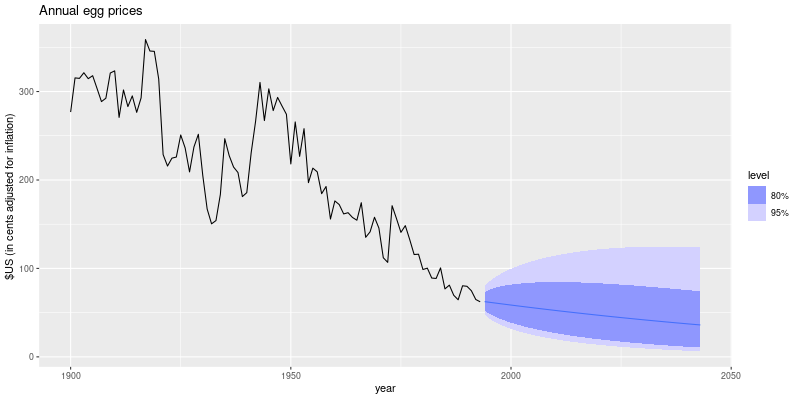

In [325]:
prices = data(fpp3).fetch('prices')['prices']
egg_prices = (DataFrame(prices)
              .filter(rl('!is.na(eggs)')))
fit = fabletools.model(
        egg_prices,
        fable.ETS(rl('log(eggs) ~ trend("A")')))
fc = fabletools.forecast_mdl_df(fit, h = 50)
with ro.local_context() as lc:
    lc['egg_prices'] = egg_prices
    lc['fc'] = fc
    rcode = ('''
        autoplot(fc, egg_prices) +
          labs(title = "Annual egg prices",
               y = "$US (in cents adjusted for inflation) ")
        ''')
    display(image_png(ro.r(rcode)))
#egg_prices <- prices |> filter(!is.na(eggs))
#egg_prices |>
#  model(ETS(log(eggs) ~ trend("A"))) |>
#  forecast(h = 50) |>
#  autoplot(egg_prices) +
#  labs(title = "Annual egg prices",
#       y = "$US (in cents adjusted for inflation) ")

In [326]:
ro.r('''
    scaled_logit <- function(x, lower = 0, upper = 1) {
              log((x - lower) / (upper - x))
            }
    ''')
scaled_logit = ro.globalenv['scaled_logit']
ro.r('''
    inv_scaled_logit <- function(x, lower = 0, upper = 1) {
          (upper - lower) * exp(x) / (1 + exp(x)) + lower
            }
    ''')
inv_scaled_logit = ro.globalenv['inv_scaled_logit']
ro.r('''
    my_scaled_logit <- new_transformation(
                        scaled_logit, inv_scaled_logit)
    ''')
my_scaled_logit = ro.globalenv['my_scaled_logit']
my_scaled_logit(egg_prices.rx('eggs'), lower = 50, upper = 400)

<rpy2.robjects.vectors.DataFrame object at 0x7a1bf1fb8800> [RTYPES.VECSXP]
R classes: ('data.frame',)
[FloatSexpVector]
  eggs: <class 'rpy2.rinterface.FloatSexpVector'>
  <rpy2.rinterface.FloatSexpVector object at 0x7a1bf1fa5cc0> [RTYPES.REALSXP]

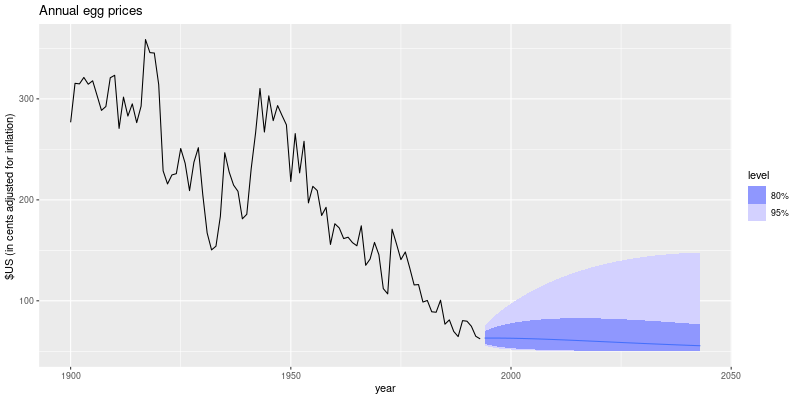

In [327]:
fit = fabletools.model(
        egg_prices,
        fable.ETS(rl('my_scaled_logit(eggs, lower = 50, upper = 400) ~ trend("A")')))
fc = fabletools.forecast_mdl_df(fit, h = 50)
with ro.local_context() as lc:
    lc['egg_prices'] = egg_prices
    lc['fc'] = fc
    rcode = ('''
                autoplot(fc, egg_prices) +
                  labs(title = "Annual egg prices",
                       y = "$US (in cents adjusted for inflation) ")
            ''')
    display(image_png(ro.r(rcode)))
#egg_prices |>
#  model(
#    ETS(my_scaled_logit(eggs, lower = 50, upper = 400)
#          ~ trend("A"))
#  ) |>
#  forecast(h = 50) |>
#  autoplot(egg_prices) +
#  labs(title = "Annual egg prices",
#       y = "$US (in cents adjusted for inflation) ")

## 13.4 Forecast combinations

In [328]:
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
auscafe = (
    DataFrame(aus_retail)
    .filter(rl('stringr::str_detect(Industry, "Takeaway")'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
train = DataFrame(auscafe).filter(rl('year(Month) <= 2013'))
STLF = fabletools.decomposition_model(
        feasts.STL(rl('log(Turnover) ~ season(window = Inf)')),
        fable.ETS(rl('season_adjust ~ season("N")')))
cafe_models = (DataFrame(
                fabletools.model(
                train,
                ets = fable.ETS(rl('Turnover')),
                stlf = STLF,
                arima = fable.ARIMA(rl('log(Turnover)'))))
               .mutate(combination = rl('(ets + stlf + arima) / 3')))
print(cafe_models)
cafe_fc = fabletools.forecast_mdl_df(cafe_models, h = "5 years")
#auscafe <- aus_retail |>
#  filter(stringr::str_detect(Industry, "Takeaway")) |>
#  summarise(Turnover = sum(Turnover))
#train <- auscafe |>
#  filter(year(Month) <= 2013)
#STLF <- decomposition_model(
#  STL(log(Turnover) ~ season(window = Inf)),
#  ETS(season_adjust ~ season("N"))
#)
#cafe_models <- train |>
#  model(
#    ets = ETS(Turnover),
#    stlf = STLF,
#    arima = ARIMA(log(Turnover))
#  ) |>
#  mutate(combination = (ets + stlf + arima) / 3)
#cafe_fc <- cafe_models |>
#  forecast(h = "5 years")

# A mable: 1 x 4
            ets                      stlf                     arima
        <model>                   <model>                   <model>
1 <ETS(M,Ad,M)> <STL decomposition model> <ARIMA(1,1,0)(2,1,2)[12]>
# ℹ 1 more variable: combination <model>



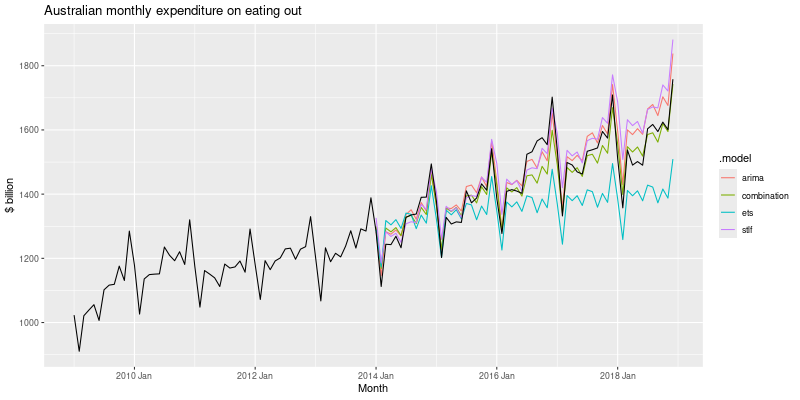

In [329]:
with ro.local_context() as lc:
    lc['auscafe'] = auscafe
    lc['cafe_fc'] = cafe_fc
    rcode = ('''
        autoplot(cafe_fc, auscafe |> filter(year(Month) > 2008),
            level = NULL) +
            labs(y = "$ billion",
                 title = "Australian monthly expenditure on eating out")
        ''')
    display(image_png(ro.r(rcode)))
#cafe_fc |>
#  autoplot(auscafe |> filter(year(Month) > 2008),
#           level = NULL) +
#  labs(y = "$ billion",
#       title = "Australian monthly expenditure on eating out")

In [330]:
print(dplyr.arrange(fabletools.accuracy_fbl_ts(cafe_fc, auscafe), rl('RMSE')))
#cafe_fc |>
#  accuracy(auscafe) |>
#  arrange(RMSE)

# A tibble: 4 × 10
  .model      .type     ME  RMSE   MAE    MPE  MAPE  MASE RMSSE  ACF1
  <chr>       <chr>  <dbl> <dbl> <dbl>  <dbl> <dbl> <dbl> <dbl> <dbl>
1 combination Test    8.09  41.0  31.8  0.401  2.19 0.776 0.790 0.747
2 arima       Test  -25.4   46.2  38.9 -1.77   2.65 0.949 0.890 0.786
3 stlf        Test  -36.9   64.1  51.7 -2.55   3.54 1.26  1.23  0.775
4 ets         Test   86.5  122.  101.   5.51   6.66 2.46  2.35  0.880



In [331]:
print(DataFrame(cafe_fc).filter(rl('Month == min(Month)')))
#cafe_fc |> filter(Month == min(Month))

# A fable: 4 x 4 [1M]
# Key:     .model [4]
  .model         Month
  <chr>          <mth>
1 ets         2014 Jan
2 stlf        2014 Jan
3 arima       2014 Jan
4 combination 2014 Jan
# ℹ 2 more variables: Turnover <dist>, .mean <dbl>



In [332]:
tibble = importr('tibble')
cafe_futures = (fabletools.as_fable(
                (DataFrame(
                    tibble.as_tibble(
                        fabletools.generate_mdl_df(cafe_models, h = "5 years", times = 1000)))
                .group_by(rl('Month'), rl('.model'))
                .summarise(dist = rl('distributional::dist_sample(list(.sim))'))
                .ungroup()),
                index = rl('Month'),
                key = rl('.model'),
                distribution = rl('dist'),
                response = "Turnover"))
print(DataFrame(cafe_futures).filter(rl('Month == min(Month)')))
#cafe_futures <- cafe_models |>
#  # Generate 1000 future sample paths
#  generate(h = "5 years", times = 1000) |>
#  # Compute forecast distributions from future sample paths
#  as_tibble() |>
#  group_by(Month, .model) |>
#  summarise(
#    dist = distributional::dist_sample(list(.sim))
#  ) |>
#  ungroup() |>
  # Create fable object
#  as_fable(index = Month, key = .model,
#           distribution = dist, response = "Turnover")

# Forecast distributions for h=1
#cafe_futures |> filter(Month == min(Month))

`summarise()` has grouped output by 'Month'. You can override using the
`.groups` argument.
# A fable: 4 x 3 [1M]
# Key:     .model [4]
     Month .model              dist
     <mth> <chr>             <dist>
1 2014 Jan arima       sample[1000]
2 2014 Jan combination sample[1000]
3 2014 Jan ets         sample[1000]
4 2014 Jan stlf        sample[1000]



R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: The dimnames of the fable's distribution are missing and have been set to match the response variables. 



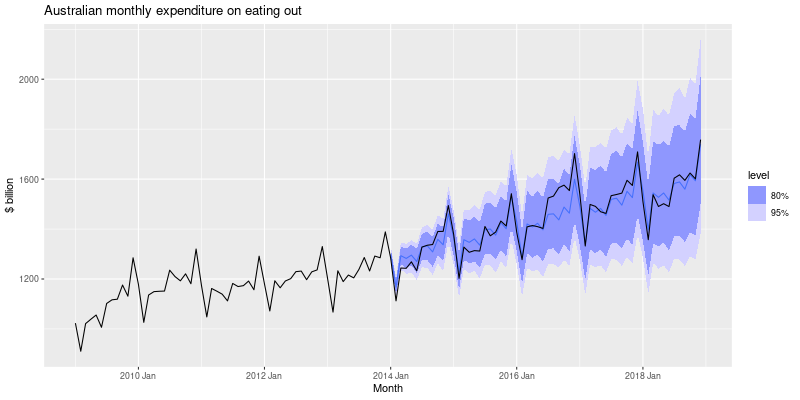

In [333]:
with ro.local_context() as lc:
    lc['auscafe'] = auscafe
    lc['cafe_futures'] = cafe_futures
    rcode = ('''
        cafe_futures |>
          filter(.model == "combination") |>
          autoplot(auscafe |> filter(year(Month) > 2008)) +
          labs(y = "$ billion",
               title = "Australian monthly expenditure on eating out")
        ''')
    display(image_png(ro.r(rcode)))
#cafe_futures |>
#  filter(.model == "combination") |>
#  autoplot(auscafe |> filter(year(Month) > 2008)) +
#  labs(y = "$ billion",
#       title = "Australian monthly expenditure on eating out")

In [334]:
cafe_accuracy = fabletools.accuracy_fbl_ts(
                    cafe_futures,
                    auscafe,
                    measures = rl('interval_accuracy_measures'),
                    level = rl('95')) 
print(dplyr.arrange(cafe_accuracy, rl('winkler')))
#cafe_futures |>
#  accuracy(auscafe, measures = interval_accuracy_measures,
#    level = 95) |>
#  arrange(winkler)

# A tibble: 4 × 5
  .model      .type winkler pinball scaled_pinball
  <chr>       <chr>   <dbl>   <dbl>          <dbl>
1 combination Test     409.    16.8          0.205
2 stlf        Test     601.    30.6          0.373
3 ets         Test     744.    23.5          0.287
4 arima       Test     806.    39.5          0.482



## 13.5 Prediction intervals for aggregates

In [335]:
tibble = importr('tibble')
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
auscafe = (
    DataFrame(aus_retail)
    .filter(rl('stringr::str_detect(Industry, "Takeaway")'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
fit = fabletools.model(auscafe, fable.ETS(rl('Turnover')))
with ro.local_context() as lc:
    lc['fit'] = fit
    rcode = ('''
        futures <- fit |>
          # Simulate 10000 future sample paths, each of length 12
          generate(times = 10000, h = 12) |>
          # Sum the results for each sample path
          as_tibble() |>
          group_by(.rep) |>
          summarise(.sim = sum(.sim)) |>
          # Store as a distribution
          summarise(total = distributional::dist_sample(list(.sim)))
        ''')
    ro.r(rcode)
    futures = lc['futures']
print(futures)            
#fit <- auscafe |>
#  # Fit a model to the data
#  model(ETS(Turnover))
#futures <- fit |>
#  # Simulate 10000 future sample paths, each of length 12
#  generate(times = 10000, h = 12) |>
#  # Sum the results for each sample path
#  as_tibble() |>
#  group_by(.rep) |>
#  summarise(.sim = sum(.sim)) |>
  # Store as a distribution
#  summarise(total = distributional::dist_sample(list(.sim)))

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tibble: 1 × 1
          total
         <dist>
1 sample[10000]



In [336]:
futures_mean = (DataFrame(futures)
                .mutate(
                    mean = rl('mean(total)'),
                    pi80 = rl('hilo(total, 80)'),
                    pi95 = rl('hilo(total, 95)')))
print(futures_mean)
#futures |>
#  mutate(
#    mean = mean(total),
#    pi80 = hilo(total, 80),
#    pi95 = hilo(total, 95)
#  )

# A tibble: 1 × 4
          total   mean                   pi80                   pi95
         <dist>  <dbl>                 <hilo>                 <hilo>
1 sample[10000] 19210. [18323.04, 20106.66]80 [17847.99, 20598.21]95



In [337]:
fc = fabletools.forecast_mdl_df(fit, h = 12)
fc_tibble = DataFrame(tibble.as_tibble(fc)).summarise(total = rl('sum(.mean)'))
print(fc_tibble)
#forecast(fit, h = 12) |>
#  as_tibble() |>
#  summarise(total = sum(.mean))

# A tibble: 1 × 1
   total
   <dbl>
1 19212.



## 13.6 Backcasting

In [338]:
tibble = importr('tibble')
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
auscafe = (
    DataFrame(aus_retail)
    .filter(rl('stringr::str_detect(Industry, "Takeaway")'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
reverse_auscafe = tsibble.update_tsibble(
                    (DataFrame(auscafe)
                     .mutate(reverse_time = rl('rev(row_number())'))),
                    index = rl('reverse_time'))
print(reverse_auscafe)

# A tsibble: 441 x 3 [1]
      Month Turnover reverse_time
      <mth>    <dbl>        <int>
 1 2018 Dec    1758             1
 2 2018 Nov    1601             2
 3 2018 Oct    1624.            3
 4 2018 Sep    1595.            4
 5 2018 Aug    1617.            5
 6 2018 Jul    1604.            6
 7 2018 Jun    1490.            7
 8 2018 May    1502.            8
 9 2018 Apr    1490.            9
10 2018 Mar    1538.           10
# ℹ 431 more rows
# ℹ Use `print(n = ...)` to see more rows



In [339]:
fit = fabletools.model(
        reverse_auscafe,
        ets = fable.ETS(rl('Turnover ~ season(period = 12)')))
with ro.local_context() as lc:
    lc['auscafe'] = auscafe
    bc = (DataFrame(fabletools.forecast_mdl_df(fit, h = 15))
          .mutate(Month = rl('auscafe$Month[1] - (1:15)')))
    backcasts = (fabletools.as_fable(
                    bc,
                    index = rl('Month'),
                    response = "Turnover",
                    distribution = "Turnover"))
print(backcasts)
#backcasts <- auscafe |>
#  mutate(reverse_time = rev(row_number())) |>
#  update_tsibble(index = reverse_time) |>
#  model(ets = ETS(Turnover ~ season(period = 12))) |>
#  forecast(h = 15) |>
#  mutate(Month = auscafe$Month[1] - (1:15)) |>
#  as_fable(index = Month, response = "Turnover",
#    distribution = "Turnover")

# A fable: 15 x 5 [1M]
# Key:     .model [1]
   .model reverse_time
   <chr>         <dbl>
 1 ets             456
 2 ets             455
 3 ets             454
 4 ets             453
 5 ets             452
 6 ets             451
 7 ets             450
 8 ets             449
 9 ets             448
10 ets             447
11 ets             446
12 ets             445
13 ets             444
14 ets             443
15 ets             442
# ℹ 3 more variables: Turnover <dist>, .mean <dbl>, Month <mth>



R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



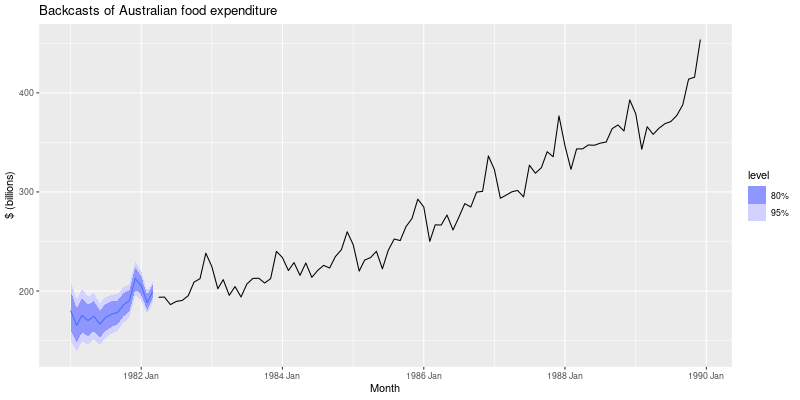

In [340]:
with ro.local_context() as lc:
    lc['auscafe'] = auscafe
    lc['backcasts'] = backcasts
    rcode = ('''
        backcasts |>
          autoplot(auscafe |> filter(year(Month) < 1990)) +
          labs(title = "Backcasts of Australian food expenditure",
               y = "$ (billions)")
        ''')
    display(image_png(ro.r(rcode)))
#backcasts |>
#  autoplot(auscafe |> filter(year(Month) < 1990)) +
#  labs(title = "Backcasts of Australian food expenditure",
#       y = "$ (billions)")

## 13.7 Very long and very short time series

In [341]:
ro.r('''
    m3totsibble <- function(z) {
      bind_rows(
        as_tsibble(z$x) |> mutate(Type = "Training"),
        as_tsibble(z$xx) |> mutate(Type = "Test")
          ) |>
        mutate(
          st = z$st,
          type = z$type,
          period = z$period,
          description = z$description,
          sn = z$sn
        ) |>
        as_tibble()
    }
    ''')
m3totsibble = ro.globalenv['m3totsibble']

In [343]:
Mcomp = importr('Mcomp')
purrr = importr('purrr')
M3 = data(Mcomp).fetch('M3')['M3']
#short = base.subset(data(Mcomp).fetch('M3'), "yearly")
m3_yearly = base.subset(M3, 'yearly')
short = tsibble.as_tsibble(
        (DataFrame(purrr.map_dfr(m3_yearly, m3totsibble))
         .group_by(rl('sn'))
         .mutate(n = rl('max(row_number())'))
         .filter(rl('n <= 20'))
         .ungroup()),
        index = rl('index'),
        key = rl('c(sn, period, st)'))
print(short)

# A tsibble: 3,040 x 9 [1Y]
# Key:       sn, period, st [152]
   index value Type     st    type  period description        sn        n
   <dbl> <dbl> <chr>    <chr> <chr> <chr>  <chr>              <chr> <int>
 1  1975  941. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 2  1976 1085. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 3  1977 1245. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 4  1978 1445. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 5  1979 1683. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 6  1980 2038. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 7  1981 2343. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 8  1982 2602. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
 9  1983 2928. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
10  1984 3104. Training Y1    MICRO YEARLY SALES ( CODE= ABT) N0001    20
# ℹ 3,030 more rows
# ℹ Use `print(n = ...)` to se

In [344]:
short_fit = fabletools.model(
                short,
                arima = fable.ARIMA(rl('value')))
print(fabletools.report(short_fit))
#short_fit <- short |>
#  model(arima = ARIMA(value))

# A tibble: 152 × 11
   sn    period st    .model  sigma2 log_lik   AIC  AICc   BIC ar_roots ma_roots
   <chr> <chr>  <chr> <chr>    <dbl>   <dbl> <dbl> <dbl> <dbl> <list>   <list>  
 1 N0001 YEARLY Y1    arima   2.32e4   -116.  235.  236.  237. <cpl>    <cpl>   
 2 N0002 YEARLY Y2    arima   4.65e5   -159.  323.  325.  326. <cpl>    <cpl>   
 3 N0003 YEARLY Y3    arima   3.33e5   -155.  318.  320.  322. <cpl>    <cpl>   
 4 N0004 YEARLY Y4    arima   4.19e5   -150.  302.  302.  303. <cpl>    <cpl>   
 5 N0005 YEARLY Y5    arima   4.39e5   -158.  321.  323.  324. <cpl>    <cpl>   
 6 N0006 YEARLY Y6    arima   5.72e4   -131.  265.  266.  267. <cpl>    <cpl>   
 7 N0007 YEARLY Y7    arima   2.37e5   -145.  291.  291.  292. <cpl>    <cpl>   
 8 N0008 YEARLY Y8    arima   8.24e5   -156.  316.  317.  318. <cpl>    <cpl>   
 9 N0009 YEARLY Y9    arima   8.88e5   -157.  317.  318.  319. <cpl>    <cpl>   
10 N0010 YEARLY Y10   arima   1.68e6   -172.  350.  352.  353. <cpl>    <cpl>   
# ℹ 142

In [345]:
print(short_fit)

# A mable: 152 x 4
# Key:     sn, period, st [152]
   sn    period st                      arima
   <chr> <chr>  <chr>                 <model>
 1 N0001 YEARLY Y1             <ARIMA(1,2,0)>
 2 N0002 YEARLY Y2     <ARIMA(1,0,0) w/ mean>
 3 N0003 YEARLY Y3     <ARIMA(2,0,0) w/ mean>
 4 N0004 YEARLY Y4             <ARIMA(0,1,0)>
 5 N0005 YEARLY Y5     <ARIMA(1,0,0) w/ mean>
 6 N0006 YEARLY Y6    <ARIMA(0,1,0) w/ drift>
 7 N0007 YEARLY Y7             <ARIMA(0,1,0)>
 8 N0008 YEARLY Y8             <ARIMA(0,1,1)>
 9 N0009 YEARLY Y9    <ARIMA(0,1,0) w/ drift>
10 N0010 YEARLY Y10            <ARIMA(2,0,0)>
# ℹ 142 more rows
# ℹ Use `print(n = ...)` to see more rows



## 13.8 Forecasting on training and test sets

In [346]:
aus_retail = data(tsibbledata).fetch('aus_retail')['aus_retail']
auscafe = (
    DataFrame(aus_retail)
    .filter(rl('stringr::str_detect(Industry, "Takeaway")'))
    .summarise(Turnover = rl('sum(Turnover)'))
)
training = DataFrame(auscafe).filter(rl('year(Month) <= 2013'))
test = DataFrame(auscafe).filter(rl('year(Month) > 2013'))
#training <- auscafe |> filter(year(Month) <= 2013)
#test <- auscafe |> filter(year(Month) > 2013)

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 2: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 3: 
R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages

R[write to console]: 4: 
R[write to console]: In report.mdl_df(list(sn = c("N0001", "N0002", "N0003", "N0004",  :
R[write to console]: 


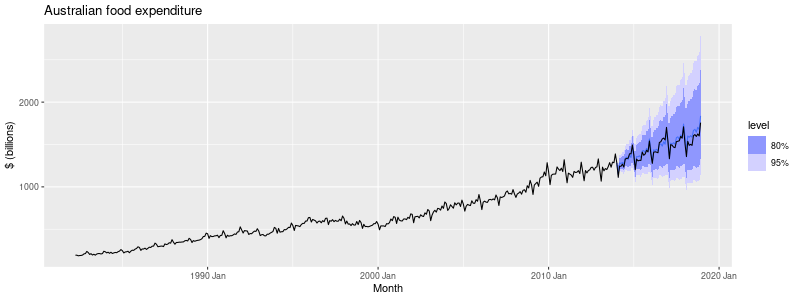

In [347]:
cafe_fit = fabletools.model(
            training,
            fable.ARIMA(rl('log(Turnover)')))
cafe_fc = fabletools.forecast_mdl_df(cafe_fit, h = 60)
with ro.local_context() as lc:
    lc['auscafe'] = auscafe
    lc['cafe_fc'] = cafe_fc
    rcode = ('''
        cafe_fc |>
          autoplot(auscafe) +
          labs(title = "Australian food expenditure",
               y = "$ (billions)")
        ''')
    display(image_png(ro.r(rcode), height=300))
#cafe_fit <- training |>
#  model(ARIMA(log(Turnover)))
#cafe_fit |>
#  forecast(h = 60) |>
#  autoplot(auscafe) +
#  labs(title = "Australian food expenditure",
#       y = "$ (billions)")

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
R[write to console]: 
 
R[write to console]:  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages



# A tsibble: 381 x 3 [1M]
# Key:       .model [1]
   .model           Month .fitted
   <chr>            <mth>   <dbl>
 1 <environment> 1982 Apr      NA
 2 <environment> 1982 May      NA
 3 <environment> 1982 Jun      NA
 4 <environment> 1982 Jul      NA
 5 <environment> 1982 Aug      NA
 6 <environment> 1982 Sep      NA
 7 <environment> 1982 Oct      NA
 8 <environment> 1982 Nov      NA
 9 <environment> 1982 Dec      NA
10 <environment> 1983 Jan      NA
# ℹ 371 more rows
# ℹ Use `print(n = ...)` to see more rows



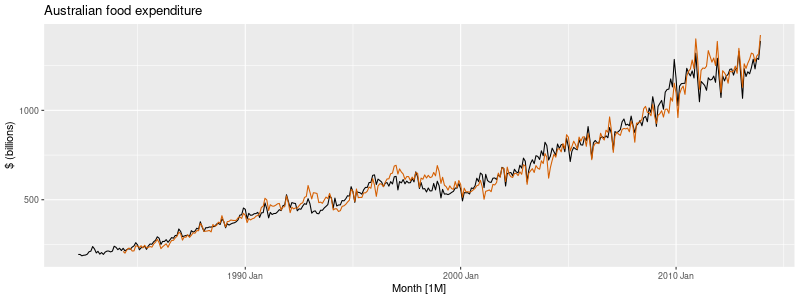

In [348]:
stats = importr('stats')
fits12 = stats.fitted(cafe_fit, h = 12)
print(fits12)
with ro.local_context() as lc:
    lc['training'] = training
    lc['fits12'] = fits12
    rcode = ('''
        training |>
          autoplot(Turnover) +
          autolayer(fits12, .fitted, col = "#D55E00") +
          labs(title = "Australian food expenditure",
               y = "$ (billions)")
        ''')
    display(image_png(ro.r(rcode), height=300))
#fits12 <- fitted(cafe_fit, h = 12)
#training |>
#  autoplot(Turnover) +
#  autolayer(fits12, .fitted, col = "#D55E00") +
#  labs(title = "Australian food expenditure",
#       y = "$ (billions)")

In [349]:
cafe_refit = fabletools.refit_mdl_df(cafe_fit, test)
print(cafe_refit)
print(fabletools.accuracy_mdl_df(cafe_fit))
print(fabletools.accuracy_mdl_df(cafe_refit))
#cafe_fit |>
#  refit(test) |>
#  accuracy()

# A mable: 1 x 1
            `<environment>`
                    <model>
1 <ARIMA(1,1,0)(2,1,2)[12]>

# A tibble: 1 × 10
  .model        .type        ME  RMSE   MAE     MPE  MAPE  MASE RMSSE    ACF1
  <chr>         <chr>     <dbl> <dbl> <dbl>   <dbl> <dbl> <dbl> <dbl>   <dbl>
1 <environment> Training -0.268  16.1  11.9 -0.0379  1.89 0.289 0.310 -0.0908

# A tibble: 1 × 10
  .model        .type       ME  RMSE   MAE    MPE  MAPE  MASE RMSSE    ACF1
  <chr>         <chr>    <dbl> <dbl> <dbl>  <dbl> <dbl> <dbl> <dbl>   <dbl>
1 <environment> Training -2.49  20.5  15.4 -0.169  1.06 0.236 0.259 -0.0502



## 13.9 Dealing with outliers and missing values

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: Removed 25 rows containing missing values or values outside the scale range
(`geom_line()`). 



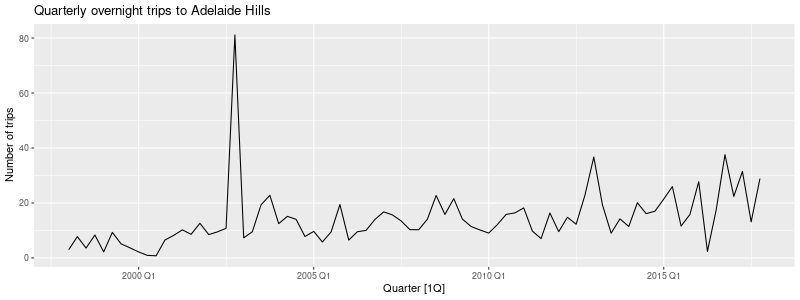

In [350]:
tourism = DataFrame(data(tsibble).fetch('tourism')['tourism']).mutate(
    State=rl('recode(State, `New South Wales`="NSW",`Northern Territory`="NT",`Queensland`="QLD",`South Australia`="SA",`Tasmania`="TAS",`Victoria`="VIC",`Western Australia`="WA")'))
with ro.local_context() as lc:
    lc['tourism'] = tourism
    rcode = ('''
        tourism |>
          filter(
            Region == "Adelaide Hills", Purpose == "Visiting"
          ) |>
          autoplot(Trips) +
          labs(title = "Quarterly overnight trips to Adelaide Hills",
               y = "Number of trips")
        ''')
    display(image_png(ro.r(rcode), height=300))

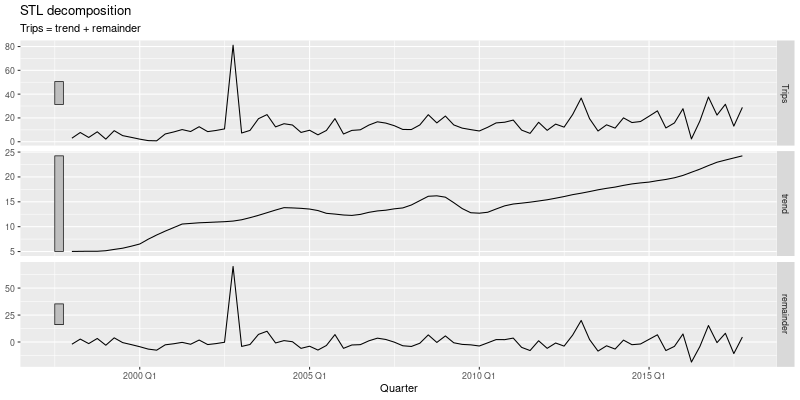

In [351]:
ah_fit = fabletools.model(
            DataFrame(tourism).filter(rl('Region == "Adelaide Hills"'), rl('Purpose == "Visiting"')),
            stl = feasts.STL(rl('Trips ~ season(period = 1)'), robust = True))
ah_decomp = fabletools.components_mdl_df(ah_fit)
with r_inline_plot(width=800, height=800, dpi=100):
    display(image_png(rggplot2.autoplot(ah_decomp)))
#ah_decomp <- tourism |>
#  filter(
#    Region == "Adelaide Hills", Purpose == "Visiting"
#  ) |>
#  # Fit a non-seasonal STL decomposition
#  model(
#    stl = STL(Trips ~ season(period = 1), robust = TRUE)
#  ) |>
#  components()
#ah_decomp |> autoplot()

In [352]:
outliers = (DataFrame(ah_decomp)
            .filter(
                rl('remainder < quantile(remainder, 0.25) - 3*IQR(remainder) | remainder > quantile(remainder, 0.75) + 3*IQR(remainder)'))
           )
print(outliers)            
#outliers <- ah_decomp |>
#  filter(
#    remainder < quantile(remainder, 0.25) - 3*IQR(remainder) |
#    remainder > quantile(remainder, 0.75) + 3*IQR(remainder)
#  )
#outliers

# A dable: 1 x 9 [1Q]
# Key:     Region, State, Purpose, .model [1]
# :        Trips = trend + remainder
  Region        State Purpose .model Quarter Trips trend remainder season_adjust
  <chr>         <chr> <chr>   <chr>    <qtr> <dbl> <dbl>     <dbl>         <dbl>
1 Adelaide Hil… SA    Visiti… stl    2002 Q4  81.1  11.1      70.0          81.1



In [353]:
ah_miss = tsibble.fill_gaps(
            (DataFrame(tourism)
             .filter(rl('Region == "Adelaide Hills"'), rl('Purpose == "Visiting"'))
             .anti_join(outliers)))
print(ah_miss)
#ah_miss <- tourism |>
#  filter(
#    Region == "Adelaide Hills",
#    Purpose == "Visiting"
#  ) |>
#  # Remove outlying observations
#  anti_join(outliers) |>
#  # Replace with missing values
#  fill_gaps()

Joining with `by = join_by(Quarter, Region, State, Purpose, Trips)`
# A tsibble: 80 x 5 [1Q]
# Key:       Region, State, Purpose [1]
   Quarter Region         State Purpose  Trips
     <qtr> <chr>          <chr> <chr>    <dbl>
 1 1998 Q1 Adelaide Hills SA    Visiting 2.99 
 2 1998 Q2 Adelaide Hills SA    Visiting 7.75 
 3 1998 Q3 Adelaide Hills SA    Visiting 3.60 
 4 1998 Q4 Adelaide Hills SA    Visiting 8.35 
 5 1999 Q1 Adelaide Hills SA    Visiting 2.20 
 6 1999 Q2 Adelaide Hills SA    Visiting 9.29 
 7 1999 Q3 Adelaide Hills SA    Visiting 5.14 
 8 1999 Q4 Adelaide Hills SA    Visiting 3.70 
 9 2000 Q1 Adelaide Hills SA    Visiting 2.18 
10 2000 Q2 Adelaide Hills SA    Visiting 0.941
# ℹ 70 more rows
# ℹ Use `print(n = ...)` to see more rows



In [354]:
ah_fill = fabletools.interpolate_mdl_df( 
            fabletools.model(
                ah_miss,
                fable.ARIMA(rl('Trips'))),
            ah_miss)
print(ah_fill)
#ah_fill <- ah_miss |>
#  # Fit ARIMA model to the data containing missing values
#  model(ARIMA(Trips)) |>
#  # Estimate Trips for all periods
#  interpolate(ah_miss)

# A tsibble: 80 x 5 [1Q]
# Key:       Region, State, Purpose [1]
   Region         State Purpose  Quarter Trips
   <chr>          <chr> <chr>      <qtr> <dbl>
 1 Adelaide Hills SA    Visiting 1998 Q1 2.99 
 2 Adelaide Hills SA    Visiting 1998 Q2 7.75 
 3 Adelaide Hills SA    Visiting 1998 Q3 3.60 
 4 Adelaide Hills SA    Visiting 1998 Q4 8.35 
 5 Adelaide Hills SA    Visiting 1999 Q1 2.20 
 6 Adelaide Hills SA    Visiting 1999 Q2 9.29 
 7 Adelaide Hills SA    Visiting 1999 Q3 5.14 
 8 Adelaide Hills SA    Visiting 1999 Q4 3.70 
 9 Adelaide Hills SA    Visiting 2000 Q1 2.18 
10 Adelaide Hills SA    Visiting 2000 Q2 0.941
# ℹ 70 more rows
# ℹ Use `print(n = ...)` to see more rows



In [355]:
result = (DataFrame(ah_fill)
          .right_join(
              DataFrame(outliers).select(rl('-Trips'))))
print(result)
#ah_fill |>
#  # Only show outlying periods
#  right_join(outliers |> select(-Trips))

Joining with `by = join_by(Region, State, Purpose, Quarter)`
# A tsibble: 1 x 9 [?]
# Key:       Region, State, Purpose [1]
  Region        State Purpose Quarter Trips .model trend remainder season_adjust
  <chr>         <chr> <chr>     <qtr> <dbl> <chr>  <dbl>     <dbl>         <dbl>
1 Adelaide Hil… SA    Visiti… 2002 Q4  8.50 stl     11.1      70.0          81.1



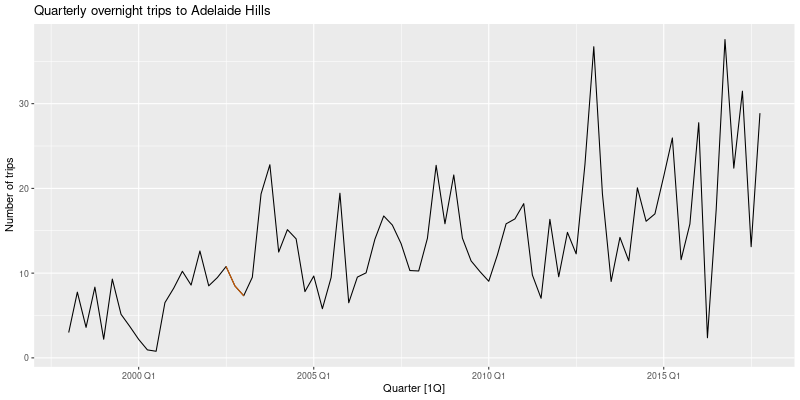

In [356]:
with ro.local_context() as lc:
    lc['ah_fill'] = ah_fill
    rcode = ('''
        ah_fill |>
          autoplot(Trips) +
          autolayer(ah_fill |> filter_index("2002 Q3"~"2003 Q1"),
            Trips, colour="#D55E00") +
          labs(title = "Quarterly overnight trips to Adelaide Hills",
               y = "Number of trips")
        ''')
    display(image_png(ro.r(rcode), height=400))